## kaggle competition 용 데이터 import code

In [2]:
# This Python 3 environment comes with many helpful analytics libraries installed
# It is defined by the kaggle/python Docker image: https://github.com/kaggle/docker-python
# For example, here's several helpful packages to load

import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)

# Input data files are available in the read-only "../input/" directory
# For example, running this (by clicking run or pressing Shift+Enter) will list all files under the input directory

import os
for dirname, _, filenames in os.walk('/kaggle/input'):
    for filename in filenames:
        print(os.path.join(dirname, filename))

# You can write up to 20GB to the current directory (/kaggle/working/) that gets preserved as output when you create a version using "Save & Run All" 
# You can also write temporary files to /kaggle/temp/, but they won't be saved outside of the current session

train_df = pd.read_csv("/kaggle/input/titanic/train.csv")
train_df.head()

test_df = pd.read_csv("/kaggle/input/titanic/test.csv")
test_df.head()

submission_df = pd.read_csv("/kaggle/input/titanic/gender_submission.csv")
submission_df.head()

## titanic 데이터 로드

In [1]:
!ls ../../../sample_data/titanic/

gender_submission.csv
test.csv
train.csv


In [2]:
train_df = pd.read_csv("../../../sample_data/titanic/train.csv")
test_df = pd.read_csv("../../../sample_data/titanic/test.csv")
submission_df = pd.read_csv("../../../sample_data/titanic/gender_submission.csv")

train_df.head()

,PassengerId,Survived,Pclass,Name,Sex,Age,SibSp,Parch,Ticket,Fare,Cabin,Embarked
0,1,0,3,"Braund, Mr. Owen Harris",male,22.0,1,0,A/5 21171,7.2500,NaN,S
1,2,1,1,"Cumings, Mrs. John Bradley (Florence Briggs Th...",female,38.0,1,0,PC 17599,71.2833,C85,C
2,3,1,3,"Heikkinen, Miss. Laina",female,26.0,0,0,STON/O2. 3101282,7.9250,NaN,S
3,4,1,1,"Futrelle, Mrs. Jacques Heath (Lily May Peel)",female,35.0,1,0,113803,53.1000,C123,S
4,5,0,3,"Allen, Mr. William Henry",male,35.0,0,0,373450,8.0500,NaN,S


## Setting

In [2]:
import pandas as pd
import numpy as np
import seaborn as sns

from itertools import product, combinations
from itertools import compress
import os
import pickle
import inspect
import missingno as msno

import matplotlib.pyplot as plt
from matplotlib import gridspec
%matplotlib inline

sns.set_style(
    style='darkgrid', 
    rc={'axes.facecolor': '.9', 'grid.color': '.8', 'axes.edgecolor': '.7'}
)
sns.set_palette(palette='pastel')
sns_c = sns.color_palette(palette='Set1')
sns_c

[(0.8941176470588236, 0.10196078431372549, 0.10980392156862745),
 (0.21568627450980393, 0.49411764705882355, 0.7215686274509804),
 (0.30196078431372547, 0.6862745098039216, 0.2901960784313726),
 (0.596078431372549, 0.3058823529411765, 0.6392156862745098),
 (1.0, 0.4980392156862745, 0.0),
 (1.0, 1.0, 0.2),
 (0.6509803921568628, 0.33725490196078434, 0.1568627450980392),
 (0.9686274509803922, 0.5058823529411764, 0.7490196078431373),
 (0.6, 0.6, 0.6)]

## 1. Feature Engineering - null search
- null 값이 있는 feature는?
- null 값을 어떻게 처리 할까?
   - 평균값, 최빈값, 아니면 다른 방법은 없을까?
- feature의 null 값을 어떤 것으로 채우느냐에 따라서 좋은 데이터 셋으로 만들 수 있다.   

### train data의 기본 정보
- 전체 데이터 갯수보다 작은 feature가 있는 것을 알 수 있다. 
   - Age, Cabin, Embarked

In [3]:
train_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 891 entries, 0 to 890
Data columns (total 12 columns):
 #   Column       Non-Null Count  Dtype  
---  ------       --------------  -----  
 0   PassengerId  891 non-null    int64  
 1   Survived     891 non-null    int64  
 2   Pclass       891 non-null    int64  
 3   Name         891 non-null    object 
 4   Sex          891 non-null    object 
 5   Age          714 non-null    float64
 6   SibSp        891 non-null    int64  
 7   Parch        891 non-null    int64  
 8   Ticket       891 non-null    object 
 9   Fare         891 non-null    float64
 10  Cabin        204 non-null    object 
 11  Embarked     889 non-null    object 
dtypes: float64(2), int64(5), object(5)
memory usage: 83.7+ KB


### null 값의 비율
- Cabin Feature의 null 값의 비율은 77%이며 매우 크다.
    - Cabin null : 77%
    - Age null : 20%
    - Embarked null : 0.2%

In [4]:
train_null = train_df.isnull().sum().to_frame().rename(columns={0: "null"})
train_null["percent"] = (train_null.values / len(train_df)).round(3)
train_null.sort_values("percent", ascending=False)

,null,percent
Cabin,687,0.771
Age,177,0.199
Embarked,2,0.002
PassengerId,0,0.000
Survived,0,0.000
Pclass,0,0.000
Name,0,0.000
Sex,0,0.000
SibSp,0,0.000
Parch,0,0.000


### null 데이터는 어떻게 생겼을까?
- Age, Cabin, Embarked에 null 데이터가 있는 것을 알 수 있다.
- Cabin의 null 데이터가 매우 많다.

In [5]:
import missingno as msno

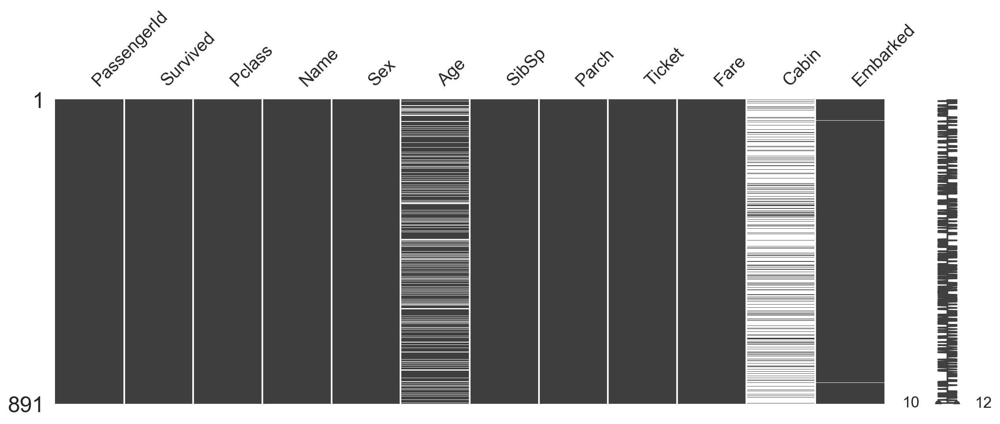

In [6]:
msno.matrix(train_df, figsize=(15, 5)) ;

### test data의 기본정보
- test data와 마찬가지로 전체 갯수보다 작은 feature들이 있다는 것을 알 수 있다.
   - Age, Cabin, Fare

In [7]:
test_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 418 entries, 0 to 417
Data columns (total 11 columns):
 #   Column       Non-Null Count  Dtype  
---  ------       --------------  -----  
 0   PassengerId  418 non-null    int64  
 1   Pclass       418 non-null    int64  
 2   Name         418 non-null    object 
 3   Sex          418 non-null    object 
 4   Age          332 non-null    float64
 5   SibSp        418 non-null    int64  
 6   Parch        418 non-null    int64  
 7   Ticket       418 non-null    object 
 8   Fare         417 non-null    float64
 9   Cabin        91 non-null     object 
 10  Embarked     418 non-null    object 
dtypes: float64(2), int64(4), object(5)
memory usage: 36.0+ KB


### null 값의 비율
- 3개의 feature에 null 값이 있다는 것을 알 수 있다.
    - Cabin null : 78%
    - Age null : 20%
    - Fare null : 0.2%
- Cabin, Age는 train data와 같지만 Fare의 null 값은 test data에만 있다.

In [8]:
test_null = test_df.isnull().sum().to_frame().rename(columns={0: "null"})
test_null["percent"] = (test_null.values / len(test_df)).round(3)
test_null.sort_values("percent", ascending=False)

,null,percent
Cabin,327,0.782
Age,86,0.206
Fare,1,0.002
PassengerId,0,0.000
Pclass,0,0.000
Name,0,0.000
Sex,0,0.000
SibSp,0,0.000
Parch,0,0.000
Ticket,0,0.000


### using missingno

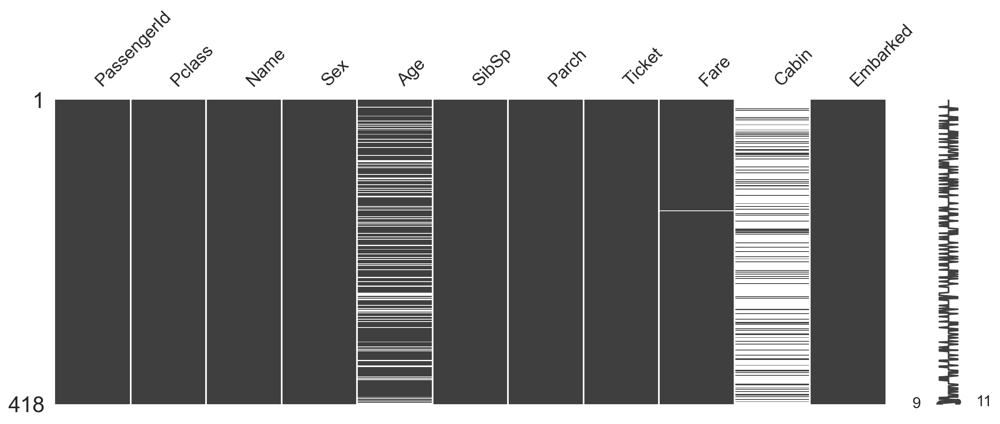

In [9]:
msno.matrix(test_df, figsize=(15, 5)) ;

### data copy
- 전처리를 위한 데이터 copy
    - origin data : train_df, test_df
    - copy data : train_2, test_2

In [21]:
train_2 = train_df.copy()
test_2 = test_df.copy()

train_2.shape, test_2.shape

((891, 12), (418, 11))

### train data null 값 채우기 : Age
- Age Feature의 통계값으로 null 값을 채우는 것이 일반적이 방법이다.

In [22]:
print(f'''
percentage of val of null in test data
--------------------------------------
mean age : {train_2["Age"].mean():.2f}
feaq age : {train_2["Age"].value_counts().index[0]:.2f}
mode age : {train_2["Age"].mode()[0]:.2f}
median age : {train_2["Age"].median():.2f}
--------------------------------------
''')


percentage of val of null in test data
--------------------------------------
mean age : 29.70
feaq age : 24.00
mode age : 24.00
median age : 28.00
--------------------------------------



### null 데이터를 대체할 수 있는 다른 방법은...?
- Age feature의 통계값이 아닌 사전지식으로 null 데이터를 대체할 수 있을까?
   - Age가 누락된 승객은 다른 feature의 어떤 특징 있는지 확인하고 패턴을 생각해 본다.
   - 데이터 분석에서 feature 간에는 상관관계가 없어야 하므로 특정 feature의 값의 패턴을 다른 feature의 특성에서 찾는 것이 좋은 것은 아니다.
   - 하지만 데이터 외 사전지식이 있는 경우 적용할 수 있다.
- Age가 누락된 승객 중에는 다음과 같은 특성을 가진 사람이 상대적으로 더 많다.
   - 부모나 자식과 함께 탑승하지 않은 사람 : Parch=0
   - 티켓 등급이 3인 사람 : Pclass=3
   - 사망한 사람 : Survived=0
   - 남성 : Sex=male
- 위의 4가지 조건을 가진 승객의 평균나이는 어떻게 될까?
   - 29
   - Age feature의 평균값 29와 같다.

In [23]:
# Age가 null인 승객의 다른 feature의 unique 값의 갯수

compare_features = ["Survived", "Pclass", "Sex", "Parch", "Cabin", "Embarked"]
null_age_value_counts = pd.concat(
    [
        pd.DataFrame(
            data=(train_2[train_2["Age"].isna()][f]\
                  .value_counts()\
                  .to_frame()\
                  .reset_index()\
                  .rename(columns={f: "unique"})\
                  .assign(feature=f))
            ) for f in compare_features
    ]
)

null_age_value_counts = null_age_value_counts[["feature", "unique", "count"]].reset_index(drop=True)
null_age_value_counts[:10]

,feature,unique,count
0,Survived,0,125
1,Survived,1,52
2,Pclass,3,136
3,Pclass,1,30
4,Pclass,2,11
5,Sex,male,124
6,Sex,female,53
7,Parch,0,157
8,Parch,2,12
9,Parch,1,8


### mean 통계값과 filtering한 데이터의 mean 값 비교
- Age feature의 mean값과 조건을 filtering한 mean값은 거의 같다.

In [24]:
filter_mean = train_2.query("Sex == 'male' & Survived == 0 & Pclass == 3 & Parch == 0")["Age"].mean()

print(f'''
mean of Age : {train_2["Age"].mean():.3f}
mean of filtering : {filter_mean:.3f}
''')


mean of Age : 29.699
mean of filtering : 29.064



### 어떤 값으로 Age feature의 null 값을 채우는게 좋을까?
- Age feature의 평균값과 다른 feature의 unique 값의 빈도수에 따른 평균값을 비교해보니 거의 유사했다.
   - mean : 29.7, new mean : 29
- 먼저 Age feature의 평균값과 filtering 한 평균값이 유사한 이유는 Age feature의 mean에 가까울 만큼 filtering Age값이 포함되었기 때문인 것으로 보인다. 따라서 filtering 한 Age의 평균값이 본래 Age feature의 통계값보다 더 유용하다고 보기 어렵다. 또한 데이터 분석에서 feature간의 상관관계는 없어야 하므로 Age feature의 null 값은 **mean** 통계값으로 채우는 것이 좋다. 

In [25]:
train_2["Age"] = train_2["Age"].fillna(train_2["Age"].mean().round(0))
train_2["Age"].isnull().sum()

0

### train data null 값 채우기 : Cabin
- 객실의 번호에 해당하는 Cabin feature는 null 값이 전체 데이터의 77%에 해당한다. 데이터 분석에서 유용하지 않으므로 삭제한다.

In [26]:
print(f'percentage of null in Cabin feature : {round(train_2["Cabin"].isnull().sum() / len(train_2), 2) * 100} %')

percentage of null in Cabin feature : 77.0 %


In [27]:
train_2.drop(["Cabin"], axis=1, inplace=True)
train_2.head()

,PassengerId,Survived,Pclass,Name,Sex,Age,SibSp,Parch,Ticket,Fare,Embarked
0,1,0,3,"Braund, Mr. Owen Harris",male,22.0,1,0,A/5 21171,7.2500,S
1,2,1,1,"Cumings, Mrs. John Bradley (Florence Briggs Th...",female,38.0,1,0,PC 17599,71.2833,C
2,3,1,3,"Heikkinen, Miss. Laina",female,26.0,0,0,STON/O2. 3101282,7.9250,S
3,4,1,1,"Futrelle, Mrs. Jacques Heath (Lily May Peel)",female,35.0,1,0,113803,53.1000,S
4,5,0,3,"Allen, Mr. William Henry",male,35.0,0,0,373450,8.0500,S


### train data null값 채우기 : Embarked
- 탑승한 항구의 명칭인 Embarked feature에는 2개의 null 데이터가 존재하며 2가지 방법으로 값을 채울 수 있다.
   - method 1: 통계값에 기반하여 categorical feature이므로 freq값을 채운다.
   - method 2: 사전 지식(데이터 외)을 활용한 검색으로 특정값을 채운다.
- 데이터 분석에서 feature는 서로 독립인 확률변수와 같다. 따라서 feature의 샘플 x가 다른 feature의 특성에 의해 만들어졌다고 할 수 없지만, 데이터 외적인 사전지식이 있다면 적용할 수 있다. 예를들면,
   - 가족 관계인 승객들은 항구(Embarked)가 같다.
   - 티켓 번호가 같은 사람은 항구(Embarked)가 같다.

In [28]:
train_2["Embarked"].describe()

count     889
unique      3
top         S
freq      644
Name: Embarked, dtype: object

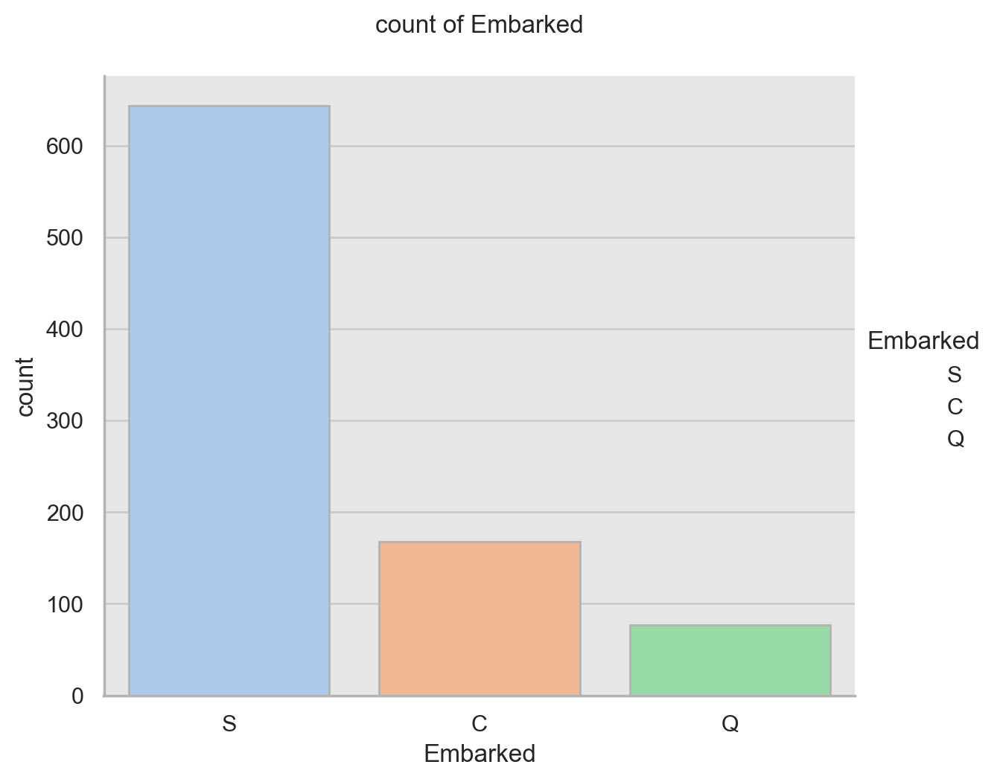

In [29]:
sns.catplot(
    data=train_2,
    x="Embarked",
    palette="pastel",
    edgecolor="0.7",
    height=5,
    aspect=1.2,
    kind="count"
)
plt.title("count of Embarked", y=1.05) ;

### Embarked가 null인 승객 Amelie와 Nelson의 특징
- 부모 자식의 관계가 아닌 것으로 보인다. : Parch=0
- 형제/자매나 배우자의 관계가 아닌 것으로 보인다. : SibSp=0
- 서로 이름과 나이가 다르고 나이는 큰 차이가 난다.
- Ticket 번호와 요금(Fare), 호실(Cabin)이 일치한다.
- 이러한 특징으로 봤을때 두 사람의 항구명칭은 어떻게 유추해 볼 수 있을까?

In [30]:
# Embarked의 null 데이터에 해당하는 승객의 정보

train_2[train_2["Embarked"].isnull()]

,PassengerId,Survived,Pclass,Name,Sex,Age,SibSp,Parch,Ticket,Fare,Embarked
61,62,1,1,"Icard, Miss. Amelie",female,38.0,0,0,113572,80.0,NaN
829,830,1,1,"Stone, Mrs. George Nelson (Martha Evelyn)",female,62.0,0,0,113572,80.0,NaN


### 유사한 조건의 승객들은 대부분 Embarked=S 이다.
- Survive=1, Pclass=1, Parch=0, SibSp=0 에 해당하는 승객들의 Embarked는 S가 가장 많다. **Amelie와 Nelson의 Embarked도 S로 대체하는게 맞을까?**

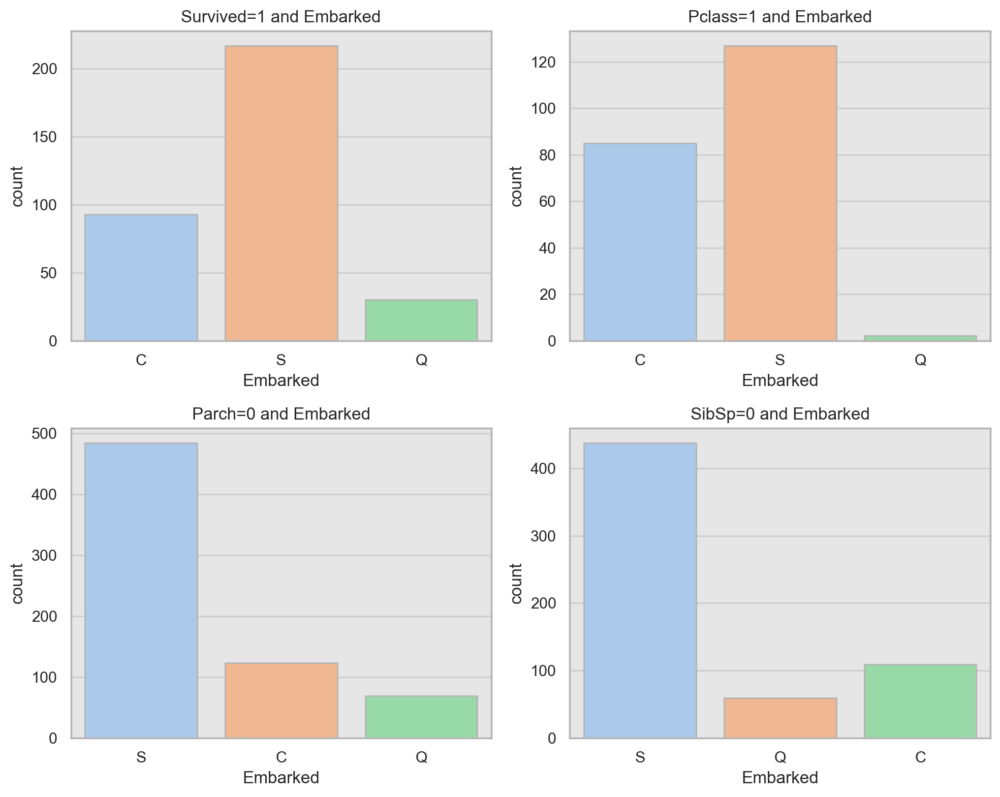

In [32]:
fig, axes = plt.subplots(nrows=2, ncols=2, figsize=(10, 8))
axes = axes.flatten()
for i, ele in enumerate([("Survived", 1), ("Pclass", 1), ("Parch", 0), ("SibSp", 0)]) : 
    ax = axes[i]
    sns.countplot(
        data=train_2[train_2[ele[0]] == ele[1]],
        x="Embarked",
        palette="pastel",
        edgecolor=".7",
        ax=ax
    )
    ax.set(title=f"{ele[0]}={ele[1]} and Embarked")
plt.tight_layout() ; 

### Amelie와 Nelson의 항구(Embarked)는 티켓 요금(Fare)과 관련있을까?
- 직관적으로 Embarked와 Fare는 어떻 관계가 있지 않을까? 에밀리와 넬슨의 티켓값은 80이다. Embarked 별 Fare의 평균값과 유사할까?
   - C : 59.9
   - Q : 13.2
   - S : 27.0
- Embarked feature의 freq값은 S이지만, Embarked가 S인 승객들의 Fare들의 평균은 27.0이다.
   - Embarked=S인 승객의 Fare 분포에서 80.0의 빈도수는 낮다.
   - C항구의 Fare이 평균값이 두 사람의 요금 80.0에 가깝다.
   - 그렇다면 **Amelie/Nelson의 Embarked는 C일까?**

In [33]:
# Emabarked 별 Fare의 평균 값

train_2.groupby("Embarked")[["Fare"]].mean().reset_index()

,Embarked,Fare
0,C,59.954144
1,Q,13.276030
2,S,27.079812


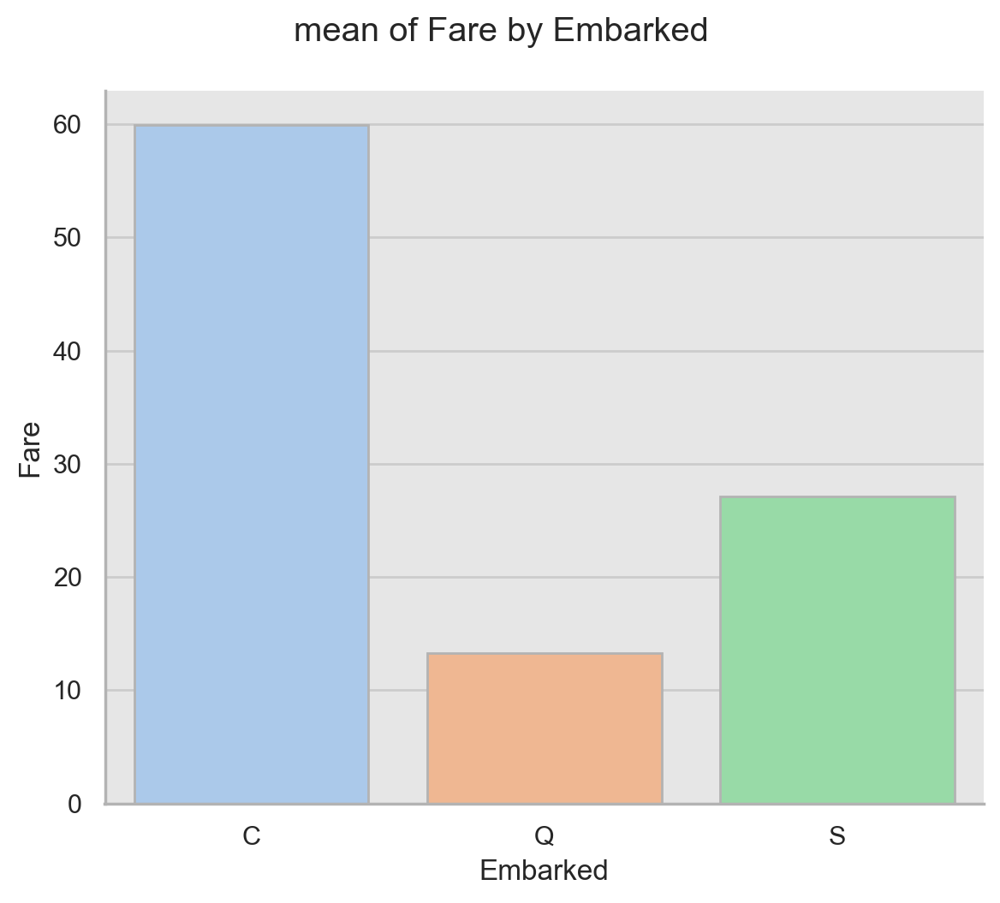

In [36]:
sns.catplot(
    data=train_2.groupby("Embarked")[["Fare"]].mean().reset_index(),
    x="Embarked",
    y="Fare",
    palette="pastel",
    edgecolor=".7",
    height=5,
    aspect=1.2,
    kind="bar"
)
plt.suptitle("mean of Fare by Embarked", y=1.05);

### Amelie와 Nelson 처럼 Ticket 번호가 같은 승객들은 같은 Embarked에서 출발했을까?
- 직관적으로 Ticket 번호가 같은면 혈연지연 등의 관계가 있을 것 같다. Amelie와 Nelson 처럼 Ticket 번호가 중복인 승객들의 Embarked를 조사해본다.

In [37]:
# duplicated Tickets

ameile_nelson_ticket = '113572'
same_tickets = train_2[train_2["Ticket"] != ameile_nelson_ticket]["Ticket"].value_counts().sort_values(ascending=False)
same_tickets = same_tickets[same_tickets > 1]
same_tickets[:10]

Ticket
347082          7
1601            7
CA. 2343        7
3101295         6
CA 2144         6
347088          6
S.O.C. 14879    5
382652          5
4133            4
347077          4
Name: count, dtype: int64

In [38]:
same_tickets_num = same_tickets.index
same_tickets_df = train_2[train_2["Ticket"].isin(list(same_tickets_num))]
same_tickets_df.head()

,PassengerId,Survived,Pclass,Name,Sex,Age,SibSp,Parch,Ticket,Fare,Embarked
3,4,1,1,"Futrelle, Mrs. Jacques Heath (Lily May Peel)",female,35.0,1,0,113803,53.1000,S
7,8,0,3,"Palsson, Master. Gosta Leonard",male,2.0,3,1,349909,21.0750,S
8,9,1,3,"Johnson, Mrs. Oscar W (Elisabeth Vilhelmina Berg)",female,27.0,0,2,347742,11.1333,S
9,10,1,2,"Nasser, Mrs. Nicholas (Adele Achem)",female,14.0,1,0,237736,30.0708,C
10,11,1,3,"Sandstrom, Miss. Marguerite Rut",female,4.0,1,1,PP 9549,16.7000,S


### 티켓이 중복인 승객들은 대부분 같은 항구에서 탑승했다.
- 133개의 중복 티켓 중 131개의 티켓을 가진 승객들은 중복 티켓별로 항구가 같다. 
   - 113798과 PC 17760 두 티켓은 중복이지만 항구가 다르다. 
- **따라서 티켓이 같으면 같은 항구일 가능성이 더 높다는 것을 알 수 있다.**

In [39]:
# 중복 티켓 중 Embarked가 같은 경우와 다른 경우

non_same_embarked_ticket = []
for ticket in same_tickets_num :
    # Embarked의 unique 값의 갯수가 1이 아닌 경우
    if same_tickets_df[same_tickets_df["Ticket"] == ticket]["Embarked"].unique().shape[0] != 1 : 
        non_same_embarked_ticket.append(ticket)
        
print(f'''
duplicated tickets of same Embarked: {len(same_tickets_num)}
duplicated tickets of non same Embarked : {len(non_same_embarked_ticket)}
''')


duplicated tickets of same Embarked: 133
duplicated tickets of non same Embarked : 2



In [40]:
# 중복 티켓 중 Embarked가 다른 승객은 소수이다.

same_tickets_df.query("Ticket in @non_same_embarked_ticket").sort_values("Ticket")

,PassengerId,Survived,Pclass,Name,Sex,Age,SibSp,Parch,Ticket,Fare,Embarked
270,271,0,1,"Cairns, Mr. Alexander",male,30.0,0,0,113798,31.0000,S
842,843,1,1,"Serepeca, Miss. Augusta",female,30.0,0,0,113798,31.0000,C
269,270,1,1,"Bissette, Miss. Amelia",female,35.0,0,0,PC 17760,135.6333,S
325,326,1,1,"Young, Miss. Marie Grice",female,36.0,0,0,PC 17760,135.6333,C
373,374,0,1,"Ringhini, Mr. Sante",male,22.0,0,0,PC 17760,135.6333,C


### 중복인 티켓을 가진 승객들의 경우 대체로 Embarked=S가 많다.

In [41]:
same_tickets_df[~same_tickets_df.duplicated(subset=["Ticket"], keep="first")]["Embarked"].value_counts()

Embarked
S    91
C    35
Q     7
Name: count, dtype: int64

### Ticket이 중복인 승객들은 대체로 혈연,지연 관계로 보여진다.
- **중복 Ticket이 347082**인 승객들은 한 가족이다. 
   - SibSp, Parch, Name, Age, Sex 등을 보면 Pclass=3에 탄 아버지, 어머니와 자녀가 5명인 가족이라는 것을 알 수 있다.
- **중복 Ticket이 W./C. 6608**인 승객들도 한 가족으로 보인다.
   - Name의 성이 같고, SibSp, Parch 등을 보면 Pclass=3에 탄 어머니와 3명의 자녀인 가족이라는 것을 알 수 있다.
- 다른 Pcalss의 승객중 **Ticket이 113760**인 승객도 한 가족으로 보인다.
- **이와 같은 Ticket이 같은 경우 혈연,지연 관계인 경우가 많은 것으로 보인다. 그러나 Ticket이 같다고 혈연지연 관계라고 보기 어려운 케이스도 있다.**

In [42]:
same_tickets_df[same_tickets_df["Ticket"] == '347082']

,PassengerId,Survived,Pclass,Name,Sex,Age,SibSp,Parch,Ticket,Fare,Embarked
13,14,0,3,"Andersson, Mr. Anders Johan",male,39.0,1,5,347082,31.275,S
119,120,0,3,"Andersson, Miss. Ellis Anna Maria",female,2.0,4,2,347082,31.275,S
541,542,0,3,"Andersson, Miss. Ingeborg Constanzia",female,9.0,4,2,347082,31.275,S
542,543,0,3,"Andersson, Miss. Sigrid Elisabeth",female,11.0,4,2,347082,31.275,S
610,611,0,3,"Andersson, Mrs. Anders Johan (Alfrida Konstant...",female,39.0,1,5,347082,31.275,S
813,814,0,3,"Andersson, Miss. Ebba Iris Alfrida",female,6.0,4,2,347082,31.275,S
850,851,0,3,"Andersson, Master. Sigvard Harald Elias",male,4.0,4,2,347082,31.275,S


In [43]:
same_tickets_df[same_tickets_df["Ticket"] == 'W./C. 6608']

,PassengerId,Survived,Pclass,Name,Sex,Age,SibSp,Parch,Ticket,Fare,Embarked
86,87,0,3,"Ford, Mr. William Neal",male,16.0,1,3,W./C. 6608,34.375,S
147,148,0,3,"Ford, Miss. Robina Maggie ""Ruby""",female,9.0,2,2,W./C. 6608,34.375,S
436,437,0,3,"Ford, Miss. Doolina Margaret ""Daisy""",female,21.0,2,2,W./C. 6608,34.375,S
736,737,0,3,"Ford, Mrs. Edward (Margaret Ann Watson)",female,48.0,1,3,W./C. 6608,34.375,S


In [44]:
same_tickets_df[same_tickets_df["Ticket"] == '113760']

,PassengerId,Survived,Pclass,Name,Sex,Age,SibSp,Parch,Ticket,Fare,Embarked
390,391,1,1,"Carter, Mr. William Ernest",male,36.0,1,2,113760,120.0,S
435,436,1,1,"Carter, Miss. Lucile Polk",female,14.0,1,2,113760,120.0,S
763,764,1,1,"Carter, Mrs. William Ernest (Lucile Polk)",female,36.0,1,2,113760,120.0,S
802,803,1,1,"Carter, Master. William Thornton II",male,11.0,1,2,113760,120.0,S


### 어떤 값으로 Embarked를 채우는 것이 좋을까?
- Embarked가 null인 승객은 Amelie와 Nelson 두 명이다. 이 두사람의 null을 대체하기 위해 두가지 방법으로 접근할 수 있다. 
   - method 1 : Embarked feature의 통계값
   - method 2 : 데이터 외적 어떤 사전지식
- method 1에 따르면 **Embarked=S**가 맞다. 또한 method 2의 가능성을 조사하기 위해 데이터를 사전지식으로 그 특성들을 해석해 보았다.
   - Amelie, Nelson과 유사한 특징을 갖는 다른 승객들의 Embarked
      - feature의 조건에 맞는 Embarked의 최빈값은 대체로 S가 많았다.
   - 두 사람의 Ticket(113572)과 Fare(80.0)가 같다는 점을 토대로 비슷한 경우의 Embarked
      - 각 Embarked 별 Fare의 평균값을 조회하면 Embarked=C의 요금이 80.0과 가장 가까웠다.
   - 티켓이 중복인 사람들의 Embarked
      - 두 사람 처럼 Ticket이 중복인 사람들은 **Embarked가 같고** 이고, 대체로 **Embarked=S**인 경우가 많고, 사회적관계에 있는 것으로 알 수 있었다.
- 이러한 조사 결과를 토대로 Ticket이 같은 두 사람은 **같은 Embarked**이면서, **Embarked=S** 가 적당하다고 볼 수 있다.        

In [45]:
train_2["Embarked"] = train_2["Embarked"].fillna("S")
train_2["Embarked"].isna().sum()

0

### test 데이터의 null 전처리
- test 데이터에서 null 있는 feature는 Age, Cabin, Fare 이다. train 데이터의 null feature와 같은 Age와 Cabin은 동일한 기준을 적용한다.
   - Age : mean 값
   - Cabin : 제거
- Fare의 null 값은 승객 정보에서 충분한 사전지식을 찾을 수 없으므로 mean 값을 적용한다.

In [46]:
test_2["Age"] = test_2["Age"].fillna(test_2["Age"].mean().round(0))
test_2["Age"].isna().sum()

0

In [47]:
test_2.drop(["Cabin"], axis=1, inplace=True)
test_2.head()

,PassengerId,Pclass,Name,Sex,Age,SibSp,Parch,Ticket,Fare,Embarked
0,892,3,"Kelly, Mr. James",male,34.5,0,0,330911,7.8292,Q
1,893,3,"Wilkes, Mrs. James (Ellen Needs)",female,47.0,1,0,363272,7.0000,S
2,894,2,"Myles, Mr. Thomas Francis",male,62.0,0,0,240276,9.6875,Q
3,895,3,"Wirz, Mr. Albert",male,27.0,0,0,315154,8.6625,S
4,896,3,"Hirvonen, Mrs. Alexander (Helga E Lindqvist)",female,22.0,1,1,3101298,12.2875,S


In [48]:
test_2["Fare"] = test_2["Fare"].fillna(test_2["Fare"].mean().round(0))
test_2["Fare"].isna().sum()

0

## 2. Feature Engineering - Name feature에서 호칭 찾기
- Mr, Mrs, Miss, Master, Dr, Rev 등 Name feature에서 호칭 정보를 추출하여 title_name feature를 만든다.
   - Name에서 특수기호들을 제거한다.
   - Name을 단어단위로 분리한 후 title_list에 해당하는 호칭을 추출한다.
   - title_list에 없는 다른 호칭이 있는지 검색 한 후 title_list에 추가하여 다시 추출한다.

### create clean name feature
- Name feature에서 특수기호들을 제거한 후 이름을 띄어쓰기로 분리한다.
   - clean_name feature에서 호칭에 해당하는 데이터를 추출한다.

In [63]:
def remover(name) : 
    
    remove_char = ',./:;?!#@"'
    for rc in remove_char : 
        name = name.replace(rc, "")
        
    return name

In [64]:
train_2["clean_name"] = train_2["Name"].apply(lambda x: remover(x))
train_2.head()

,PassengerId,Survived,Pclass,Name,Sex,Age,SibSp,Parch,Ticket,Fare,Embarked,clean_name
0,1,0,3,"Braund, Mr. Owen Harris",male,22.0,1,0,A/5 21171,7.2500,S,Braund Mr Owen Harris
1,2,1,1,"Cumings, Mrs. John Bradley (Florence Briggs Th...",female,38.0,1,0,PC 17599,71.2833,C,Cumings Mrs John Bradley (Florence Briggs Thayer)
2,3,1,3,"Heikkinen, Miss. Laina",female,26.0,0,0,STON/O2. 3101282,7.9250,S,Heikkinen Miss Laina
3,4,1,1,"Futrelle, Mrs. Jacques Heath (Lily May Peel)",female,35.0,1,0,113803,53.1000,S,Futrelle Mrs Jacques Heath (Lily May Peel)
4,5,0,3,"Allen, Mr. William Henry",male,35.0,0,0,373450,8.0500,S,Allen Mr William Henry


In [65]:
def find_title(name, title_list) : 
    
    '''
    Name의 데이터 샘플에서 특수문자를 제거하고 title을 추출하여 반환한다.
    '''
    result = []
    for n in name.split(" ") : 
        if n in title_list : 
            result.append(n)
    
    return result

### create title_name feature
- clean_name feature에서 호칭을 담은 title list에 해당하는 데이터가 있는 경우 title_name feature에 저장한다.
   - title list에 해당하지 않는 데이터에서 new_title을 직접 찾아서 title_list에 추가한다.

In [66]:
title_list = ["Mr", "Mrs", "Miss", "Ms", "Master", "Dr"]
train_2["title_name"] = train_2["clean_name"].apply(lambda x: find_title(x, title_list))
train_2.head()

,PassengerId,Survived,Pclass,Name,Sex,Age,SibSp,Parch,Ticket,Fare,Embarked,clean_name,title_name
0,1,0,3,"Braund, Mr. Owen Harris",male,22.0,1,0,A/5 21171,7.2500,S,Braund Mr Owen Harris,[Mr]
1,2,1,1,"Cumings, Mrs. John Bradley (Florence Briggs Th...",female,38.0,1,0,PC 17599,71.2833,C,Cumings Mrs John Bradley (Florence Briggs Thayer),[Mrs]
2,3,1,3,"Heikkinen, Miss. Laina",female,26.0,0,0,STON/O2. 3101282,7.9250,S,Heikkinen Miss Laina,[Miss]
3,4,1,1,"Futrelle, Mrs. Jacques Heath (Lily May Peel)",female,35.0,1,0,113803,53.1000,S,Futrelle Mrs Jacques Heath (Lily May Peel),[Mrs]
4,5,0,3,"Allen, Mr. William Henry",male,35.0,0,0,373450,8.0500,S,Allen Mr William Henry,[Mr]


In [67]:
train_2[["Name", "clean_name", "title_name"]].tail()

,Name,clean_name,title_name
886,"Montvila, Rev. Juozas",Montvila Rev Juozas,[]
887,"Graham, Miss. Margaret Edith",Graham Miss Margaret Edith,[Miss]
888,"Johnston, Miss. Catherine Helen ""Carrie""",Johnston Miss Catherine Helen Carrie,[Miss]
889,"Behr, Mr. Karl Howell",Behr Mr Karl Howell,[Mr]
890,"Dooley, Mr. Patrick",Dooley Mr Patrick,[Mr]


#### title list에 없는 title을 가진 승객 조회
- 여기에서 first name 다음에 오는 문자열을 조사하여 실제 Title로 볼 수 있는지 확인 한다.
   - Don, Rev, Mme, Major, Master 등

In [68]:
train_2[train_2["title_name"].apply(lambda x: True if len(x) != 1 else False)][["clean_name", "title_name"]]

,clean_name,title_name
30,Uruchurtu Don Manuel E,[]
149,Byles Rev Thomas Roussel Davids,[]
150,Bateman Rev Robert James,[]
249,Carter Rev Ernest Courtenay,[]
369,Aubart Mme Leontine Pauline,[]
449,Peuchen Major Arthur Godfrey,[]
536,Butt Major Archibald Willingham,[]
556,Duff Gordon Lady (Lucille Christiana Sutherlan...,[]
599,Duff Gordon Sir Cosmo Edmund (Mr Morgan),[]
626,Kirkland Rev Charles Leonard,[]


### 새로운 title을 title_list에 업데이트
- 여성은 사회적 지휘에 대한 호칭보다 여성성을 드러내는 호칭이 더 많다.
   - 이중에서 갯수가 적은 호칭은 그룹핑하는 것이 좋을 것 같다.
- 남성은 사회적 지휘에 대한 호칭이 많다.
   - 사회적 지휘에 대한 호칭이므로 그룹핑하지 않는 것이 좋을 것 같다.

In [69]:
new_title = ["Don", "Sir", "Rev", "Mme", "Major", "Lady", "Mlle", "Capt", "Countess", "Jonkheer", "Col"]
title_list = title_list + new_title
print(title_list)

['Mr', 'Mrs', 'Miss', 'Ms', 'Master', 'Dr', 'Don', 'Sir', 'Rev', 'Mme', 'Major', 'Lady', 'Mlle', 'Capt', 'Countess', 'Jonkheer', 'Col']


In [70]:
train_2["title_name"] = train_2["clean_name"].apply(lambda x: find_title(x, title_list)[0])

train_2.groupby("Sex")["title_name"].value_counts().to_frame()

count
Sex    title_name       
female Miss          182
       Mrs           125
       Mlle            2
       Countess        1
       Dr              1
       Lady            1
       Mme             1
       Ms              1
male   Mr            517
       Master         40
       Dr              6
       Rev             6
       Col             2
       Major           2
       Capt            1
       Don             1
       Jonkheer        1
       Sir             1

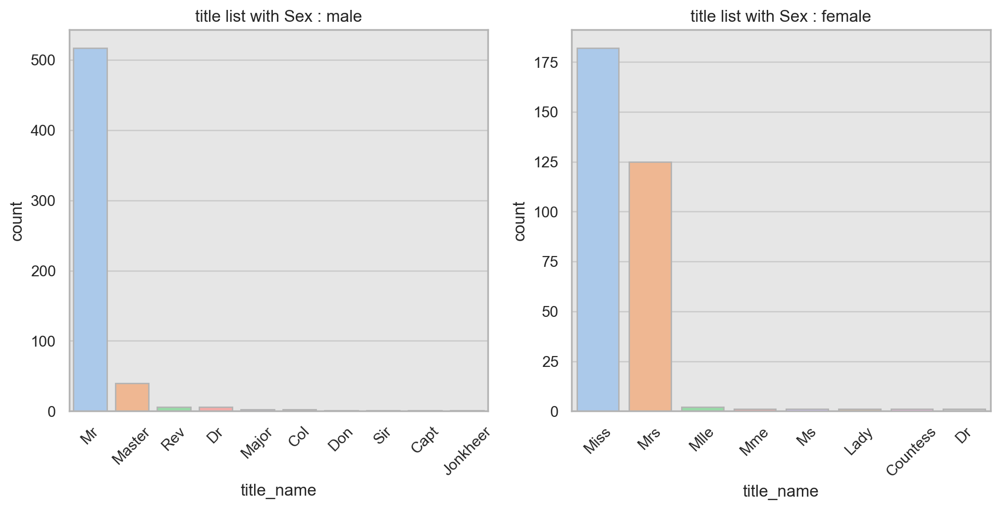

In [71]:
fig, axes = plt.subplots(nrows=1, ncols=2, figsize=(12, 5))

for i, s in enumerate(["male", "female"]) : 
    ax = axes[i]
    temp_sex_title = train_2[train_2["Sex"] == s]["title_name"].value_counts().to_frame().reset_index()
    sns.barplot(
        x="title_name",
        y="count",
        data=temp_sex_title,
        palette="pastel",
        edgecolor=".7",
        ax=ax
    )
    ax.set(title=f"title list with Sex : {s}") 
    ax.set_xticklabels(temp_sex_title["title_name"], rotation=45);

### 호칭 feature의 그룹핑
- 범주형 feature의 유니크 데이터가 1개인 경우 modeling에서 train, test 데이터 분리를 할때 한쪽으로 데이터가 치우기게 된다. 따라서 호칭중에서 갯수가 1인 것들을 그룹핑한다. 
   - Mlle, Mme, Ms : Mrs
   - Lady : Miss
   - Col, Capt : army
   - Don, Sir, Countess, Jonkheer : peerage (귀족)

In [72]:
train_2.loc[train_2["title_name"].isin(["Mlle", "Mme", "Ms"]), "title_name"] = "Mrs"
train_2.loc[train_2["title_name"].isin(["Lady"]), "title_name"] = "Miss"
train_2.loc[train_2["title_name"].isin(["Col", "Capt"]), "title_name"] = "army"
train_2.loc[train_2["title_name"].isin(["Don", "Sir", "Countess", "Jonkheer"]), "title_name"] = "peerage"

train_2.groupby("Sex")["title_name"].value_counts().to_frame()

count
Sex    title_name       
female Miss          183
       Mrs           129
       Dr              1
       peerage         1
male   Mr            517
       Master         40
       Dr              6
       Rev             6
       army            3
       peerage         3
       Major           2

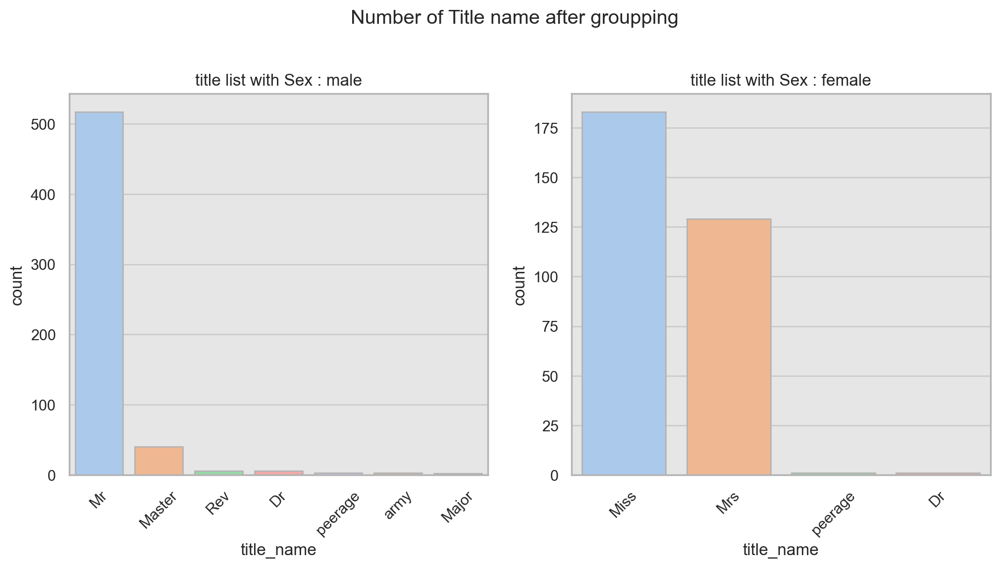

In [73]:
fig, axes = plt.subplots(nrows=1, ncols=2, figsize=(12, 5))

for i, s in enumerate(["male", "female"]) : 
    ax = axes[i]
    temp_sex_title = train_2[train_2["Sex"] == s]["title_name"].value_counts().to_frame().reset_index()
    sns.barplot(
        x="title_name",
        y="count",
        data=temp_sex_title,
        palette="pastel",
        edgecolor=".7",
        ax=ax
    )
    ax.set(title=f"title list with Sex : {s}") 
    ax.set_xticklabels(temp_sex_title["title_name"], rotation=45)
fig.suptitle("Number of Title name after groupping", y=1.05)    ;

### 여성 중 title이 Dr 인 승객은 누구일까?
- Dr 호칭은 의사나 박사를 지칭하고 male이 대부분이다. 여성의 호칭 중 유일하게 Dr인 승객이 있다. 이 사람은 남성이 여성으로 잘 못 입력이 된 것일까?
   - Leader, Dr. Alice (Farnham)는 실제 의학교육을 받은 여성으로 소아과 간호사였다고 한다. 따라서 데이터를 변경없이 유지한다.

In [74]:
train_2[train_2["title_name"]=="Dr"].sort_values("Sex")

,PassengerId,Survived,Pclass,Name,Sex,Age,SibSp,Parch,Ticket,Fare,Embarked,clean_name,title_name
796,797,1,1,"Leader, Dr. Alice (Farnham)",female,49.0,0,0,17465,25.9292,S,Leader Dr Alice (Farnham),Dr
245,246,0,1,"Minahan, Dr. William Edward",male,44.0,2,0,19928,90.0000,Q,Minahan Dr William Edward,Dr
317,318,0,2,"Moraweck, Dr. Ernest",male,54.0,0,0,29011,14.0000,S,Moraweck Dr Ernest,Dr
398,399,0,2,"Pain, Dr. Alfred",male,23.0,0,0,244278,10.5000,S,Pain Dr Alfred,Dr
632,633,1,1,"Stahelin-Maeglin, Dr. Max",male,32.0,0,0,13214,30.5000,C,Stahelin-Maeglin Dr Max,Dr
660,661,1,1,"Frauenthal, Dr. Henry William",male,50.0,2,0,PC 17611,133.6500,S,Frauenthal Dr Henry William,Dr
766,767,0,1,"Brewe, Dr. Arthur Jackson",male,30.0,0,0,112379,39.6000,C,Brewe Dr Arthur Jackson,Dr


### clean_name feature 제거

In [75]:
train_2.drop(["clean_name"], axis=1, inplace=True)

## 3. Feature Engineering - Age Groupping
- Age는 0~80세까지 다양한 연령대로 이루어져 있다. Age feature로부터 세대를 구분하여 generation feature를 만든다.

In [76]:
train_2["Age"].describe()

count    891.000000
mean      29.758889
std       13.002570
min        0.420000
25%       22.000000
50%       30.000000
75%       35.000000
max       80.000000
Name: Age, dtype: float64

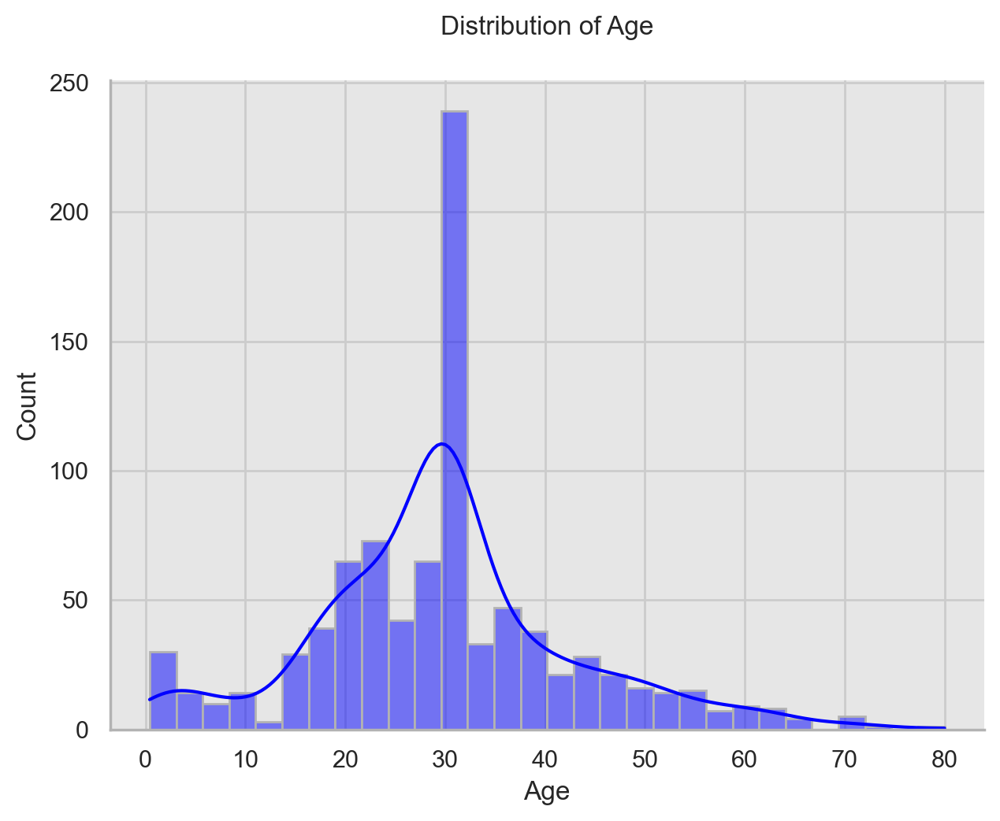

In [79]:
sns.displot(
    data=train_2,
    x="Age",
    color="blue",
    edgecolor=".7",
    height=5,
    aspect=1.3,
    kde=True
)
plt.title("Distribution of Age", y=1.05); 

### pd.cut()을 사용해 Age의 구간을 나누고 label을 설정한다.
- 구간, label
    - 0~2 : 유아 : toddler
    - 2~13 : 어린이 : children
    - 13~19 : 청소년 : teenager
    - 19~65 : 성인 : adult
    - 65~ : 노인 : oldman
- 구간의 마지막 숫자가 구간에 포함된다.
- label의 갯수는 구간의 갯수보다 1 작아야 한다.
   

In [80]:
age_bins = [0, 1, 12, 18, 64, 100]
age_labels = ["toddler", "children", "teenager", "adult", "old"]
train_2["generation"] = pd.cut(train_2["Age"], bins=age_bins, labels=age_labels)
train_2["generation"].value_counts()

generation
adult       741
teenager     70
children     55
toddler      14
old          11
Name: count, dtype: int64

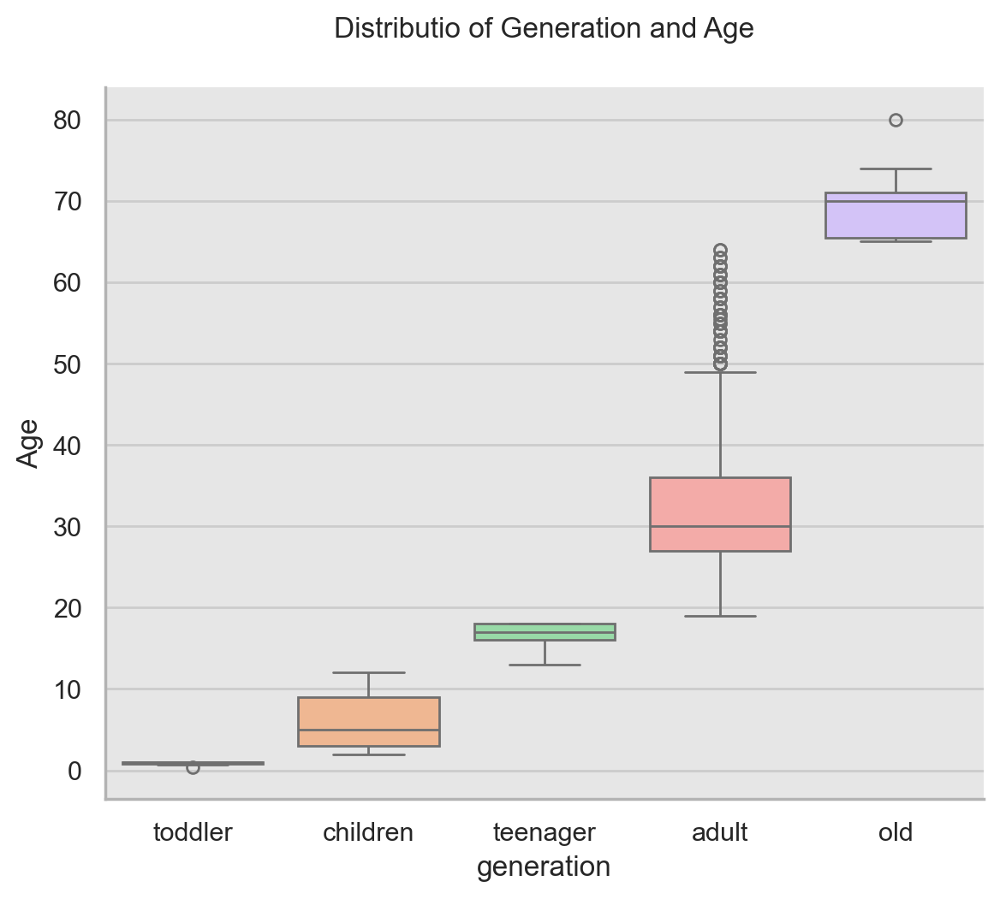

In [83]:
sns.catplot(
    data=train_2,
    x="generation",
    y="Age",
    palette="pastel",
    height=5,
    aspect=1.2,
    kind="box"
)
plt.title("Distributio of Generation and Age", y=1.05) ;

### 남녀 세대별 인원수와 생존여부
- 남여 모두 adult가 가장 많이 사망했다.
- 여성의 모든 세대는 생존자가 더 많다.
- 남성은 toddler를 제외한 모든 세대에서 사망자가 더 많다.

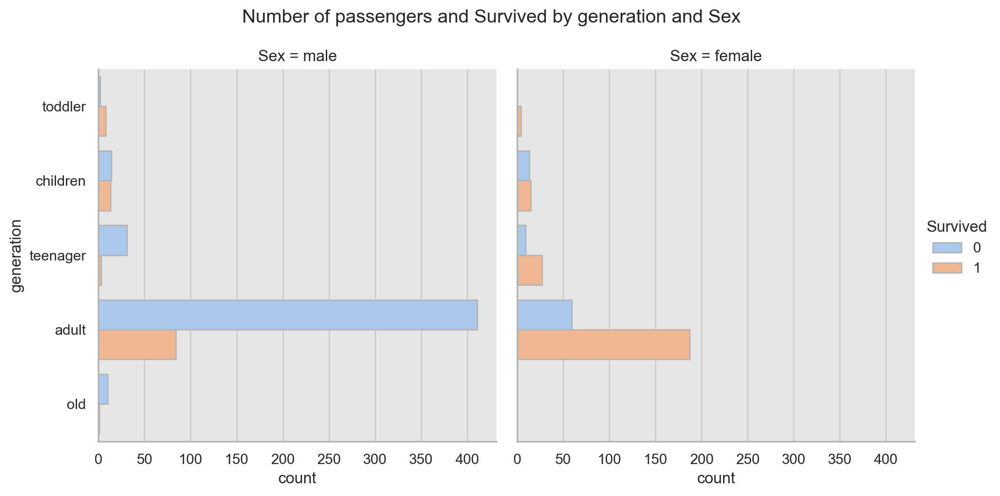

In [84]:
sns.catplot(
    data=train_2,
    y="generation",
    col="Sex",
    hue="Survived",
    palette="pastel",
    edgecolor="0.7",
    kind='count'
)
plt.suptitle("Number of passengers and Survived by generation and Sex", y=1.05) ;

## 4. Feature engineering : Ticket
- Ticket에는 데이터는 번호만 쓰인 것과 description과 번호가 함께 쓰인 것이 있는데, description과 num을 각각 추출하여 feature로 적합한지 확인한다.

### description 추출
   -  A/5 21171, STON/O2. 3101282 등
- Ticket의 description의 의미는 정확하게 알 수 없지만, Ticket의 정보에 해당하는 것은 맞는 것 같다.
- description의 표기 방식을 살펴보면 동일한 description에 "." 만 추가된 것들이 있다. 이러한 경우 **콤마를 제거하여 description을 정리한다.**
- **숫자형 ticket은 description으로 ordinary 명칭을 사용한다.**

In [85]:
len(train_2["Ticket"].unique()), len(test_2["Ticket"].unique())

(681, 363)

#### description의 콤마를 제거하면 같은 것들끼리 그룹핑할 수 있다.
- 콤마를 제거하면 description이 42개에서 33개로 줄어든다. 

In [86]:
num_list = [str(i) for i in range(10)]
temp_train_desc_1 = train_2["Ticket"].apply(lambda x: "ordinary" if x[0] in num_list else x.split(" ")[0]).to_frame()
temp_train_desc = train_2["Ticket"].apply(lambda x: "ordinary" if x[0] in num_list else x.split(" ")[0].replace(".", "")).to_frame()
temp_test_desc = test_2["Ticket"].apply(lambda x: "ordinary" if x[0] in num_list else x.split(" ")[0].replace(".", "")).to_frame()

print(f'''
<train data set>
len of ticket desc : {temp_train_desc_1.query("Ticket != 'ordinary'")["Ticket"].nunique()}
===========================================================================================
ticket desc : {temp_train_desc_1["Ticket"].unique()}
-------------------------------------------------------------------------------------------
''')

print(f'''
<train data set>
len of clean ticket desc : {temp_train_desc.query("Ticket != 'ordinary'")["Ticket"].nunique()}
===========================================================================================
clear ticket desc : {temp_train_desc["Ticket"].unique()}
-------------------------------------------------------------------------------------------
''')

print(f'''
<test data set>
len of clean ticket desc : {temp_test_desc.query("Ticket != 'ordinary'")["Ticket"].nunique()}
===========================================================================================
clear ticket desc : {temp_test_desc["Ticket"].unique()}
-------------------------------------------------------------------------------------------
''')


<train data set>
len of ticket desc : 43
ticket desc : ['A/5' 'PC' 'STON/O2.' 'ordinary' 'PP' 'A/5.' 'C.A.' 'A./5.' 'SC/Paris'
 'S.C./A.4.' 'A/4.' 'CA' 'S.P.' 'S.O.C.' 'SO/C' 'W./C.' 'SOTON/OQ'
 'W.E.P.' 'STON/O' 'A4.' 'C' 'SOTON/O.Q.' 'SC/PARIS' 'S.O.P.' 'A.5.' 'Fa'
 'CA.' 'LINE' 'F.C.C.' 'W/C' 'SW/PP' 'SCO/W' 'P/PP' 'SC' 'SC/AH' 'A/S'
 'A/4' 'WE/P' 'S.W./PP' 'S.O./P.P.' 'F.C.' 'SOTON/O2' 'S.C./PARIS'
 'C.A./SOTON']
-------------------------------------------------------------------------------------------


<train data set>
len of clean ticket desc : 34
clear ticket desc : ['A/5' 'PC' 'STON/O2' 'ordinary' 'PP' 'CA' 'SC/Paris' 'SC/A4' 'A/4' 'SP'
 'SOC' 'SO/C' 'W/C' 'SOTON/OQ' 'WEP' 'STON/O' 'A4' 'C' 'SC/PARIS' 'SOP'
 'A5' 'Fa' 'LINE' 'FCC' 'SW/PP' 'SCO/W' 'P/PP' 'SC' 'SC/AH' 'A/S' 'WE/P'
 'SO/PP' 'FC' 'SOTON/O2' 'CA/SOTON']
-------------------------------------------------------------------------------------------


<test data set>
len of clean ticket desc : 28
clear ticket desc : ['

### train, test set의 Ticket description의 비교
- 전체 description의 40가지 종류이다.
- train, test set 각각 ticket description은 같은 것도 있고 다른 것도 있다. 
- **train, test set 중 한쪽에만 존재하는 데이터의 경우 model fitting, predict에서 에러가 되므로 ticket의 description feature는 유용하지 않다.**
   - 다른 방식으로 그룹핑을 해도 train, test set의 ticket description의 불균형이 있으므로 의미가 없다.

In [87]:
pd.concat([temp_train_desc, temp_test_desc], axis=0)["Ticket"].nunique()

41

In [88]:
temp_compare = pd.concat([temp_train_desc["Ticket"].value_counts(), temp_test_desc["Ticket"].value_counts()], axis=1).fillna(0).astype(int)
temp_compare.columns = ["train", "test"]
temp_compare.sort_values("test", ascending=False)

,train,test
Ticket,,
ordinary,661,296
PC,60,32
CA,41,27
SOTON/OQ,15,9
SC/PARIS,7,7
A/5,19,6
W/C,10,5
FCC,5,4
SO/PP,3,4


### Ticket에서 description이 아닌 num 추출하여 사용할 수 있을까?
- Ticket에서 description을 추출한 featuer의 경우 train, test set의 데이터 불균형으로 유용하지 않았다. Ticket에서 번호 부분만 추출하는 것은 어떨까?
- 티켓에서 추출한 번호가 같은 데이터 샘플들은 거의 대부분 desc가 같다.
   - 예를들어 SP 1234, PP 1234 가 있는 경우 번호가 같기때문에 두 티켓이 같은 1234 클래스가 되므로 이러한 경우는 desc와 num을 합하여 구분을 했다.
   - 그러나 test_df에만 있는 ticket_num 데이터 샘플이 많아서 model fitting시 train_df를 사용하는 의미가 없어지게 되므로 ticket_num feature는 유용하지 않다.

### 중복인 num 중에서 desc가 다른 경우 구별을 위해 해당 데이터를 num + desc로 변환한다.

#### train 데이터

In [89]:
# Ticket에서 num 부분 추출
temp_train_ticket_num = train_2["Ticket"].apply(lambda x: x.split(" ")[-1])
# desc와 num을 병합한 임시 dataframe
temp_train_ticket_df = pd.concat([temp_train_desc, temp_train_ticket_num], axis=1)
temp_train_ticket_df.columns = ["desc", "num"]
# 중복인 num 리스트
repeated_ticket_num = [c["num"] for idx, c in temp_train_ticket_df["num"].value_counts().to_frame().reset_index().iterrows() if c["count"] > 1]

# 중복인 num 중에서 desc가 다른 경우 구별해주기 위해 num + desc로 데이터 업데이트
# except_ticket_num : 중복인 num 중 desc가 다른 경우 index 저장
except_ticket_num = []
for num in repeated_ticket_num :  
    desc_n_nunique = temp_train_ticket_df[temp_train_ticket_df["num"] == num]["desc"].nunique()
    if desc_n_nunique != 1 :  
        except_ticket_num.append(list(temp_train_ticket_df[temp_train_ticket_df["num"]==num].index))
        # desc의 유니크 갯수가 여러개인 경우 해당 num 값에 desc를 붙여서 구별해준다.
        temp_train_ticket_df.loc[temp_train_ticket_df["num"]==num, "num"] = temp_train_ticket_df["num"] + temp_train_ticket_df["desc"]

# [[a, b, c], [d, e]] -> [a, b, c, d, e]
except_ticket_num = except_ticket_num[0] + except_ticket_num[1]
except_ticket_num

[572, 690, 781, 226, 648]

In [90]:
temp_train_ticket_df.loc[except_ticket_num]

,desc,num
572,PC,17474PC
690,ordinary,17474ordinary
781,ordinary,17474ordinary
226,SW/PP,751SW/PP
648,SO/PP,751SO/PP


#### test 데이터

In [91]:
# Ticket에서 num 부분 추출
temp_test_ticket_num = test_2["Ticket"].apply(lambda x: x.split(" ")[-1])
# desc와 num을 병합한 임시 dataframe
temp_test_ticket_df = pd.concat([temp_test_desc, temp_test_ticket_num], axis=1)
temp_test_ticket_df.columns = ["desc", "num"]
# 중복인 num 리스트
repeated_ticket_num = [c["num"] for idx, c in temp_test_ticket_df["num"].value_counts().to_frame().reset_index().iterrows() if c["count"] > 1]

# 중복인 num 중에서 desc가 다른 경우 구별해주기 위해 num + desc로 데이터 업데이트
# except_ticket_num : 중복인 num 중 desc가 다른 경우 index 저장
except_ticket_num = []
for num in repeated_ticket_num :  
    desc_n_nunique = temp_test_ticket_df[temp_test_ticket_df["num"] == num]["desc"].nunique()
    if desc_n_nunique != 1 :  
        except_ticket_num.append(list(temp_test_ticket_df[temp_test_ticket_df["num"]==num].index))
        # desc의 유니크 갯수가 여러개인 경우 해당 num 값에 desc를 붙여서 구별해준다.
        temp_test_ticket_df.loc[temp_test_ticket_df["num"]==num, "num"] = temp_test_ticket_df["num"] + temp_test_ticket_df["desc"]

except_ticket_num

[[173, 392]]

In [92]:
temp_test_ticket_df.loc[except_ticket_num[0]]

,desc,num
173,ordinary,2673ordinary
392,CA,2673CA


### test set에서 추출한 num 중에서 train set의 num에 해당하지 않는 것
- 아래와 같이 Ticket feature에서 추출한 num 데이터도 train, test의 데이터 불균형으로 인해 유용하지 않다.

In [93]:
temp_test_ticket_df[~temp_test_ticket_df["num"].isin(temp_train_ticket_df["num"].unique())].shape[0]

265

### Ticket Featrue의 engineering 문제
- Ticket feature에서 새로운 feature를 만들기 위해 2가지 feature engineering을 시도 하였다.
   - 1) Ticket의 description 부분을 추출한 후 첫글자로 그룹핑한 ticket_desc 컬럼을 생성해 보았으나 그룹핑으로 인해 상관없는 데이터 샘플끼리 연관성이 커지게 되어 model fitting에 유용하지 않다.
   - 2) Ticket의 number를 추출하여 ticket_num feature를 만들고 중복 num을 조회하여 같은 description이 아닌 경우 num에 해당 description을 더하여 구분했다. test_df에만 있는 ticket_num이 200여개가 되어 train_df의 model fitting이 의미가 없어짐
- 따라서 Ticket feature는 Name feature 처럼 새로운 feature를 만들어내기 어렵다.

## 5. DATA EDA

### 생존자와 사망자의 비교
- 사망자가 생존자 보다 더 많다. : Survived=0

In [49]:
print(f'''
number of survivors : {len(train_2.query("Survived == 1"))}
number of deths : {len(train_2.query("Survived == 0"))}
''')


number of survivors : 342
number of deths : 549



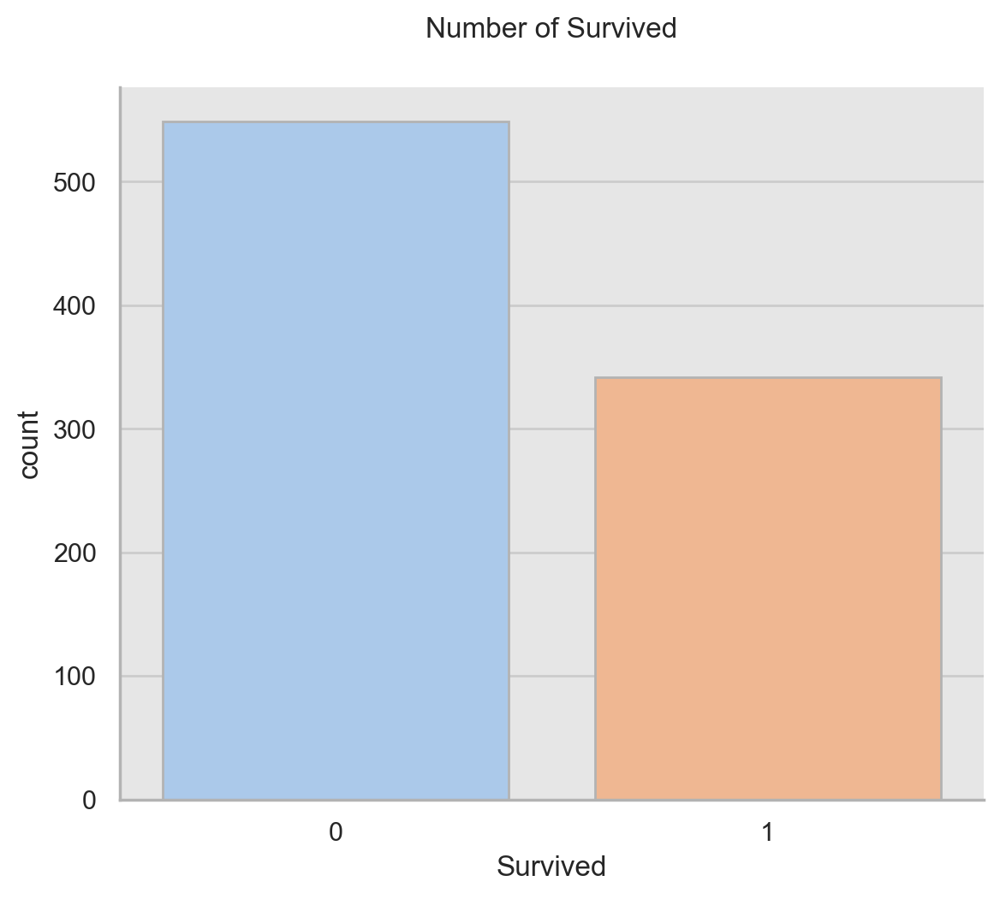

In [50]:
sns.catplot(
    data=train_2,
    x="Survived",
    palette="pastel",
    edgecolor=".7",
    height=5,
    aspect=1.2,
    kind="count"
)
plt.title("Number of Survived", y=1.05);

### 생존자와 사망자는 각각 어떤 Pclass가 더 많을까?
- 사망자는 3등급 Pclass 승객이 가장 많다.
- 생존자는 1등급 Pcalss 승객이 가장 많다.

In [51]:
train_2.groupby("Survived")["Pclass"].value_counts().to_frame()

count
Survived Pclass       
0        3         372
         2          97
         1          80
1        1         136
         3         119
         2          87

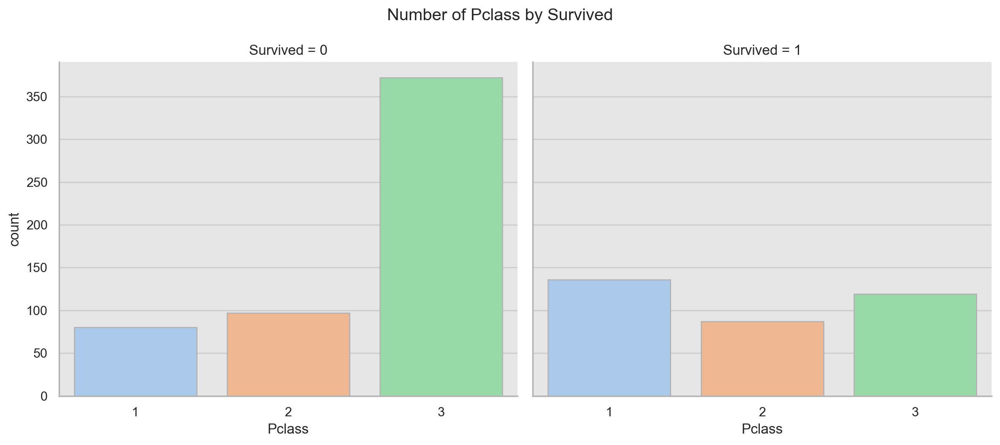

In [52]:
sns.catplot(
    data=train_2, 
    x="Pclass", 
    col="Survived", 
    palette="pastel",
    edgecolor=".7",
    height=5,
    aspect=1.2,
    kind="count" 
) 
plt.suptitle("Number of Pclass by Survived", y=1.05);

### 생존자와 사망자는 각각 어떤 성별이 많을까?
- 사망자는 남성이 더 많고, 생존자는 여성이 더 많다.

In [53]:
train_2.groupby("Survived")["Sex"].value_counts().to_frame()

count
Survived Sex          
0        male      468
         female     81
1        female    233
         male      109

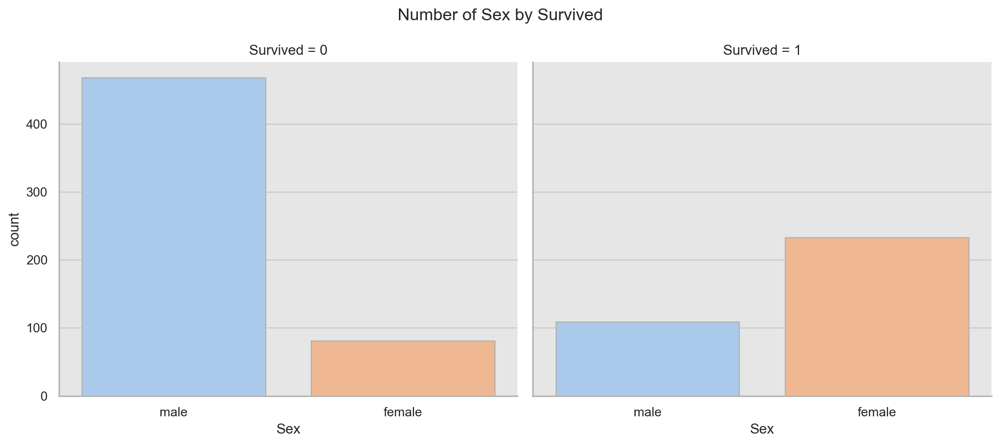

In [54]:
sns.catplot(
    data=train_2, 
    x="Sex", 
    col="Survived",
    palette="pastel",
    edgecolor=".7",
    height=5,
    aspect=1.2,
    kind="count"
)
plt.suptitle("Number of Sex by Survived", y=1.05) ; 

### 생존자와 사망자는 각각 어떤 항구가 많을까?
- 사망자는 S항구 탑승객이 많다.
- 생존자는 S항구 탑승객이 많다.

In [55]:
train_2.groupby("Survived")["Embarked"].value_counts().to_frame()

count
Survived Embarked       
0        S           427
         C            75
         Q            47
1        S           219
         C            93
         Q            30

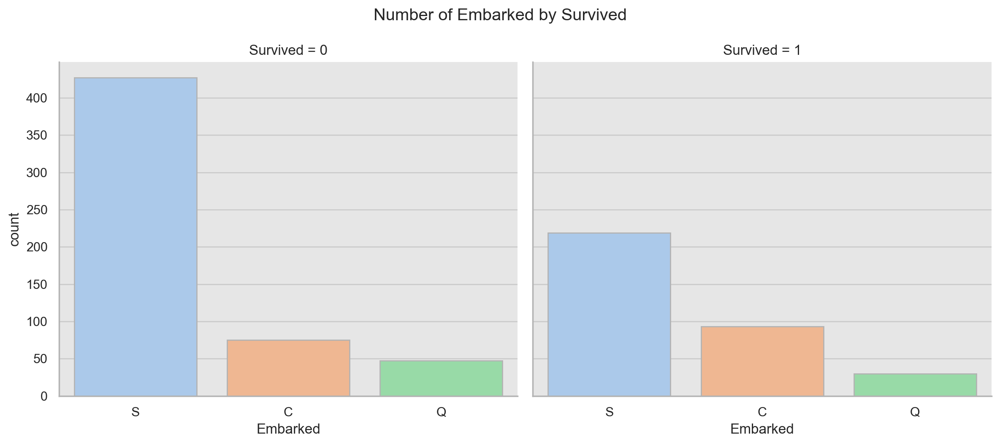

In [56]:
sns.catplot(
    data=train_2, 
    x="Embarked", 
    col="Survived",
    palette="pastel",
    edgecolor=".7",
    height=5,
    aspect=1.2,
    kind="count"
)
plt.suptitle("Number of Embarked by Survived", y=1.05) ; 

### 사망자와 생존자는 각각 어떤 나이가 더 많을까?
- 생존자와 사망자는 20-30세가 많고 특히 30대 초반이 가장 많다.

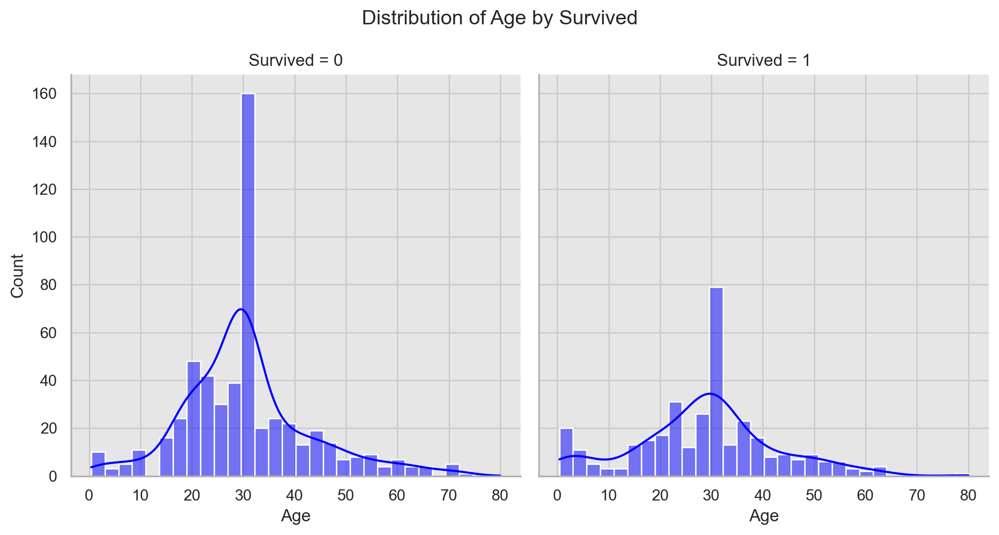

In [57]:
sns.displot(
    data=train_2,
    x="Age",
    col="Survived",
    color="blue",
    kde=True,
) 
plt.suptitle("Distribution of Age by Survived", y=1.05);

### Sex와 Pclass에 따른 Survived별 승객수
- 1등급과 2등급 객실의 여성은 대부분 생존했다. 
- 2등급과 3등급 객실의 남성은 사망자가 매우 많이 발생했다.

In [58]:
train_2.groupby(["Survived", "Sex"])["Pclass"].value_counts().to_frame()

count
Survived Sex    Pclass       
0        female 3          72
                2           6
                1           3
         male   3         300
                2          91
                1          77
1        female 1          91
                3          72
                2          70
         male   3          47
                1          45
                2          17

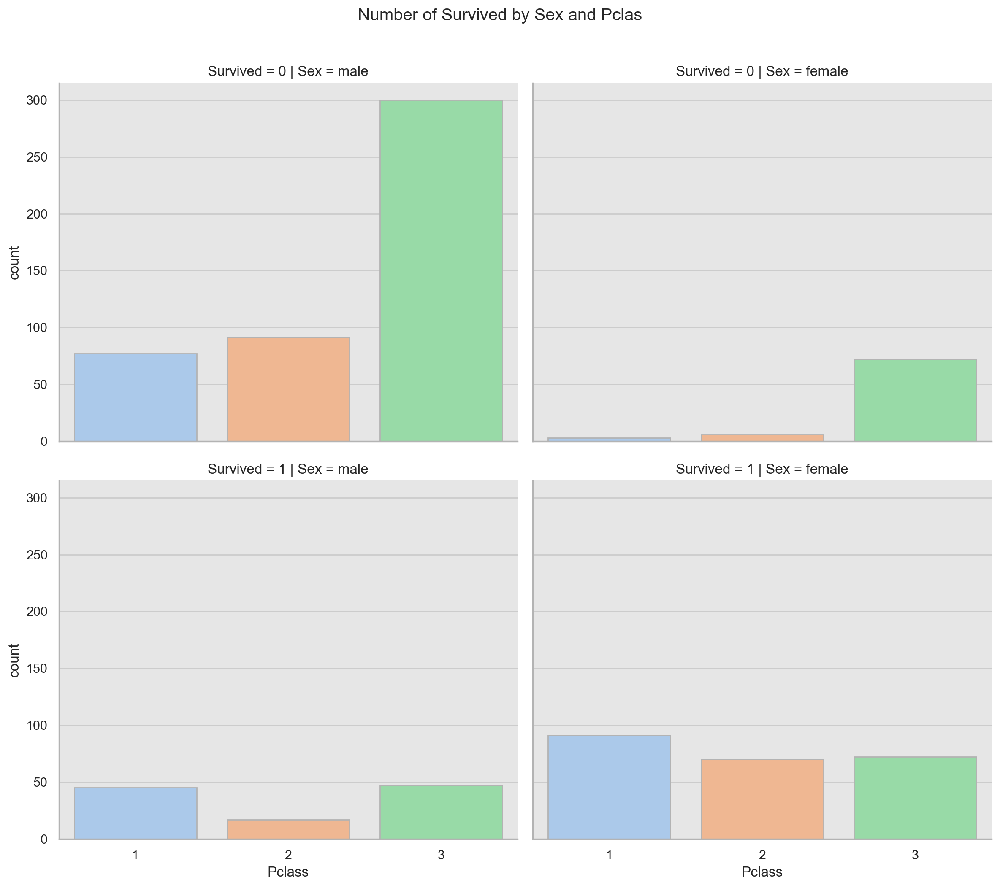

In [59]:
sns.catplot(
    data=train_2,
    x="Pclass",
    row="Survived",
    col="Sex",
    palette="pastel",
    edgecolor=".7",
    height=5,
    aspect=1.2,
    kind="count"
) 
plt.suptitle("Number of Survived by Sex and Pclas", y=1.05); 

### Survived와 성별을 조합한 경우의 Age
- 남녀 모두 20-30 세대가 다른 세대보다 사망자와 생존자가 많다.

In [60]:
from itertools import product

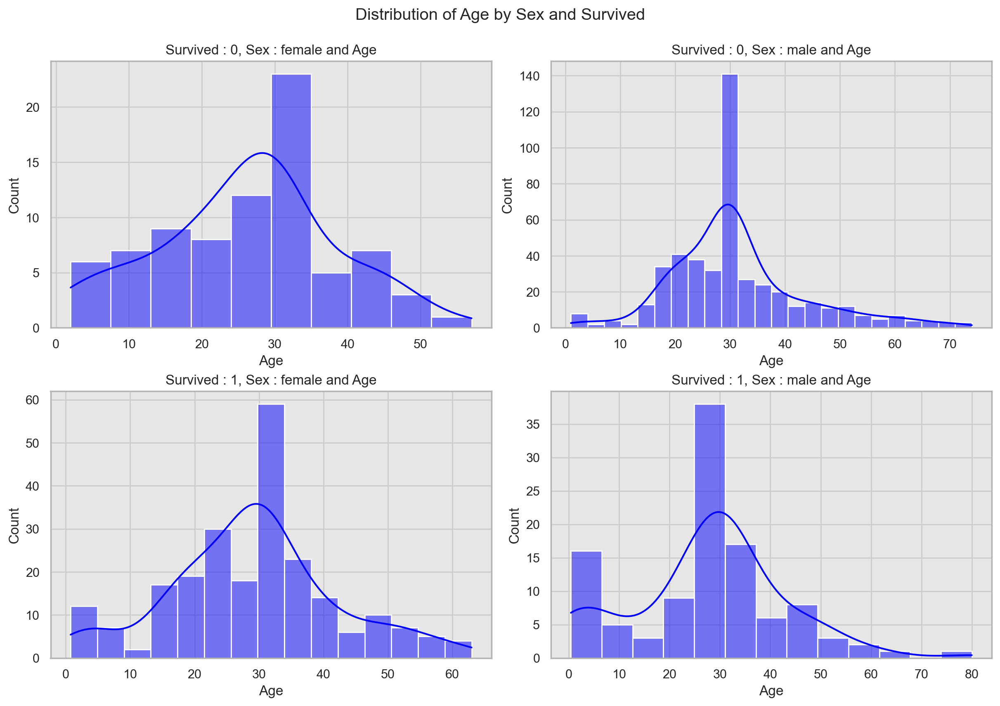

In [61]:
f_1 = "Survived"
f_2 = "Sex"
combs = [(n, m) for n, m in product(np.unique(train_2[f_1]), np.unique(train_2[f_2]))]
other_feature = "Age"

fig, axes = plt.subplots(nrows=2, ncols=2, figsize=(12, 8), constrained_layout=True)
axes = axes.flatten()

for i, comb in enumerate(combs): 
    ax = axes[i]
    temp_surv_pc = train_2[(train_2["Survived"] == comb[0]) & (train_2["Sex"] == comb[1])][other_feature].to_frame()
    sns.histplot(
        x=other_feature,
        data=temp_surv_pc,
        color="blue",
        kde=True,
        ax=ax
    ) 
    ax.set(title=f"{f_1} : {comb[0]}, {f_2} : {comb[1]} and {other_feature}") 

fig.suptitle("Distribution of Age by Sex and Survived", y=1.05) ; 

### Pclass별 성별 나이 분포와 생존여부
- Pclass=1의 female은 대부분 생존했지만, male은 다수가 사망했다. 특히 male 30대의 사망자가 많다.
- Pclass=2의 female은 대부분 생존했지만, male은 다수가 사망했다. 특히 male 20-30대의 사망자가 많다.
- Pclass=3의 female은 절반은 생존하고 절반은 사망했다. male은 86%가 사망했다. 

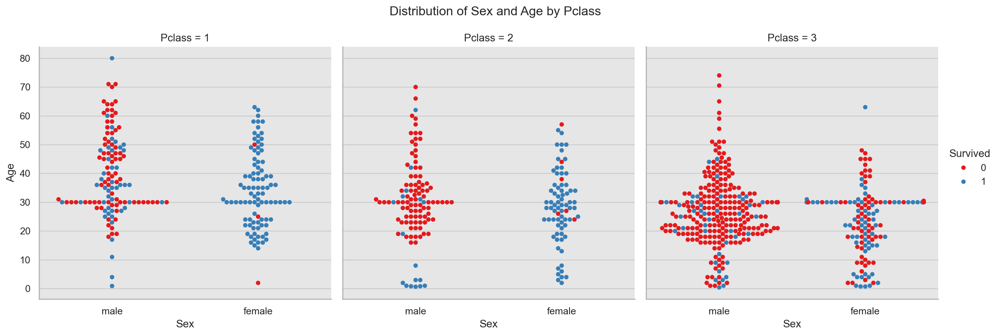

In [62]:
sns.catplot(
    data=train_2,
    x="Sex",
    y="Age",
    col="Pclass",
    hue="Survived",
    palette="Set1",
    edgecolor=".7",
    kind="swarm"
) 
plt.suptitle("Distribution of Sex and Age by Pclass", y=1.05);

## 6. Modeling
- 모델링에 다음과 같은 기술들을 사용
    - 확률모델과 판별모델
       - probabilistic genesis model : LDA/QDA, Naive Bayes
       - probabilistic discriminant model : LogisticRegression, DecisionTree
       - discriminant model : Multi Layler Perceptrone, Support Vector Machine
    - Ensemble 모형 결합
       - aggregation : VotingC, BaggingC, RandomForest, ExtraTrees
       - boosting : AdaboostC, XGBoost
    - model optimization
       - hyper parameter tunning : GridSearchCV
       - cross validate : KFold, RepeatedStratifiedKFold
    - feature engineering
       - pipe line
       - feature preprocessor : OneHotEncoder, OrdinalEncoder, StandardScaler, pd.get_dummies(), ColumnTransformer
       - feature inter actions : PolynomialFeatures
       - feature select : VarianceThreshold, SelectKBest, SelectFromModel
- 모델링 실험의 순서
   - (1) 전체 개별 모델의 pipe line을 만들고 cross validate(n_splits=5) 성능 측정
      - LogisticRegression
      - DecisionTree
      - LDA
      - BernoulliNB
      - SVC
      - MLP
      - RandomForest, ExtraTrees
   - (2) 개별 모델 pipe line을 hyper parameter tunning으로 모형 최적화 3회 실험 후 best 모델 선택하여 cross validata 성능 측정
      - model_gscv_best
   - (3) Ensemble 모형 결합 방법 VotingC, BaggingC, AdaBoost에 개별 모델과 best 모델을 적용하여 성능 측정
   - (4) XGBoost 모델 성능 측정
   - (5) XGBoost best 모델 포함하여 Ensemble 성능 측정
   - (6) top 모델 선택 후 2가지 실험
      - feature select를 기존 VarianceThreshold에서 SelectKBest, SelectFromModel 기술을 추가 적용하여 성능 측정
      - 중첩 cross validate로 10X10 회 성능 측정 후 통계적 방법으로 모델의 성능 비교
   - (7) 최종 모델 선택

In [3]:
# 전처리, 엔지니어링
from sklearn.preprocessing import LabelEncoder, OneHotEncoder, OrdinalEncoder, StandardScaler, PolynomialFeatures
from sklearn.compose import ColumnTransformer
from sklearn.model_selection import train_test_split, KFold, cross_validate, GridSearchCV
from sklearn.pipeline import Pipeline
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, roc_auc_score, classification_report
from sklearn.feature_selection import VarianceThreshold, SelectKBest, chi2

# 확률적 판별모형
from sklearn.linear_model import LogisticRegression
from sklearn.tree import DecisionTreeClassifier

# 확률적 생성모형
from sklearn.discriminant_analysis import LinearDiscriminantAnalysis, QuadraticDiscriminantAnalysis
from sklearn.naive_bayes import MultinomialNB, BernoulliNB, GaussianNB, CategoricalNB

# 판별모형
from sklearn.svm import SVC
from sklearn.neural_network import MLPClassifier

# 앙상블(모형결합)
from sklearn.ensemble import VotingClassifier, BaggingClassifier, RandomForestClassifier, ExtraTreesClassifier, AdaBoostClassifier
import xgboost as xgb

### train,test 데이터 전처리
- feature의 전처리는 modeling에서 사용할 수 있도록 가공해야 한다.
- 데이터 EDA 단계에서 데이터의 전처리를 진행한 경우 modeling에서 사용할 수 없을 수 있다.
   - train, test 데이터가 분리된 경우 model fitting에서 사용된 것과 model predict 에서 사용된 데이터의 샘플이 최소한 일치 해야한다.

In [4]:
total_df = pd.concat([train_df, test_df], axis=0).reset_index()
total_df.tail()

,index,PassengerId,Survived,Pclass,Name,Sex,Age,SibSp,Parch,Ticket,Fare,Cabin,Embarked
1304,413,1305,NaN,3,"Spector, Mr. Woolf",male,NaN,0,0,A.5. 3236,8.0500,NaN,S
1305,414,1306,NaN,1,"Oliva y Ocana, Dona. Fermina",female,39.0,0,0,PC 17758,108.9000,C105,C
1306,415,1307,NaN,3,"Saether, Mr. Simon Sivertsen",male,38.5,0,0,SOTON/O.Q. 3101262,7.2500,NaN,S
1307,416,1308,NaN,3,"Ware, Mr. Frederick",male,NaN,0,0,359309,8.0500,NaN,S
1308,417,1309,NaN,3,"Peter, Master. Michael J",male,NaN,1,1,2668,22.3583,NaN,C


In [5]:
def find_title(name) : 
    
    '''
    Name의 데이터 샘플에서 특수문자를 제거하고 title을 추출하여 반환한다.
    '''
    remove_char = ',./:;?!#@"'
    for rc in remove_char : 
        name = name.replace(rc, "")
    
    title_list = ['Mr', 'Mrs', 'Miss', 'Ms', 'Master', 
                  'Dr', 'Don', 'Dona', 'Sir', 'Rev', 'Mme', 
                  'Major', 'Lady', 'Mlle', 'Capt', 'Countess', 'Jonkheer', 'Col']
    result = []
    for name in name.split(" ") : 
        if name in title_list : 
            result.append(name)
    
    return result


def df_preprocessor(df) : 
    
    '''
    feature preprocessing
    '''
    df["Age"] = df["Age"].fillna(df["Age"].mean().round(0))
    age_bins = [0, 1, 12, 18, 64, 100]
    age_labels = ["toddler", "children", "teenager", "adult", "old"]
    df["generation"] = pd.cut(df["Age"], bins=age_bins, labels=age_labels)
    
    df["title_name"] = df["Name"].apply(lambda x: find_title(x)[0])
    df.loc[df["title_name"].isin(["Mlle", "Mme", "Ms", "Dona"]), "title_name"] = "Mrs"
    df.loc[df["title_name"].isin(["Lady"]), "title_name"] = "Miss"
    df.loc[df["title_name"].isin(["Col", "Capt"]), "title_name"] = "army"
    df.loc[df["title_name"].isin(["Don", "Sir", "Countess", "Jonkheer"]), "title_name"] = "peerage"

    df.drop(["Cabin"], axis=1, inplace=True)
    df["Embarked"] = df["Embarked"].fillna("S")
    
    df["Fare"] = df["Fare"].fillna(df["Fare"].mean().round(0))
    df.set_index("index", inplace=True)
    
    return df

In [6]:
total_df = df_preprocessor(total_df)
total_df.isnull().sum()

PassengerId      0
Survived       418
Pclass           0
Name             0
Sex              0
Age              0
SibSp            0
Parch            0
Ticket           0
Fare             0
Embarked         0
generation       0
title_name       0
dtype: int64

### 전처리 된 train, test 데이터 생성

In [7]:
train_2 = total_df.iloc[:891]
test_2 = total_df.iloc[891:]

train_2.shape, test_2.shape

((891, 13), (418, 13))

### 모델 학습용 데이터 생성

In [8]:
X = train_2.drop(["PassengerId", "Survived", "Name", "Ticket"], axis=1)
y = train_2["Survived"]

X.shape, y.shape

((891, 9), (891,))

### dtype 변경
- num_features : int
- cat_features : category

In [9]:
num_features = ["Age", "Fare", "SibSp", "Parch"]
cat_features = list(set(X.columns).difference(num_features))

print(f'''
~~~~~ type of features ~~~~~
numeric features : {num_features}
categorical features : {cat_features}
''')


~~~~~ type of features ~~~~~
numeric features : ['Age', 'Fare', 'SibSp', 'Parch']
categorical features : ['Pclass', 'generation', 'title_name', 'Embarked', 'Sex']



In [10]:
def change_dtypes(X) : 
    
    X[cat_features] = X[cat_features].astype("category")
    X[num_features] = X[num_features].astype(int)
    
    return X

In [11]:
X = change_dtypes(X)
X.dtypes

Pclass        category
Sex           category
Age              int32
SibSp            int32
Parch            int32
Fare             int32
Embarked      category
generation    category
title_name    category
dtype: object

### X, y 더미변수화
- X : OneHotEncoder
- y : LabelEncoder

In [12]:
X_onehot = pd.get_dummies(X)
X_onehot.shape

(891, 26)

In [13]:
X_onehot.head()

,Age,SibSp,Parch,Fare,Pclass_1,Pclass_2,Pclass_3,Sex_female,Sex_male,Embarked_C,...,generation_old,title_name_Dr,title_name_Major,title_name_Master,title_name_Miss,title_name_Mr,title_name_Mrs,title_name_Rev,title_name_army,title_name_peerage
index,,,,,,,,,,,,,,,,,,,,,
0,22,1,0,7,False,False,True,False,True,False,...,False,False,False,False,False,True,False,False,False,False
1,38,1,0,71,True,False,False,True,False,True,...,False,False,False,False,False,False,True,False,False,False
2,26,0,0,7,False,False,True,True,False,False,...,False,False,False,False,True,False,False,False,False,False
3,35,1,0,53,True,False,False,True,False,False,...,False,False,False,False,False,False,True,False,False,False
4,35,0,0,8,False,False,True,False,True,False,...,False,False,False,False,False,True,False,False,False,False


In [14]:
lb_encoder = LabelEncoder()
lb_encoder.fit(y)
y_enc = lb_encoder.transform(y)

np.unique(y_enc, return_counts=True)

(array([0, 1], dtype=int64), array([549, 342], dtype=int64))

### (1) cross validate와 Pipeline modeling 
- cross_validate를 사용한 개별 모델 실험
   - onehotencoder로 전처리한 학습데이터 사용
   - KFold() cv : random_state=42 설정, 범주형 feature의 데이터 샘플을 균형있게 train, test로 분리할 수 있다.
   - 확률모형과 판별모형의 대표적인 모형 실험
      - probabilistic genesis model : LDA/QDA, NB
      - probabilistic discriminant model : LR, DT
      - discriminant model : MLP, SVC
- Pipe line을 구조화하여 개별 모델 실험      

### 분류 모델 생성
- 모델별 기본 파라미터로 테스트

In [15]:
lr = LogisticRegression()
dt = DecisionTreeClassifier(max_depth=4)
lda = LinearDiscriminantAnalysis()
bnb = BernoulliNB()
svc = SVC()
mlp = MLPClassifier(max_iter=500)

models = [lr, dt, lda, bnb, svc, mlp]
model_names = ["LogisticR", "DecisionT", "LinearDA", "BenoulliNB", "SupportVC", "MultiLP"]

### cross_validate를 사용하여 분류 모델 fitting과 평가 지표 반환

In [16]:
def get_metrics(X, y, model, cv) : 
    
    '''
    get_cv_result에서 호출
    model의 평가 지표 생성 : 
       - KFold로 5번 fitting 후 각각 precision, recall, f1 score의 평균값을 반환한다.
    '''
    
    metrics = []
    for i, (train_idx, test_idx) in enumerate(cv.split(X)) :
        model.fit(X.loc[train_idx], y[train_idx])
        pred = model.predict(X.loc[test_idx])

        pre = precision_score(y[test_idx], pred)
        recall = recall_score(y[test_idx], pred)
        f1 = f1_score(y[test_idx], pred)

        metrics.append([pre, recall, f1])
        
    p, r, f = np.mean(metrics, axis=0)
        
    return p, r, f

In [17]:
def get_cv_result(X, y, models, model_names, n_splits=5) : 
    
    '''
    model별 cv를 통한 평가 지표 데이터프레임 반환
       - precision, recall, f1 score는 get_metircs() 함수를 호출한 후 반환
    '''
    
    # 각 지표별 평균값
    metric_datas = []
    # 5번 cv의 test_score
    cv_accs = []
    # KFold : random_state 값을 적당히 높여야 범주형 feature의 유니크 데이터를 균형있게 분리한다.
    cv = KFold(n_splits=n_splits, shuffle=True, random_state=50)
    
    for model in models : 
        cross_val = cross_validate(model, X, y, cv=cv, scoring="accuracy", return_train_score=True, error_score="raise")
        cv_train_acc, cv_test_acc = cross_val["train_score"], cross_val["test_score"]
        # metrics 함수 호출
        pre, recall, f1 = get_metrics(X, y, model, cv)
        model_result = {"train_score": cv_train_acc.mean(),
                       "test_score": cv_test_acc.mean(),
                       "pre_score": pre,
                       "recall_score": recall,
                       "f1_score": f1}
        
        metric_datas.append(model_result)
        cv_accs.append((cv_train_acc, cv_test_acc))
    
    # DataFrame 생성
    df = pd.DataFrame(metric_datas)
    df["model"] = model_names
    df.set_index("model", inplace=True)
    
    return df, cv_accs

In [18]:
%%time

result_df_1, accs_1 = get_cv_result(X_onehot, y_enc, models, model_names)
result_df_1

CPU times: total: 31.1 s
Wall time: 8.45 s


,train_score,test_score,pre_score,recall_score,f1_score
model,,,,,
LogisticR,0.829685,0.820432,0.786733,0.733770,0.757930
DecisionT,0.842034,0.818210,0.778042,0.739725,0.758133
LinearDA,0.831651,0.820432,0.786956,0.730696,0.756925
BenoulliNB,0.800505,0.794614,0.733936,0.731232,0.731603
SupportVC,0.684344,0.681319,0.697340,0.308902,0.422885
MultiLP,0.856623,0.820457,0.802335,0.706746,0.745881


In [19]:
# accs : get_fitting_result 함수에서 cv 5번 테스트의 score 반환값

test_scores = pd.DataFrame([v[1] for v in accs_1]).assign(model=model_names).set_index("model").T
test_scores

model,LogisticR,DecisionT,LinearDA,BenoulliNB,SupportVC,MultiLP
0,0.815642,0.793296,0.815642,0.793296,0.625698,0.793296
1,0.848315,0.848315,0.848315,0.820225,0.735955,0.853933
2,0.859551,0.848315,0.853933,0.831461,0.702247,0.859551
3,0.769663,0.741573,0.764045,0.730337,0.685393,0.780899
4,0.808989,0.859551,0.820225,0.797753,0.657303,0.814607


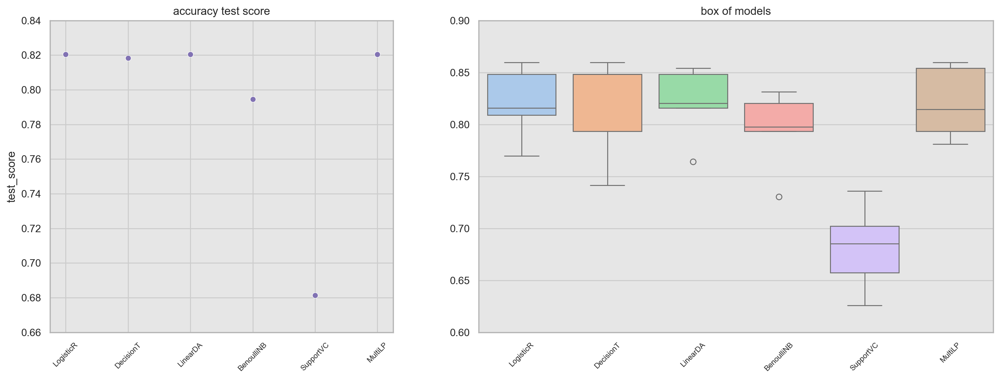

In [20]:
plt.figure(figsize=(18, 6))
gs = gridspec.GridSpec(nrows=1, ncols=2, width_ratios=[8, 12])

plt.subplot(gs[0])
g1 = sns.scatterplot(
        data=result_df_1,
        x=result_df_1.index,
        y="test_score",
        color="m",
)
g1.set(title="accuracy test score", ylim=(0.66, 0.84), xlabel="")
g1.set_xticks(ticks=range(len(result_df_1.index)), labels=result_df_1.index, rotation=45, fontsize=8) 

plt.subplot(gs[1])
g2 = sns.boxplot(
    data=test_scores,
)
g2.set(title="box of models", ylim=(0.60, 0.90), xlabel="")
g2.set_xticks(ticks=range(len(test_scores.columns)), labels=test_scores.columns, rotation=45, fontsize=8) ;

### pipeline modeling
- Pipeline을 사용한 model fitting process 구조화
   - 2개의 transformer
      - cat_transformer : OneHotEncoder, OrdinalEncoder (categorical features)
      - num_transformer : StandardScaler (numeric features)
   - clf_feature_preprocessor : ColumnTransformer을 사용하여 2개의 transformer을 연결
   - clf_feature_tech : feature engineering과 관련된 패키지 저장
      - feature_interaction : PolynomialFeatures
      - feature_select : VarianceThreshold
   - clf_feature_engeineering : clf_feature_tech와 clf_feature_preprocessor를 연결
   - model_ilnk : 개별 모형 객체 저장한 pipeline
      - lr, dt, lda, bnb, svc, mlp
   - model_pipe : model_link의 개별모형과 clf_feature_engineering을 연결

In [18]:
cat_transformer = Pipeline(
    steps=[
        ("onehot", OneHotEncoder()),
        ("ordinal", OrdinalEncoder())
    ]
)

num_transformer = Pipeline(
    steps=[
        ("scaler", StandardScaler())
    ]
)

clf_feature_preprocessor = ColumnTransformer(
    transformers=[
        ("cat_transformer", cat_transformer["onehot"], cat_features),
        ("num_transformer", num_transformer, num_features)
    ], remainder="passthrough"
)

clf_feature_tech = Pipeline(
    steps=[
        ("feature_interaction", PolynomialFeatures(degree=2, interaction_only=True, include_bias=False)),
        ("feature_select", VarianceThreshold())
    ]
)

clf_feature_engineering = Pipeline(
    steps=[
        ("preprocessor", clf_feature_preprocessor),
        ("feature_tech", clf_feature_tech)
    ]
)

model_link = Pipeline(
    steps=[
        ("lr", LogisticRegression(solver="liblinear")), 
        ("dt", DecisionTreeClassifier(max_depth=3)), 
        ("lda", LinearDiscriminantAnalysis()), 
        ("bnb", BernoulliNB()),
        ("svc", SVC()),
        ("mlp", MLPClassifier())
    ]
)

model_pipe = Pipeline(
    steps=[
        ("engineering", clf_feature_engineering),
        ("model", model_link["lr"])
    ]
)

model_pipe

Pipeline(steps=[('engineering',
                 Pipeline(steps=[('preprocessor',
                                  ColumnTransformer(remainder='passthrough',
                                                    transformers=[('cat_transformer',
                                                                   OneHotEncoder(),
                                                                   ['Pclass',
                                                                    'generation',
                                                                    'title_name',
                                                                    'Embarked',
                                                                    'Sex']),
                                                                  ('num_transformer',
                                                                   Pipeline(steps=[('scaler',
                                                                                    StandardScaler())]),
                                                                   ['Age',
                                                                    'Fare',
                                                                    'SibSp',
                                                                    'Parch'])])),
                                 ('feature_tech',
                                  Pipeline(steps=[('feature_interaction',
                                                   PolynomialFeatures(include_bias=False,
                                                                      interaction_only=True)),
                                                  ('feature_select',
                                                   VarianceThreshold())]))])),
                ('model', LogisticRegression(solver='liblinear'))])

### 모델 전체를 CV + Model_Pipe fitting 하기

In [19]:
pipe_model_names = [n + "_pipe" for n in model_names]
pipe_model_names

['LogisticR_pipe',
 'DecisionT_pipe',
 'LinearDA_pipe',
 'BenoulliNB_pipe',
 'SupportVC_pipe',
 'MultiLP_pipe']

In [20]:
import time

In [21]:
def setting_pipe(idx) : 
    
    '''
    cv_pipe() 함수의 반복문에서 idx 파라미터를 받아 model_pipe에서 사용할 모델을 변경한다.
    '''
    
    model_pipe.set_params(model=model_link[idx])
    
    return model_pipe

def cv_pipe(X, y, pipe_model_names) :
    
    '''
    model_pipe에 모형을 업데이트하여 get_cv_result() 함수에서 fitting한 후 성능지표를 반환한다.
    '''
    
    metrics_df = pd.DataFrame()
    test_accs_df = pd.DataFrame()
    print("~~~~ model fitting start ~~~~")
    for idx, model_name in enumerate(pipe_model_names) : 
        tic = time.time()
        now_model_pipe = setting_pipe(idx)
        mean_metrics_df, accs = get_cv_result(X, y, [now_model_pipe], [model_name])
        print(f"{model_name} done in : {time.time() - tic:.3f} s")
        
        temp_accs = pd.DataFrame(accs[0][1], columns=[model_name])
        metrics_df = pd.concat([metrics_df, mean_metrics_df], axis=0)
        test_accs_df = pd.concat([test_accs_df, temp_accs], axis=1)
        
    return metrics_df, test_accs_df

#### MLPClassifier는 max_iter의 값이 충분히 높지 않은 경우 예측가중치가 최적화 되지 않는다.

In [25]:
model_link["mlp"].set_params(max_iter=600)
model_link

Pipeline(steps=[('lr', LogisticRegression(solver='liblinear')),
                ('dt', DecisionTreeClassifier(max_depth=3)),
                ('lda', LinearDiscriminantAnalysis()), ('bnb', BernoulliNB()),
                ('svc', SVC()), ('mlp', MLPClassifier(max_iter=600))])

In [26]:
model_pipe_metrics, model_pipe_accs = cv_pipe(X, y_enc, pipe_model_names)

~~~~ model fitting start ~~~~
LogisticR_pipe done in : 0.406 s
DecisionT_pipe done in : 0.314 s
LinearDA_pipe done in : 0.477 s
BenoulliNB_pipe done in : 0.331 s
SupportVC_pipe done in : 0.886 s
MultiLP_pipe done in : 18.016 s


In [27]:
model_pipe_metrics

,train_score,test_score,pre_score,recall_score,f1_score
model,,,,,
LogisticR_pipe,0.857463,0.819340,0.822739,0.683746,0.743826
DecisionT_pipe,0.832492,0.818197,0.784863,0.725230,0.753210
LinearDA_pipe,0.863634,0.814833,0.816732,0.674496,0.735800
BenoulliNB_pipe,0.805275,0.797966,0.728940,0.751205,0.739163
SupportVC_pipe,0.849608,0.829439,0.818343,0.718170,0.764546
MultiLP_pipe,0.916385,0.789034,0.732820,0.691499,0.708047


#### svc 모델은 get_cv_result()에서만 실험한 것과 model_pipe와 get_cv_result()를 연결한 경우 결과가 크게 다르다.

In [28]:
result_df_1.iloc[4]["test_score"], model_pipe_metrics.iloc[4]["test_score"]

(0.6813194400853682, 0.8294394576611637)

In [29]:
model_pipe_accs

,LogisticR_pipe,DecisionT_pipe,LinearDA_pipe,BenoulliNB_pipe,SupportVC_pipe,MultiLP_pipe
0,0.787709,0.804469,0.798883,0.810056,0.798883,0.759777
1,0.853933,0.837079,0.831461,0.820225,0.865169,0.786517
2,0.853933,0.853933,0.848315,0.820225,0.870787,0.853933
3,0.780899,0.752809,0.775281,0.730337,0.769663,0.747191
4,0.820225,0.842697,0.820225,0.808989,0.842697,0.797753


### 현재 실험에서 성능이 가장 좋은 모델은?
- 모델의 기본 파라미터를 사용하여 pipline과 cv를 기반으로 실험한 결과 svc 모델의 성능이 가장 높게 나왔다. 그러나 svc 모델의 성능 지표의 분산이 가장 큰 단점이 있다. 
   - 이러한 경우 모델 성능의 분산을 줄이기 위한 다른 방법을 추가할 수 있다. 
   - feature select를 다른 방법 적용
   - nested cv(중첩 cv) 방법 적용
   - 모델의 파라미터 조절
- 모형 최적화를 하기 전에 개별 모델별 중요 파라미터를 조절하여 실험 해 보는 것이 좋을 것 같다.   

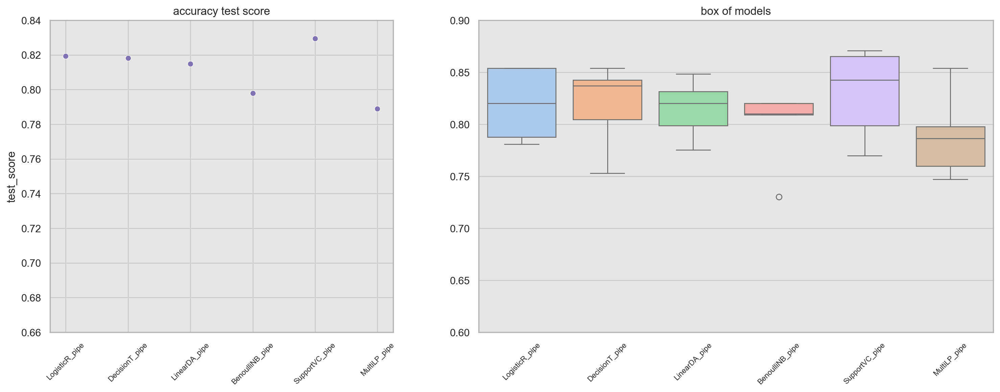

In [30]:
plt.figure(figsize=(18, 6))
gs = gridspec.GridSpec(nrows=1, ncols=2, width_ratios=[8, 12])

plt.subplot(gs[0])
g1 = sns.scatterplot(
        data=model_pipe_metrics,
        x=model_pipe_metrics.index,
        y="test_score",
        color="m",
)
g1.set(title="accuracy test score", ylim=(0.66, 0.84), xlabel="")
g1.set_xticks(ticks=range(len(model_pipe_metrics.index)), labels=model_pipe_metrics.index, rotation=45, fontsize=8) 

plt.subplot(gs[1])
g2 = sns.boxplot(
    data=model_pipe_accs,
    palette="pastel",
)
g2.set(title="box of models", ylim=(0.60, 0.90))
g2.set_xticks(ticks=range(len(model_pipe_accs.columns)), labels=model_pipe_accs.columns, rotation=45, fontsize=8) ;

### 현재 실험에서의 모델별 test_score와 분산
- svc 모델의 test_score가 가장 높고, 분산도 가장 높다. 모델의 test_score의 분산이 크면 성능이 일정하지 않을 수 있다는 것을 의미한다.
- dt 모델도 분산이 높다.

In [22]:
def get_test_std_df(result_df, test_scores) : 
    
    '''
    모델별 cv에서 5번의 epoch에서 반환 된 test accuracy의 평균과 분산 데이터 프레임을 반환한다.
    '''
    df = pd.concat([result_df["test_score"], test_scores.std(axis=0)], axis=1)\
        .rename(columns={0:"std"})\
        .sort_values("test_score", ascending=False)\
        .style.background_gradient(cmap="viridis_r", axis=0, subset=["test_score", "std"])
    
    return df

In [32]:
get_test_std_df(model_pipe_metrics, model_pipe_accs)

,test_score,std
SupportVC_pipe,0.829439,0.043786
LogisticR_pipe,0.819340,0.034901
DecisionT_pipe,0.818197,0.040920
LinearDA_pipe,0.814833,0.028484
BenoulliNB_pipe,0.797966,0.038185
MultiLP_pipe,0.789034,0.041536


### Pipeline에 사용 된 학습 데이터의 feature 갯수 변화
- 처음 5개의 범주형 변수가 model_pipe에서 fitted 되면서 249개의 feature로 변화했다는 것을 알 수 있다.
   - (categorical features -> OneHotEncoder) + numeric features -> PolynomialFeatures -> VarianceThreshold 

In [33]:
# list type의 데이터에서 bool을 사용한 인덱싱을 할 수 있다.

from itertools import compress

In [34]:
cat_features_enc = list(cat_transformer["onehot"].fit(X[cat_features]).get_feature_names_out(cat_features))
feature_ext = cat_features_enc + num_features
poly_features = model_pipe["engineering"]["feature_tech"]["feature_interaction"].get_feature_names_out(feature_ext)
varthr_support = model_pipe["engineering"]["feature_tech"]["feature_select"].get_support()
model_pipe_features = list(compress(data=poly_features, selectors=varthr_support))

print(f'''
~~~~~ feature engineering process ~~~~~
origin cat features : {len(cat_features)}
onehot encoded cat features : {len(cat_features_enc)}
num + cat enc features : {len(feature_ext)}
inter action features(Polynomial) : {len(poly_features)}
feature select(Variance) : {varthr_support.sum()}
final features : {len(model_pipe_features)}
''')


~~~~~ feature engineering process ~~~~~
origin cat features : 5
onehot encoded cat features : 22
num + cat enc features : 26
inter action features(Polynomial) : 351
feature select(Variance) : 249
final features : 249



### pipe line 실험 model save

In [25]:
def save_model(dir_path, save_model, model_name) : 
    
    os.makedirs(dir_path, exist_ok=True)
    full_path = dir_path + "/" + model_name + ".pkl"
    
    pickle.dump(save_model, open(full_path, 'wb'))
    
    # 저장한 모델을 불러온 후 모델의 params의 갯수를 확인
    load_model = pickle.load(open(full_path, "rb"))
    if len(load_model["model"].get_params()) > 1 : 
        print(f"{model_name} save success.")

In [150]:
dir_path = "./build_model"

for i, name in enumerate(pipe_model_names) : 
    temp_model = model_pipe.set_params(model=model_link[i])
    save_model(dir_path, temp_model, name)    

LogisticR_pipe save success.
DecisionT_pipe save success.
LinearDA_pipe save success.
BenoulliNB_pipe save success.
SupportVC_pipe save success.
MultiLP_pipe save success.


### (2) 개별 모형 Hyper Parameter Tunning 
- 개별 모형별 수학적 원리 및 작동 방식의 특징을 이용한 하이퍼 파라미터 튜닝
   - pipe line의 속성값을 변경하여 튜닝 과정에서 변경할 사항들을 업데이트
- 하이퍼 파라미터 튜닝 과정에서 best model을 선별하여 cross validate 실험 후 test score, std score를 비교한다.

### 개별 모형 modeling (2) - 1 : LogisticRegression
- LogisticRegression 모델
   - 로지스틱 회귀 모델은 확률론적 판별 모델로 판별 함수(z=w^Tx)를 변수로 갖는 로지스틱함수의 부호를 통해서 y^값을 결정하는 모델이다.
   - 분류 문제가 2개의 클래스를 갖는 경우 베르누이 확률밀도함수를 로그가능도를 사용하여 목적함수를 도출하고 이 목적함수를 최소화하는 w 벡터를 구하기위해 최적화하는 방식이다.
- LogisticRegression fitting tips.
   - solver 파라미터 : 목적함수를 최적화하는 방법 설정 
      - 작은 규모의 데이터 셋은 liblinear 가 적당
      - 큰 규모의 데이터 셋은 saga 가 적당
   - lr 모델은 클래스 0을 네거티브로 인식한다. 클래스 0이 많으면 잘 못된 모델이 될 수 있다. 
      - 이러한 경우 fit_intercept=True, intercept_scaling(solver=liblinear에서만 사용) 값을 늘린다.
      - intercept_scaling은 l1, l2 정규화 파라미터와 곱해져서 intercept에 적용된다.
   - class_weight : class 별 가중치 설정 : default는 None, "balanced"로 설정하면 클래스의 비중이 같아진다.
   - max_iter : solver가 수렴하는데 걸리는 최대 반복횟수
   - sklearn.linear_model.LogisticRegression docs 참조
- model_pipe에서 encoding 하므로 encoding 하지 않은 기본 학습 데이터 사용
- random_state 값을 적당하게 높여 주어야 범주형 feature의 유니크 데이터를 균형있게 분리한다.

In [24]:
X_train, X_test, y_train, y_test = train_test_split(X, y_enc, test_size=0.2, shuffle=True, stratify=y_enc, random_state=50)

In [36]:
%%time

model_link.set_params(lr=LogisticRegression(solver="liblinear", fit_intercept=True, intercept_scaling=0.3, class_weight="balanced", max_iter=300))
model_pipe.set_params(model=model_link["lr"])
model_pipe.fit(X_train, y_train)

CPU times: total: 15.6 ms
Wall time: 22 ms


Pipeline(steps=[('engineering',
                 Pipeline(steps=[('preprocessor',
                                  ColumnTransformer(remainder='passthrough',
                                                    transformers=[('cat_transformer',
                                                                   OneHotEncoder(),
                                                                   ['Pclass',
                                                                    'Sex',
                                                                    'Embarked',
                                                                    'title_name',
                                                                    'generation']),
                                                                  ('num_transformer',
                                                                   Pipeline(steps=[('scaler',
                                                                                    StandardScaler())]),
                                                                   ['Age',
                                                                    'Fare',
                                                                    'SibSp',
                                                                    'Parch'])])),
                                 ('feature_tech',
                                  Pipeline(steps=[('feature_interaction',
                                                   PolynomialFeatures(include_bias=False,
                                                                      interaction_only=True)),
                                                  ('feature_select',
                                                   VarianceThreshold())]))])),
                ('model',
                 LogisticRegression(class_weight='balanced',
                                    intercept_scaling=0.3, max_iter=300,
                                    solver='liblinear'))])

In [37]:
y_pred_train = model_pipe.predict(X_train)
y_pred_test = model_pipe.predict(X_test)

print("train acc : {}".format(accuracy_score(y_train, y_pred_train)))
print("test acc : {}".format(accuracy_score(y_test, y_pred_test)))

train acc : 0.8441011235955056
test acc : 0.8435754189944135


In [38]:
print(classification_report(y_test, y_pred_test))

              precision    recall  f1-score   support

           0       0.86      0.89      0.88       110
           1       0.82      0.77      0.79        69

    accuracy                           0.84       179
   macro avg       0.84      0.83      0.83       179
weighted avg       0.84      0.84      0.84       179



### cross_validate + model_pipe=lr
- model_pipe를 LosigticRegression() 모델로 셋팅 한 후 cross_validate 매서드로 실험

In [39]:
%%time

result_lr_pipe_cv, accs_lr_pipe_cv = get_cv_result(X, y_enc, [model_pipe], ["LosgisticR_pipe_cv"])

CPU times: total: 1.39 s
Wall time: 356 ms


In [40]:
result_df = pd.concat([model_pipe_metrics, result_lr_pipe_cv], axis=0)
result_df

,train_score,test_score,pre_score,recall_score,f1_score
model,,,,,
LogisticR_pipe,0.857463,0.819340,0.822739,0.683746,0.743826
DecisionT_pipe,0.832492,0.818197,0.784863,0.725230,0.753210
LinearDA_pipe,0.863634,0.814833,0.816732,0.674496,0.735800
BenoulliNB_pipe,0.805275,0.797966,0.728940,0.751205,0.739163
SupportVC_pipe,0.849608,0.829439,0.818343,0.718170,0.764546
MultiLP_pipe,0.916385,0.789034,0.732820,0.691499,0.708047
LosgisticR_pipe_cv,0.854658,0.815950,0.774596,0.738183,0.754394


In [41]:
test_scores = model_pipe_accs
test_scores["LosgisticR_pipe_cv"] = accs_lr_pipe_cv[0][1]
test_scores

,LogisticR_pipe,DecisionT_pipe,LinearDA_pipe,BenoulliNB_pipe,SupportVC_pipe,MultiLP_pipe,LosgisticR_pipe_cv
0,0.787709,0.804469,0.798883,0.810056,0.798883,0.759777,0.804469
1,0.853933,0.837079,0.831461,0.820225,0.865169,0.786517,0.837079
2,0.853933,0.853933,0.848315,0.820225,0.870787,0.853933,0.859551
3,0.780899,0.752809,0.775281,0.730337,0.769663,0.747191,0.775281
4,0.820225,0.842697,0.820225,0.808989,0.842697,0.797753,0.803371


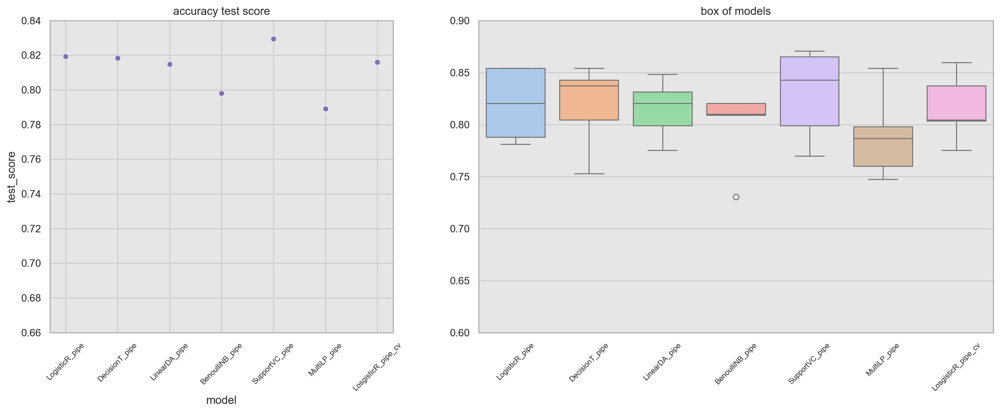

In [42]:
plt.figure(figsize=(18, 6))
# subplot의 가로 비율 설정 (세로 비율은 height_ratios)
gs = gridspec.GridSpec(nrows=1, ncols=2, width_ratios=[8, 12])

plt.subplot(gs[0])
g1 = sns.scatterplot(
        data=result_df,
        x=result_df.index,
        y="test_score",
        color="m",
)
g1.set(title="accuracy test score", ylim=(0.66, 0.84))
g1.set_xticks(ticks=range(len(result_df.index)), labels=result_df.index, rotation=45, fontsize=8) 

plt.subplot(gs[1])
g2 = sns.boxplot(
    data=test_scores,
)
g2.set(title="box of models", ylim=(0.60, 0.90))
g2.set_xticks(ticks=range(len(test_scores.columns)), labels=test_scores.columns, rotation=45, fontsize=8) ;

### lr_pipe 모델의 예측 가중치 : coef
- model 객체인 LogisticRegression()은 각 feature별 coef의 traget에 대한 영향력을 확인 할 수 있다.

In [43]:
# 양수 coef의 top 5와 음수 coef의 top 5를 합하여 top 10 coef features df 생성

pos_5_coef = list(model_pipe["model"].coef_.argsort()[::-1][0][:5])
neg_5_coef = list(model_pipe["model"].coef_.argsort()[::-1][0][-5:])
top_10_coef_idx = pos_5_coef + neg_5_coef

top_10_coefs = model_pipe["model"].coef_[0][top_10_coef_idx][::-1]
top_10_features = np.array(model_pipe_features)[top_10_coef_idx]

top_10_coefs_features_df = pd.DataFrame({"col": top_10_features, "coef": top_10_coefs})
top_10_coefs_features_df.style.background_gradient(cmap="viridis_r", axis=0, subset=["coef"])

,col,coef
0,Pclass_3 Parch,1.182749
1,Age Parch,0.945904
2,Embarked_C Age,0.699139
3,Pclass_1 Fare,0.679364
4,generation_children Fare,0.679364
5,title_name_Master,-0.737766
6,Sex_male title_name_Master,-0.742200
7,Embarked_Q title_name_Miss,-0.766490
8,Age Fare,-0.766946
9,Pclass_3 Fare,-0.791249


### GridSearchCV를 사용한 lr_pipe의 하이퍼 파라미터 튜닝 - (1)
- 작은 규모의 데이터셋에 적합한 solver="liblinear"를 먼저 실험한 후 다른 solver들을 실험 한다. 
   - liblinear은 다른 solver들과 달리 연계하여 사용할 수 있는 parameter가 다르기 때문이다.   
- solver="liblinear"
   - penalty="l1" 일때 "l2"보다 대다수 model의 test score가 높다.
   - max_iter는 100~200 사이일때 대다수 test score가 높다.
   - high test score 는 0.827390 이다.

In [44]:
lr_pipe = model_pipe
lr_pipe.set_params(model=LogisticRegression())

Pipeline(steps=[('engineering',
                 Pipeline(steps=[('preprocessor',
                                  ColumnTransformer(remainder='passthrough',
                                                    transformers=[('cat_transformer',
                                                                   OneHotEncoder(),
                                                                   ['Pclass',
                                                                    'Sex',
                                                                    'Embarked',
                                                                    'title_name',
                                                                    'generation']),
                                                                  ('num_transformer',
                                                                   Pipeline(steps=[('scaler',
                                                                                    StandardScaler())]),
                                                                   ['Age',
                                                                    'Fare',
                                                                    'SibSp',
                                                                    'Parch'])])),
                                 ('feature_tech',
                                  Pipeline(steps=[('feature_interaction',
                                                   PolynomialFeatures(include_bias=False,
                                                                      interaction_only=True)),
                                                  ('feature_select',
                                                   VarianceThreshold())]))])),
                ('model', LogisticRegression())])

#### solver="liblinear" 테스트 (1)
- fit_intercept=True 인 경우 intercept_scaling 값은 0보다 큰 값이어야 한다.

In [45]:
%%time

g_params = {
    "model__solver": ["liblinear"],
    "model__max_iter": [i for i in range(100, 301, 50)],
    "model__fit_intercept": [True],
    "model__intercept_scaling": [i for i in np.linspace(0.1, 1, 20)],
    "model__penalty": ["l1", "l2"],
}
cv = KFold(n_splits=5, shuffle=True, random_state=50)
lr_gscv_1 = GridSearchCV(estimator=lr_pipe, param_grid=g_params, cv=cv, scoring="accuracy", return_train_score=True, n_jobs=2)
lr_gscv_1.fit(X, y_enc)

CPU times: total: 2.72 s
Wall time: 33 s


GridSearchCV(cv=KFold(n_splits=5, random_state=50, shuffle=True),
             estimator=Pipeline(steps=[('engineering',
                                        Pipeline(steps=[('preprocessor',
                                                         ColumnTransformer(remainder='passthrough',
                                                                           transformers=[('cat_transformer',
                                                                                          OneHotEncoder(),
                                                                                          ['Pclass',
                                                                                           'Sex',
                                                                                           'Embarked',
                                                                                           'title_name',
                                                                                           'generation']),
                                                                                         ('num_transformer',
                                                                                          Pipeline(steps=[('scaler',
                                                                                                           StandardScaler())]),
                                                                                          ['A...
                                                      0.4789473684210527,
                                                      0.5263157894736842,
                                                      0.5736842105263158,
                                                      0.6210526315789474,
                                                      0.6684210526315789,
                                                      0.7157894736842105,
                                                      0.7631578947368421,
                                                      0.8105263157894737,
                                                      0.8578947368421053,
                                                      0.9052631578947369,
                                                      0.9526315789473684, 1.0],
                         'model__max_iter': [100, 150, 200, 250, 300],
                         'model__penalty': ['l1', 'l2'],
                         'model__solver': ['liblinear']},
             return_train_score=True, scoring='accuracy')

In [90]:
def draw_color_cell(x, color) : 
    
    color = f'background-color:{color}' #font_size: {font_size}, font_color: {font_color} 등 추가 설정가능
    return color

In [47]:
result_lr_gscv_1 = pd.DataFrame(lr_gscv_1.cv_results_).sort_values("rank_test_score")
cols = list(result_lr_gscv_1.filter(regex="^param_model").columns) + ["mean_test_score", "mean_train_score", "std_test_score", "rank_test_score"]
result_lr_gscv_1[cols][:10].style.applymap(draw_color_cell, color="#ffd700", subset=(result_lr_gscv_1.index[0]))

,param_model__fit_intercept,param_model__intercept_scaling,param_model__max_iter,param_model__penalty,param_model__solver,mean_test_score,mean_train_score,std_test_score,rank_test_score
0,True,0.100000,100,l1,liblinear,0.822704,0.852974,0.030462,1
90,True,0.526316,100,l1,liblinear,0.822704,0.852974,0.030462,1
154,True,0.810526,200,l1,liblinear,0.822704,0.852974,0.030462,1
86,True,0.478947,250,l1,liblinear,0.822704,0.852974,0.030462,1
84,True,0.478947,200,l1,liblinear,0.822704,0.852693,0.030462,1
156,True,0.810526,250,l1,liblinear,0.822704,0.852693,0.030462,1
82,True,0.478947,150,l1,liblinear,0.822704,0.852974,0.030462,1
80,True,0.478947,100,l1,liblinear,0.822704,0.852974,0.030462,1
78,True,0.431579,300,l1,liblinear,0.822704,0.852974,0.030462,1
76,True,0.431579,250,l1,liblinear,0.822704,0.852693,0.030462,1


### GridSearchCV를 사용한 lr_pipe의 하이퍼 파라미터 튜닝 - (2)
- intercept_scaling의 값을 1~5 사이의 값을 추가하여 테스트

In [48]:
%%time

g_params = {
    "model__solver": ["liblinear"],
    "model__max_iter": [i for i in range(100, 301, 50)],
    "model__fit_intercept": [True],
    "model__intercept_scaling": [i for i in np.linspace(0, 1, 20)][1:] + [i for i in np.linspace(1, 6, 10)][1:],
    "model__penalty": ["l1", "l2"],
}
cv = KFold(n_splits=5, shuffle=True, random_state=50)
lr_gscv_2 = GridSearchCV(estimator=lr_pipe, param_grid=g_params, cv=cv, scoring="accuracy", return_train_score=True, n_jobs=2)
lr_gscv_2.fit(X, y_enc)

CPU times: total: 4.11 s
Wall time: 43.2 s


GridSearchCV(cv=KFold(n_splits=5, random_state=50, shuffle=True),
             estimator=Pipeline(steps=[('engineering',
                                        Pipeline(steps=[('preprocessor',
                                                         ColumnTransformer(remainder='passthrough',
                                                                           transformers=[('cat_transformer',
                                                                                          OneHotEncoder(),
                                                                                          ['Pclass',
                                                                                           'Sex',
                                                                                           'Embarked',
                                                                                           'title_name',
                                                                                           'generation']),
                                                                                         ('num_transformer',
                                                                                          Pipeline(steps=[('scaler',
                                                                                                           StandardScaler())]),
                                                                                          ['A...
                                                      0.8421052631578947,
                                                      0.894736842105263,
                                                      0.9473684210526315, 1.0,
                                                      1.5555555555555556,
                                                      2.111111111111111,
                                                      2.666666666666667,
                                                      3.2222222222222223,
                                                      3.7777777777777777,
                                                      4.333333333333334,
                                                      4.888888888888889,
                                                      5.444444444444445, 6.0],
                         'model__max_iter': [100, 150, 200, 250, 300],
                         'model__penalty': ['l1', 'l2'],
                         'model__solver': ['liblinear']},
             return_train_score=True, scoring='accuracy')

In [49]:
result_lr_gscv_2 = pd.DataFrame(lr_gscv_2.cv_results_).sort_values("rank_test_score")
cols = list(result_lr_gscv_2.filter(regex="^param_model").columns) + ["mean_test_score", "mean_train_score", "std_test_score", "rank_test_score"]
result_lr_gscv_2[cols][:10].style.applymap(draw_color_cell, color="#ffd700", subset=(result_lr_gscv_2.index[0]))

,param_model__fit_intercept,param_model__intercept_scaling,param_model__max_iter,param_model__penalty,param_model__solver,mean_test_score,mean_train_score,std_test_score,rank_test_score
0,True,0.052632,100,l1,liblinear,0.822704,0.852974,0.030462,1
216,True,2.666667,250,l1,liblinear,0.822704,0.852974,0.030462,1
122,True,0.684211,150,l1,liblinear,0.822704,0.852974,0.030462,1
120,True,0.684211,100,l1,liblinear,0.822704,0.852974,0.030462,1
218,True,2.666667,300,l1,liblinear,0.822704,0.852974,0.030462,1
118,True,0.631579,300,l1,liblinear,0.822704,0.852693,0.030462,1
116,True,0.631579,250,l1,liblinear,0.822704,0.852693,0.030462,1
220,True,3.222222,100,l1,liblinear,0.822704,0.852974,0.030462,1
114,True,0.631579,200,l1,liblinear,0.822704,0.852974,0.030462,1
112,True,0.631579,150,l1,liblinear,0.822704,0.852693,0.030462,1


### GridSearchCV를 사용한 lr_pipe의 하이퍼 파라미터 튜닝 - (3)
- lbfgs, sag, saga는 최적의 coef값을 찾기 위해 GD 방법을 사용하는데 max_iter의 값이 크지 않으면 coef 값이 최적화 되지 않는 문제가 발생한다.
- 이러한 경우 max_iter값을 최대한 높게 설정한 후 C 파라미터 값을 튜닝하는 것을 권하는 solution을 참고함
   - https://stackoverflow.com/questions/52670012/convergencewarning-liblinear-failed-to-converge-increase-the-number-of-iterati
- 파라미터 C는 penalty=["l1", "l2"] 일 때 사용가능하다.  

In [50]:
%%time

g_params = {
    "model__solver": ["lbfgs", "newton-cg", "sag", "saga"],
    "model__C": np.logspace(-3, 1, 20),
    "model__max_iter": [8000],
    "model__penalty": ["l1", "l2"]
}
cv = KFold(n_splits=5, shuffle=True, random_state=50)
lr_gscv_3 = GridSearchCV(estimator=lr_pipe, param_grid=g_params, cv=cv, scoring="accuracy", return_train_score=True, n_jobs=2)
lr_gscv_3.fit(X, y_enc)

CPU times: total: 688 ms
Wall time: 4min 11s


GridSearchCV(cv=KFold(n_splits=5, random_state=50, shuffle=True),
             estimator=Pipeline(steps=[('engineering',
                                        Pipeline(steps=[('preprocessor',
                                                         ColumnTransformer(remainder='passthrough',
                                                                           transformers=[('cat_transformer',
                                                                                          OneHotEncoder(),
                                                                                          ['Pclass',
                                                                                           'Sex',
                                                                                           'Embarked',
                                                                                           'title_name',
                                                                                           'generation']),
                                                                                         ('num_transformer',
                                                                                          Pipeline(steps=[('scaler',
                                                                                                           StandardScaler())]),
                                                                                          ['A...
       6.95192796e-03, 1.12883789e-02, 1.83298071e-02, 2.97635144e-02,
       4.83293024e-02, 7.84759970e-02, 1.27427499e-01, 2.06913808e-01,
       3.35981829e-01, 5.45559478e-01, 8.85866790e-01, 1.43844989e+00,
       2.33572147e+00, 3.79269019e+00, 6.15848211e+00, 1.00000000e+01]),
                         'model__max_iter': [8000],
                         'model__penalty': ['l1', 'l2'],
                         'model__solver': ['lbfgs', 'newton-cg', 'sag',
                                           'saga']},
             return_train_score=True, scoring='accuracy')

In [51]:
result_lr_gscv_3 = pd.DataFrame(lr_gscv_3.cv_results_).sort_values("rank_test_score")
cols = list(result_lr_gscv_3.filter(regex="^param_model").columns) + ["mean_fit_time", "mean_test_score", "mean_train_score", "std_test_score", "rank_test_score"]
result_lr_gscv_3[cols][:10].style.applymap(draw_color_cell, color="#ffd700", subset=(result_lr_gscv_3.index[0]))

,param_model__C,param_model__max_iter,param_model__penalty,param_model__solver,mean_fit_time,mean_test_score,mean_train_score,std_test_score,rank_test_score
62,0.029764,8000,l2,sag,0.278609,0.832785,0.840630,0.031784,1
61,0.029764,8000,l2,newton-cg,0.038200,0.832785,0.840630,0.031784,1
60,0.029764,8000,l2,lbfgs,0.029802,0.832785,0.840630,0.031784,1
63,0.029764,8000,l2,saga,0.517002,0.831662,0.840911,0.033830,4
99,0.335982,8000,l1,saga,2.972409,0.831662,0.843997,0.028125,5
71,0.048329,8000,l2,saga,0.599999,0.831655,0.844277,0.033490,6
70,0.048329,8000,l2,sag,0.372001,0.830538,0.844277,0.033725,7
69,0.048329,8000,l2,newton-cg,0.046800,0.830538,0.844276,0.033725,7
68,0.048329,8000,l2,lbfgs,0.029801,0.830538,0.844276,0.033725,7
79,0.078476,8000,l2,saga,0.691402,0.829427,0.850170,0.032551,10


### GridSearchCV로 실험한 LDA 모델 중 best 모델을 사용하여 cv 테스트
- max_iter의 값을 크게 높이고 C 파라미터의 값을 조절한 solver="lbfgs" 모델의 성능이 가장 좋다.

In [74]:
lr_gscv_best = pd.DataFrame(lr_gscv_1.best_params_, index=range(1)).assign(model="lr_gscv_best")
lr_gscv_2_best = pd.DataFrame(lr_gscv_2.best_params_, index=range(1)).assign(model="lr_gscv_2_best")
lr_gscv_3_best = pd.DataFrame(lr_gscv_3.best_params_, index=range(1)).assign(model="lr_gscv_3_best")

lr_gscv_best_compare = pd.concat([lr_gscv_best, lr_gscv_2_best, lr_gscv_3_best], axis=0)
lr_gscv_best_compare
lr_gscv_best_compare["test_score"] = [lr_gscv_1.best_score_, lr_gscv_2.best_score_, lr_gscv_3.best_score_]
lr_gscv_best_compare\
    .fillna(0)\
    .sort_values("test_score", ascending=False)\
    .reset_index(drop=True)\
    .style.applymap(draw_color_cell, color="#ffd700", subset=(lr_gscv_best_compare.index[0]))

,model__fit_intercept,model__intercept_scaling,model__max_iter,model__penalty,model__solver,model,model__C,test_score
0,0,0.000000,8000,l2,lbfgs,lr_gscv_3_best,0.029764,0.832785
1,True,0.100000,100,l1,liblinear,lr_gscv_best,0.000000,0.822704
2,True,0.052632,100,l1,liblinear,lr_gscv_2_best,0.000000,0.822704


In [75]:
%%time

lr_gscv_best_model = lr_gscv_3.best_estimator_
result_lr_gscv_best, accs_lr_gscv_best = get_cv_result(X, y_enc, [lr_gscv_best_model], ["LogisticR_gscv_best"])

CPU times: total: 1.36 s
Wall time: 417 ms


In [76]:
result_df = pd.concat([result_df, result_lr_gscv_best], axis=0)
result_df

,train_score,test_score,pre_score,recall_score,f1_score
model,,,,,
LogisticR_pipe,0.857463,0.819340,0.822739,0.683746,0.743826
DecisionT_pipe,0.832492,0.818197,0.784863,0.725230,0.753210
LinearDA_pipe,0.863634,0.814833,0.816732,0.674496,0.735800
BenoulliNB_pipe,0.805275,0.797966,0.728940,0.751205,0.739163
SupportVC_pipe,0.849608,0.829439,0.818343,0.718170,0.764546
MultiLP_pipe,0.916385,0.789034,0.732820,0.691499,0.708047
LosgisticR_pipe_cv,0.854658,0.815950,0.774596,0.738183,0.754394
LogisticR_gscv_best,0.840630,0.832785,0.815822,0.731699,0.770646


In [77]:
test_scores["LogisticR_gscv_best"] = accs_lr_gscv_best[0][1]
test_scores

,LogisticR_pipe,DecisionT_pipe,LinearDA_pipe,BenoulliNB_pipe,SupportVC_pipe,MultiLP_pipe,LosgisticR_pipe_cv,LogisticR_gscv_best
0,0.787709,0.804469,0.798883,0.810056,0.798883,0.759777,0.804469,0.821229
1,0.853933,0.837079,0.831461,0.820225,0.865169,0.786517,0.837079,0.853933
2,0.853933,0.853933,0.848315,0.820225,0.870787,0.853933,0.859551,0.859551
3,0.780899,0.752809,0.775281,0.730337,0.769663,0.747191,0.775281,0.775281
4,0.820225,0.842697,0.820225,0.808989,0.842697,0.797753,0.803371,0.853933


### 모델 별 성능 비교

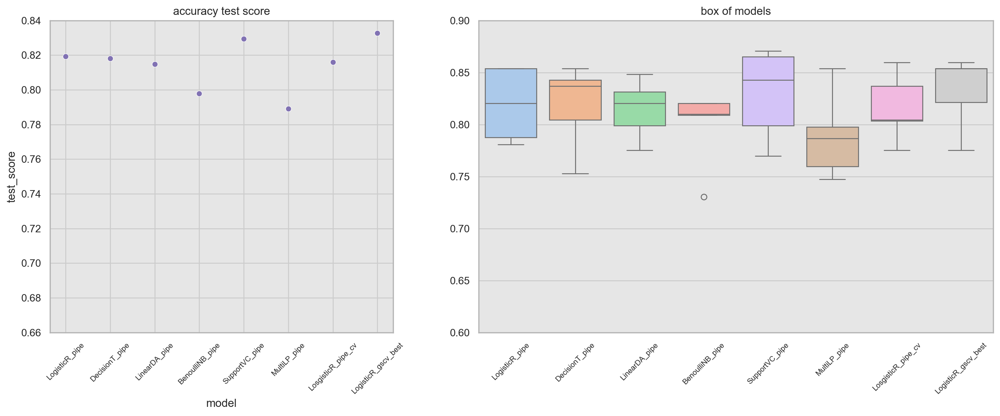

In [79]:
plt.figure(figsize=(18, 6))
# subplot의 가로 비율 설정 (세로 비율은 height_ratios)
gs = gridspec.GridSpec(nrows=1, ncols=2, width_ratios=[8, 12])

plt.subplot(gs[0])
g1 = sns.scatterplot(
        data=result_df,
        x=result_df.index,
        y="test_score",
        color="m",
)
g1.set(title="accuracy test score", ylim=(0.66, 0.84))
g1.set_xticks(ticks=range(len(result_df.index)), labels=result_df.index, rotation=45, fontsize=8) 

plt.subplot(gs[1])
g2 = sns.boxplot(
    data=test_scores,
    palette="pastel"
)
g2.set(title="box of models", ylim=(0.60, 0.90))
g2.set_xticks(ticks=range(len(test_scores.columns)), labels=test_scores.columns, rotation=45, fontsize=8) ;

In [80]:
get_test_std_df(result_df, test_scores)

,test_score,std
LogisticR_gscv_best,0.832785,0.035536
SupportVC_pipe,0.829439,0.043786
LogisticR_pipe,0.819340,0.034901
DecisionT_pipe,0.818197,0.040920
LosgisticR_pipe_cv,0.815950,0.032755
LinearDA_pipe,0.814833,0.028484
BenoulliNB_pipe,0.797966,0.038185
MultiLP_pipe,0.789034,0.041536


### best model save

In [152]:
dir_path = "./build_model"

save_model(dir_path, lr_gscv_best_model, "LogisticR_gscv_best")

LogisticR_gscv_best save success.


In [153]:
os.listdir(dir_path)

['.ipynb_checkpoints',
 'BenoulliNB_pipe.pkl',
 'DecisionT_pipe.pkl',
 'LinearDA_pipe.pkl',
 'LogisticR_gscv_best.pkl',
 'LogisticR_pipe.pkl',
 'MultiLP_pipe.pkl',
 'SupportVC_pipe.pkl']

### 개별 모형 modeling (2) - 2 : DecisionTreeClassifier
- DecisionTreeClassifier 모델은 각 노드에서 정보량이 가장 큰 feature의 분류 규칙을 선택하고 이 기준값에 따라서 다음 노드에 데이터 샘플을 전달하는 방식이다.
- 각 노드는 데이터 샘플에서 클래스별 조건부확률을 계산하고, 최종적으로 마지막 노드의 조건부 확률에 따라서 예측하게 된다.
- 이러한 특성에 따라서 여러 파라미터를 조정하여 모델의 성능을 변화시킬 수 있다. 
   - max_depth, min_samples_leaf, min_samples_split, criterion, class_weight 등의 값을 조절한다.

In [81]:
%%time

model_pipe.set_params(model=model_link["dt"])
model_pipe.fit(X_train, y_train)

CPU times: total: 0 ns
Wall time: 20 ms


Pipeline(steps=[('engineering',
                 Pipeline(steps=[('preprocessor',
                                  ColumnTransformer(remainder='passthrough',
                                                    transformers=[('cat_transformer',
                                                                   OneHotEncoder(),
                                                                   ['Pclass',
                                                                    'Sex',
                                                                    'Embarked',
                                                                    'title_name',
                                                                    'generation']),
                                                                  ('num_transformer',
                                                                   Pipeline(steps=[('scaler',
                                                                                    StandardScaler())]),
                                                                   ['Age',
                                                                    'Fare',
                                                                    'SibSp',
                                                                    'Parch'])])),
                                 ('feature_tech',
                                  Pipeline(steps=[('feature_interaction',
                                                   PolynomialFeatures(include_bias=False,
                                                                      interaction_only=True)),
                                                  ('feature_select',
                                                   VarianceThreshold())]))])),
                ('model', DecisionTreeClassifier(max_depth=3))])

In [82]:
y_pred_train = model_pipe.predict(X_train)
y_pred_test = model_pipe.predict(X_test)

print("dt train acc : {}".format(accuracy_score(y_train, y_pred_train)))
print("dt test acc : {}".format(accuracy_score(y_test, y_pred_test)))

dt train acc : 0.8300561797752809
dt test acc : 0.7988826815642458


In [83]:
print(classification_report(y_test, y_pred_test))

              precision    recall  f1-score   support

           0       0.82      0.85      0.84       110
           1       0.75      0.71      0.73        69

    accuracy                           0.80       179
   macro avg       0.79      0.78      0.79       179
weighted avg       0.80      0.80      0.80       179



### cross_validate + model_pipe=dt

In [84]:
%%time

model_link.set_params(dt=DecisionTreeClassifier(criterion="entropy", max_depth=3, splitter="best", min_samples_leaf=3))
model_pipe.set_params(model=model_link["dt"])
result_dt_pipe_cv, accs_dt_pipe_cv = get_cv_result(X, y_enc, [model_pipe], ["DecisionT_pipe_cv"])

CPU times: total: 219 ms
Wall time: 308 ms


In [85]:
result_df = pd.concat([result_df, result_dt_pipe_cv], axis=0)
result_df

,train_score,test_score,pre_score,recall_score,f1_score
model,,,,,
LogisticR_pipe,0.857463,0.819340,0.822739,0.683746,0.743826
DecisionT_pipe,0.832492,0.818197,0.784863,0.725230,0.753210
LinearDA_pipe,0.863634,0.814833,0.816732,0.674496,0.735800
BenoulliNB_pipe,0.805275,0.797966,0.728940,0.751205,0.739163
SupportVC_pipe,0.849608,0.829439,0.818343,0.718170,0.764546
MultiLP_pipe,0.916385,0.789034,0.732820,0.691499,0.708047
LosgisticR_pipe_cv,0.854658,0.815950,0.774596,0.738183,0.754394
LogisticR_gscv_best,0.840630,0.832785,0.815822,0.731699,0.770646
DecisionT_pipe_cv,0.829687,0.813734,0.790074,0.710094,0.742860


In [86]:
test_scores["DecisionT_pipe_cv"] = accs_dt_pipe_cv[0][1]
test_scores

,LogisticR_pipe,DecisionT_pipe,LinearDA_pipe,BenoulliNB_pipe,SupportVC_pipe,MultiLP_pipe,LosgisticR_pipe_cv,LogisticR_gscv_best,DecisionT_pipe_cv
0,0.787709,0.804469,0.798883,0.810056,0.798883,0.759777,0.804469,0.821229,0.776536
1,0.853933,0.837079,0.831461,0.820225,0.865169,0.786517,0.837079,0.853933,0.842697
2,0.853933,0.853933,0.848315,0.820225,0.870787,0.853933,0.859551,0.859551,0.853933
3,0.780899,0.752809,0.775281,0.730337,0.769663,0.747191,0.775281,0.775281,0.764045
4,0.820225,0.842697,0.820225,0.808989,0.842697,0.797753,0.803371,0.853933,0.831461


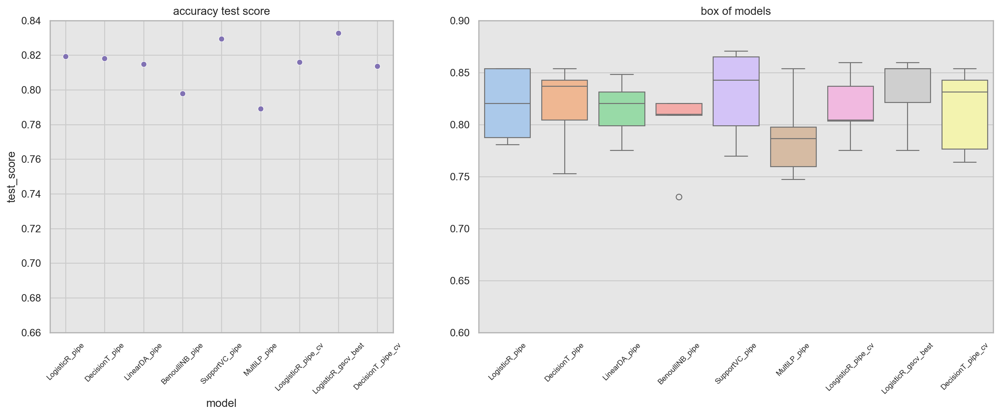

In [87]:
plt.figure(figsize=(18, 6))
gs = gridspec.GridSpec(nrows=1, ncols=2, width_ratios=[8, 12])

plt.subplot(gs[0])
g1 = sns.scatterplot(
        data=result_df,
        x=result_df.index,
        y="test_score",
        color="m",
)
g1.set(title="accuracy test score", ylim=(0.66, 0.84))
g1.set_xticks(ticks=range(len(result_df.index)), labels=result_df.index, rotation=45, fontsize=8) 

plt.subplot(gs[1])
g2 = sns.boxplot(
    data=test_scores,
)
g2.set(title="box of models", ylim=(0.60, 0.90))
g2.set_xticks(ticks=range(len(test_scores.columns)), labels=test_scores.columns, rotation=45, fontsize=8) ;

In [88]:
get_test_std_df(result_df, test_scores)

,test_score,std
LogisticR_gscv_best,0.832785,0.035536
SupportVC_pipe,0.829439,0.043786
LogisticR_pipe,0.819340,0.034901
DecisionT_pipe,0.818197,0.040920
LosgisticR_pipe_cv,0.815950,0.032755
LinearDA_pipe,0.814833,0.028484
DecisionT_pipe_cv,0.813734,0.040687
BenoulliNB_pipe,0.797966,0.038185
MultiLP_pipe,0.789034,0.041536


### GridSearchCV를 사용한 dt_pipe 하이퍼 파라미터 튜닝 - (1)
- max_depth, min_samples_leaf, min_samples_split 는 값이 크다고 좋은 것은 아니다.
   - max_depth가 커지면 과적합이 발생할 수 있다.
- 대체로 criterion은 entropy와 gini가 성능이 높은 편이다.
- DT 모델은 실험할 때마다 결과값이 달라지게 된다.

In [89]:
%%time

dt_pipe = model_pipe.set_params(model=DecisionTreeClassifier())

dt_params = {
    "model__max_depth": [i for i in range(1, 5)],
    "model__criterion": ["gini", "entropy", "log_loss"],
    "model__min_samples_leaf": [i for i in range(2, 10)],
    "model__min_samples_split": [i for i in range(2, 10)],
    "model__splitter": ["best", "random"],
    "model__class_weight": ["balanced", None]
}

cv = KFold(n_splits=5, shuffle=True, random_state=50)
dt_gscv_1 = GridSearchCV(estimator=dt_pipe, param_grid=dt_params, cv=cv, scoring="accuracy", return_train_score=True, n_jobs=2)
dt_gscv_1.fit(X, y_enc)

CPU times: total: 891 ms
Wall time: 3min 56s


GridSearchCV(cv=KFold(n_splits=5, random_state=50, shuffle=True),
             estimator=Pipeline(steps=[('engineering',
                                        Pipeline(steps=[('preprocessor',
                                                         ColumnTransformer(remainder='passthrough',
                                                                           transformers=[('cat_transformer',
                                                                                          OneHotEncoder(),
                                                                                          ['Pclass',
                                                                                           'Sex',
                                                                                           'Embarked',
                                                                                           'title_name',
                                                                                           'generation']),
                                                                                         ('num_transformer',
                                                                                          Pipeline(steps=[('scaler',
                                                                                                           StandardScaler())]),
                                                                                          ['A...
                                                                          VarianceThreshold())]))])),
                                       ('model', DecisionTreeClassifier())]),
             n_jobs=2,
             param_grid={'model__class_weight': ['balanced', None],
                         'model__criterion': ['gini', 'entropy', 'log_loss'],
                         'model__max_depth': [1, 2, 3, 4],
                         'model__min_samples_leaf': [2, 3, 4, 5, 6, 7, 8, 9],
                         'model__min_samples_split': [2, 3, 4, 5, 6, 7, 8, 9],
                         'model__splitter': ['best', 'random']},
             return_train_score=True, scoring='accuracy')

In [90]:
result_dt_gscv_1 = pd.DataFrame(dt_gscv_1.cv_results_).sort_values("rank_test_score")
cols = list(result_dt_gscv_1.filter(regex="^param_model").columns) + ["mean_fit_time", "mean_test_score", "mean_train_score", "std_test_score", "rank_test_score"]
result_dt_gscv_1[cols][:10].style.applymap(draw_color_cell, color="#ffd700", subset=(result_dt_gscv_1.index[0]))

,param_model__class_weight,param_model__criterion,param_model__max_depth,param_model__min_samples_leaf,param_model__min_samples_split,param_model__splitter,mean_fit_time,mean_test_score,mean_train_score,std_test_score,rank_test_score
2991,None,log_loss,4,4,9,random,0.016798,0.830550,0.835859,0.033650,1
2979,None,log_loss,4,4,3,random,0.016398,0.829421,0.835580,0.028232,2
3025,None,log_loss,4,7,2,random,0.016000,0.828303,0.836419,0.021604,3
2525,None,entropy,4,7,8,random,0.016592,0.827180,0.831931,0.029473,4
1855,None,gini,3,5,9,random,0.015998,0.824933,0.825199,0.027032,5
2445,None,entropy,4,2,8,random,0.015801,0.824933,0.836983,0.025095,5
3051,None,log_loss,4,8,7,random,0.016200,0.824933,0.832492,0.022156,5
2351,None,entropy,3,4,9,random,0.014998,0.823828,0.828004,0.033607,8
2039,None,gini,4,9,5,random,0.017798,0.823821,0.835861,0.027908,9
2995,None,log_loss,4,5,3,random,0.015798,0.823815,0.836701,0.035515,10


### GridSearchCV를 사용한 dt_pipe 하이퍼 파라미터 튜닝 - (2)
- class_weight=None
- splitter=random
- min_samples_split의 값을 더 크게 확장

In [91]:
%%time

dt_params = {
    "model__max_depth": [i for i in range(1, 8)],
    "model__criterion": ["gini", "entropy", "log_loss"],
    "model__min_samples_leaf": [i for i in range(1, 11)],
    "model__min_samples_split": [i for i in range(10, 101, 20)],
    "model__splitter": ["random"]
}

cv = KFold(n_splits=5, shuffle=True, random_state=50)
dt_gscv_2 = GridSearchCV(estimator=dt_pipe, param_grid=dt_params, cv=cv, scoring="accuracy", return_train_score=True, n_jobs=2)
dt_gscv_2.fit(X, y_enc)

CPU times: total: 734 ms
Wall time: 1min 19s


GridSearchCV(cv=KFold(n_splits=5, random_state=50, shuffle=True),
             estimator=Pipeline(steps=[('engineering',
                                        Pipeline(steps=[('preprocessor',
                                                         ColumnTransformer(remainder='passthrough',
                                                                           transformers=[('cat_transformer',
                                                                                          OneHotEncoder(),
                                                                                          ['Pclass',
                                                                                           'Sex',
                                                                                           'Embarked',
                                                                                           'title_name',
                                                                                           'generation']),
                                                                                         ('num_transformer',
                                                                                          Pipeline(steps=[('scaler',
                                                                                                           StandardScaler())]),
                                                                                          ['A...
                                                                         ('feature_select',
                                                                          VarianceThreshold())]))])),
                                       ('model', DecisionTreeClassifier())]),
             n_jobs=2,
             param_grid={'model__criterion': ['gini', 'entropy', 'log_loss'],
                         'model__max_depth': [1, 2, 3, 4, 5, 6, 7],
                         'model__min_samples_leaf': [1, 2, 3, 4, 5, 6, 7, 8, 9,
                                                     10],
                         'model__min_samples_split': [10, 30, 50, 70, 90],
                         'model__splitter': ['random']},
             return_train_score=True, scoring='accuracy')

In [92]:
result_dt_gscv_2 = pd.DataFrame(dt_gscv_2.cv_results_).sort_values("rank_test_score")
cols = list(result_dt_gscv_2.filter(regex="^param_model").columns) + ["mean_fit_time", "mean_test_score", "mean_train_score", "std_test_score", "rank_test_score"]
result_dt_gscv_2[cols][:10].style.applymap(draw_color_cell, color="#ffd700", subset=(result_dt_gscv_2.index[0]))

,param_model__criterion,param_model__max_depth,param_model__min_samples_leaf,param_model__min_samples_split,param_model__splitter,mean_fit_time,mean_test_score,mean_train_score,std_test_score,rank_test_score
956,log_loss,6,2,30,random,0.022001,0.833915,0.845399,0.020714,1
912,log_loss,5,3,50,random,0.018810,0.831687,0.836983,0.035851,2
910,log_loss,5,3,10,random,0.018205,0.830557,0.849888,0.029402,3
882,log_loss,4,7,50,random,0.017411,0.829439,0.833053,0.031278,4
957,log_loss,6,2,50,random,0.018794,0.829439,0.837262,0.035618,5
613,entropy,6,3,70,random,0.017200,0.829433,0.831651,0.026993,6
595,entropy,5,10,10,random,0.017378,0.829427,0.836421,0.028631,7
851,log_loss,4,1,30,random,0.017406,0.829427,0.835298,0.031164,7
141,gini,3,9,30,random,0.014994,0.828316,0.832494,0.033242,9
523,entropy,4,5,70,random,0.016993,0.828303,0.828565,0.024351,10


### GridSearchCV를 사용한 dt_pipe 하이퍼 파라미터 튜닝 - (3)
- 분류기준으로 탐색할 feature의 갯수를 제한하는 파라미터로 auto, sqrt, log2 와 int, float 값을 설정할 수 있다.

In [101]:
%%time

dt_params = {
    "model__max_depth": [i for i in range(1, 8)],
    "model__criterion": ["gini", "entropy", "log_loss"],
    "model__min_samples_leaf": [i for i in range(1, 11)],
    "model__min_samples_split": [i for i in range(10, 71, 10)],
    "model__splitter": ["random"],
    "model__max_features": ["auto", "sqrt", "log2", 0.55, 0.75]
}

cv = KFold(n_splits=5, shuffle=True, random_state=50)
dt_gscv_3 = GridSearchCV(estimator=dt_pipe, param_grid=dt_params, cv=cv, scoring="accuracy", return_train_score=True, n_jobs=2)
dt_gscv_3.fit(X, y_enc)

CPU times: total: 12.1 s
Wall time: 7min 51s


GridSearchCV(cv=KFold(n_splits=5, random_state=50, shuffle=True),
             estimator=Pipeline(steps=[('engineering',
                                        Pipeline(steps=[('preprocessor',
                                                         ColumnTransformer(remainder='passthrough',
                                                                           transformers=[('cat_transformer',
                                                                                          OneHotEncoder(),
                                                                                          ['Pclass',
                                                                                           'Sex',
                                                                                           'Embarked',
                                                                                           'title_name',
                                                                                           'generation']),
                                                                                         ('num_transformer',
                                                                                          Pipeline(steps=[('scaler',
                                                                                                           StandardScaler())]),
                                                                                          ['A...
                                       ('model', DecisionTreeClassifier())]),
             n_jobs=2,
             param_grid={'model__criterion': ['gini', 'entropy', 'log_loss'],
                         'model__max_depth': [1, 2, 3, 4, 5, 6, 7],
                         'model__max_features': ['auto', 'sqrt', 'log2', 0.55,
                                                 0.75],
                         'model__min_samples_leaf': [1, 2, 3, 4, 5, 6, 7, 8, 9,
                                                     10],
                         'model__min_samples_split': [10, 20, 30, 40, 50, 60,
                                                      70],
                         'model__splitter': ['random']},
             return_train_score=True, scoring='accuracy')

In [102]:
result_dt_gscv_3 = pd.DataFrame(dt_gscv_3.cv_results_).sort_values("rank_test_score")
cols = list(result_dt_gscv_3.filter(regex="^param_model").columns) + ["mean_fit_time", "mean_test_score", "mean_train_score", "std_test_score", "rank_test_score"]
result_dt_gscv_3[cols][:10].style.applymap(draw_color_cell, color="#ffd700", subset=(result_dt_gscv_3.index[0]))

,param_model__criterion,param_model__max_depth,param_model__max_features,param_model__min_samples_leaf,param_model__min_samples_split,param_model__splitter,mean_fit_time,mean_test_score,mean_train_score,std_test_score,rank_test_score
947,gini,3,0.550000,6,30,random,0.015000,0.832798,0.827160,0.035105,1
7304,log_loss,7,0.750000,4,40,random,0.015999,0.830544,0.845962,0.034246,2
7286,log_loss,7,0.750000,1,70,random,0.020400,0.829439,0.831368,0.025986,3
1685,gini,5,0.750000,1,60,random,0.015581,0.829439,0.833056,0.033799,3
4490,entropy,6,0.750000,2,40,random,0.015994,0.829433,0.842033,0.030713,5
6914,log_loss,6,0.550000,8,60,random,0.015595,0.829427,0.833336,0.032161,6
6600,log_loss,5,0.750000,3,70,random,0.015598,0.829427,0.830248,0.021883,7
1262,gini,4,0.550000,1,30,random,0.015391,0.829421,0.838948,0.028232,8
7333,log_loss,7,0.750000,8,50,random,0.016199,0.828322,0.835578,0.035583,9
3782,entropy,4,0.750000,1,30,random,0.015784,0.828316,0.835017,0.027644,10


### GridSearchCV로 실험한 DT모델 중 best 모델을 사용하여 cv 테스트
- best 모델의 test score는 0.833915로 다른 모델들 보다 높은 편이지만, cv 테스트에서는 성능이 낮아진다.
- DT 계열 모델이 과적합 문제인 것으로 보인다.

In [159]:
dt_gscv_1_best = pd.DataFrame(dt_gscv_1.best_params_, index=range(1)).assign(model="dt_gscv_1")
dt_gscv_2_best = pd.DataFrame(dt_gscv_2.best_params_, index=range(1)).assign(model="dt_gscv_2")
dt_gscv_3_best = pd.DataFrame(dt_gscv_3.best_params_, index=range(1)).assign(model="dt_gscv_3")

dt_gscv_best_compare = pd.concat([dt_gscv_1_best, dt_gscv_2_best, dt_gscv_3_best], axis=0).reset_index(drop=True)
dt_gscv_best_compare["test_score"] = [dt_gscv_1.best_score_, dt_gscv_2.best_score_, dt_gscv_3.best_score_]
dt_gscv_best_compare\
    .fillna(0)\
    .sort_values("test_score", ascending=False)\
    .reset_index(drop=True)\
    .style.applymap(draw_color_cell, color="#ffd700", subset=(dt_gscv_best_compare.index[0]))

,model__class_weight,model__criterion,model__max_depth,model__min_samples_leaf,model__min_samples_split,model__splitter,model,model__max_features,test_score
0,0,log_loss,6,2,30,random,dt_gscv_2,0.000000,0.833915
1,0,gini,3,6,30,random,dt_gscv_3,0.550000,0.832798
2,0,log_loss,4,4,9,random,dt_gscv_1,0.000000,0.830550


In [165]:
%%time

dt_gscv_best_model = eval(dt_gscv_best_compare.iloc[dt_gscv_best_compare["test_score"].argmax()]["model"]).best_estimator_
result_dt_gscv_best, accs_dt_gscv_best = get_cv_result(X, y_enc, [dt_gscv_best_model], ["DecisionT_gscv_best"])

CPU times: total: 250 ms
Wall time: 294 ms


In [166]:
result_df = pd.concat([result_df, result_dt_gscv_best], axis=0)
result_df

,train_score,test_score,pre_score,recall_score,f1_score
model,,,,,
LogisticR_pipe,0.857463,0.819340,0.822739,0.683746,0.743826
DecisionT_pipe,0.832492,0.818197,0.784863,0.725230,0.753210
LinearDA_pipe,0.863634,0.814833,0.816732,0.674496,0.735800
BenoulliNB_pipe,0.805275,0.797966,0.728940,0.751205,0.739163
SupportVC_pipe,0.849608,0.829439,0.818343,0.718170,0.764546
MultiLP_pipe,0.916385,0.789034,0.732820,0.691499,0.708047
LosgisticR_pipe_cv,0.854658,0.815950,0.774596,0.738183,0.754394
LogisticR_gscv_best,0.840630,0.832785,0.815822,0.731699,0.770646
DecisionT_pipe_cv,0.829687,0.813734,0.790074,0.710094,0.742860


In [167]:
test_scores["DecisionT_gscv_best"] = accs_dt_gscv_best[0][1]
test_scores

,LogisticR_pipe,DecisionT_pipe,LinearDA_pipe,BenoulliNB_pipe,SupportVC_pipe,MultiLP_pipe,LosgisticR_pipe_cv,LogisticR_gscv_best,DecisionT_pipe_cv,DecisionT_gscv_best
0,0.787709,0.804469,0.798883,0.810056,0.798883,0.759777,0.804469,0.821229,0.776536,0.804469
1,0.853933,0.837079,0.831461,0.820225,0.865169,0.786517,0.837079,0.853933,0.842697,0.825843
2,0.853933,0.853933,0.848315,0.820225,0.870787,0.853933,0.859551,0.859551,0.853933,0.859551
3,0.780899,0.752809,0.775281,0.730337,0.769663,0.747191,0.775281,0.775281,0.764045,0.775281
4,0.820225,0.842697,0.820225,0.808989,0.842697,0.797753,0.803371,0.853933,0.831461,0.853933


### 모델 별 성능 비교

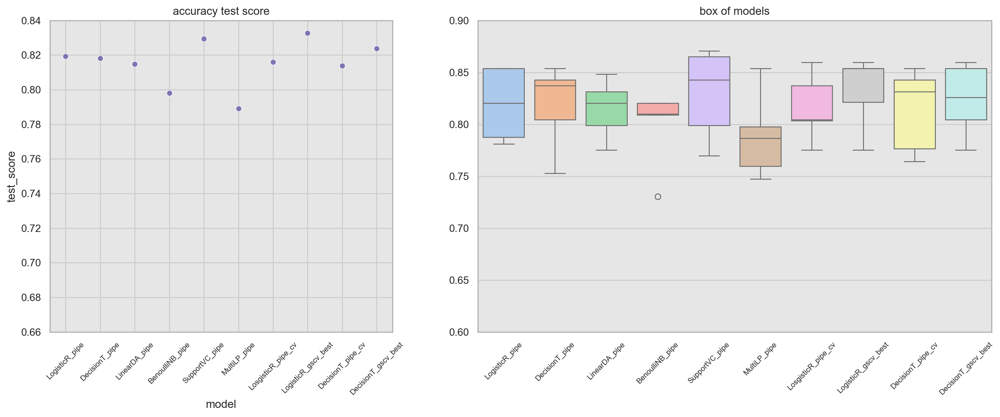

In [168]:
plt.figure(figsize=(18, 6))
gs = gridspec.GridSpec(nrows=1, ncols=2, width_ratios=[8, 12])

plt.subplot(gs[0])
g1 = sns.scatterplot(
        data=result_df,
        x=result_df.index,
        y="test_score",
        color="m",
)
g1.set(title="accuracy test score", ylim=(0.66, 0.84))
g1.set_xticks(ticks=range(len(result_df.index)), labels=result_df.index, rotation=45, fontsize=8) 

plt.subplot(gs[1])
g2 = sns.boxplot(
    data=test_scores,
)
g2.set(title="box of models", ylim=(0.60, 0.90))
g2.set_xticks(ticks=range(len(test_scores.columns)), labels=test_scores.columns, rotation=45, fontsize=8) ;

In [169]:
get_test_std_df(result_df, test_scores)

,test_score,std
LogisticR_gscv_best,0.832785,0.035536
SupportVC_pipe,0.829439,0.043786
DecisionT_gscv_best,0.823815,0.035064
LogisticR_pipe,0.819340,0.034901
DecisionT_pipe,0.818197,0.040920
LosgisticR_pipe_cv,0.815950,0.032755
LinearDA_pipe,0.814833,0.028484
DecisionT_pipe_cv,0.813734,0.040687
BenoulliNB_pipe,0.797966,0.038185
MultiLP_pipe,0.789034,0.041536


### best model save

In [170]:
dir_path = "./build_model"

save_model(dir_path, dt_gscv_best_model, "DecisionT_gscv_best")

DecisionT_gscv_best save success.


In [171]:
os.listdir(dir_path)

['.ipynb_checkpoints',
 'BenoulliNB_pipe.pkl',
 'DecisionT_gscv_best.pkl',
 'DecisionT_pipe.pkl',
 'LinearDA_pipe.pkl',
 'LogisticR_gscv_best.pkl',
 'LogisticR_pipe.pkl',
 'MultiLP_pipe.pkl',
 'SupportVC_pipe.pkl']

### 개별 모형 modeling (2) - 3 : LinearDiscriminantAnalysis
- LDA 모델은 확률적 생성모델로 데이터 샘플에 대한 y=k일 조건부확률을 베이즈 정리를 사용하여 계산한다.
- LDA는 가능도를 공통된 공분산 행렬을 갖는 다변수 정규분포라고 가정하고 베이즈 정리를 계산하면 경계선이 직선인 판별함수를 얻을 수 있게 된다.

In [176]:
%%time

model_pipe.set_params(model=model_link["lda"])
model_pipe.fit(X_train, y_train)

CPU times: total: 15.6 ms
Wall time: 32 ms


Pipeline(steps=[('engineering',
                 Pipeline(steps=[('preprocessor',
                                  ColumnTransformer(remainder='passthrough',
                                                    transformers=[('cat_transformer',
                                                                   OneHotEncoder(),
                                                                   ['Pclass',
                                                                    'Sex',
                                                                    'Embarked',
                                                                    'title_name',
                                                                    'generation']),
                                                                  ('num_transformer',
                                                                   Pipeline(steps=[('scaler',
                                                                                    StandardScaler())]),
                                                                   ['Age',
                                                                    'Fare',
                                                                    'SibSp',
                                                                    'Parch'])])),
                                 ('feature_tech',
                                  Pipeline(steps=[('feature_interaction',
                                                   PolynomialFeatures(include_bias=False,
                                                                      interaction_only=True)),
                                                  ('feature_select',
                                                   VarianceThreshold())]))])),
                ('model', LinearDiscriminantAnalysis())])

In [177]:
y_pred_train = model_pipe.predict(X_train)
y_pred_test = model_pipe.predict(X_test)

print("lda train acc : {}".format(accuracy_score(y_train, y_pred_train)))
print("lda test acc : {}".format(accuracy_score(y_test, y_pred_test)))

lda train acc : 0.8609550561797753
lda test acc : 0.8379888268156425


In [178]:
print(classification_report(y_test, y_pred_test))

              precision    recall  f1-score   support

           0       0.83      0.93      0.88       110
           1       0.86      0.70      0.77        69

    accuracy                           0.84       179
   macro avg       0.84      0.81      0.82       179
weighted avg       0.84      0.84      0.83       179



### cross_validation + model_pipe=lda

In [179]:
%%time

lda_pipe = model_pipe.set_params(model=LinearDiscriminantAnalysis(solver="lsqr", shrinkage="auto"))
result_lda_pipe_cv, accs_lda_pipe_cv = get_cv_result(X, y_enc, [lda_pipe], ["LinearDA_pipe_cv"])

CPU times: total: 1.39 s
Wall time: 457 ms


In [180]:
result_df = pd.concat([result_df, result_lda_pipe_cv], axis=0)
result_df

,train_score,test_score,pre_score,recall_score,f1_score
model,,,,,
LogisticR_pipe,0.857463,0.819340,0.822739,0.683746,0.743826
DecisionT_pipe,0.832492,0.818197,0.784863,0.725230,0.753210
LinearDA_pipe,0.863634,0.814833,0.816732,0.674496,0.735800
BenoulliNB_pipe,0.805275,0.797966,0.728940,0.751205,0.739163
SupportVC_pipe,0.849608,0.829439,0.818343,0.718170,0.764546
MultiLP_pipe,0.916385,0.789034,0.732820,0.691499,0.708047
LosgisticR_pipe_cv,0.854658,0.815950,0.774596,0.738183,0.754394
LogisticR_gscv_best,0.840630,0.832785,0.815822,0.731699,0.770646
DecisionT_pipe_cv,0.829687,0.813734,0.790074,0.710094,0.742860


In [181]:
test_scores["LinearDA_pipe_cv"] = accs_lda_pipe_cv[0][1]
test_scores

,LogisticR_pipe,DecisionT_pipe,LinearDA_pipe,BenoulliNB_pipe,SupportVC_pipe,MultiLP_pipe,LosgisticR_pipe_cv,LogisticR_gscv_best,DecisionT_pipe_cv,DecisionT_gscv_best,LinearDA_pipe_cv
0,0.787709,0.804469,0.798883,0.810056,0.798883,0.759777,0.804469,0.821229,0.776536,0.804469,0.798883
1,0.853933,0.837079,0.831461,0.820225,0.865169,0.786517,0.837079,0.853933,0.842697,0.825843,0.848315
2,0.853933,0.853933,0.848315,0.820225,0.870787,0.853933,0.859551,0.859551,0.853933,0.859551,0.831461
3,0.780899,0.752809,0.775281,0.730337,0.769663,0.747191,0.775281,0.775281,0.764045,0.775281,0.769663
4,0.820225,0.842697,0.820225,0.808989,0.842697,0.797753,0.803371,0.853933,0.831461,0.853933,0.831461


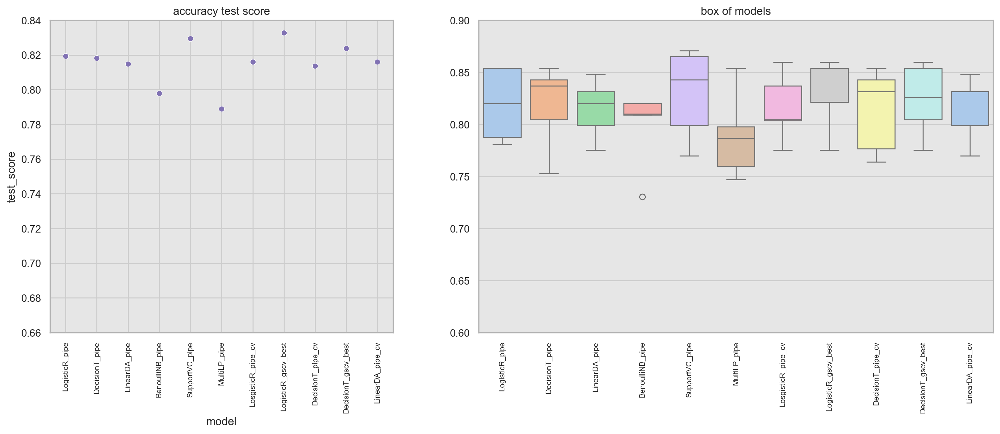

In [182]:
plt.figure(figsize=(18, 6))
gs = gridspec.GridSpec(nrows=1, ncols=2, width_ratios=[8, 12])

plt.subplot(gs[0])
g1 = sns.scatterplot(
        data=result_df,
        x=result_df.index,
        y="test_score",
        color="m",
)
g1.set(title="accuracy test score", ylim=(0.66, 0.84))
g1.set_xticks(ticks=range(len(result_df.index)), labels=result_df.index, rotation=90, fontsize=8) 

plt.subplot(gs[1])
g2 = sns.boxplot(
    data=test_scores,
    palette="pastel"
)
g2.set(title="box of models", ylim=(0.60, 0.90))
g2.set_xticks(ticks=range(len(test_scores.columns)), labels=test_scores.columns, rotation=90, fontsize=8) ;

In [183]:
get_test_std_df(result_df, test_scores)

,test_score,std
LogisticR_gscv_best,0.832785,0.035536
SupportVC_pipe,0.829439,0.043786
DecisionT_gscv_best,0.823815,0.035064
LogisticR_pipe,0.819340,0.034901
DecisionT_pipe,0.818197,0.040920
LinearDA_pipe_cv,0.815956,0.031474
LosgisticR_pipe_cv,0.815950,0.032755
LinearDA_pipe,0.814833,0.028484
DecisionT_pipe_cv,0.813734,0.040687
BenoulliNB_pipe,0.797966,0.038185


### GridSearchCV를 사용한 lda_pipe의 하이퍼 파라미터 튜닝 - (1)
- LDA는 공분산 행렬을 추정할 수 있는 shrinkage 파라미터를 사용할 수 있다. 
- shrinkage 대신에 covariance_estimator 파라미터에 공분산행렬 추정기 OAS를 사용할 수 있다.

In [185]:
%%time

lda_pip = model_pipe.set_params(model=model_link["lda"])

lda_params = {
    "model__solver": ["svd", "eigen", "lsqr"]
}

cv = KFold(n_splits=5, shuffle=True, random_state=50)
lda_gscv_1 = GridSearchCV(estimator=lda_pipe, param_grid=lda_params, cv=cv, scoring="accuracy", return_train_score=True, n_jobs=2)
lda_gscv_1.fit(X, y_enc)

CPU times: total: 78.1 ms
Wall time: 2.58 s


GridSearchCV(cv=KFold(n_splits=5, random_state=50, shuffle=True),
             estimator=Pipeline(steps=[('engineering',
                                        Pipeline(steps=[('preprocessor',
                                                         ColumnTransformer(remainder='passthrough',
                                                                           transformers=[('cat_transformer',
                                                                                          OneHotEncoder(),
                                                                                          ['Pclass',
                                                                                           'Sex',
                                                                                           'Embarked',
                                                                                           'title_name',
                                                                                           'generation']),
                                                                                         ('num_transformer',
                                                                                          Pipeline(steps=[('scaler',
                                                                                                           StandardScaler())]),
                                                                                          ['Age',
                                                                                           'Fare',
                                                                                           'SibSp',
                                                                                           'Parch'])])),
                                                        ('feature_tech',
                                                         Pipeline(steps=[('feature_interaction',
                                                                          PolynomialFeatures(include_bias=False,
                                                                                             interaction_only=True)),
                                                                         ('feature_select',
                                                                          VarianceThreshold())]))])),
                                       ('model',
                                        LinearDiscriminantAnalysis())]),
             n_jobs=2, param_grid={'model__solver': ['svd', 'eigen', 'lsqr']},
             return_train_score=True, scoring='accuracy')

In [186]:
result_lda_gscv_1 = pd.DataFrame(lda_gscv_1.cv_results_).sort_values("rank_test_score")
cols = list(result_lda_gscv_1.filter(regex="^param_model").columns) + ["mean_fit_time", "mean_test_score", "mean_train_score", "std_test_score", "rank_test_score"]
result_lda_gscv_1[cols][:10].style.applymap(draw_color_cell, color="#ffd700", subset=(result_lda_gscv_1.index[0]))

,param_model__solver,mean_fit_time,mean_test_score,mean_train_score,std_test_score,rank_test_score
0,svd,0.046585,0.814833,0.863634,0.025477,1
2,lsqr,0.038400,0.657793,0.664132,0.096568,2
1,eigen,0.036401,nan,nan,nan,3


### GridSearchCV를 사용한 lda_pipe의 하이퍼 파라미터 튜닝 - (2) 
- 공분산 행렬 추정기 OAS와 solver를 조합하여 fitting 실험
- shrinkage="auto"인 모델보다 공분산 행렬 추정기를 사용한 모델의 test score가 더 높아졌다.

In [187]:
from sklearn.covariance import OAS

In [188]:
%%time

oa = OAS(store_precision=False, assume_centered=False)

lda_params = {
    "model__solver": ["eigen", "lsqr"],
    "model__shrinkage": ["auto", None],
    "model__covariance_estimator": [oa]
}

cv = KFold(n_splits=5, shuffle=True, random_state=50)
lda_gscv_2 = GridSearchCV(estimator=lda_pipe, param_grid=lda_params, cv=cv, scoring="accuracy", return_train_score=True, n_jobs=2)
lda_gscv_2.fit(X, y_enc)

CPU times: total: 125 ms
Wall time: 533 ms


GridSearchCV(cv=KFold(n_splits=5, random_state=50, shuffle=True),
             estimator=Pipeline(steps=[('engineering',
                                        Pipeline(steps=[('preprocessor',
                                                         ColumnTransformer(remainder='passthrough',
                                                                           transformers=[('cat_transformer',
                                                                                          OneHotEncoder(),
                                                                                          ['Pclass',
                                                                                           'Sex',
                                                                                           'Embarked',
                                                                                           'title_name',
                                                                                           'generation']),
                                                                                         ('num_transformer',
                                                                                          Pipeline(steps=[('scaler',
                                                                                                           StandardScaler())]),
                                                                                          ['A...
                                                         Pipeline(steps=[('feature_interaction',
                                                                          PolynomialFeatures(include_bias=False,
                                                                                             interaction_only=True)),
                                                                         ('feature_select',
                                                                          VarianceThreshold())]))])),
                                       ('model',
                                        LinearDiscriminantAnalysis())]),
             n_jobs=2,
             param_grid={'model__covariance_estimator': [OAS(store_precision=False)],
                         'model__shrinkage': ['auto', None],
                         'model__solver': ['eigen', 'lsqr']},
             return_train_score=True, scoring='accuracy')

In [189]:
result_lda_gscv_2 = pd.DataFrame(lda_gscv_2.cv_results_).sort_values("rank_test_score")
cols = list(result_lda_gscv_2.filter(regex="^param_model").columns) + ["mean_fit_time", "mean_test_score", "mean_train_score", "std_test_score", "rank_test_score"]
result_lda_gscv_2[cols][:10].style.applymap(draw_color_cell, color="#ffd700", subset=(result_lda_gscv_2.index[0]))

,param_model__covariance_estimator,param_model__shrinkage,param_model__solver,mean_fit_time,mean_test_score,mean_train_score,std_test_score,rank_test_score
2,OAS(store_precision=False),None,eigen,0.039201,0.822698,0.857743,0.032899,1
3,OAS(store_precision=False),None,lsqr,0.038000,0.822698,0.857743,0.032899,1
0,OAS(store_precision=False),auto,eigen,0.018606,nan,nan,nan,3
1,OAS(store_precision=False),auto,lsqr,0.023199,nan,nan,nan,3


### GridSearchCV를 사용한 lr_pipe의 하이퍼 파라미터 튜닝 - (3)
- shrinkage만 사용하여 실험
   - shrinkage 값에 0~1사이의 값을 추가하여 실험
   - OAS 공분산 추정기를 사용한 모델보다 성능이 더 높아졌다.

In [191]:
%%time

lda_params = {
    "model__solver": ["eigen", "lsqr"],
    "model__shrinkage": ["auto", None] + list(np.linspace(0, 1, 10))[1:-1], # 0과 1은 제외
}

cv = KFold(n_splits=5, shuffle=True, random_state=50)
lda_gscv_3 = GridSearchCV(estimator=lda_pipe, param_grid=lda_params, cv=cv, scoring="accuracy", return_train_score=True, n_jobs=2)
lda_gscv_3.fit(X, y_enc)

CPU times: total: 469 ms
Wall time: 5.68 s


GridSearchCV(cv=KFold(n_splits=5, random_state=50, shuffle=True),
             estimator=Pipeline(steps=[('engineering',
                                        Pipeline(steps=[('preprocessor',
                                                         ColumnTransformer(remainder='passthrough',
                                                                           transformers=[('cat_transformer',
                                                                                          OneHotEncoder(),
                                                                                          ['Pclass',
                                                                                           'Sex',
                                                                                           'Embarked',
                                                                                           'title_name',
                                                                                           'generation']),
                                                                                         ('num_transformer',
                                                                                          Pipeline(steps=[('scaler',
                                                                                                           StandardScaler())]),
                                                                                          ['A...
                                                                          VarianceThreshold())]))])),
                                       ('model',
                                        LinearDiscriminantAnalysis())]),
             n_jobs=2,
             param_grid={'model__shrinkage': ['auto', None, 0.1111111111111111,
                                              0.2222222222222222,
                                              0.3333333333333333,
                                              0.4444444444444444,
                                              0.5555555555555556,
                                              0.6666666666666666,
                                              0.7777777777777777,
                                              0.8888888888888888],
                         'model__solver': ['eigen', 'lsqr']},
             return_train_score=True, scoring='accuracy')

In [192]:
result_lda_gscv_3 = pd.DataFrame(lda_gscv_3.cv_results_).sort_values("rank_test_score")
cols = list(result_lda_gscv_3.filter(regex="^param_model").columns) + ["mean_fit_time", "mean_test_score", "mean_train_score", "std_test_score", "rank_test_score"]
result_lda_gscv_3[cols][:10].style.applymap(draw_color_cell, color="#ffd700", subset=(result_lda_gscv_3.index[0]))

,param_model__shrinkage,param_model__solver,mean_fit_time,mean_test_score,mean_train_score,std_test_score,rank_test_score
15,0.666667,lsqr,0.039599,0.829402,0.833335,0.031316,1
14,0.666667,eigen,0.043800,0.829402,0.833335,0.031316,1
17,0.777778,lsqr,0.040000,0.827161,0.829126,0.030643,3
16,0.777778,eigen,0.044001,0.827161,0.829126,0.030643,3
10,0.444444,eigen,0.040600,0.826050,0.841470,0.031709,5
11,0.444444,lsqr,0.038800,0.826050,0.841470,0.031709,5
6,0.222222,eigen,0.044002,0.824933,0.852134,0.028620,7
7,0.222222,lsqr,0.039800,0.824933,0.852134,0.028620,7
4,0.111111,eigen,0.042201,0.823821,0.856061,0.029233,9
5,0.111111,lsqr,0.039201,0.823821,0.856061,0.029233,9


In [193]:
lda_gscv_1_best = pd.DataFrame(lda_gscv_1.best_params_, index=range(1)).assign(model="lda_gscv_1")
lda_gscv_2_best = pd.DataFrame(lda_gscv_2.best_params_, index=range(1)).assign(model="lda_gscv_2")
lda_gscv_3_best = pd.DataFrame(lda_gscv_3.best_params_, index=range(1)).assign(model="lda_gscv_3")

lda_gscv_best_compare = pd.concat([lda_gscv_1_best, lda_gscv_2_best, lda_gscv_3_best], axis=0).reset_index(drop=True)
lda_gscv_best_compare["test_score"] = [lda_gscv_1.best_score_, lda_gscv_2.best_score_, lda_gscv_3.best_score_]
lda_gscv_best_compare\
    .fillna(0)\
    .sort_values("test_score", ascending=False)\
    .reset_index(drop=True)\
    .style.applymap(draw_color_cell, color="#ffd700", subset=(lda_gscv_best_compare.index[0]))

,model__solver,model,model__covariance_estimator,model__shrinkage,test_score
0,eigen,lda_gscv_3,0,0.666667,0.829402
1,eigen,lda_gscv_2,OAS(store_precision=False),0.000000,0.822698
2,svd,lda_gscv_1,0,0.000000,0.814833


### GridSearchCV로 실험한 LDA 모델 중 best 모델을 사용하여 cv 테스트

In [197]:
%%time

lda_gscv_best_model = eval(lda_gscv_best_compare.iloc[lda_gscv_best_compare["test_score"].argmax()]["model"]).best_estimator_
result_lda_gscv_best, accs_lda_gscv_best = get_cv_result(X, y_enc, [lda_gscv_best_model], ["LinearDA_gscv_best"])

CPU times: total: 1.48 s
Wall time: 396 ms


In [199]:
result_df = pd.concat([result_df, result_lda_gscv_best], axis=0)
result_df

,train_score,test_score,pre_score,recall_score,f1_score
model,,,,,
LogisticR_pipe,0.857463,0.819340,0.822739,0.683746,0.743826
DecisionT_pipe,0.832492,0.818197,0.784863,0.725230,0.753210
LinearDA_pipe,0.863634,0.814833,0.816732,0.674496,0.735800
BenoulliNB_pipe,0.805275,0.797966,0.728940,0.751205,0.739163
SupportVC_pipe,0.849608,0.829439,0.818343,0.718170,0.764546
MultiLP_pipe,0.916385,0.789034,0.732820,0.691499,0.708047
LosgisticR_pipe_cv,0.854658,0.815950,0.774596,0.738183,0.754394
LogisticR_gscv_best,0.840630,0.832785,0.815822,0.731699,0.770646
DecisionT_pipe_cv,0.829687,0.813734,0.790074,0.710094,0.742860


In [200]:
test_scores["LinearDA_gscv_best"] = accs_lda_gscv_best[0][1]
test_scores

,LogisticR_pipe,DecisionT_pipe,LinearDA_pipe,BenoulliNB_pipe,SupportVC_pipe,MultiLP_pipe,LosgisticR_pipe_cv,LogisticR_gscv_best,DecisionT_pipe_cv,DecisionT_gscv_best,LinearDA_pipe_cv,LinearDA_gscv_best
0,0.787709,0.804469,0.798883,0.810056,0.798883,0.759777,0.804469,0.821229,0.776536,0.804469,0.798883,0.832402
1,0.853933,0.837079,0.831461,0.820225,0.865169,0.786517,0.837079,0.853933,0.842697,0.825843,0.848315,0.859551
2,0.853933,0.853933,0.848315,0.820225,0.870787,0.853933,0.859551,0.859551,0.853933,0.859551,0.831461,0.848315
3,0.780899,0.752809,0.775281,0.730337,0.769663,0.747191,0.775281,0.775281,0.764045,0.775281,0.769663,0.769663
4,0.820225,0.842697,0.820225,0.808989,0.842697,0.797753,0.803371,0.853933,0.831461,0.853933,0.831461,0.837079


### 모델 별 성능 비교

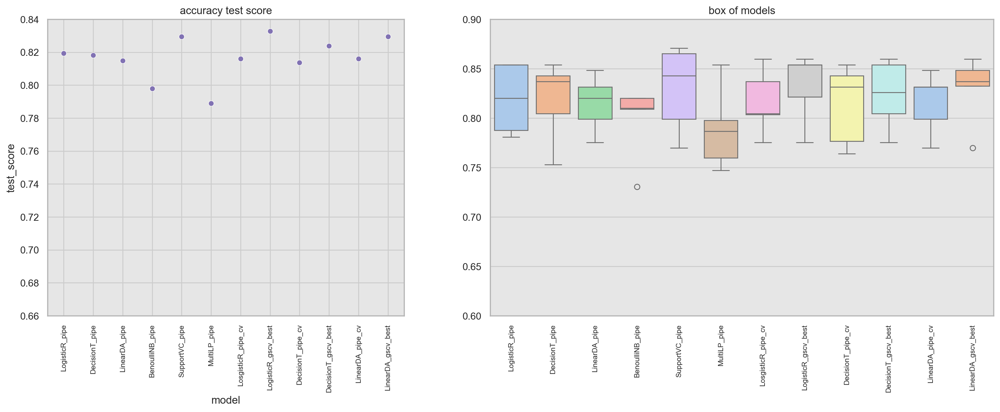

In [201]:
plt.figure(figsize=(19, 6))
gs = gridspec.GridSpec(nrows=1, ncols=2, width_ratios=[8.5, 12])

plt.subplot(gs[0])
g1 = sns.scatterplot(
        data=result_df,
        x=result_df.index,
        y="test_score",
        color="m",
)
g1.set(title="accuracy test score", ylim=(0.66, 0.84))
g1.set_xticks(ticks=range(len(result_df.index)), labels=result_df.index, rotation=90, fontsize=8) 

plt.subplot(gs[1])
g2 = sns.boxplot(
    data=test_scores,
    palette="pastel"
)
g2.set(title="box of models", ylim=(0.60, 0.90))
g2.set_xticks(ticks=range(len(test_scores.columns)), labels=test_scores.columns, rotation=90, fontsize=8) ;

In [202]:
get_test_std_df(result_df, test_scores)

,test_score,std
LogisticR_gscv_best,0.832785,0.035536
SupportVC_pipe,0.829439,0.043786
LinearDA_gscv_best,0.829402,0.035012
DecisionT_gscv_best,0.823815,0.035064
LogisticR_pipe,0.819340,0.034901
DecisionT_pipe,0.818197,0.040920
LinearDA_pipe_cv,0.815956,0.031474
LosgisticR_pipe_cv,0.815950,0.032755
LinearDA_pipe,0.814833,0.028484
DecisionT_pipe_cv,0.813734,0.040687


### best model save

In [203]:
dir_path = "./build_model"

save_model(dir_path, lda_gscv_best_model, "LinearDA_gscv_best")

LinearDA_gscv_best save success.


In [204]:
os.listdir(dir_path)

['.ipynb_checkpoints',
 'BenoulliNB_pipe.pkl',
 'DecisionT_gscv_best.pkl',
 'DecisionT_pipe.pkl',
 'LinearDA_gscv_best.pkl',
 'LinearDA_pipe.pkl',
 'LogisticR_gscv_best.pkl',
 'LogisticR_pipe.pkl',
 'MultiLP_pipe.pkl',
 'SupportVC_pipe.pkl']

### 개별 모형 modeling (2) - 4 : BernoullinNB
- NaiveBayes 모델은 조건부확률을 구하기 위한 베이즈 정리를 사용할때 가능도를 나이브 가정으로 정의한다. 나이브 가정은 각 feature가 모두 조건부 독립이라는 것과 같다. 따라서 베이즈 정리의 가능도는 각 feature의 결합확률에 대한 조건부 확률과 같다.
   - 즉 feature의 조건부확률을 모두 곱하여 사용할 수 있다.
- NaiveBayes 모델 중 독립변수 x_d의 데이터가 0, 1 인 경우 분류 모델로 사용할 수 있다.
- 현재 데이터는 num_features와 cat_features가 섞여 있으므로, 각 데이터 특성에 맞는 NaiveBayes 모델을 사용한 후 가능도를 곱하여 전체 조건부 확률을 구할 수 있다.

In [205]:
%%time

model_pipe.set_params(model=BernoulliNB())
model_pipe.fit(X_train, y_train)

CPU times: total: 0 ns
Wall time: 16 ms


Pipeline(steps=[('engineering',
                 Pipeline(steps=[('preprocessor',
                                  ColumnTransformer(remainder='passthrough',
                                                    transformers=[('cat_transformer',
                                                                   OneHotEncoder(),
                                                                   ['Pclass',
                                                                    'Sex',
                                                                    'Embarked',
                                                                    'title_name',
                                                                    'generation']),
                                                                  ('num_transformer',
                                                                   Pipeline(steps=[('scaler',
                                                                                    StandardScaler())]),
                                                                   ['Age',
                                                                    'Fare',
                                                                    'SibSp',
                                                                    'Parch'])])),
                                 ('feature_tech',
                                  Pipeline(steps=[('feature_interaction',
                                                   PolynomialFeatures(include_bias=False,
                                                                      interaction_only=True)),
                                                  ('feature_select',
                                                   VarianceThreshold())]))])),
                ('model', BernoulliNB())])

In [206]:
y_pred_train = model_pipe.predict(X_train)
y_pred_test = model_pipe.predict(X_test)

print("bnb train acc : {}".format(accuracy_score(y_train, y_pred_train)))
print("bnb test acc : {}".format(accuracy_score(y_test, y_pred_test)))

bnb train acc : 0.797752808988764
bnb test acc : 0.8268156424581006


In [207]:
print(classification_report(y_test, y_pred_test))

              precision    recall  f1-score   support

           0       0.86      0.86      0.86       110
           1       0.78      0.77      0.77        69

    accuracy                           0.83       179
   macro avg       0.82      0.82      0.82       179
weighted avg       0.83      0.83      0.83       179



### GaussianNB, BernoulliNB, MultinomialNB의 복합사용
- 나이브베이즈 모델의 특징을 사용하여 데이터의 타입에 따라서 3가지 pipe를 따로 훈련시킨 후 가능도를 계산하여 곱하면 예측 확률값을 구할 수 있다.
   - GNB : 가우시안 나이브베이즈 모델은 정규분포 모델이므로 실수형 데이터에 적합하다.
   - BNB : 베르누이 나이브베이즈 모델은 베르누이분포 모델로 0 또는 1을 가지 데이터에 적합하다. 
   - MNB : 다변수정규분포 나이브베이즈 모델은 다변수정규분포 모델로 정수형 데이터에 적합하다.
- 모델의 가능도 계산
   - likeli_hood = model.predict_proba(X_test) / model.class_prior
   - 사전확률은 GaussianNB() 객체의 속성값으로만 주어진다. 그러나 클래스별 비율과 같으므로 직접 계산하여 구할 수 있다. 
- 복합모델의 예측값 계산
   - likeli_1 * likeli_2 * model.class_priror

#### numeric, categorical features 데이터의 train, test 구분

In [208]:
num_X = X[num_features]
cat_X = X[cat_features]

X_train_num, X_test_num, y_train_num, y_test_num = train_test_split(num_X, y_enc, test_size=0.2, stratify=y_enc, random_state=50)
X_train_cat, X_test_cat, y_train_cat, y_test_cat = train_test_split(cat_X, y_enc, test_size=0.2, stratify=y_enc, random_state=50)

X_train_num.shape, X_train_cat.shape, y_train_num.shape, y_train_cat.shape

((712, 4), (712, 5), (712,), (712,))

#### BernoulliNB pipe line 

In [209]:
bnb_feature_preprocessor = ColumnTransformer(
    transformers=[
        ("cat_transformer", cat_transformer["onehot"], cat_features),
    ], remainder="passthrough"
)

bnb_feature_tech = Pipeline(
    steps=[
        ("feature_interaction", PolynomialFeatures(interaction_only=True, include_bias=False)),
        ("feature_select", VarianceThreshold())
    ]
)

bnb_feature_engineering = Pipeline(
    steps=[
        ("preprocessor", bnb_feature_preprocessor),
        ("feature_tech", bnb_feature_tech)
    ]
)

bnb_pipe = Pipeline(
    steps=[
        ("engineering", bnb_feature_engineering),
        ("model", BernoulliNB())
    ]
)

bnb_pipe

Pipeline(steps=[('engineering',
                 Pipeline(steps=[('preprocessor',
                                  ColumnTransformer(remainder='passthrough',
                                                    transformers=[('cat_transformer',
                                                                   OneHotEncoder(),
                                                                   ['Pclass',
                                                                    'Sex',
                                                                    'Embarked',
                                                                    'title_name',
                                                                    'generation'])])),
                                 ('feature_tech',
                                  Pipeline(steps=[('feature_interaction',
                                                   PolynomialFeatures(include_bias=False,
                                                                      interaction_only=True)),
                                                  ('feature_select',
                                                   VarianceThreshold())]))])),
                ('model', BernoulliNB())])

#### Gaussian pipe line

In [210]:
from sklearn.preprocessing import MinMaxScaler

In [211]:
gnb_feature_preprocessor = ColumnTransformer(
    transformers=[
        #("num_transformer", num_transformer, num_features),
        ("num_transformer", MinMaxScaler(), ["Age", "Fare"]),
    ], remainder="passthrough"
)

gnb_feature_tech = Pipeline(
    steps=[
        ("feature_interaction", PolynomialFeatures(interaction_only=True, include_bias=False)),        
    ]
)

gnb_feature_engineering = Pipeline(
    steps=[
        ("preprocessor", gnb_feature_preprocessor),
        ("feature_tech", gnb_feature_tech)
    ]
)

gnb_pipe = Pipeline(
    steps=[
        ("engineering", gnb_feature_engineering),
        ("model", GaussianNB())
    ]
)

gnb_pipe

Pipeline(steps=[('engineering',
                 Pipeline(steps=[('preprocessor',
                                  ColumnTransformer(remainder='passthrough',
                                                    transformers=[('num_transformer',
                                                                   MinMaxScaler(),
                                                                   ['Age',
                                                                    'Fare'])])),
                                 ('feature_tech',
                                  Pipeline(steps=[('feature_interaction',
                                                   PolynomialFeatures(include_bias=False,
                                                                      interaction_only=True))]))])),
                ('model', GaussianNB())])

#### MultinomialNB pipe line

In [212]:
mnb_feature_preprocessor = ColumnTransformer(
    transformers=[
        ("num_transformer", num_transformer, ["SibSp", "Parch"]),
        ("num_transformer", MinMaxScaler(), ["SibSp", "Parch"]),
    ], remainder="passthrough"
)

mnb_feature_tech = Pipeline(
    steps=[
        ("feature_interaction", PolynomialFeatures(interaction_only=True, include_bias=False)),        
    ]
)

mnb_feature_engineering = Pipeline(
    steps=[
        #("preprocessor", mnb_feature_preprocessor),
        ("feature_tech", mnb_feature_tech)
    ]
)

mnb_pipe = Pipeline(
    steps=[
        ("engineering", mnb_feature_engineering),
        ("model", MultinomialNB())
    ]
)

mnb_pipe

Pipeline(steps=[('engineering',
                 Pipeline(steps=[('feature_tech',
                                  Pipeline(steps=[('feature_interaction',
                                                   PolynomialFeatures(include_bias=False,
                                                                      interaction_only=True))]))])),
                ('model', MultinomialNB())])

### BernoulliNB + GaussianNB
- GaussianNB의 학습 데이터로 정수와 실수형 데이터가 합해진 num_features("Age", "Fare", "SipSp", "Parch")를 사용
- BernoulliNB의 학습 데이터로 범주형 데이터 cat_features('title_name', 'Sex', 'Pclass', 'Embarked', 'generation')를 사용
   - bnb_pipe의 전처리 단계에서 범주형 데이터를 더미변수(OneHotEncoder)화 하면 0, 1의 데이터로 바뀌게 된다.
- 앞에서 BernoulliNB 모델만 사용한 경우보다 작지만 거의 비슷한 test score가 나왔다.   

In [213]:
bnb_model = bnb_pipe.fit(X_train_cat, y_train_cat)
bnb_proba = bnb_model.predict_proba(X_test_cat)

gnb_model = gnb_pipe.fit(X_train_num, y_train_num)
gnb_proba = gnb_model.predict_proba(X_test_num)

bnb_likeli = bnb_proba / gnb_model["model"].class_prior_
gnb_likeli = gnb_proba / gnb_model["model"].class_prior_

prob = bnb_likeli * gnb_likeli * gnb_model["model"].class_prior_
total_pred = np.argmax(prob, axis=1)
total_acc = accuracy_score(y_test_cat, total_pred)
total_acc

0.8212290502793296

### GaussianNB + BernoulliNB + MultinomialNB
- 범주형, 실수형, 정수형 features를 각각 3가지 NB 모델에 따로 학습
    - 범주형 features : BernoulliNB
    - 실수형 features : GaussianNB
    - 정수형 features : MultinomialNB
- GaussainNB + BernoulliNB 실험에서보다 test score가 낮게 나왔다.    

In [214]:
cat_X = X[cat_features] # 범주형 features
int_X = train_2[["SibSp", "Parch"]] # 실수형 features
float_X = train_2[["Age", "Fare"]] # 정수형 features

X_train_cat, X_test_cat, y_train_cat, y_test_cat = train_test_split(cat_X, y_enc, test_size=0.2, stratify=y_enc, random_state=50)
X_train_int, X_test_int, y_train_int, y_test_int = train_test_split(int_X, y_enc, test_size=0.2, stratify=y_enc, random_state=50)
X_train_float, X_test_float, y_train_float, y_test_float = train_test_split(float_X, y_enc, test_size=0.2, stratify=y_enc, random_state=50)

bnb_model = bnb_pipe.fit(X_train_cat, y_train_cat)
bnb_proba = bnb_model.predict_proba(X_test_cat)

mnb_model = mnb_pipe.fit(X_train_int, y_train_int)
mnb_proba = mnb_model.predict_proba(X_test_int)

gnb_model = gnb_pipe.fit(X_train_float, y_train_float)
gnb_proba = gnb_model.predict_proba(X_test_float)

bnb_likeli = bnb_proba / gnb_model["model"].class_prior_
mnb_likeli = mnb_proba / gnb_model["model"].class_prior_
gnb_likeli = gnb_proba / gnb_model["model"].class_prior_

prob = bnb_likeli * mnb_likeli * gnb_likeli * gnb_model["model"].class_prior_
total_pred = np.argmax(prob, axis=1)
total_acc = accuracy_score(y_test_cat, total_pred)
total_acc

0.8156424581005587

### BNB_gscv_best + GNB_gscv_best 모델 결합 실험
- bnb_pipe와 gnb_pipe를 각각 gscv에 fitting 후 best model을 결합하여 확률값을 예측한다.

In [215]:
bnb_new_params = {
    "model__alpha": [1/(10**i) for i in range(0, 11)]
}
cv = KFold(n_splits=5, shuffle=True, random_state=50)
bnb_gscv = GridSearchCV(estimator=bnb_pipe, param_grid=bnb_new_params, cv=cv, scoring="accuracy", return_train_score=True)
bnb_gscv.fit(cat_X, y_enc)

GridSearchCV(cv=KFold(n_splits=5, random_state=50, shuffle=True),
             estimator=Pipeline(steps=[('engineering',
                                        Pipeline(steps=[('preprocessor',
                                                         ColumnTransformer(remainder='passthrough',
                                                                           transformers=[('cat_transformer',
                                                                                          OneHotEncoder(),
                                                                                          ['Pclass',
                                                                                           'Sex',
                                                                                           'Embarked',
                                                                                           'title_name',
                                                                                           'generation'])])),
                                                        ('feature_tech',
                                                         Pipeline(steps=[('feature_interaction',
                                                                          PolynomialFeatures(include_bias=False,
                                                                                             interaction_only=True)),
                                                                         ('feature_select',
                                                                          VarianceThreshold())]))])),
                                       ('model', BernoulliNB())]),
             param_grid={'model__alpha': [1.0, 0.1, 0.01, 0.001, 0.0001, 1e-05,
                                          1e-06, 1e-07, 1e-08, 1e-09, 1e-10]},
             return_train_score=True, scoring='accuracy')

In [216]:
result_bnb_gscv = pd.DataFrame(bnb_gscv.cv_results_).sort_values("rank_test_score")
cols = list(result_bnb_gscv.filter(regex="^param_model").columns) + ["mean_fit_time", "mean_test_score", "mean_train_score", "std_test_score", "rank_test_score"]
result_bnb_gscv[cols][:10].style.applymap(draw_color_cell, color="#ffd700", subset=(result_bnb_gscv.index[0]))

,param_model__alpha,mean_fit_time,mean_test_score,mean_train_score,std_test_score,rank_test_score
1,0.100000,0.007998,0.796861,0.804714,0.041474,1
0,1.000000,0.008991,0.793484,0.802469,0.040133,2
2,0.010000,0.007803,0.792367,0.805276,0.038600,3
3,0.001000,0.007981,0.791243,0.805556,0.040738,4
4,0.000100,0.007191,0.791243,0.805556,0.040738,4
5,0.000010,0.007994,0.791243,0.805556,0.040738,4
6,0.000001,0.009803,0.791243,0.805556,0.040738,4
7,0.000000,0.007994,0.790120,0.805837,0.039677,8
8,0.000000,0.007601,0.790120,0.805837,0.039677,8
9,0.000000,0.006985,0.790120,0.805837,0.039677,8


In [217]:
gnb_new_params = {
    "model__var_smoothing": [1/(10**i) for i in range(0, 11)]
}
cv = KFold(n_splits=5, shuffle=True, random_state=50)
gnb_gscv = GridSearchCV(estimator=gnb_pipe, param_grid=gnb_new_params, cv=cv, scoring="accuracy", return_train_score=True)
gnb_gscv.fit(num_X, y_enc)

GridSearchCV(cv=KFold(n_splits=5, random_state=50, shuffle=True),
             estimator=Pipeline(steps=[('engineering',
                                        Pipeline(steps=[('preprocessor',
                                                         ColumnTransformer(remainder='passthrough',
                                                                           transformers=[('num_transformer',
                                                                                          MinMaxScaler(),
                                                                                          ['Age',
                                                                                           'Fare'])])),
                                                        ('feature_tech',
                                                         Pipeline(steps=[('feature_interaction',
                                                                          PolynomialFeatures(include_bias=False,
                                                                                             interaction_only=True))]))])),
                                       ('model', GaussianNB())]),
             param_grid={'model__var_smoothing': [1.0, 0.1, 0.01, 0.001, 0.0001,
                                                  1e-05, 1e-06, 1e-07, 1e-08,
                                                  1e-09, 1e-10]},
             return_train_score=True, scoring='accuracy')

In [218]:
result_gnb_gscv = pd.DataFrame(gnb_gscv.cv_results_).sort_values("rank_test_score")
cols = list(result_gnb_gscv.filter(regex="^param_model").columns) + ["mean_fit_time", "mean_test_score", "mean_train_score", "std_test_score", "rank_test_score"]
result_gnb_gscv[cols][:10].style.applymap(draw_color_cell, color="#ffd700", subset=(result_gnb_gscv.index[0]))

,param_model__var_smoothing,mean_fit_time,mean_test_score,mean_train_score,std_test_score,rank_test_score
6,0.000001,0.004793,0.683523,0.675935,0.036485,1
7,0.000000,0.004799,0.683523,0.675654,0.036485,1
8,0.000000,0.005000,0.683523,0.675654,0.036485,1
9,0.000000,0.004800,0.683523,0.675654,0.036485,1
10,0.000000,0.005000,0.683523,0.675654,0.036485,1
5,0.000010,0.004793,0.681276,0.677619,0.035597,6
4,0.000100,0.004589,0.646457,0.652373,0.099195,7
0,1.000000,0.006392,0.600490,0.592042,0.082759,8
3,0.001000,0.004797,0.576882,0.572688,0.106084,9
2,0.010000,0.004985,0.430902,0.435181,0.049544,10


#### bnb와 gnb를 각각 gscv에 fitting한 결과가 더 좋다.
- bnb, gnb 개별 모델보다 가능도 결합을 한 모델의 성능이 더 좋다.
- 특히 bnb, gnb 개별 모델을 gscv에 fitting 한 경우 결합한 모델의 성능이 더 좋다.

In [219]:
bnb_gscv_proba = bnb_gscv.best_estimator_.predict_proba(X_test_cat)
gnb_gscv_proba = gnb_gscv.best_estimator_.predict_proba(X_test_num)

bnb_gscv_likeli = bnb_gscv_proba / gnb_gscv.best_estimator_["model"].class_prior_
gnb_gscv_likeli = gnb_gscv_proba / gnb_gscv.best_estimator_["model"].class_prior_

joint_prob = bnb_gscv_likeli * gnb_gscv_likeli * gnb_gscv.best_estimator_["model"].class_prior_
joint_pred = np.argmax(joint_prob, axis=1)
bnb_gnb_joint_acc = accuracy_score(y_test_cat, joint_pred)

print(f'''
bnb + gnb total acc = {total_acc}
bnb_gscv_best + gnb_gscv_best total acc = {bnb_gnb_joint_acc}
''')


bnb + gnb total acc = 0.8156424581005587
bnb_gscv_best + gnb_gscv_best total acc = 0.8268156424581006



### cross_validate + model_pipe=BernoulliNB
- NB 모델의 가능도 결합은 cross_validate 함수에 적용하기 어렵다.

In [220]:
%%time

bnb_pipe = model_pipe.set_params(model=BernoulliNB(alpha=0.8))
result_bnb_pipe_cv, accs_bnb_pipe_cv = get_cv_result(X, y_enc, [bnb_pipe], ["BenoulliNB_pipe_cv"])

CPU times: total: 1.06 s
Wall time: 345 ms


In [221]:
result_df = pd.concat([result_df, result_bnb_pipe_cv], axis=0)
result_df

,train_score,test_score,pre_score,recall_score,f1_score
model,,,,,
LogisticR_pipe,0.857463,0.819340,0.822739,0.683746,0.743826
DecisionT_pipe,0.832492,0.818197,0.784863,0.725230,0.753210
LinearDA_pipe,0.863634,0.814833,0.816732,0.674496,0.735800
BenoulliNB_pipe,0.805275,0.797966,0.728940,0.751205,0.739163
SupportVC_pipe,0.849608,0.829439,0.818343,0.718170,0.764546
MultiLP_pipe,0.916385,0.789034,0.732820,0.691499,0.708047
LosgisticR_pipe_cv,0.854658,0.815950,0.774596,0.738183,0.754394
LogisticR_gscv_best,0.840630,0.832785,0.815822,0.731699,0.770646
DecisionT_pipe_cv,0.829687,0.813734,0.790074,0.710094,0.742860


In [222]:
test_scores["BenoulliNB_pipe_cv"] = accs_bnb_pipe_cv[0][1]
test_scores

,LogisticR_pipe,DecisionT_pipe,LinearDA_pipe,BenoulliNB_pipe,SupportVC_pipe,MultiLP_pipe,LosgisticR_pipe_cv,LogisticR_gscv_best,DecisionT_pipe_cv,DecisionT_gscv_best,LinearDA_pipe_cv,LinearDA_gscv_best,BenoulliNB_pipe_cv
0,0.787709,0.804469,0.798883,0.810056,0.798883,0.759777,0.804469,0.821229,0.776536,0.804469,0.798883,0.832402,0.810056
1,0.853933,0.837079,0.831461,0.820225,0.865169,0.786517,0.837079,0.853933,0.842697,0.825843,0.848315,0.859551,0.820225
2,0.853933,0.853933,0.848315,0.820225,0.870787,0.853933,0.859551,0.859551,0.853933,0.859551,0.831461,0.848315,0.820225
3,0.780899,0.752809,0.775281,0.730337,0.769663,0.747191,0.775281,0.775281,0.764045,0.775281,0.769663,0.769663,0.730337
4,0.820225,0.842697,0.820225,0.808989,0.842697,0.797753,0.803371,0.853933,0.831461,0.853933,0.831461,0.837079,0.808989


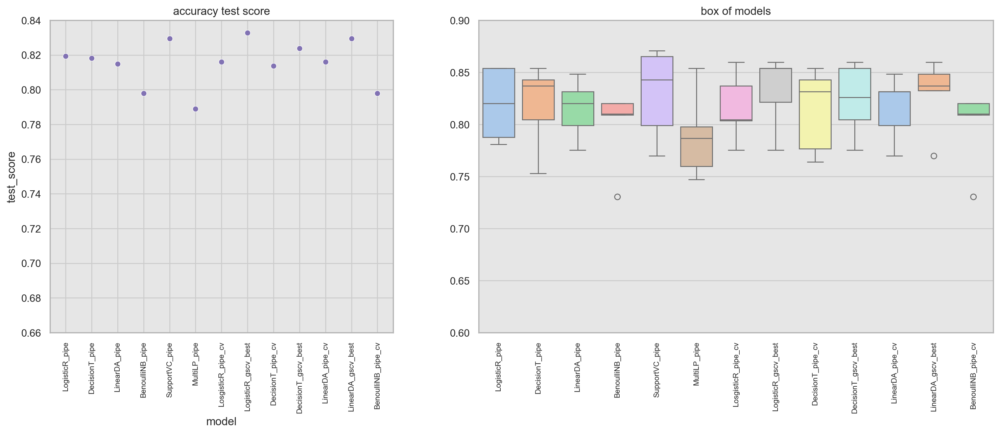

In [223]:
plt.figure(figsize=(18, 6))
gs = gridspec.GridSpec(nrows=1, ncols=2, width_ratios=[8, 12])

plt.subplot(gs[0])
g1 = sns.scatterplot(
        data=result_df,
        x=result_df.index,
        y="test_score",
        color="m",
)
g1.set(title="accuracy test score", ylim=(0.66, 0.84))
g1.set_xticklabels(labels=result_df.index, rotation=90, fontsize=8) 

plt.subplot(gs[1])
g2 = sns.boxplot(
    data=test_scores,
    palette="pastel"
)
g2.set(title="box of models", ylim=(0.60, 0.90))
g2.set_xticklabels(labels=test_scores.columns, rotation=90, fontsize=8) ;

In [224]:
get_test_std_df(result_df, test_scores)

,test_score,std
LogisticR_gscv_best,0.832785,0.035536
SupportVC_pipe,0.829439,0.043786
LinearDA_gscv_best,0.829402,0.035012
DecisionT_gscv_best,0.823815,0.035064
LogisticR_pipe,0.819340,0.034901
DecisionT_pipe,0.818197,0.040920
LinearDA_pipe_cv,0.815956,0.031474
LosgisticR_pipe_cv,0.815950,0.032755
LinearDA_pipe,0.814833,0.028484
DecisionT_pipe_cv,0.813734,0.040687


### GridSearchCV를 사용한 bnb_pipe 하이퍼 파라미터 튜닝 - (1)
- BernoulliNB 모델은 예측한 모수값이 0또는 1의 극단적인 값이 나올 경우 0.5에 가깝게 조절해주는 스무딩 alpha 파라미터를 사용할 수 있다.
- alpha 값을 0~1를 20으로 나눈 실수값으로 실험

In [225]:
%%time

bnb_params = {
    "model__alpha": [i for i in np.linspace(0, 1, 20)]
}

cv = KFold(n_splits=5, shuffle=True, random_state=50)
bnb_gscv_1 = GridSearchCV(estimator=bnb_pipe, param_grid=bnb_params, cv=cv, scoring="accuracy", return_train_score=True, n_jobs=2)
bnb_gscv_1.fit(X, y_enc)

CPU times: total: 281 ms
Wall time: 4.79 s


GridSearchCV(cv=KFold(n_splits=5, random_state=50, shuffle=True),
             estimator=Pipeline(steps=[('engineering',
                                        Pipeline(steps=[('preprocessor',
                                                         ColumnTransformer(remainder='passthrough',
                                                                           transformers=[('cat_transformer',
                                                                                          OneHotEncoder(),
                                                                                          ['Pclass',
                                                                                           'Sex',
                                                                                           'Embarked',
                                                                                           'title_name',
                                                                                           'generation']),
                                                                                         ('num_transformer',
                                                                                          Pipeline(steps=[('scaler',
                                                                                                           StandardScaler())]),
                                                                                          ['A...
                                          0.15789473684210525,
                                          0.21052631578947367,
                                          0.2631578947368421,
                                          0.3157894736842105,
                                          0.3684210526315789,
                                          0.42105263157894735,
                                          0.47368421052631576,
                                          0.5263157894736842,
                                          0.5789473684210527, 0.631578947368421,
                                          0.6842105263157894,
                                          0.7368421052631579,
                                          0.7894736842105263,
                                          0.8421052631578947, 0.894736842105263,
                                          0.9473684210526315, 1.0]},
             return_train_score=True, scoring='accuracy')

In [226]:
result_bnb_gscv_1 = pd.DataFrame(bnb_gscv_1.cv_results_).sort_values("rank_test_score")
cols = list(result_bnb_gscv_1.filter(regex="^param_model").columns) + ["mean_fit_time", "mean_test_score", "mean_train_score", "std_test_score", "rank_test_score"]
result_bnb_gscv_1[cols][:10].style.applymap(draw_color_cell, color="#ffd700", subset=(result_bnb_gscv_1.index[0]))

,param_model__alpha,mean_fit_time,mean_test_score,mean_train_score,std_test_score,rank_test_score
19,1.000000,0.026203,0.797966,0.805275,0.034153,1
17,0.894737,0.026601,0.797966,0.805275,0.034153,1
16,0.842105,0.026001,0.797966,0.805275,0.034153,1
15,0.789474,0.026602,0.797966,0.805275,0.034153,1
14,0.736842,0.025999,0.797966,0.805275,0.034153,1
13,0.684211,0.026201,0.797966,0.805275,0.034153,1
12,0.631579,0.026401,0.797966,0.805556,0.034153,1
18,0.947368,0.027201,0.797966,0.805275,0.034153,1
11,0.578947,0.026201,0.797966,0.805556,0.034153,1
1,0.052632,0.027201,0.796849,0.806398,0.039828,10


### GridSearchCV를 사용한 bnb_pipe 의 하이퍼 파라미터 튜닝 - (2)
- alpha 값을 0~1 사이를 10개로 나눈 실수값으로 실험
   - 0.1, 0.2, ..., 0.9
   - 앞에서 실험한 결과와 거의 같다.

In [227]:
%%time


bnb_params = {
    "model__alpha": [i/10 for i in range(0, 11)]
}

cv = KFold(n_splits=5, shuffle=True, random_state=50)
bnb_gscv_2 = GridSearchCV(estimator=bnb_pipe, param_grid=bnb_params, cv=cv, scoring="accuracy", return_train_score=True, n_jobs=2)
bnb_gscv_2.fit(X, y_enc)

CPU times: total: 188 ms
Wall time: 1.43 s


GridSearchCV(cv=KFold(n_splits=5, random_state=50, shuffle=True),
             estimator=Pipeline(steps=[('engineering',
                                        Pipeline(steps=[('preprocessor',
                                                         ColumnTransformer(remainder='passthrough',
                                                                           transformers=[('cat_transformer',
                                                                                          OneHotEncoder(),
                                                                                          ['Pclass',
                                                                                           'Sex',
                                                                                           'Embarked',
                                                                                           'title_name',
                                                                                           'generation']),
                                                                                         ('num_transformer',
                                                                                          Pipeline(steps=[('scaler',
                                                                                                           StandardScaler())]),
                                                                                          ['A...
                                                                                           'Fare',
                                                                                           'SibSp',
                                                                                           'Parch'])])),
                                                        ('feature_tech',
                                                         Pipeline(steps=[('feature_interaction',
                                                                          PolynomialFeatures(include_bias=False,
                                                                                             interaction_only=True)),
                                                                         ('feature_select',
                                                                          VarianceThreshold())]))])),
                                       ('model', BernoulliNB(alpha=0.8))]),
             n_jobs=2,
             param_grid={'model__alpha': [0.0, 0.1, 0.2, 0.3, 0.4, 0.5, 0.6,
                                          0.7, 0.8, 0.9, 1.0]},
             return_train_score=True, scoring='accuracy')

In [228]:
result_bnb_gscv_2 = pd.DataFrame(bnb_gscv_2.cv_results_).sort_values("rank_test_score")
cols = list(result_bnb_gscv_2.filter(regex="^param_model").columns) + ["mean_fit_time", "mean_test_score", "mean_train_score", "std_test_score", "rank_test_score"]
result_bnb_gscv_2[cols][:10].style.applymap(draw_color_cell, color="#ffd700", subset=(result_bnb_gscv_2.index[0]))

,param_model__alpha,mean_fit_time,mean_test_score,mean_train_score,std_test_score,rank_test_score
3,0.300000,0.026200,0.797966,0.805837,0.037163,1
6,0.600000,0.025600,0.797966,0.805556,0.034153,1
7,0.700000,0.026200,0.797966,0.805275,0.034153,1
8,0.800000,0.026000,0.797966,0.805275,0.034153,1
9,0.900000,0.025599,0.797966,0.805275,0.034153,1
10,1.000000,0.026201,0.797966,0.805275,0.034153,1
4,0.400000,0.025003,0.796843,0.806117,0.036380,7
5,0.500000,0.025800,0.796843,0.806117,0.036380,7
1,0.100000,0.026203,0.795725,0.806117,0.039066,9
2,0.200000,0.025801,0.795725,0.806117,0.039066,9


### GridSearchCV를 사용한 bnb_pipe의 하이퍼 파라미터 튜닝 - (3)
- alpha 값을 1e-10 ~ 1.0 까지 1을 10의 제곱승으로 나눈 값으로 실험

In [229]:
%%time


bnb_params = {
    "model__alpha": [1/(10**i) for i in range(0, 11)]
}

cv = KFold(n_splits=5, shuffle=True, random_state=50)
bnb_gscv_3 = GridSearchCV(estimator=bnb_pipe, param_grid=bnb_params, cv=cv, scoring="accuracy", return_train_score=True, n_jobs=2)
bnb_gscv_3.fit(X, y_enc)

CPU times: total: 203 ms
Wall time: 1.46 s


GridSearchCV(cv=KFold(n_splits=5, random_state=50, shuffle=True),
             estimator=Pipeline(steps=[('engineering',
                                        Pipeline(steps=[('preprocessor',
                                                         ColumnTransformer(remainder='passthrough',
                                                                           transformers=[('cat_transformer',
                                                                                          OneHotEncoder(),
                                                                                          ['Pclass',
                                                                                           'Sex',
                                                                                           'Embarked',
                                                                                           'title_name',
                                                                                           'generation']),
                                                                                         ('num_transformer',
                                                                                          Pipeline(steps=[('scaler',
                                                                                                           StandardScaler())]),
                                                                                          ['A...
                                                                                           'Parch'])])),
                                                        ('feature_tech',
                                                         Pipeline(steps=[('feature_interaction',
                                                                          PolynomialFeatures(include_bias=False,
                                                                                             interaction_only=True)),
                                                                         ('feature_select',
                                                                          VarianceThreshold())]))])),
                                       ('model', BernoulliNB(alpha=0.8))]),
             n_jobs=2,
             param_grid={'model__alpha': [1.0, 0.1, 0.01, 0.001, 0.0001, 1e-05,
                                          1e-06, 1e-07, 1e-08, 1e-09, 1e-10]},
             return_train_score=True, scoring='accuracy')

In [230]:
result_bnb_gscv_3 = pd.DataFrame(bnb_gscv_3.cv_results_).sort_values("rank_test_score")
cols = list(result_bnb_gscv_3.filter(regex="^param_model").columns) + ["mean_fit_time", "mean_test_score", "mean_train_score", "std_test_score", "rank_test_score"]
result_bnb_gscv_3[cols][:10].style.applymap(draw_color_cell, color="#ffd700", subset=(result_bnb_gscv_3.index[0]))

,param_model__alpha,mean_fit_time,mean_test_score,mean_train_score,std_test_score,rank_test_score
0,1.000000,0.024002,0.797966,0.805275,0.034153,1
2,0.010000,0.026201,0.796849,0.806398,0.039828,2
1,0.100000,0.026599,0.795725,0.806117,0.039066,3
3,0.001000,0.025600,0.792355,0.806678,0.037503,4
4,0.000100,0.026404,0.792355,0.807520,0.037838,4
5,0.000010,0.026400,0.792355,0.807801,0.037838,4
6,0.000001,0.025601,0.791237,0.807801,0.037545,7
7,0.000000,0.025798,0.791231,0.808642,0.037239,8
8,0.000000,0.026201,0.791231,0.809484,0.037239,8
9,0.000000,0.026200,0.791231,0.810606,0.037239,8


#### 3번의 실험별 best model 비교
- 현재의 데이터에서는 BernoulliNB 모델의 alpah 파라미터를 조정해도 test score에 영향을 미치지 않는다.
   - 이중에서 alpha=1.0 일때 예측 모수값을 균형있게 조정해준다.

In [231]:
bnb_gscv_1_best = pd.DataFrame(bnb_gscv_1.best_params_, index=range(1)).assign(model="bnb_gscv_1")
bnb_gscv_2_best = pd.DataFrame(bnb_gscv_2.best_params_, index=range(1)).assign(model="bnb_gscv_2")
bnb_gscv_3_best = pd.DataFrame(bnb_gscv_3.best_params_, index=range(1)).assign(model="bnb_gscv_3")

bnb_gscv_best_compare = pd.concat([bnb_gscv_1_best, bnb_gscv_2_best, bnb_gscv_3_best], axis=0).reset_index(drop=True)
bnb_gscv_best_compare["test_score"] = [bnb_gscv_1.best_score_, bnb_gscv_2.best_score_, bnb_gscv_3.best_score_]
bnb_gscv_best_compare\
    .fillna(0)\
    .sort_values("test_score", ascending=False)\
    .reset_index(drop=True)\
    .style.applymap(draw_color_cell, color="#ffd700", subset=(bnb_gscv_best_compare.index[0]))

,model__alpha,model,test_score
0,0.578947,bnb_gscv_1,0.797966
1,0.300000,bnb_gscv_2,0.797966
2,1.000000,bnb_gscv_3,0.797966


### GridSearchCV로 실험한 BernoulliNB 모델 중 best 모델을 사용하여 cv 테스트

In [232]:
%%time

bnb_gscv_best_model = bnb_gscv_3.best_estimator_
result_bnb_gscv_best, accs_bnb_gscv_best = get_cv_result(X, y_enc, [bnb_gscv_best_model], ["BernoulliNB_gscv_best"])

CPU times: total: 1.22 s
Wall time: 324 ms


In [233]:
result_df = pd.concat([result_df, result_bnb_gscv_best], axis=0)
result_df

,train_score,test_score,pre_score,recall_score,f1_score
model,,,,,
LogisticR_pipe,0.857463,0.819340,0.822739,0.683746,0.743826
DecisionT_pipe,0.832492,0.818197,0.784863,0.725230,0.753210
LinearDA_pipe,0.863634,0.814833,0.816732,0.674496,0.735800
BenoulliNB_pipe,0.805275,0.797966,0.728940,0.751205,0.739163
SupportVC_pipe,0.849608,0.829439,0.818343,0.718170,0.764546
MultiLP_pipe,0.916385,0.789034,0.732820,0.691499,0.708047
LosgisticR_pipe_cv,0.854658,0.815950,0.774596,0.738183,0.754394
LogisticR_gscv_best,0.840630,0.832785,0.815822,0.731699,0.770646
DecisionT_pipe_cv,0.829687,0.813734,0.790074,0.710094,0.742860


In [234]:
test_scores["BernoulliNB_gscv_best"] = accs_bnb_gscv_best[0][1]
test_scores

,LogisticR_pipe,DecisionT_pipe,LinearDA_pipe,BenoulliNB_pipe,SupportVC_pipe,MultiLP_pipe,LosgisticR_pipe_cv,LogisticR_gscv_best,DecisionT_pipe_cv,DecisionT_gscv_best,LinearDA_pipe_cv,LinearDA_gscv_best,BenoulliNB_pipe_cv,BernoulliNB_gscv_best
0,0.787709,0.804469,0.798883,0.810056,0.798883,0.759777,0.804469,0.821229,0.776536,0.804469,0.798883,0.832402,0.810056,0.810056
1,0.853933,0.837079,0.831461,0.820225,0.865169,0.786517,0.837079,0.853933,0.842697,0.825843,0.848315,0.859551,0.820225,0.820225
2,0.853933,0.853933,0.848315,0.820225,0.870787,0.853933,0.859551,0.859551,0.853933,0.859551,0.831461,0.848315,0.820225,0.820225
3,0.780899,0.752809,0.775281,0.730337,0.769663,0.747191,0.775281,0.775281,0.764045,0.775281,0.769663,0.769663,0.730337,0.730337
4,0.820225,0.842697,0.820225,0.808989,0.842697,0.797753,0.803371,0.853933,0.831461,0.853933,0.831461,0.837079,0.808989,0.808989


### 모델 별 성능 비교

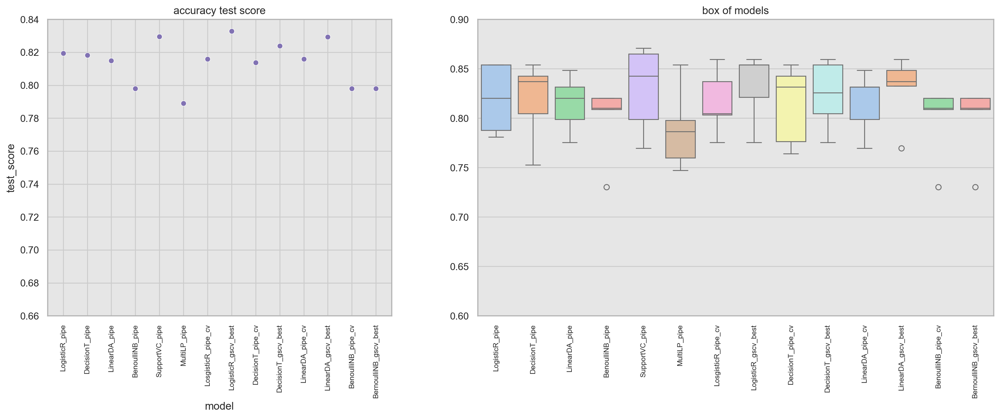

In [235]:
plt.figure(figsize=(19, 6))
gs = gridspec.GridSpec(nrows=1, ncols=2, width_ratios=[8, 12])

plt.subplot(gs[0])
g1 = sns.scatterplot(
        data=result_df,
        x=result_df.index,
        y="test_score",
        color="m",
)
g1.set(title="accuracy test score", ylim=(0.66, 0.84))
g1.set_xticks(ticks=range(len(result_df.index)), labels=result_df.index, rotation=90, fontsize=8) 

plt.subplot(gs[1])
g2 = sns.boxplot(
    data=test_scores,
    palette="pastel"
)
g2.set(title="box of models", ylim=(0.60, 0.90))
g2.set_xticks(ticks=range(len(test_scores.columns)), labels=test_scores.columns, rotation=90, fontsize=8) ;

In [236]:
get_test_std_df(result_df, test_scores)

,test_score,std
LogisticR_gscv_best,0.832785,0.035536
SupportVC_pipe,0.829439,0.043786
LinearDA_gscv_best,0.829402,0.035012
DecisionT_gscv_best,0.823815,0.035064
LogisticR_pipe,0.819340,0.034901
DecisionT_pipe,0.818197,0.040920
LinearDA_pipe_cv,0.815956,0.031474
LosgisticR_pipe_cv,0.815950,0.032755
LinearDA_pipe,0.814833,0.028484
DecisionT_pipe_cv,0.813734,0.040687


### best model save

In [237]:
dir_path = "./build_model"

save_model(dir_path, bnb_gscv_best_model, "BernoulliNB_gscv_best")

BernoulliNB_gscv_best save success.


In [238]:
os.listdir(dir_path)

['.ipynb_checkpoints',
 'BenoulliNB_pipe.pkl',
 'BernoulliNB_gscv_best.pkl',
 'DecisionT_gscv_best.pkl',
 'DecisionT_pipe.pkl',
 'LinearDA_gscv_best.pkl',
 'LinearDA_pipe.pkl',
 'LogisticR_gscv_best.pkl',
 'LogisticR_pipe.pkl',
 'MultiLP_pipe.pkl',
 'SupportVC_pipe.pkl']

### 개별 모형 modeling (2) - 5 : SVC
- SVM : Support Vector Machine
   - 판별함수 모형의 하나이다.
   - 퍼셉트론은 판별경계가 유니크하지 않은 단점이 있다.
   - 서포트 벡터 머신은 퍼셉트론 기반의 모형에 안정적인 판별함수(decison hyperplane)를 찾기위해 제한 조건을 추가한 모형
- 서포트 벡터란?
   - 클래스별 데이터 중에서 판별함수(판별경계)와 가장 가까운 데이터
   - x^+, x^-
   - 각 클래스 y=1, y=-1의 데이터 샘플중 판별함수와 가까운 것
- 마진이란?
   - 판별함수로부터 두 서포트 벡터와의 거리
   - (x+와 판별함수의 거리 - x-와 판별함수의 거리)
   - 마진= 2 / ||w||
   - 마진값이 클 수록 경계선이 더 안정적이다. 
- 슬랙변수 : 
   - 데이터가 직선이 판별경계선으로 나누어지지 않는다면? 선형분리로 불가능한 샘플의 경우 슬랙변수를 사용하여 개별 오차를 허용하여 분류를 쉽게 만들어준다.
   - 즉 완전히 선형분리가 안되어 클래스를 예측하기 애매한 경우의 샘플들.
   - 슬랙변수 엡실론은 0보다 크거나 같다.
- SVC 모형의 파라미터 C는 슬랙변수의 크기를 제어하는 상수이다.
   - 이 값에 따라서 서포트 벡터의 갯수가 달라진다. 즉 판별하기 어려운 데이터를 서포트로 묶어 준다.
- kernal SVC
   - 입력 데이터 x를 기저함수 벡터를 사용하여 변환하는 방식
   - D차원 벡터인 x를 M차원 기저함수 벡터로 변환
   - x_1 = (1, 2) 일때, 기저함수 벡터 phi(x) = (phi_1(x), phi_2(x), phi_3(x)) 로 변환하는 것.
   - 2차원 벡터가 3차원 벡터가 된다.
- 많이 사용되는 커널
   - 선형 서포트 벡터 머신 : k(x1, x2) = x1^Tx2 (두 벡터의 내적)
   - 다항 커널 (polynomial kernel) : k(x1, x2) = (gamma(x1^Tx2) + theta)^d
      - 벡터의 내적으로 정의된 커널을 확장한 것
   - RBF 커널 (Radial Basis Function) : k(x1, x2) = exp(-gamma||x1 - x2||^2) ---> 가우시안 커널
   - 시그모이드 커널 (sigmoid kernel) : k(x1, x2) = tahn(gamma(x1^Tx2) + theta)
   - 대표적인 커널들은 각각 기저함수로 분리된다.   

In [239]:
%%time

model_pipe.set_params(model=SVC())
model_pipe.fit(X_train, y_train)

CPU times: total: 31.2 ms
Wall time: 47 ms


Pipeline(steps=[('engineering',
                 Pipeline(steps=[('preprocessor',
                                  ColumnTransformer(remainder='passthrough',
                                                    transformers=[('cat_transformer',
                                                                   OneHotEncoder(),
                                                                   ['Pclass',
                                                                    'Sex',
                                                                    'Embarked',
                                                                    'title_name',
                                                                    'generation']),
                                                                  ('num_transformer',
                                                                   Pipeline(steps=[('scaler',
                                                                                    StandardScaler())]),
                                                                   ['Age',
                                                                    'Fare',
                                                                    'SibSp',
                                                                    'Parch'])])),
                                 ('feature_tech',
                                  Pipeline(steps=[('feature_interaction',
                                                   PolynomialFeatures(include_bias=False,
                                                                      interaction_only=True)),
                                                  ('feature_select',
                                                   VarianceThreshold())]))])),
                ('model', SVC())])

In [240]:
y_pred_train = model_pipe.predict(X_train)
y_pred_test = model_pipe.predict(X_test)

print("svc train acc : {}".format(accuracy_score(y_train, y_pred_train)))
print("svc test acc : {}".format(accuracy_score(y_test, y_pred_test)))

svc train acc : 0.8525280898876404
svc test acc : 0.8547486033519553


In [241]:
print(classification_report(y_test, y_pred_test))

              precision    recall  f1-score   support

           0       0.84      0.95      0.89       110
           1       0.89      0.71      0.79        69

    accuracy                           0.85       179
   macro avg       0.86      0.83      0.84       179
weighted avg       0.86      0.85      0.85       179



### cross_validate + model_pipe=svc

In [243]:
%%time

svc_pipe = model_pipe.set_params(model=SVC(kernel="rbf"))
result_svc_pipe_cv, accs_svc_pipe_cv = get_cv_result(X, y_enc, [svc_pipe], ["SupportVC_pipe_cv"])

CPU times: total: 828 ms
Wall time: 863 ms


In [244]:
result_df = result_df.iloc[:-1]
result_df = pd.concat([result_df, result_svc_pipe_cv], axis=0)
result_df

,train_score,test_score,pre_score,recall_score,f1_score
model,,,,,
LogisticR_pipe,0.857463,0.819340,0.822739,0.683746,0.743826
DecisionT_pipe,0.832492,0.818197,0.784863,0.725230,0.753210
LinearDA_pipe,0.863634,0.814833,0.816732,0.674496,0.735800
BenoulliNB_pipe,0.805275,0.797966,0.728940,0.751205,0.739163
SupportVC_pipe,0.849608,0.829439,0.818343,0.718170,0.764546
MultiLP_pipe,0.916385,0.789034,0.732820,0.691499,0.708047
LosgisticR_pipe_cv,0.854658,0.815950,0.774596,0.738183,0.754394
LogisticR_gscv_best,0.840630,0.832785,0.815822,0.731699,0.770646
DecisionT_pipe_cv,0.829687,0.813734,0.790074,0.710094,0.742860


In [245]:
test_scores["SupportVC_pipe_cv"] = accs_svc_pipe_cv[0][1]
test_scores

,LogisticR_pipe,DecisionT_pipe,LinearDA_pipe,BenoulliNB_pipe,SupportVC_pipe,MultiLP_pipe,LosgisticR_pipe_cv,LogisticR_gscv_best,DecisionT_pipe_cv,DecisionT_gscv_best,LinearDA_pipe_cv,LinearDA_gscv_best,BenoulliNB_pipe_cv,BernoulliNB_gscv_best,SupportVC_pipe_cv
0,0.787709,0.804469,0.798883,0.810056,0.798883,0.759777,0.804469,0.821229,0.776536,0.804469,0.798883,0.832402,0.810056,0.810056,0.798883
1,0.853933,0.837079,0.831461,0.820225,0.865169,0.786517,0.837079,0.853933,0.842697,0.825843,0.848315,0.859551,0.820225,0.820225,0.865169
2,0.853933,0.853933,0.848315,0.820225,0.870787,0.853933,0.859551,0.859551,0.853933,0.859551,0.831461,0.848315,0.820225,0.820225,0.870787
3,0.780899,0.752809,0.775281,0.730337,0.769663,0.747191,0.775281,0.775281,0.764045,0.775281,0.769663,0.769663,0.730337,0.730337,0.769663
4,0.820225,0.842697,0.820225,0.808989,0.842697,0.797753,0.803371,0.853933,0.831461,0.853933,0.831461,0.837079,0.808989,0.808989,0.842697


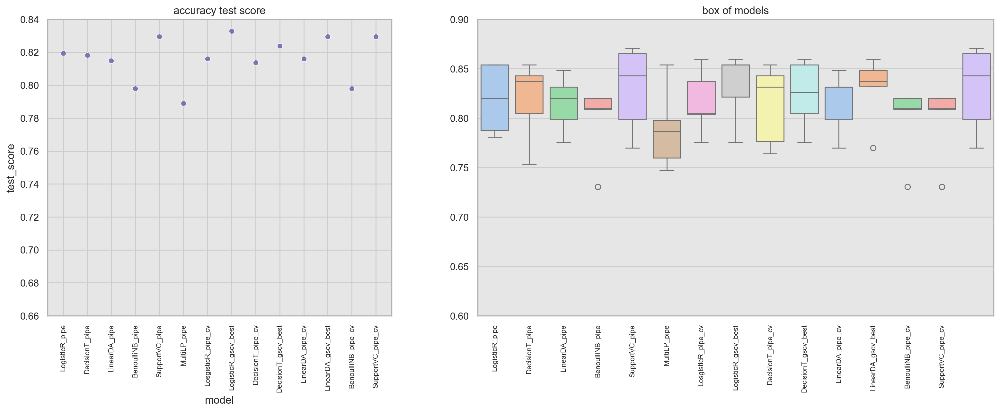

In [246]:
plt.figure(figsize=(19, 6))
gs = gridspec.GridSpec(nrows=1, ncols=2, width_ratios=[8, 12])

plt.subplot(gs[0])
g1 = sns.scatterplot(
        data=result_df,
        x=result_df.index,
        y="test_score",
        color="m",
)
g1.set(title="accuracy test score", ylim=(0.66, 0.84))
g1.set_xticklabels(labels=result_df.index, rotation=90, fontsize=8) 

plt.subplot(gs[1])
g2 = sns.boxplot(
    data=test_scores,
    palette="pastel"
)
g2.set(title="box of models", ylim=(0.60, 0.90))
g2.set_xticklabels(labels=result_df.index, rotation=90, fontsize=8) ;

In [247]:
get_test_std_df(result_df, test_scores)

,test_score,std
LogisticR_gscv_best,0.832785,0.035536
SupportVC_pipe,0.829439,0.043786
SupportVC_pipe_cv,0.829439,0.043786
LinearDA_gscv_best,0.829402,0.035012
DecisionT_gscv_best,0.823815,0.035064
LogisticR_pipe,0.819340,0.034901
DecisionT_pipe,0.818197,0.040920
LinearDA_pipe_cv,0.815956,0.031474
LosgisticR_pipe_cv,0.815950,0.032755
LinearDA_pipe,0.814833,0.028484


### GridSearchCV를 사용한 svc_pipe의 하이퍼 파라미터 튜닝 - (1)
#### kernel="linear"
- C 슬랙변수의 변화에 따른 성능 실험
   - range : 0.001 ~ 10.0 사이의 값
   - C 슬랙변수는 SVM의 목적함수에 추가 된 제한조건으로 판별경계면 주변의 완전히 분류가 되지 않는 샘플들에 적용되어 최대한 분류되도록 하는 가중치이다.
   - 0 보다 크거나 같다.
   - C 슬랙변수는 모든 kernel에 적용할 수 있다.
   - C와 gamma는 SVC 모형의 성능에 미치는 영향이 가장 크다.
   - 대체로 두 파라미터의 값이 반비례할 때 성능이 높아지는 것으로 알려져 있다. 
   - 두 파라미터의 값이 클 수록 fitting 시간이 길어진다.

In [248]:
%%time

svc_pipe = model_pipe.set_params(model=SVC())

svc_params = {
    "model__kernel": ["linear"],
    "model__C": list(np.logspace(-3, 0, 20)) + list(np.linspace(1, 10, 20))[1:],
    "model__class_weight": ["balanced", None],
    "model__cache_size": [500]
}

cv = KFold(n_splits=5, shuffle=True, random_state=50)
svc_gscv_1 = GridSearchCV(estimator=svc_pipe, param_grid=svc_params, cv=cv, scoring="accuracy", return_train_score=True)
svc_gscv_1.fit(X, y_enc)

CPU times: total: 52.5 s
Wall time: 54.1 s


GridSearchCV(cv=KFold(n_splits=5, random_state=50, shuffle=True),
             estimator=Pipeline(steps=[('engineering',
                                        Pipeline(steps=[('preprocessor',
                                                         ColumnTransformer(remainder='passthrough',
                                                                           transformers=[('cat_transformer',
                                                                                          OneHotEncoder(),
                                                                                          ['Pclass',
                                                                                           'Sex',
                                                                                           'Embarked',
                                                                                           'title_name',
                                                                                           'generation']),
                                                                                         ('num_transformer',
                                                                                          Pipeline(steps=[('scaler',
                                                                                                           StandardScaler())]),
                                                                                          ['A...
                                      0.4832930238571752, 0.6951927961775606,
                                      1.0, 1.4736842105263157,
                                      1.9473684210526314, 2.4210526315789473,
                                      2.894736842105263, 3.3684210526315788,
                                      3.8421052631578947, 4.315789473684211,
                                      4.789473684210526, 5.263157894736842,
                                      5.7368421052631575, ...],
                         'model__cache_size': [500],
                         'model__class_weight': ['balanced', None],
                         'model__kernel': ['linear']},
             return_train_score=True, scoring='accuracy')

In [249]:
result_svc_gscv_1 = pd.DataFrame(svc_gscv_1.cv_results_).sort_values("rank_test_score")
cols = list(result_svc_gscv_1.filter(regex="^param_model").columns) + ["mean_fit_time", "mean_test_score", "mean_train_score", "std_test_score", "rank_test_score"]
result_svc_gscv_1[cols][:10].style.applymap(draw_color_cell, color="#fdd700", subset=(result_svc_gscv_1.index[0]))

,param_model__C,param_model__cache_size,param_model__class_weight,param_model__kernel,mean_fit_time,mean_test_score,mean_train_score,std_test_score,rank_test_score
17,0.018330,500,None,linear,0.031375,0.832791,0.837823,0.036378,1
20,0.037927,500,balanced,linear,0.032991,0.832779,0.841190,0.034669,2
19,0.026367,500,None,linear,0.031776,0.831668,0.838103,0.035435,3
15,0.012743,500,None,linear,0.031183,0.831668,0.836420,0.035435,3
21,0.037927,500,None,linear,0.031182,0.830557,0.840068,0.034900,5
18,0.026367,500,balanced,linear,0.033580,0.830538,0.838384,0.039740,6
7,0.002976,500,None,linear,0.032384,0.830538,0.831370,0.039099,6
5,0.002069,500,None,linear,0.033391,0.830532,0.830248,0.038148,8
11,0.006158,500,None,linear,0.031378,0.829421,0.833895,0.036432,9
23,0.054556,500,None,linear,0.031775,0.828316,0.842313,0.037859,10


### GridSearchCV를 사용한 svc_pipe의 하이퍼 파라미터 튜닝 - (2)
- 슬랙변수 C의 크기에 따른 test score의 분포

In [250]:
svc_gscv_1_c_df = result_svc_gscv_1[["param_model__C", "mean_test_score"]]
svc_gscv_1_c_df["C_thr_1"] = svc_gscv_1_c_df["param_model__C"].apply(lambda x: "1_or_less" if x <= 1 else "exeeding_1")
svc_gscv_1_c_df.tail()

,param_model__C,mean_test_score,C_thr_1
52,4.315789,0.802498,exeeding_1
38,1.0,0.802498,1_or_less
46,2.894737,0.801375,exeeding_1
44,2.421053,0.801375,exeeding_1
56,5.263158,0.801368,exeeding_1


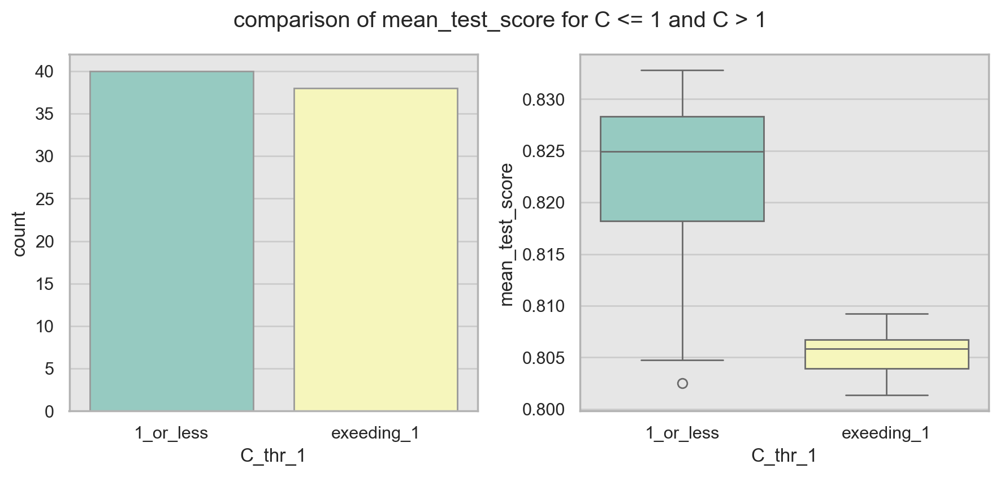

In [251]:
fig, axes = plt.subplots(nrows=1, ncols=2, figsize=(9, 4), constrained_layout=True)
palette_color = "Set3"

sns.countplot(
    data=svc_gscv_1_c_df,
    x="C_thr_1",
    palette=palette_color,
    edgecolor=".6",
    ax=axes[0]
)

sns.boxplot(
    data=svc_gscv_1_c_df,
    x="C_thr_1",
    y="mean_test_score",
    palette=palette_color,
    ax=axes[1]
)

plt.tight_layout()
plt.suptitle("comparison of mean_test_score for C <= 1 and C > 1", y=1.05) ;

### GridSearchCV를 사용한 svc_pipe의 하이퍼 파라미터 튜닝 - (3)
#### kernel="poly"
- x1, x2 벡터(데이터 샘플)의 내적을 확장한 다항식으로 여러가지 기저함수로 분리된다.
- gamma, theta(coef0), degree 파라미터를 조정할 수 있다. 
   - gamma 값은 샘플 표본 하나가 훈련에 미치는 영향력을 조절한다.
   - gamma 가 클 수록 데이터 샘플에 영향을 많이 받는다.
   - gamma와 C 슬랙변수는 대체로 반비례 관계로 성능에 영향을 미친다.
   - gamma의 갯수과 크기가 커지면 훈련시간이 매우 길어진다.
- 현재 데이터에 대한 하이퍼 파라미터 튜닝 결과
   - degree는 1차원이 가장 성능이 좋다.
   - gamma는 0.1보다 작으면 성능이 대체로 낮고, 0.1~1.0 사이에서 대체로 성능이 높다.

In [252]:
%%time

svc_params = {
    "model__kernel": ["poly"],
    "model__gamma": [0.001, 0.01, 0.02, 0.03, 0.1, 0.2, 0.3, 1.0],
    "model__degree": [1, 2, 3],
    "model__coef0": [0.001, 0.01, 0.02, 0.03, 0.1, 0.2, 0.3, 1.0],
    #"model__C": np.logspace(-3, 0, 10),
}

cv = KFold(n_splits=5, shuffle=True, random_state=50)
svc_gscv_2 = GridSearchCV(estimator=svc_pipe, param_grid=svc_params, cv=cv, scoring="accuracy", return_train_score=True)
svc_gscv_2.fit(X, y_enc)

CPU times: total: 9min 17s
Wall time: 9min 27s


GridSearchCV(cv=KFold(n_splits=5, random_state=50, shuffle=True),
             estimator=Pipeline(steps=[('engineering',
                                        Pipeline(steps=[('preprocessor',
                                                         ColumnTransformer(remainder='passthrough',
                                                                           transformers=[('cat_transformer',
                                                                                          OneHotEncoder(),
                                                                                          ['Pclass',
                                                                                           'Sex',
                                                                                           'Embarked',
                                                                                           'title_name',
                                                                                           'generation']),
                                                                                         ('num_transformer',
                                                                                          Pipeline(steps=[('scaler',
                                                                                                           StandardScaler())]),
                                                                                          ['A...
                                                         Pipeline(steps=[('feature_interaction',
                                                                          PolynomialFeatures(include_bias=False,
                                                                                             interaction_only=True)),
                                                                         ('feature_select',
                                                                          VarianceThreshold())]))])),
                                       ('model', SVC())]),
             param_grid={'model__coef0': [0.001, 0.01, 0.02, 0.03, 0.1, 0.2,
                                          0.3, 1.0],
                         'model__degree': [1, 2, 3],
                         'model__gamma': [0.001, 0.01, 0.02, 0.03, 0.1, 0.2,
                                          0.3, 1.0],
                         'model__kernel': ['poly']},
             return_train_score=True, scoring='accuracy')

In [253]:
result_svc_gscv_2 = pd.DataFrame(svc_gscv_2.cv_results_).sort_values("rank_test_score")
cols = list(result_svc_gscv_2.filter(regex="^param_model").columns) + ["mean_fit_time", "mean_test_score", "mean_train_score", "std_test_score", "rank_test_score"]
result_svc_gscv_2[cols][:10].style.applymap(draw_color_cell, color="#fdd700", subset=(result_svc_gscv_2.index[0]))

,param_model__coef0,param_model__degree,param_model__gamma,param_model__kernel,mean_fit_time,mean_test_score,mean_train_score,std_test_score,rank_test_score
50,0.020000,1,0.020000,poly,0.029999,0.831668,0.838384,0.035435,1
170,1.000000,1,0.020000,poly,0.031404,0.831668,0.838384,0.035435,1
2,0.001000,1,0.020000,poly,0.031995,0.831668,0.838384,0.035435,1
146,0.300000,1,0.020000,poly,0.031385,0.831668,0.838384,0.035435,1
74,0.030000,1,0.020000,poly,0.029996,0.831668,0.838384,0.035435,1
26,0.010000,1,0.020000,poly,0.030199,0.831668,0.838384,0.035435,1
122,0.200000,1,0.020000,poly,0.030199,0.831668,0.838384,0.035435,1
98,0.100000,1,0.020000,poly,0.030799,0.831668,0.838384,0.035435,1
177,1.000000,2,0.010000,poly,0.032399,0.830544,0.840910,0.031560,9
123,0.200000,1,0.030000,poly,0.031799,0.829433,0.838945,0.036705,10


### 하이퍼 파라미터 coef0와 gamma의 test score 분포 비교

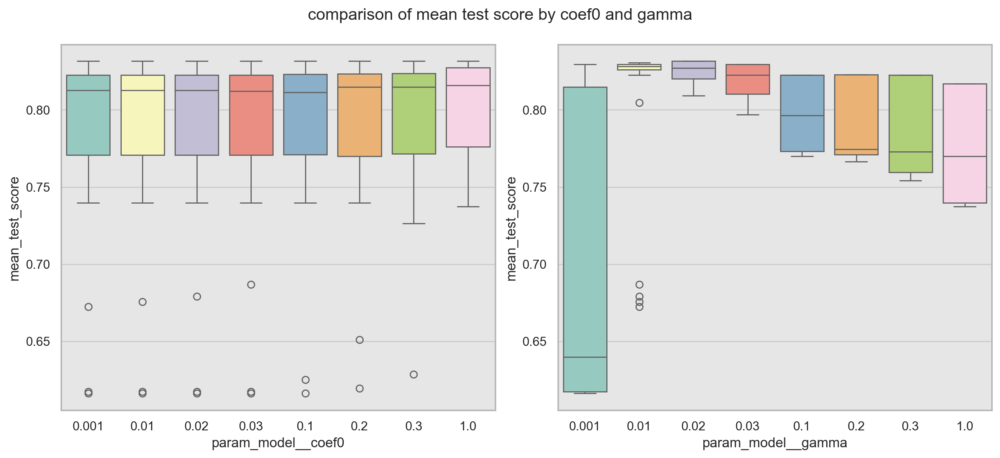

In [254]:
fig, axes = plt.subplots(nrows=1, ncols=2, figsize=(12, 5), constrained_layout=True)
palette_color = "Set3"

sns.boxplot(
    data=result_svc_gscv_2,
    x="param_model__coef0",
    y="mean_test_score",
    palette=palette_color,
    ax=axes[0]
)

sns.boxplot(
    data=result_svc_gscv_2,
    x="param_model__gamma",
    y="mean_test_score",
    palette=palette_color,
    ax=axes[1]
)

fig.suptitle("comparison of mean test score by coef0 and gamma", y=1.08) ;

### GridSearchCV를 사용한 svc_pipe의 하이퍼 파라미터 튜닝 - (4)
#### kernel="poly" 
- 위에서 튜닝한 결과를 바탕으로 파라미터 값 조정 + C 슬랙변수 추가
- C 슬랙변수는 0.1 ~ 1.0 사이의 값에서 대체로 성능이 높은 편이다.
   - gamma와 C 값의 특정조합에서 성능이 높은 결과가 나왔다.

In [255]:
%%time

svc_params = {
    "model__kernel": ["poly"],
    "model__gamma": [0.01, 0.02, 0.03, 0.04, 0.05, 0.1],
    "model__degree": [1, 2, 3],
    "model__coef0": [0.01, 0.02, 0.03, 0.04, 0.05, 0.1],
    "model__C": np.logspace(-1, 0, 20),
}

cv = KFold(n_splits=5, shuffle=True, random_state=50)
svc_gscv_2_2 = GridSearchCV(estimator=svc_pipe, param_grid=svc_params, cv=cv, scoring="accuracy", return_train_score=True)
svc_gscv_2_2.fit(X, y_enc)

CPU times: total: 12min 34s
Wall time: 13min 9s


GridSearchCV(cv=KFold(n_splits=5, random_state=50, shuffle=True),
             estimator=Pipeline(steps=[('engineering',
                                        Pipeline(steps=[('preprocessor',
                                                         ColumnTransformer(remainder='passthrough',
                                                                           transformers=[('cat_transformer',
                                                                                          OneHotEncoder(),
                                                                                          ['Pclass',
                                                                                           'Sex',
                                                                                           'Embarked',
                                                                                           'title_name',
                                                                                           'generation']),
                                                                                         ('num_transformer',
                                                                                          Pipeline(steps=[('scaler',
                                                                                                           StandardScaler())]),
                                                                                          ['A...
             param_grid={'model__C': array([0.1       , 0.11288379, 0.1274275 , 0.14384499, 0.16237767,
       0.18329807, 0.20691381, 0.23357215, 0.26366509, 0.29763514,
       0.33598183, 0.37926902, 0.42813324, 0.48329302, 0.54555948,
       0.61584821, 0.6951928 , 0.78475997, 0.88586679, 1.        ]),
                         'model__coef0': [0.01, 0.02, 0.03, 0.04, 0.05, 0.1],
                         'model__degree': [1, 2, 3],
                         'model__gamma': [0.01, 0.02, 0.03, 0.04, 0.05, 0.1],
                         'model__kernel': ['poly']},
             return_train_score=True, scoring='accuracy')

In [256]:
result_svc_gscv_2_2 = pd.DataFrame(svc_gscv_2_2.cv_results_).sort_values("rank_test_score")
cols = list(result_svc_gscv_2_2.filter(regex="^param_model").columns) + ["mean_fit_time", "mean_test_score", "mean_train_score", "std_test_score", "rank_test_score"]
result_svc_gscv_2_2[cols][:10].style.applymap(draw_color_cell, color="#fdd700", subset=(result_svc_gscv_2_2.index[0]))

,param_model__C,param_model__coef0,param_model__degree,param_model__gamma,param_model__kernel,mean_fit_time,mean_test_score,mean_train_score,std_test_score,rank_test_score
797,0.233572,0.030000,1,0.100000,poly,0.047196,0.833909,0.837823,0.035564,1
1462,0.483293,0.040000,1,0.050000,poly,0.033795,0.833909,0.837823,0.035564,1
1480,0.483293,0.050000,1,0.050000,poly,0.034400,0.833909,0.837823,0.035564,1
1713,0.615848,0.100000,1,0.040000,poly,0.033398,0.833909,0.837823,0.035564,1
1874,0.784760,0.030000,1,0.030000,poly,0.035593,0.833909,0.837823,0.035564,1
1498,0.483293,0.100000,1,0.050000,poly,0.033999,0.833909,0.837823,0.035564,1
851,0.233572,0.100000,1,0.100000,poly,0.030393,0.833909,0.837823,0.035564,1
1677,0.615848,0.040000,1,0.040000,poly,0.033801,0.833909,0.837823,0.035564,1
1838,0.784760,0.010000,1,0.030000,poly,0.037001,0.833909,0.837823,0.035564,1
1928,0.784760,0.100000,1,0.030000,poly,0.040606,0.833909,0.837823,0.035564,1


In [257]:
result_svc_gscv_2_2.query("rank_test_score == 1")[cols].filter(regex="^param").apply(lambda x: x.unique(), axis=0).to_frame()

,0
param_model__C,"[0.23357214690901226, 0.4832930238571752, 0.61..."
param_model__coef0,"[0.03, 0.04, 0.05, 0.1, 0.01, 0.02]"
param_model__degree,[1]
param_model__gamma,"[0.1, 0.05, 0.04, 0.03]"
param_model__kernel,[poly]


### GridSearchCV를 사용한 svc_pipe의 하이퍼 파라미터 튜닝 - (5)
#### kernel="rbf"
- RBF 커널은 가우시안 커널로 두 벡터(데이터 샘플)간의 거리를 변형한 것과 같다.
- gamma와 C 파라미터를 적용할 수 있다.
   - C 슬랙변수는 0.1 보다 작은 값은 대체로 성능이 떨어진다. 따라서 0.1~1.0 사이의 값을 적용한다.
   - gamma 는 0.01, 0.02 주변에서 대체로 성능이 높다. 
   - gamma와 C는 1.0 보다 크면 대체로 성능이 낮다.

In [258]:
%%time

svc_params = {
    "model__kernel": ["rbf"],
    "model__gamma": [0.01, 0.02, 0.03, 0.04, 0.05, 0.1, 1.0, 2.0],
    "model__C": np.logspace(-1, 0, 8),
    "model__cache_size": [500]
}

cv = KFold(n_splits=5, shuffle=True, random_state=50)
svc_gscv_3 = GridSearchCV(estimator=svc_pipe, param_grid=svc_params, cv=cv, scoring="accuracy", return_train_score=True)
svc_gscv_3.fit(X, y_enc)

CPU times: total: 40.1 s
Wall time: 41.6 s


GridSearchCV(cv=KFold(n_splits=5, random_state=50, shuffle=True),
             estimator=Pipeline(steps=[('engineering',
                                        Pipeline(steps=[('preprocessor',
                                                         ColumnTransformer(remainder='passthrough',
                                                                           transformers=[('cat_transformer',
                                                                                          OneHotEncoder(),
                                                                                          ['Pclass',
                                                                                           'Sex',
                                                                                           'Embarked',
                                                                                           'title_name',
                                                                                           'generation']),
                                                                                         ('num_transformer',
                                                                                          Pipeline(steps=[('scaler',
                                                                                                           StandardScaler())]),
                                                                                          ['A...
                                                                          PolynomialFeatures(include_bias=False,
                                                                                             interaction_only=True)),
                                                                         ('feature_select',
                                                                          VarianceThreshold())]))])),
                                       ('model', SVC())]),
             param_grid={'model__C': array([0.1       , 0.13894955, 0.19306977, 0.26826958, 0.37275937,
       0.51794747, 0.71968567, 1.        ]),
                         'model__cache_size': [500],
                         'model__gamma': [0.01, 0.02, 0.03, 0.04, 0.05, 0.1,
                                          1.0, 2.0],
                         'model__kernel': ['rbf']},
             return_train_score=True, scoring='accuracy')

In [259]:
result_svc_gscv_3 = pd.DataFrame(svc_gscv_3.cv_results_).sort_values("rank_test_score")
cols = list(result_svc_gscv_3.filter(regex="^param_model").columns) + ["mean_fit_time", "mean_test_score", "mean_train_score", "std_test_score", "rank_test_score"]
result_svc_gscv_3[cols][:10].style.applymap(draw_color_cell, color="#ffd700", subset=(result_svc_gscv_3.index[0]))

,param_model__C,param_model__cache_size,param_model__gamma,param_model__kernel,mean_fit_time,mean_test_score,mean_train_score,std_test_score,rank_test_score
40,0.517947,500,0.010000,rbf,0.035382,0.830544,0.836701,0.035690,1
32,0.372759,500,0.010000,rbf,0.036197,0.830544,0.835579,0.035690,1
56,1.000000,500,0.010000,rbf,0.037798,0.830544,0.838946,0.035690,1
57,1.000000,500,0.020000,rbf,0.035983,0.829439,0.849047,0.038184,4
48,0.719686,500,0.010000,rbf,0.035387,0.829421,0.837824,0.035555,5
49,0.719686,500,0.020000,rbf,0.035583,0.827186,0.844557,0.035813,6
50,0.719686,500,0.030000,rbf,0.038790,0.827186,0.851572,0.036856,7
24,0.268270,500,0.010000,rbf,0.037593,0.827173,0.833334,0.035710,8
59,1.000000,500,0.040000,rbf,0.040380,0.827167,0.862794,0.037803,9
33,0.372759,500,0.020000,rbf,0.036192,0.826050,0.839226,0.035468,10


### 하이퍼 파라미터 C와 gamma의 조합에 따른 test score 비교

In [260]:
temp_svc_gscv_3 = result_svc_gscv_3[["param_model__C", "param_model__gamma", "mean_test_score"]]
temp_svc_gscv_3["C_gamma"] = temp_svc_gscv_3.apply(lambda x: str(x["param_model__C"].round(3)) + " & " + str(x["param_model__gamma"]), axis=1)
temp_svc_gscv_3[:10]

,param_model__C,param_model__gamma,mean_test_score,C_gamma
40,0.517947,0.01,0.830544,0.518 & 0.01
32,0.372759,0.01,0.830544,0.373 & 0.01
56,1.0,0.01,0.830544,1.0 & 0.01
57,1.0,0.02,0.829439,1.0 & 0.02
48,0.719686,0.01,0.829421,0.72 & 0.01
49,0.719686,0.02,0.827186,0.72 & 0.02
50,0.719686,0.03,0.827186,0.72 & 0.03
24,0.26827,0.01,0.827173,0.268 & 0.01
59,1.0,0.04,0.827167,1.0 & 0.04
33,0.372759,0.02,0.826050,0.373 & 0.02


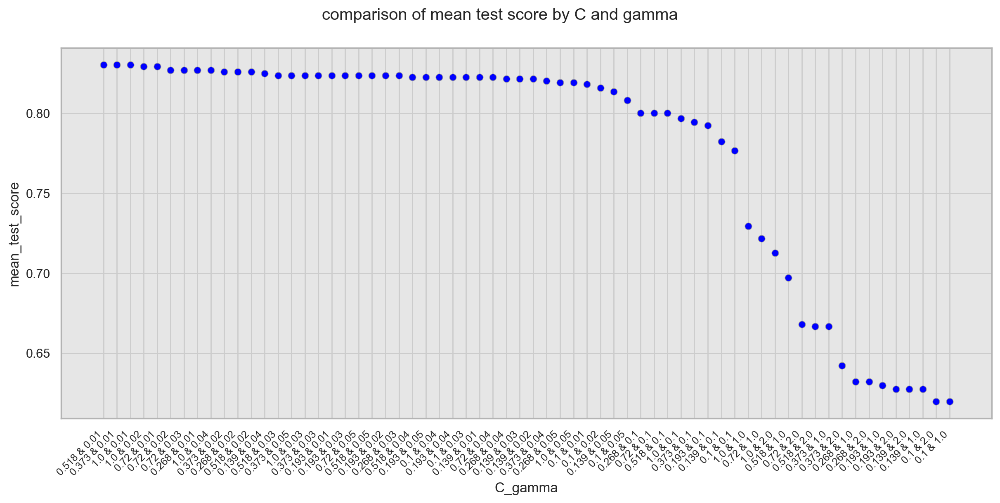

In [261]:
fig, axes = plt.subplots(nrows=1, ncols=1, figsize=(12, 5.5), constrained_layout=True)

sns.scatterplot(
    data=temp_svc_gscv_3,
    x="C_gamma",
    y="mean_test_score",
    color="blue",
    edgecolor=".6",
    ax=axes
)
axes.set_xticklabels(labels=temp_svc_gscv_3["C_gamma"], rotation=45, ha="right", fontsize=9)
#fig.autofmt_xdate(rotation=45)

fig.suptitle("comparison of mean test score by C and gamma", y=1.08) ;

### GridSearchCV를 사용한 svc_pipe의 하이퍼 파라미터 튜닝 - (6)
#### kernel="sigmoid" 
- 두 벡터(데이터 샘플)의 내적에 tahn 함수를 적용한 것과 같다.
- gamma, coef0, C 파라미터를 적용할 수 있다. 
   - 다른 kernel 보다 대체로 성능이 떨어지는 편이다.

In [262]:
%%time

svc_params = {
    "model__kernel": ["sigmoid"],
    "model__gamma": np.logspace(-2, -1, 6),
    "model__coef0": [0.01, 0.02, 0.03, 0.1, 0.2, 0.3, 1.0],
    "model__C": np.linspace(0.1, 0.5, 6),
    "model__cache_size": [500]
}

cv = KFold(n_splits=5, shuffle=True, random_state=50)
svc_gscv_4 = GridSearchCV(estimator=svc_pipe, param_grid=svc_params, cv=cv, scoring="accuracy", return_train_score=True)
svc_gscv_4.fit(X, y_enc)

CPU times: total: 1min 30s
Wall time: 1min 32s


GridSearchCV(cv=KFold(n_splits=5, random_state=50, shuffle=True),
             estimator=Pipeline(steps=[('engineering',
                                        Pipeline(steps=[('preprocessor',
                                                         ColumnTransformer(remainder='passthrough',
                                                                           transformers=[('cat_transformer',
                                                                                          OneHotEncoder(),
                                                                                          ['Pclass',
                                                                                           'Sex',
                                                                                           'Embarked',
                                                                                           'title_name',
                                                                                           'generation']),
                                                                                         ('num_transformer',
                                                                                          Pipeline(steps=[('scaler',
                                                                                                           StandardScaler())]),
                                                                                          ['A...
                                                                                             interaction_only=True)),
                                                                         ('feature_select',
                                                                          VarianceThreshold())]))])),
                                       ('model', SVC())]),
             param_grid={'model__C': array([0.1 , 0.18, 0.26, 0.34, 0.42, 0.5 ]),
                         'model__cache_size': [500],
                         'model__coef0': [0.01, 0.02, 0.03, 0.1, 0.2, 0.3, 1.0],
                         'model__gamma': array([0.01      , 0.01584893, 0.02511886, 0.03981072, 0.06309573,
       0.1       ]),
                         'model__kernel': ['sigmoid']},
             return_train_score=True, scoring='accuracy')

In [263]:
result_svc_gscv_4 = pd.DataFrame(svc_gscv_4.cv_results_).sort_values("rank_test_score")
cols = list(result_svc_gscv_4.filter(regex="^param_model").columns) + ["mean_fit_time", "mean_test_score", "mean_train_score", "std_test_score", "rank_test_score"]
result_svc_gscv_4[cols][:10].style.applymap(draw_color_cell, color="#ffd700", subset=(result_svc_gscv_4.index[0]))

,param_model__C,param_model__cache_size,param_model__coef0,param_model__gamma,param_model__kernel,mean_fit_time,mean_test_score,mean_train_score,std_test_score,rank_test_score
126,0.340000,500,0.010000,0.010000,sigmoid,0.038190,0.818185,0.818183,0.031280,1
132,0.340000,500,0.020000,0.010000,sigmoid,0.035793,0.817067,0.818183,0.031450,2
42,0.180000,500,0.010000,0.010000,sigmoid,0.038174,0.817067,0.819304,0.034329,3
48,0.180000,500,0.020000,0.010000,sigmoid,0.037588,0.817067,0.818463,0.034329,3
54,0.180000,500,0.030000,0.010000,sigmoid,0.037382,0.817067,0.818463,0.034329,3
168,0.420000,500,0.010000,0.010000,sigmoid,0.034383,0.817061,0.814817,0.033809,6
60,0.180000,500,0.100000,0.010000,sigmoid,0.037593,0.815956,0.815657,0.030518,7
90,0.260000,500,0.020000,0.010000,sigmoid,0.036579,0.815944,0.818743,0.030809,8
198,0.420000,500,0.300000,0.010000,sigmoid,0.037002,0.815944,0.812851,0.030809,8
72,0.180000,500,0.300000,0.010000,sigmoid,0.037777,0.815944,0.814817,0.028244,8


### svc_pipe의 하이퍼 파라미터 튜닝 비교

In [265]:
svc_gscv_1_best = pd.DataFrame(svc_gscv_1.best_params_, index=range(1)).assign(model="svc_gscv_1")
svc_gscv_2_best = pd.DataFrame(svc_gscv_2.best_params_, index=range(1)).assign(model="svc_gscv_2")
svc_gscv_2_2_best = pd.DataFrame(svc_gscv_2_2.best_params_, index=range(1)).assign(model="svc_gscv_2_2")
svc_gscv_3_best = pd.DataFrame(svc_gscv_3.best_params_, index=range(1)).assign(model="svc_gscv_3")
svc_gscv_4_best = pd.DataFrame(svc_gscv_4.best_params_, index=range(1)).assign(model="svc_gscv_3")

svc_gscv_best_compare = pd.concat([svc_gscv_1_best, svc_gscv_2_best, svc_gscv_2_2_best, svc_gscv_3_best, svc_gscv_4_best],
                                  axis=0).reset_index(drop=True)
svc_gscv_best_compare["test_score"] = [svc_gscv_1.best_score_, svc_gscv_2.best_score_, 
                                       svc_gscv_2_2.best_score_, svc_gscv_3.best_score_, svc_gscv_4.best_score_]
svc_gscv_best_compare\
    .fillna(0)\
    .sort_values("test_score", ascending=False)\
    .reset_index(drop=True)\
    .style.applymap(draw_color_cell, color="#ffd700", subset=(svc_gscv_best_compare.index[0]))

,model__C,model__cache_size,model__class_weight,model__kernel,model,model__coef0,model__degree,model__gamma,test_score
0,0.233572,0.000000,0,poly,svc_gscv_2_2,0.010000,1.000000,0.100000,0.833909
1,0.018330,500.000000,0,linear,svc_gscv_1,0.000000,0.000000,0.000000,0.832791
2,0.000000,0.000000,0,poly,svc_gscv_2,0.001000,1.000000,0.020000,0.831668
3,0.372759,500.000000,0,rbf,svc_gscv_3,0.000000,0.000000,0.010000,0.830544
4,0.340000,500.000000,0,sigmoid,svc_gscv_3,0.010000,0.000000,0.010000,0.818185


### GridSearchCV로 실험한 SVC 모델 중 best 모델을 사용하여 cv 테스트

In [266]:
%%time

# svc_gscv_2_2 모델
svc_gscv_best_model = eval(svc_gscv_best_compare.iloc[svc_gscv_best_compare["test_score"].argmax()]["model"]).best_estimator_
result_svc_gscv_best, accs_svc_gscv_best = get_cv_result(X, y_enc, [svc_gscv_best_model], ["SupportVC_gscv_best"])

CPU times: total: 500 ms
Wall time: 564 ms


In [267]:
result_df = pd.concat([result_df, result_svc_gscv_best], axis=0)
result_df

,train_score,test_score,pre_score,recall_score,f1_score
model,,,,,
LogisticR_pipe,0.857463,0.819340,0.822739,0.683746,0.743826
DecisionT_pipe,0.832492,0.818197,0.784863,0.725230,0.753210
LinearDA_pipe,0.863634,0.814833,0.816732,0.674496,0.735800
BenoulliNB_pipe,0.805275,0.797966,0.728940,0.751205,0.739163
SupportVC_pipe,0.849608,0.829439,0.818343,0.718170,0.764546
MultiLP_pipe,0.916385,0.789034,0.732820,0.691499,0.708047
LosgisticR_pipe_cv,0.854658,0.815950,0.774596,0.738183,0.754394
LogisticR_gscv_best,0.840630,0.832785,0.815822,0.731699,0.770646
DecisionT_pipe_cv,0.829687,0.813734,0.790074,0.710094,0.742860


In [268]:
test_scores["SupportVC_gscv_best"] = accs_svc_gscv_best[0][1]
test_scores

,LogisticR_pipe,DecisionT_pipe,LinearDA_pipe,BenoulliNB_pipe,SupportVC_pipe,MultiLP_pipe,LosgisticR_pipe_cv,LogisticR_gscv_best,DecisionT_pipe_cv,DecisionT_gscv_best,LinearDA_pipe_cv,LinearDA_gscv_best,BenoulliNB_pipe_cv,BernoulliNB_gscv_best,SupportVC_pipe_cv,SupportVC_gscv_best
0,0.787709,0.804469,0.798883,0.810056,0.798883,0.759777,0.804469,0.821229,0.776536,0.804469,0.798883,0.832402,0.810056,0.810056,0.798883,0.821229
1,0.853933,0.837079,0.831461,0.820225,0.865169,0.786517,0.837079,0.853933,0.842697,0.825843,0.848315,0.859551,0.820225,0.820225,0.865169,0.859551
2,0.853933,0.853933,0.848315,0.820225,0.870787,0.853933,0.859551,0.859551,0.853933,0.859551,0.831461,0.848315,0.820225,0.820225,0.870787,0.865169
3,0.780899,0.752809,0.775281,0.730337,0.769663,0.747191,0.775281,0.775281,0.764045,0.775281,0.769663,0.769663,0.730337,0.730337,0.769663,0.769663
4,0.820225,0.842697,0.820225,0.808989,0.842697,0.797753,0.803371,0.853933,0.831461,0.853933,0.831461,0.837079,0.808989,0.808989,0.842697,0.853933


### 모델별 성능 비교

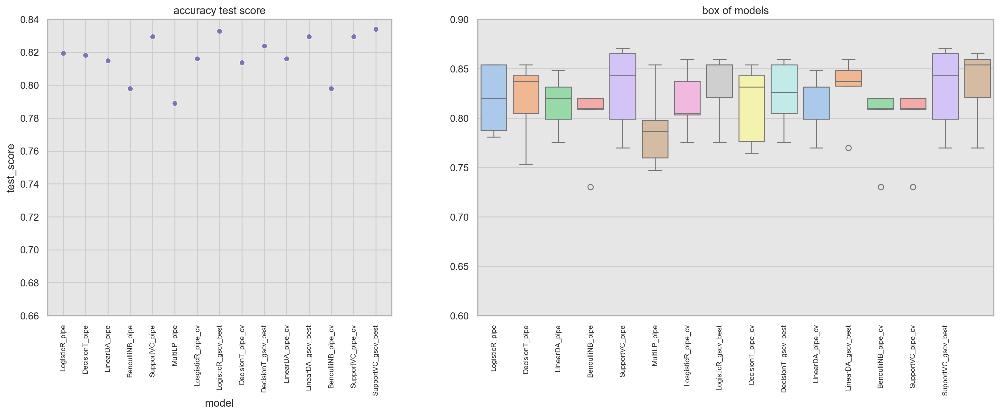

In [269]:
plt.figure(figsize=(19, 6))
gs = gridspec.GridSpec(nrows=1, ncols=2, width_ratios=[8, 12])

plt.subplot(gs[0])
g1 = sns.scatterplot(
        data=result_df,
        x=result_df.index,
        y="test_score",
        color="m",
)
g1.set(title="accuracy test score", ylim=(0.66, 0.84))
g1.set_xticklabels(labels=result_df.index, rotation=90, fontsize=8) 

plt.subplot(gs[1])
g2 = sns.boxplot(
    data=test_scores,
    palette="pastel"
)
g2.set(title="box of models", ylim=(0.60, 0.90))
g2.set_xticklabels(labels=result_df.index, rotation=90, fontsize=8) ;

In [270]:
get_test_std_df(result_df, test_scores)

,test_score,std
SupportVC_gscv_best,0.833909,0.039762
LogisticR_gscv_best,0.832785,0.035536
SupportVC_pipe,0.829439,0.043786
SupportVC_pipe_cv,0.829439,0.043786
LinearDA_gscv_best,0.829402,0.035012
DecisionT_gscv_best,0.823815,0.035064
LogisticR_pipe,0.819340,0.034901
DecisionT_pipe,0.818197,0.040920
LinearDA_pipe_cv,0.815956,0.031474
LosgisticR_pipe_cv,0.815950,0.032755


### best model save

In [271]:
dir_path = "./build_model"

save_model(dir_path, svc_gscv_best_model, "SupportVC_gscv_best")

SupportVC_gscv_best save success.


In [272]:
os.listdir(dir_path)

['.ipynb_checkpoints',
 'BenoulliNB_pipe.pkl',
 'BernoulliNB_gscv_best.pkl',
 'DecisionT_gscv_best.pkl',
 'DecisionT_pipe.pkl',
 'LinearDA_gscv_best.pkl',
 'LinearDA_pipe.pkl',
 'LogisticR_gscv_best.pkl',
 'LogisticR_pipe.pkl',
 'MultiLP_pipe.pkl',
 'SupportVC_gscv_best.pkl',
 'SupportVC_pipe.pkl']

### 개별 모델 modeling (2) - 6 : MLPClassifier
- MLP 모델은 판별함수 모델로 신경망(hidden_layer) 구조를 사용한다. 
- 손실함수를 최적화하기 위해 손실함수 값을 활성함수(activation function)로 계산하고 이 값을 역전파(backpropagation)를 사용하여 이전 layer로 보내 가중치를 업데이트 한다.
- MLP의 학습방식
   - 역전파를 사용하여 학습한다.
   - 경사하강법을 사용하여 훈련하고, 역전파를 사용하여 경사를 계산한다. 
- 확률값
   - 교차엔트로피(cross entropy loss function) 손실 함수를 사용하여 확률 추정치 벡터를 반환한다. 
- 출력함수
   - softmax 함수를 사용하여 출력함수로 적용하고 다중 클래스 분류 문제를 지원한다.
   - softmax 함수는 다변수 입력을 확률 처럼 보이게 해준다. (출력 값이 0~1사이의 값)
- 데이터 스케일링에 민감하다.
   - 입력 데이터의 값을 [0, 1]이나 [-1, 1] 로 스케일링 한다.
   - 또는 평균 0, 분산 1로 스케일링한다. (StandardScaler() 사용)


In [25]:
%%time

model_pipe.set_params(model=model_link["mlp"])
model_pipe.fit(X_train, y_train)

CPU times: total: 2.97 s
Wall time: 913 ms


Pipeline(steps=[('engineering',
                 Pipeline(steps=[('preprocessor',
                                  ColumnTransformer(remainder='passthrough',
                                                    transformers=[('cat_transformer',
                                                                   OneHotEncoder(),
                                                                   ['Pclass',
                                                                    'Sex',
                                                                    'generation',
                                                                    'title_name',
                                                                    'Embarked']),
                                                                  ('num_transformer',
                                                                   Pipeline(steps=[('scaler',
                                                                                    StandardScaler())]),
                                                                   ['Age',
                                                                    'Fare',
                                                                    'SibSp',
                                                                    'Parch'])])),
                                 ('feature_tech',
                                  Pipeline(steps=[('feature_interaction',
                                                   PolynomialFeatures(include_bias=False,
                                                                      interaction_only=True)),
                                                  ('feature_select',
                                                   VarianceThreshold())]))])),
                ('model', MLPClassifier())])

In [26]:
y_pred_train = model_pipe.predict(X_train)
y_pred_test = model_pipe.predict(X_test)

print("mlp train acc : {}".format(accuracy_score(y_train, y_pred_train)))
print("mlp test acc : {}".format(accuracy_score(y_test, y_pred_test)))

mlp train acc : 0.8932584269662921
mlp test acc : 0.8100558659217877


In [27]:
print(classification_report(y_test, y_pred_test))

              precision    recall  f1-score   support

           0       0.82      0.89      0.85       110
           1       0.80      0.68      0.73        69

    accuracy                           0.81       179
   macro avg       0.81      0.79      0.79       179
weighted avg       0.81      0.81      0.81       179



### cross_validate + model_pipe=mlp

In [280]:
%%time

mlp_pipe = model_pipe.set_params(model=MLPClassifier(activation="relu", solver="sgd", learning_rate="constant"))
result_mlp_pipe_cv, accs_mlp_pipe_cv = get_cv_result(X, y_enc, [mlp_pipe], ["MultiLP_pipe_cv"])

CPU times: total: 29.7 s
Wall time: 8.19 s


In [281]:
result_df = pd.concat([result_df, result_mlp_pipe_cv], axis=0)
result_df

,train_score,test_score,pre_score,recall_score,f1_score
model,,,,,
LogisticR_pipe,0.857463,0.819340,0.822739,0.683746,0.743826
DecisionT_pipe,0.832492,0.818197,0.784863,0.725230,0.753210
LinearDA_pipe,0.863634,0.814833,0.816732,0.674496,0.735800
BenoulliNB_pipe,0.805275,0.797966,0.728940,0.751205,0.739163
SupportVC_pipe,0.849608,0.829439,0.818343,0.718170,0.764546
MultiLP_pipe,0.916385,0.789034,0.732820,0.691499,0.708047
LosgisticR_pipe_cv,0.854658,0.815950,0.774596,0.738183,0.754394
LogisticR_gscv_best,0.840630,0.832785,0.815822,0.731699,0.770646
DecisionT_pipe_cv,0.829687,0.813734,0.790074,0.710094,0.742860


In [282]:
test_scores["MultiLP_pipe_cv"] = accs_mlp_pipe_cv[0][1]
test_scores

,LogisticR_pipe,DecisionT_pipe,LinearDA_pipe,BenoulliNB_pipe,SupportVC_pipe,MultiLP_pipe,LosgisticR_pipe_cv,LogisticR_gscv_best,DecisionT_pipe_cv,DecisionT_gscv_best,LinearDA_pipe_cv,LinearDA_gscv_best,BenoulliNB_pipe_cv,BernoulliNB_gscv_best,SupportVC_pipe_cv,SupportVC_gscv_best,MultiLP_pipe_cv
0,0.787709,0.804469,0.798883,0.810056,0.798883,0.759777,0.804469,0.821229,0.776536,0.804469,0.798883,0.832402,0.810056,0.810056,0.798883,0.821229,0.832402
1,0.853933,0.837079,0.831461,0.820225,0.865169,0.786517,0.837079,0.853933,0.842697,0.825843,0.848315,0.859551,0.820225,0.820225,0.865169,0.859551,0.831461
2,0.853933,0.853933,0.848315,0.820225,0.870787,0.853933,0.859551,0.859551,0.853933,0.859551,0.831461,0.848315,0.820225,0.820225,0.870787,0.865169,0.865169
3,0.780899,0.752809,0.775281,0.730337,0.769663,0.747191,0.775281,0.775281,0.764045,0.775281,0.769663,0.769663,0.730337,0.730337,0.769663,0.769663,0.758427
4,0.820225,0.842697,0.820225,0.808989,0.842697,0.797753,0.803371,0.853933,0.831461,0.853933,0.831461,0.837079,0.808989,0.808989,0.842697,0.853933,0.825843


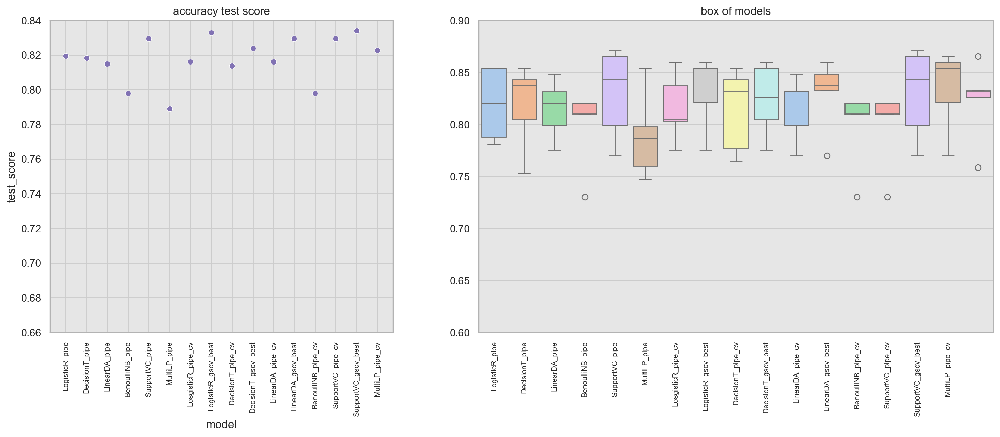

In [283]:
plt.figure(figsize=(18, 6))
gs = gridspec.GridSpec(nrows=1, ncols=2, width_ratios=[8, 12])

plt.subplot(gs[0])
g1 = sns.scatterplot(
        data=result_df,
        x=result_df.index,
        y="test_score",
        color="m",
)
g1.set(title="accuracy test score", ylim=(0.66, 0.84))
g1.set_xticklabels(labels=result_df.index, rotation=90, fontsize=8) 

plt.subplot(gs[1])
g2 = sns.boxplot(
    data=test_scores,
    palette="pastel"
)
g2.set(title="box of models", ylim=(0.60, 0.90))
g2.set_xticklabels(labels=result_df.index, rotation=90, fontsize=8) ;

In [284]:
get_test_std_df(result_df, test_scores)

,test_score,std
SupportVC_gscv_best,0.833909,0.039762
LogisticR_gscv_best,0.832785,0.035536
SupportVC_pipe,0.829439,0.043786
SupportVC_pipe_cv,0.829439,0.043786
LinearDA_gscv_best,0.829402,0.035012
DecisionT_gscv_best,0.823815,0.035064
MultiLP_pipe_cv,0.822660,0.039100
LogisticR_pipe,0.819340,0.034901
DecisionT_pipe,0.818197,0.040920
LinearDA_pipe_cv,0.815956,0.031474


### GridSearchCV를 사용한 mlp_pipe의 하이퍼 파라미터 튜닝 - (1)
#### solver=sgd, adam
- sgd와 adam은 매개변수의 최적화를 위해 경사하강법을 사용한다.

In [29]:
X.shape

(891, 9)

In [61]:
%%time

mlp_pipe = model_pipe.set_params(model=model_link["mlp"])
mlp_params = {
    "model__solver": ["sgd", "adam"],
    "model__activation": ["logistic", "relu", "identity"],
    "model__learning_rate": ["invscaling", "adaptive"],
    "model__hidden_layer_sizes": [(100, 10), (200, 10), (300, 10), (400, 10), (500, 10)],
    "model__max_iter": [1000],
    "model__early_stopping": [True]
}

cv = KFold(n_splits=5, shuffle=True, random_state=50)
mlp_gscv_1 = GridSearchCV(estimator=mlp_pipe, param_grid=mlp_params, cv=cv, scoring="accuracy", return_train_score=True)
mlp_gscv_1.fit(X, y_enc)

CPU times: total: 6min 34s
Wall time: 1min 43s


GridSearchCV(cv=KFold(n_splits=5, random_state=50, shuffle=True),
             estimator=Pipeline(steps=[('engineering',
                                        Pipeline(steps=[('preprocessor',
                                                         ColumnTransformer(remainder='passthrough',
                                                                           transformers=[('cat_transformer',
                                                                                          OneHotEncoder(),
                                                                                          ['Pclass',
                                                                                           'Sex',
                                                                                           'generation',
                                                                                           'title_name',
                                                                                           'Embarked']),
                                                                                         ('num_transformer',
                                                                                          Pipeline(steps=[('scaler',
                                                                                                           StandardScaler())]),
                                                                                          ['A...
                                                                          VarianceThreshold())]))])),
                                       ('model', MLPClassifier())]),
             param_grid={'model__activation': ['logistic', 'relu', 'identity'],
                         'model__early_stopping': [True],
                         'model__hidden_layer_sizes': [(100, 10), (200, 10),
                                                       (300, 10), (400, 10),
                                                       (500, 10)],
                         'model__learning_rate': ['invscaling', 'adaptive'],
                         'model__max_iter': [1000],
                         'model__solver': ['sgd', 'adam']},
             return_train_score=True, scoring='accuracy')

In [63]:
result_mlp_gscv_1 = pd.DataFrame(mlp_gscv_1.cv_results_).sort_values("rank_test_score")
cols = list(result_mlp_gscv_1.filter(regex="^param_model").columns) + ["mean_fit_time", "mean_test_score", "mean_train_score", "std_test_score", "rank_test_score"]
result_mlp_gscv_1[cols][:10].style.applymap(draw_color_cell, color="#ffd700", subset=(result_mlp_gscv_1.index[0]))

,param_model__activation,param_model__early_stopping,param_model__hidden_layer_sizes,param_model__learning_rate,param_model__max_iter,param_model__solver,mean_fit_time,mean_test_score,mean_train_score,std_test_score,rank_test_score
43,identity,True,"(100, 10)",adaptive,1000,adam,0.108201,0.832785,0.845676,0.032179,1
15,logistic,True,"(400, 10)",adaptive,1000,adam,0.404804,0.830538,0.834455,0.024640,2
47,identity,True,"(200, 10)",adaptive,1000,adam,0.134402,0.828322,0.846238,0.038152,3
13,logistic,True,"(400, 10)",invscaling,1000,adam,0.386002,0.828284,0.833335,0.037357,4
21,relu,True,"(100, 10)",invscaling,1000,adam,0.126002,0.826044,0.847363,0.029048,5
17,logistic,True,"(500, 10)",invscaling,1000,adam,0.514600,0.823803,0.834738,0.030216,6
29,relu,True,"(300, 10)",invscaling,1000,adam,0.189602,0.823796,0.843999,0.032469,7
33,relu,True,"(400, 10)",invscaling,1000,adam,0.213780,0.822685,0.843153,0.027097,8
25,relu,True,"(200, 10)",invscaling,1000,adam,0.138002,0.821568,0.847926,0.033480,9
23,relu,True,"(100, 10)",adaptive,1000,adam,0.097002,0.821562,0.840631,0.023298,10


### GridSearchCV를 사용한 mlp_pipe의 하이퍼 파라미터 튜닝 - (2)
#### solver=sgd, adam
- hidden_layer_sizes를 100~700으로 확장
- max_iter에 500을 추가
- momentum은 sgd의 경사하강법의 업데이트 정도

In [71]:
%%time

mlp_params = {
    "model__solver": ["sgd", "adam"],
    "model__activation": ["logistic", "relu", "identity"],
    "model__learning_rate": ["invscaling", "adaptive"],
    "model__hidden_layer_sizes": [(i, 10) for i in range(100, 701, 100)],
    "model__max_iter": [500, 1000],
    "model__momentum": [0.8, 0.9],
    "model__shuffle": [True],
    "model__early_stopping": [True]
}

cv = KFold(n_splits=5, shuffle=True, random_state=50)
mlp_gscv_2 = GridSearchCV(estimator=mlp_pipe, param_grid=mlp_params, cv=cv, scoring="accuracy", return_train_score=True)
mlp_gscv_2.fit(X, y_enc)

CPU times: total: 1h 1s
Wall time: 16min 14s


GridSearchCV(cv=KFold(n_splits=5, random_state=50, shuffle=True),
             estimator=Pipeline(steps=[('engineering',
                                        Pipeline(steps=[('preprocessor',
                                                         ColumnTransformer(remainder='passthrough',
                                                                           transformers=[('cat_transformer',
                                                                                          OneHotEncoder(),
                                                                                          ['Pclass',
                                                                                           'Sex',
                                                                                           'generation',
                                                                                           'title_name',
                                                                                           'Embarked']),
                                                                                         ('num_transformer',
                                                                                          Pipeline(steps=[('scaler',
                                                                                                           StandardScaler())]),
                                                                                          ['A...
             param_grid={'model__activation': ['logistic', 'relu', 'identity'],
                         'model__early_stopping': [True],
                         'model__hidden_layer_sizes': [(100, 10), (200, 10),
                                                       (300, 10), (400, 10),
                                                       (500, 10), (600, 10),
                                                       (700, 10)],
                         'model__learning_rate': ['invscaling', 'adaptive'],
                         'model__max_iter': [500, 1000],
                         'model__momentum': [0.8, 0.9],
                         'model__shuffle': [True],
                         'model__solver': ['sgd', 'adam']},
             return_train_score=True, scoring='accuracy')

In [73]:
result_mlp_gscv_2 = pd.DataFrame(mlp_gscv_2.cv_results_).sort_values("rank_test_score")
cols = list(result_mlp_gscv_2.filter(regex="^param_model").columns) + ["mean_fit_time", "mean_test_score", "mean_train_score", "std_test_score", "rank_test_score"]
result_mlp_gscv_2[cols][:10].style.applymap(draw_color_cell, color="#ffd700", subset=(result_mlp_gscv_2.index[0]))

,param_model__activation,param_model__early_stopping,param_model__hidden_layer_sizes,param_model__learning_rate,param_model__max_iter,param_model__momentum,param_model__shuffle,param_model__solver,mean_fit_time,mean_test_score,mean_train_score,std_test_score,rank_test_score
303,identity,True,"(500, 10)",adaptive,1000,0.900000,True,adam,0.223600,0.830544,0.835578,0.031560,1
229,identity,True,"(100, 10)",invscaling,1000,0.800000,True,adam,0.103791,0.828316,0.835016,0.035802,2
309,identity,True,"(600, 10)",invscaling,1000,0.800000,True,adam,0.618001,0.828297,0.843711,0.027100,3
277,identity,True,"(400, 10)",invscaling,1000,0.800000,True,adam,0.193202,0.827186,0.840068,0.032095,4
195,relu,True,"(600, 10)",invscaling,500,0.900000,True,adam,0.560202,0.827180,0.845681,0.029042,5
37,logistic,True,"(300, 10)",invscaling,1000,0.800000,True,adam,0.365001,0.827173,0.830808,0.029516,6
173,relu,True,"(400, 10)",adaptive,1000,0.800000,True,adam,0.275203,0.827155,0.840631,0.032477,7
245,identity,True,"(200, 10)",invscaling,1000,0.800000,True,adam,0.119602,0.826050,0.838661,0.029006,8
253,identity,True,"(200, 10)",adaptive,1000,0.800000,True,adam,0.130402,0.826018,0.838380,0.030040,9
273,identity,True,"(400, 10)",invscaling,500,0.800000,True,adam,0.208001,0.824939,0.839223,0.032695,10


### GridSearchCV를 사용한 mlp_pipe의 하이퍼 파라미터 튜닝 - (3)
#### solver=sgd, adam
- hidden_layer_sizes, max_iter, momentum 파라미터의 값을 다르게 설정하였다.

In [83]:
%%time

mlp_params = {
    "model__solver": ["sgd", "adam"],
    "model__activation": ["logistic", "relu", "identity"],
    "model__learning_rate": ["invscaling", "adaptive"],
    "model__hidden_layer_sizes": [(i, 5) for i in range(100, 501, 100)],
    "model__max_iter": [1000, 2000],
    "model__momentum": [0.7, 0.8, 0.9],
    "model__shuffle": [True],
    "model__early_stopping": [True]
}

cv = KFold(n_splits=5, shuffle=True, random_state=50)
mlp_gscv_3 = GridSearchCV(estimator=mlp_pipe, param_grid=mlp_params, cv=cv, scoring="accuracy", return_train_score=True)
mlp_gscv_3.fit(X, y_enc)

CPU times: total: 40min 52s
Wall time: 10min 30s


GridSearchCV(cv=KFold(n_splits=5, random_state=50, shuffle=True),
             estimator=Pipeline(steps=[('engineering',
                                        Pipeline(steps=[('preprocessor',
                                                         ColumnTransformer(remainder='passthrough',
                                                                           transformers=[('cat_transformer',
                                                                                          OneHotEncoder(),
                                                                                          ['Pclass',
                                                                                           'Sex',
                                                                                           'generation',
                                                                                           'title_name',
                                                                                           'Embarked']),
                                                                                         ('num_transformer',
                                                                                          Pipeline(steps=[('scaler',
                                                                                                           StandardScaler())]),
                                                                                          ['A...
             param_grid={'model__activation': ['logistic', 'relu', 'identity'],
                         'model__early_stopping': [True],
                         'model__hidden_layer_sizes': [(100, 5), (200, 5),
                                                       (300, 5), (400, 5),
                                                       (500, 5)],
                         'model__learning_rate': ['invscaling', 'adaptive'],
                         'model__max_iter': [1000, 2000],
                         'model__momentum': [0.7, 0.8, 0.9],
                         'model__shuffle': [True],
                         'model__solver': ['sgd', 'adam']},
             return_train_score=True, scoring='accuracy')

In [84]:
result_mlp_gscv_3 = pd.DataFrame(mlp_gscv_3.cv_results_).sort_values("rank_test_score")
cols = list(result_mlp_gscv_3.filter(regex="^param_model").columns) + ["mean_fit_time", "mean_test_score", "mean_train_score", "std_test_score", "rank_test_score"]
result_mlp_gscv_3[cols][:10].style.applymap(draw_color_cell, color="#ffd700", subset=(result_mlp_gscv_3.index[0]))

,param_model__activation,param_model__early_stopping,param_model__hidden_layer_sizes,param_model__learning_rate,param_model__max_iter,param_model__momentum,param_model__shuffle,param_model__solver,mean_fit_time,mean_test_score,mean_train_score,std_test_score,rank_test_score
191,relu,True,"(300, 5)",adaptive,2000,0.900000,True,adam,0.193998,0.830557,0.842032,0.027631,1
357,identity,True,"(500, 5)",adaptive,2000,0.800000,True,adam,0.250398,0.830544,0.839508,0.031560,2
173,relu,True,"(300, 5)",invscaling,1000,0.900000,True,adam,0.231401,0.829414,0.843997,0.033769,3
75,logistic,True,"(400, 5)",invscaling,1000,0.800000,True,adam,0.428600,0.828297,0.832774,0.017826,4
95,logistic,True,"(400, 5)",adaptive,2000,0.900000,True,adam,0.536001,0.827186,0.843154,0.021494,5
133,relu,True,"(100, 5)",adaptive,1000,0.700000,True,adam,0.136607,0.827155,0.849606,0.035805,6
155,relu,True,"(200, 5)",invscaling,2000,0.900000,True,adam,0.155607,0.826056,0.851572,0.027624,7
151,relu,True,"(200, 5)",invscaling,2000,0.700000,True,adam,0.154802,0.826056,0.844279,0.027395,8
339,identity,True,"(500, 5)",invscaling,1000,0.800000,True,adam,0.265802,0.826056,0.846520,0.030450,8
43,logistic,True,"(200, 5)",adaptive,2000,0.700000,True,adam,0.263192,0.826050,0.827725,0.025286,10


### GridSearchCV를 사용한 mlp_pipe의 하이퍼 파라미터 튜닝 - (4)
#### solver=sgd, adam 실험
- hidden_layer_sizes의 열의 갯수를 조정
- 성능의 변화에 큰 영향을 미치는 것 같지 않다.

In [85]:
%%time

mlp_params = {
    "model__solver": ["sgd", "adam"],
    "model__activation": ["logistic", "relu", "identity"],
    "model__learning_rate": ["invscaling", "adaptive"],
    "model__hidden_layer_sizes": [(100, i) for i in range(1, 11)],
    "model__max_iter": [1000],
    "model__momentum": [0.6, 0.7, 0.8, 0.9],
    "model__shuffle": [True],
    "model__early_stopping": [True]
}

cv = KFold(n_splits=5, shuffle=True, random_state=50)
mlp_gscv_4 = GridSearchCV(estimator=mlp_pipe, param_grid=mlp_params, cv=cv, scoring="accuracy", return_train_score=True)
mlp_gscv_4.fit(X, y_enc)

CPU times: total: 28min 7s
Wall time: 7min 36s


GridSearchCV(cv=KFold(n_splits=5, random_state=50, shuffle=True),
             estimator=Pipeline(steps=[('engineering',
                                        Pipeline(steps=[('preprocessor',
                                                         ColumnTransformer(remainder='passthrough',
                                                                           transformers=[('cat_transformer',
                                                                                          OneHotEncoder(),
                                                                                          ['Pclass',
                                                                                           'Sex',
                                                                                           'generation',
                                                                                           'title_name',
                                                                                           'Embarked']),
                                                                                         ('num_transformer',
                                                                                          Pipeline(steps=[('scaler',
                                                                                                           StandardScaler())]),
                                                                                          ['A...
                         'model__early_stopping': [True],
                         'model__hidden_layer_sizes': [(100, 1), (100, 2),
                                                       (100, 3), (100, 4),
                                                       (100, 5), (100, 6),
                                                       (100, 7), (100, 8),
                                                       (100, 9), (100, 10)],
                         'model__learning_rate': ['invscaling', 'adaptive'],
                         'model__max_iter': [1000],
                         'model__momentum': [0.6, 0.7, 0.8, 0.9],
                         'model__shuffle': [True],
                         'model__solver': ['sgd', 'adam']},
             return_train_score=True, scoring='accuracy')

In [86]:
result_mlp_gscv_4 = pd.DataFrame(mlp_gscv_4.cv_results_).sort_values("rank_test_score")
cols = list(result_mlp_gscv_4.filter(regex="^param_model").columns) + ["mean_fit_time", "mean_test_score", "mean_train_score", "std_test_score", "rank_test_score"]
result_mlp_gscv_4[cols][:10].style.applymap(draw_color_cell, color="#ffd700", subset=(result_mlp_gscv_4.index[0]))

,param_model__activation,param_model__early_stopping,param_model__hidden_layer_sizes,param_model__learning_rate,param_model__max_iter,param_model__momentum,param_model__shuffle,param_model__solver,mean_fit_time,mean_test_score,mean_train_score,std_test_score,rank_test_score
235,relu,True,"(100, 5)",adaptive,1000,0.700000,True,adam,0.112801,0.830557,0.847364,0.027171,1
475,identity,True,"(100, 10)",adaptive,1000,0.700000,True,adam,0.113600,0.829421,0.846804,0.028676,2
463,identity,True,"(100, 9)",adaptive,1000,0.900000,True,adam,0.109001,0.828316,0.843713,0.037016,3
197,relu,True,"(100, 3)",invscaling,1000,0.800000,True,adam,0.105600,0.828303,0.848486,0.040972,4
139,logistic,True,"(100, 9)",adaptive,1000,0.700000,True,adam,0.212198,0.827173,0.835298,0.023302,5
337,identity,True,"(100, 2)",invscaling,1000,0.600000,True,adam,0.128400,0.826075,0.842316,0.033099,6
229,relu,True,"(100, 5)",invscaling,1000,0.800000,True,adam,0.127000,0.826056,0.843717,0.033791,7
447,identity,True,"(100, 8)",adaptive,1000,0.900000,True,adam,0.120399,0.826044,0.842310,0.032918,8
393,identity,True,"(100, 5)",adaptive,1000,0.600000,True,adam,0.086999,0.826025,0.835300,0.028720,9
449,identity,True,"(100, 9)",invscaling,1000,0.600000,True,adam,0.101400,0.824939,0.833610,0.034572,10


### mlp_pipe 하이퍼 파라미터 튜닝 best 모델 비교

In [100]:
mlp_gscv_1_best = pd.DataFrame(mlp_gscv_1.best_params_,).assign(model="mlp_gscv_1", test_score=mlp_gscv_1.best_score_)
mlp_gscv_2_best = pd.DataFrame(mlp_gscv_2.best_params_,).assign(model="mlp_gscv_2", test_score=mlp_gscv_2.best_score_)
mlp_gscv_3_best = pd.DataFrame(mlp_gscv_3.best_params_,).assign(model="mlp_gscv_3", test_score=mlp_gscv_3.best_score_)
mlp_gscv_4_best = pd.DataFrame(mlp_gscv_4.best_params_,).assign(model="mlp_gscv_4", test_score=mlp_gscv_4.best_score_)
mlp_gscv_best_compare = pd.concat([mlp_gscv_1_best, mlp_gscv_2_best, mlp_gscv_3_best, mlp_gscv_4_best], axis=0).reset_index(drop=True)
#mlp_gscv_best_compare["test_score"] = [mlp_gscv_1.best_score_, mlp_gscv_2.best_score_, mlp_gscv_3.best_score_, mlp_gscv_4.best_score_]
mlp_gscv_best_compare\
    .fillna(0)\
    .sort_values("test_score", ascending=False)\
    .reset_index(drop=True)\
    .style.applymap(draw_color_cell, color="#ffd700", subset=(mlp_gscv_best_compare.index[0]))

,model__activation,model__early_stopping,model__hidden_layer_sizes,model__learning_rate,model__max_iter,model__solver,model,test_score,model__momentum,model__shuffle
0,identity,True,100,adaptive,1000,adam,mlp_gscv_1,0.832785,0.000000,0
1,identity,True,10,adaptive,1000,adam,mlp_gscv_1,0.832785,0.000000,0
2,relu,True,100,adaptive,1000,adam,mlp_gscv_4,0.830557,0.700000,True
3,relu,True,5,adaptive,1000,adam,mlp_gscv_4,0.830557,0.700000,True
4,relu,True,300,adaptive,2000,adam,mlp_gscv_3,0.830557,0.900000,True
5,relu,True,5,adaptive,2000,adam,mlp_gscv_3,0.830557,0.900000,True
6,identity,True,500,adaptive,1000,adam,mlp_gscv_2,0.830544,0.900000,True
7,identity,True,10,adaptive,1000,adam,mlp_gscv_2,0.830544,0.900000,True


### GridSearchCV로 실험한 MLP 모델 중 best 모델을 사용하여 cv 테스트

In [29]:
%%time

mlp_gscv_best_model = eval(mlp_gscv_best_compare.iloc[mlp_gscv_best_compare["test_score"].argmax()]["model"]).best_estimator_
result_mlp_gscv_best, accs_mlp_gscv_best = get_cv_result(X, y_enc, [mlp_gscv_best_model], ["MultiLP_gscv_best"])

CPU times: total: 4.09 s
Wall time: 1.32 s


In [63]:
result_df = pd.concat([result_df, result_mlp_gscv_best], axis=0)
result_df

,train_score,test_score,pre_score,recall_score,f1_score
LogisticR_pipe,0.857463,0.819340,0.822739,0.683746,0.743826
DecisionT_pipe,0.832492,0.818197,0.784863,0.725230,0.753210
LinearDA_pipe,0.863634,0.814833,0.816732,0.674496,0.735800
BenoulliNB_pipe,0.805275,0.797966,0.728940,0.751205,0.739163
SupportVC_pipe,0.849608,0.829439,0.818343,0.718170,0.764546
MultiLP_pipe,0.916385,0.789034,0.732820,0.691499,0.708047
LosgisticR_pipe_cv,0.854658,0.815950,0.774596,0.738183,0.754394
LogisticR_gscv_best,0.840630,0.832785,0.815822,0.731699,0.770646
DecisionT_pipe_cv,0.829687,0.813734,0.790074,0.710094,0.742860
DecisionT_gscv_best,0.849046,0.823815,0.840542,0.654863,0.734590


In [65]:
test_scores["MultiLP_gscv_best"] = accs_mlp_gscv_best[0][1]
test_scores

,LogisticR_pipe,DecisionT_pipe,LinearDA_pipe,BenoulliNB_pipe,SupportVC_pipe,MultiLP_pipe,LosgisticR_pipe_cv,LogisticR_gscv_best,DecisionT_pipe_cv,DecisionT_gscv_best,LinearDA_pipe_cv,LinearDA_gscv_best,BenoulliNB_pipe_cv,BernoulliNB_gscv_best,SupportVC_pipe_cv,SupportVC_gscv_best,MultiLP_pipe_cv,MultiLP_gscv_best
0,0.787709,0.804469,0.798883,0.810056,0.798883,0.759777,0.804469,0.821229,0.776536,0.804469,0.798883,0.832402,0.810056,0.810056,0.798883,0.821229,0.832402,0.832402
1,0.853933,0.837079,0.831461,0.820225,0.865169,0.786517,0.837079,0.853933,0.842697,0.825843,0.848315,0.859551,0.820225,0.820225,0.865169,0.859551,0.831461,0.842697
2,0.853933,0.853933,0.848315,0.820225,0.870787,0.853933,0.859551,0.859551,0.853933,0.859551,0.831461,0.848315,0.820225,0.820225,0.870787,0.865169,0.865169,0.870787
3,0.780899,0.752809,0.775281,0.730337,0.769663,0.747191,0.775281,0.775281,0.764045,0.775281,0.769663,0.769663,0.730337,0.730337,0.769663,0.769663,0.758427,0.764045
4,0.820225,0.842697,0.820225,0.808989,0.842697,0.797753,0.803371,0.853933,0.831461,0.853933,0.831461,0.837079,0.808989,0.808989,0.842697,0.853933,0.825843,0.848315


### 모델별 성능 비교

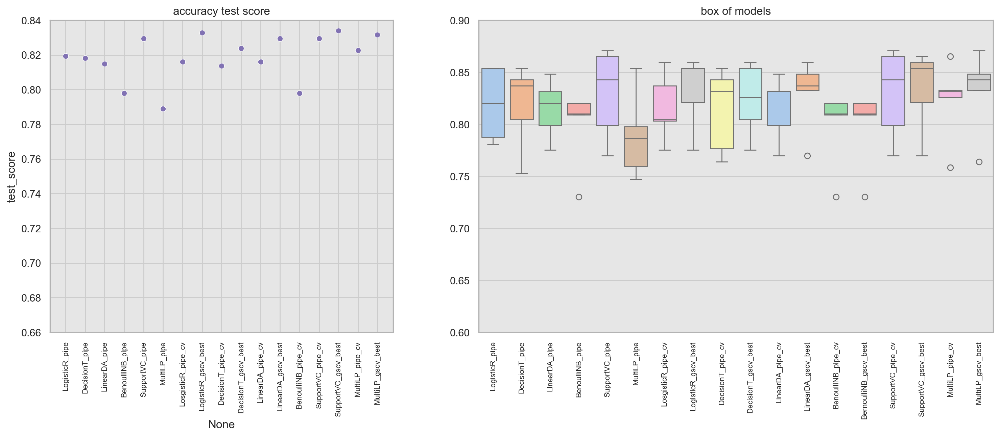

In [67]:
plt.figure(figsize=(18, 6))
gs = gridspec.GridSpec(nrows=1, ncols=2, width_ratios=[8, 12])

plt.subplot(gs[0])
g1 = sns.scatterplot(
        data=result_df,
        x=result_df.index,
        y="test_score",
        color="m",
)
g1.set(title="accuracy test score", ylim=(0.66, 0.84))
g1.set_xticklabels(labels=result_df.index, rotation=90, fontsize=8) 

plt.subplot(gs[1])
g2 = sns.boxplot(
    data=test_scores,
    palette="pastel"
)
g2.set(title="box of models", ylim=(0.60, 0.90))
g2.set_xticklabels(labels=test_scores.columns, rotation=90, fontsize=8) ;

In [70]:
get_test_std_df(result_df, test_scores)

,test_score,std
SupportVC_gscv_best,0.833909,0.039762
LogisticR_gscv_best,0.832785,0.035536
MultiLP_gscv_best,0.831649,0.040319
SupportVC_pipe,0.829439,0.043786
SupportVC_pipe_cv,0.829439,0.043786
LinearDA_gscv_best,0.829402,0.035012
DecisionT_gscv_best,0.823815,0.035065
MultiLP_pipe_cv,0.822660,0.039100
LogisticR_pipe,0.819340,0.034901
DecisionT_pipe,0.818197,0.040920


### best model save

In [26]:
dir_path = "./build_model"

save_model(dir_path, mlp_gscv_best_model, "MultiLP_gscv_best")

MultiLP_gscv_best save success.


### result_df, test_scores save

In [84]:
pd.to_pickle(result_df, "./build_model/result_df.pkl")
pd.to_pickle(test_scores, "./build_model/test_scores.pkl")

## 7. Modeling : Ensemble 
- 앞의 개별 모델링 실험 결과가 높은 10개의 모델을 선택하여 모형 결합(ensemble)을 적용하여 성능을 개선
- 개별 모델의 결합 방식외에 RandomForest와 부스팅 모델을 추가로 실험
- Ensemble
   - aggregation : VotingClassifier, BaggingClassifier, RandomForestClassifier, ExtraTreesClassifier
   - boosting : AdaBoostClassifier, XGBClassifier

### 개별 모델 실험 결과 중 top 10 모델 선택

In [27]:
result_df = pickle.load(open("./build_model/result_df.pkl", "rb"))
test_scores = pickle.load(open("./build_model/test_scores.pkl", "rb"))

In [28]:
total_df = pd.concat([result_df, test_scores.T], axis=1).sort_values("test_score", ascending=False)
total_df["std"] = total_df[[0, 1, 2, 3, 4]].std(axis=1)

top_10_models_df = total_df.iloc[:10]
top_10_models_df

,train_score,test_score,pre_score,recall_score,f1_score,0,1,2,3,4,std
SupportVC_gscv_best,0.837823,0.833909,0.820225,0.728466,0.771021,0.821229,0.859551,0.865169,0.769663,0.853933,0.039762
LogisticR_gscv_best,0.840630,0.832785,0.815822,0.731699,0.770646,0.821229,0.853933,0.859551,0.775281,0.853933,0.035536
MultiLP_gscv_best,0.834455,0.831649,0.807379,0.702277,0.748555,0.832402,0.842697,0.870787,0.764045,0.848315,0.040319
SupportVC_pipe,0.849608,0.829439,0.818343,0.718170,0.764546,0.798883,0.865169,0.870787,0.769663,0.842697,0.043786
SupportVC_pipe_cv,0.849608,0.829439,0.818343,0.718170,0.764546,0.798883,0.865169,0.870787,0.769663,0.842697,0.043786
LinearDA_gscv_best,0.833335,0.829402,0.792393,0.754574,0.772277,0.832402,0.859551,0.848315,0.769663,0.837079,0.035012
DecisionT_gscv_best,0.849046,0.823815,0.840542,0.654863,0.734590,0.804469,0.825843,0.859551,0.775281,0.853933,0.035065
MultiLP_pipe_cv,0.843435,0.822660,0.803978,0.732417,0.766044,0.832402,0.831461,0.865169,0.758427,0.825843,0.039100
LogisticR_pipe,0.857463,0.819340,0.822739,0.683746,0.743826,0.787709,0.853933,0.853933,0.780899,0.820225,0.034901
DecisionT_pipe,0.832492,0.818197,0.784863,0.725230,0.753210,0.804469,0.837079,0.853933,0.752809,0.842697,0.040920


### top 10 개별 모형의 test score 비교

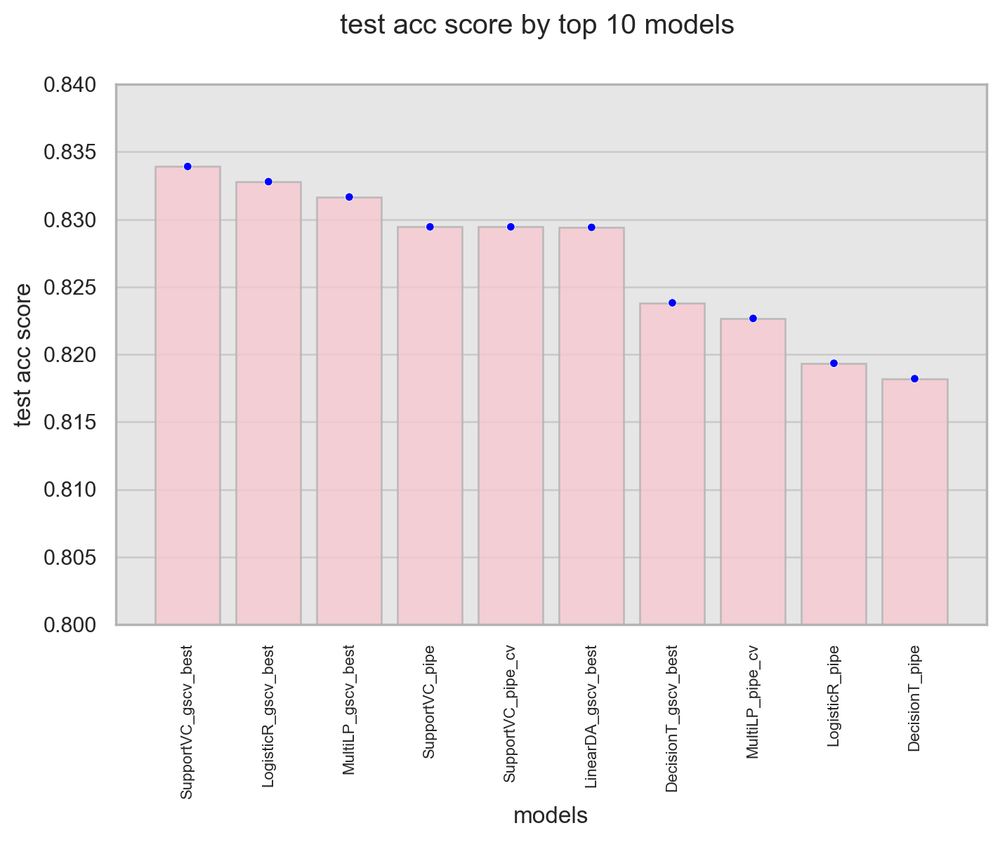

In [29]:
fig, axes = plt.subplots(figsize=(8, 5))

sns.barplot(
    data=top_10_models_df,
    x=top_10_models_df.index,
    y="test_score",
    color="pink",
    edgecolor=".7",
    alpha=0.8,
    ax=axes
)

sns.scatterplot(
    data=top_10_models_df,
    x=top_10_models_df.index,
    y="test_score",
    size=7,
    color="blue",
    legend=False,
    ax=axes
)

axes.set(ylim=(0.80, 0.84), xlabel="models", ylabel="test acc score")
axes.set_xticklabels(labels=top_10_models_df.index, rotation=90, fontsize=8)
fig.suptitle("test acc score by top 10 models");

### top 10 model 객체 로드

In [27]:
top_10_models = []
for m in top_10_models_df.index :
    
    origin_name = m
    if m[-2:] == "cv" : 
        m = m[:-3]
        
    model_name = m + ".pkl"
    dir_path = "./build_model"
    full_path = dir_path + "/" + model_name
    
    model = pickle.load(open(full_path, "rb"))
    top_10_models.append((origin_name, model))
    
load_top_10_models = pd.DataFrame(top_10_models, columns=["model", "estimator"])    
load_top_10_models

,model,estimator
0,SupportVC_gscv_best,"((ColumnTransformer(remainder='passthrough',\n..."
1,LogisticR_gscv_best,"((ColumnTransformer(remainder='passthrough',\n..."
2,MultiLP_gscv_best,"((ColumnTransformer(remainder='passthrough',\n..."
3,SupportVC_pipe,"((ColumnTransformer(remainder='passthrough',\n..."
4,SupportVC_pipe_cv,"((ColumnTransformer(remainder='passthrough',\n..."
5,LinearDA_gscv_best,"((ColumnTransformer(remainder='passthrough',\n..."
6,DecisionT_gscv_best,"((ColumnTransformer(remainder='passthrough',\n..."
7,MultiLP_pipe_cv,"((ColumnTransformer(remainder='passthrough',\n..."
8,LogisticR_pipe,"((ColumnTransformer(remainder='passthrough',\n..."
9,DecisionT_pipe,"((ColumnTransformer(remainder='passthrough',\n..."


### top 10 모델 객체 저장

In [28]:
pickle.dump(load_top_10_models, open("./build_model/load_top_10_models.pkl", "wb"))

### Ensemble (1) : VotingClassifier
- 모형 결합 (ensemble)의 취합(aggregation) 중 다수결(majority)방법으로 여러가지 개별 모형을 결합하여 성능을 높이고 분산을 낮춘다.
   - 모형을 결합하는 것 자체만으로도 정답을 선택할 확률이 높아진다.
   - VotingClassifier는 voting 파라미터를 사용하여 다수결 hard, 소프트 soft 방식을 설정할 수 있다.
- model의 파라미터 중 probability 값이 False이면 True로 재설정
   - VotingClassifier의 voting="soft" 인 경우 개별 모델의 probability 값이 True 이어야 한다.

### 개별 모형을 8개 결합하여 VotingClassifier 테스트
- 이론적으로 개별 모형이 정답을 맞출 확률보다 결합 모형이 정답을 맞출 확률이 더 높다.
- 하지만 모형 결합의 성능이 반드시 높아지는 것은 아니다.
   - 개별 모델의 성능, 개별 모델의 조합, 데이터의 상태에 따라서 달라진다.

In [181]:
X_train, X_test, y_train, y_test = train_test_split(X, y_enc, test_size=0.2, stratify=y_enc, random_state=50)

In [49]:
from sklearn.ensemble import VotingClassifier, BaggingClassifier

In [121]:
# voting="soft"
soft_ensemble = VotingClassifier(
    [
        (load_top_10_models_df["model"][0], load_top_10_models_df["estimator"][0]),
        (load_top_10_models_df["model"][1], load_top_10_models_df["estimator"][1]),
        (load_top_10_models_df["model"][2], load_top_10_models_df["estimator"][2]),
        (load_top_10_models_df["model"][3], load_top_10_models_df["estimator"][3]),
        (load_top_10_models_df["model"][4], load_top_10_models_df["estimator"][4]),
        (load_top_10_models_df["model"][5], load_top_10_models_df["estimator"][5]),
        (load_top_10_models_df["model"][6], load_top_10_models_df["estimator"][6]),
        (load_top_10_models_df["model"][7], load_top_10_models_df["estimator"][7]),
    ],
    voting="soft"
)

# voting="hard"
hard_ensemble = VotingClassifier(
    [
        (load_top_10_models_df["model"][0], load_top_10_models_df["estimator"][0]),
        (load_top_10_models_df["model"][1], load_top_10_models_df["estimator"][1]),
        (load_top_10_models_df["model"][2], load_top_10_models_df["estimator"][2]),
        (load_top_10_models_df["model"][3], load_top_10_models_df["estimator"][3]),
        (load_top_10_models_df["model"][4], load_top_10_models_df["estimator"][4]),
        (load_top_10_models_df["model"][5], load_top_10_models_df["estimator"][5]),
        (load_top_10_models_df["model"][6], load_top_10_models_df["estimator"][6]),
        (load_top_10_models_df["model"][7], load_top_10_models_df["estimator"][7]),
    ],
    voting="hard"
)

# indiv models and voting models
models = [
    load_top_10_models_df["estimator"][0],
    load_top_10_models_df["estimator"][1],
    load_top_10_models_df["estimator"][2],
    soft_ensemble, 
    hard_ensemble
]

model_names = [
    load_top_10_models_df["model"][0], 
    load_top_10_models_df["model"][1], 
    load_top_10_models_df["model"][2], 
    'soft_e', 
    'hard_e']

In [122]:
result_ensemble, accs_ensemble = get_cv_result(X, y_enc, models, model_names)

In [123]:
result_ensemble

,train_score,test_score,pre_score,recall_score,f1_score
model,,,,,
SupportVC_gscv_best,0.837823,0.833909,0.820225,0.728466,0.771021
LogisticR_gscv_best,0.840630,0.832785,0.815822,0.731699,0.770646
MultiLP_gscv_best,0.833895,0.820413,0.787726,0.731583,0.756873
soft_e,0.852134,0.824933,0.810925,0.720731,0.762124
hard_e,0.847645,0.832798,0.821345,0.717833,0.765453


### Soft VotingClassifier 실험 : 개별 모형을 2, 3, 4개 조합
- hard, soft 실험
   - soft voting의 경우 개별모형의 조건부 확률값의 합을 사용하기 때문에, 개별 모형의 파라미터 중 probability 가 False로 설정 되어 있는 경우 에러가 발생한다.
   - 따라서 개별 모형 중에 probability 파라미터가 있는 경우 True로 설정한다.

In [45]:
for idx in range(10) : 
    if "probability" in load_top_10_models_df["estimator"][idx]["model"].get_params() :
        load_top_10_models_df["estimator"][idx]["model"].set_params(probability=True)
        print(load_top_10_models_df["model"][idx], load_top_10_models_df["estimator"][idx]["model"].get_params()["probability"])

SupportVC_gscv_best True
SupportVC_pipe True
SupportVC_pipe_cv True


In [285]:
# soft voting 실험
from itertools import combinations

cv_metrics = []
cv_accs = []

for i in range(2, 5) : 
    
    # 모델의 인덱스 0~9를 2, 3, 4개로 조합 : 375개
    comb = list(combinations(range(10), i))
    
    for c in tqdm(comb, desc="voting test by comb", mininterval=0.01) : 
        
        comb_models = list(zip(load_top_10_models.iloc[list(c)]["model"], load_top_10_models.iloc[list(c)]["estimator"]))
        voting_model = VotingClassifier(comb_models, voting="soft")
        
        comb_name = " + ".join(list(load_top_10_models.iloc[list(c)]["model"]))
        metrics, accs = get_cv_result(X, y_enc, [voting_model], [comb_name])
        metrics["comb"] = str(c)
        
        cv_metrics.append(metrics)
        cv_accs.append(pd.DataFrame(accs[0][1], columns=[comb_name]))

voting test by comb: 100%|██████████| 210/210 [44:07<00:00, 12.61s/it]


In [290]:
voting_soft_result = pd.concat(cv_metrics).reset_index().sort_values("test_score", ascending=False)[:20]
voting_soft_result

,model,train_score,test_score,pre_score,recall_score,f1_score,comb
224,SupportVC_gscv_best + SupportVC_pipe + Decisio...,0.852413,0.836162,0.835943,0.718505,0.771723,"(0, 3, 6, 8)"
234,SupportVC_gscv_best + SupportVC_pipe_cv + Deci...,0.855219,0.836156,0.824567,0.718167,0.766525,"(0, 4, 6, 8)"
88,LogisticR_gscv_best + SupportVC_pipe + Support...,0.849889,0.833921,0.822899,0.726237,0.770847,"(1, 3, 4)"
0,SupportVC_gscv_best + LogisticR_gscv_best,0.840349,0.833915,0.820058,0.729515,0.771444,"(0, 1)"
119,MultiLP_gscv_best + SupportVC_pipe_cv + Decisi...,0.847081,0.833915,0.817685,0.723672,0.766585,"(2, 4, 9)"
165,SupportVC_gscv_best + LogisticR_gscv_best + Mu...,0.845118,0.833909,0.817510,0.729515,0.770236,"(0, 1, 2, 3)"
249,LogisticR_gscv_best + MultiLP_gscv_best + Supp...,0.849889,0.833909,0.820747,0.726237,0.769670,"(1, 2, 3, 4)"
45,SupportVC_gscv_best + LogisticR_gscv_best + Mu...,0.840629,0.833902,0.809887,0.728086,0.765748,"(0, 1, 2)"
61,SupportVC_gscv_best + SupportVC_pipe + LinearD...,0.840629,0.833896,0.809537,0.743050,0.774402,"(0, 3, 5)"
66,SupportVC_gscv_best + SupportVC_pipe_cv + Line...,0.840629,0.833896,0.809537,0.743050,0.774402,"(0, 4, 5)"


In [291]:
voting_soft_accs = pd.concat(cv_accs, axis=1)
voting_soft_accs

,SupportVC_gscv_best + LogisticR_gscv_best,SupportVC_gscv_best + MultiLP_gscv_best,SupportVC_gscv_best + SupportVC_pipe,SupportVC_gscv_best + SupportVC_pipe_cv,SupportVC_gscv_best + LinearDA_gscv_best,SupportVC_gscv_best + DecisionT_gscv_best,SupportVC_gscv_best + MultiLP_pipe_cv,SupportVC_gscv_best + LogisticR_pipe,SupportVC_gscv_best + DecisionT_pipe,LogisticR_gscv_best + MultiLP_gscv_best,...,SupportVC_pipe_cv + LinearDA_gscv_best + LogisticR_pipe + DecisionT_pipe,SupportVC_pipe_cv + DecisionT_gscv_best + MultiLP_pipe_cv + LogisticR_pipe,SupportVC_pipe_cv + DecisionT_gscv_best + MultiLP_pipe_cv + DecisionT_pipe,SupportVC_pipe_cv + DecisionT_gscv_best + LogisticR_pipe + DecisionT_pipe,SupportVC_pipe_cv + MultiLP_pipe_cv + LogisticR_pipe + DecisionT_pipe,LinearDA_gscv_best + DecisionT_gscv_best + MultiLP_pipe_cv + LogisticR_pipe,LinearDA_gscv_best + DecisionT_gscv_best + MultiLP_pipe_cv + DecisionT_pipe,LinearDA_gscv_best + DecisionT_gscv_best + LogisticR_pipe + DecisionT_pipe,LinearDA_gscv_best + MultiLP_pipe_cv + LogisticR_pipe + DecisionT_pipe,DecisionT_gscv_best + MultiLP_pipe_cv + LogisticR_pipe + DecisionT_pipe
0,0.815642,0.821229,0.804469,0.804469,0.832402,0.804469,0.798883,0.804469,0.815642,0.815642,...,0.810056,0.798883,0.798883,0.815642,0.787709,0.810056,0.804469,0.804469,0.815642,0.787709
1,0.859551,0.848315,0.859551,0.859551,0.859551,0.865169,0.820225,0.842697,0.853933,0.853933,...,0.853933,0.842697,0.853933,0.859551,0.842697,0.831461,0.831461,0.848315,0.825843,0.825843
2,0.865169,0.865169,0.865169,0.865169,0.848315,0.865169,0.842697,0.859551,0.853933,0.848315,...,0.842697,0.842697,0.870787,0.848315,0.853933,0.859551,0.859551,0.837079,0.865169,0.853933
3,0.775281,0.769663,0.769663,0.769663,0.769663,0.769663,0.735955,0.769663,0.758427,0.764045,...,0.769663,0.769663,0.764045,0.769663,0.758427,0.775281,0.764045,0.769663,0.764045,0.775281
4,0.853933,0.842697,0.848315,0.848315,0.842697,0.842697,0.808989,0.837079,0.842697,0.848315,...,0.842697,0.814607,0.803371,0.859551,0.814607,0.820225,0.837079,0.859551,0.837079,0.842697


In [41]:
voting_soft_result[:10].style.applymap(draw_color_cell, color="#ffd700", subset=["test_score"])

,model,train_score,test_score,pre_score,recall_score,f1_score,comb
224,SupportVC_gscv_best + SupportVC_pipe + DecisionT_gscv_best + LogisticR_pipe,0.852413,0.836162,0.835943,0.718505,0.771723,"(0, 3, 6, 8)"
234,SupportVC_gscv_best + SupportVC_pipe_cv + DecisionT_gscv_best + LogisticR_pipe,0.855219,0.836156,0.824567,0.718167,0.766525,"(0, 4, 6, 8)"
88,LogisticR_gscv_best + SupportVC_pipe + SupportVC_pipe_cv,0.849889,0.833921,0.822899,0.726237,0.770847,"(1, 3, 4)"
0,SupportVC_gscv_best + LogisticR_gscv_best,0.840349,0.833915,0.820058,0.729515,0.771444,"(0, 1)"
119,MultiLP_gscv_best + SupportVC_pipe_cv + DecisionT_pipe,0.847081,0.833915,0.817685,0.723672,0.766585,"(2, 4, 9)"
165,SupportVC_gscv_best + LogisticR_gscv_best + MultiLP_gscv_best + SupportVC_pipe,0.845118,0.833909,0.817510,0.729515,0.770236,"(0, 1, 2, 3)"
249,LogisticR_gscv_best + MultiLP_gscv_best + SupportVC_pipe + SupportVC_pipe_cv,0.849889,0.833909,0.820747,0.726237,0.769670,"(1, 2, 3, 4)"
45,SupportVC_gscv_best + LogisticR_gscv_best + MultiLP_gscv_best,0.840629,0.833902,0.809887,0.728086,0.765748,"(0, 1, 2)"
61,SupportVC_gscv_best + SupportVC_pipe + LinearDA_gscv_best,0.840629,0.833896,0.809537,0.743050,0.774402,"(0, 3, 5)"
66,SupportVC_gscv_best + SupportVC_pipe_cv + LinearDA_gscv_best,0.840629,0.833896,0.809537,0.743050,0.774402,"(0, 4, 5)"


In [35]:
voting_soft_accs.head(2)

,SupportVC_gscv_best + LogisticR_gscv_best,SupportVC_gscv_best + MultiLP_gscv_best,SupportVC_gscv_best + SupportVC_pipe,SupportVC_gscv_best + SupportVC_pipe_cv,SupportVC_gscv_best + LinearDA_gscv_best,SupportVC_gscv_best + DecisionT_gscv_best,SupportVC_gscv_best + MultiLP_pipe_cv,SupportVC_gscv_best + LogisticR_pipe,SupportVC_gscv_best + DecisionT_pipe,LogisticR_gscv_best + MultiLP_gscv_best,...,SupportVC_pipe_cv + LinearDA_gscv_best + LogisticR_pipe + DecisionT_pipe,SupportVC_pipe_cv + DecisionT_gscv_best + MultiLP_pipe_cv + LogisticR_pipe,SupportVC_pipe_cv + DecisionT_gscv_best + MultiLP_pipe_cv + DecisionT_pipe,SupportVC_pipe_cv + DecisionT_gscv_best + LogisticR_pipe + DecisionT_pipe,SupportVC_pipe_cv + MultiLP_pipe_cv + LogisticR_pipe + DecisionT_pipe,LinearDA_gscv_best + DecisionT_gscv_best + MultiLP_pipe_cv + LogisticR_pipe,LinearDA_gscv_best + DecisionT_gscv_best + MultiLP_pipe_cv + DecisionT_pipe,LinearDA_gscv_best + DecisionT_gscv_best + LogisticR_pipe + DecisionT_pipe,LinearDA_gscv_best + MultiLP_pipe_cv + LogisticR_pipe + DecisionT_pipe,DecisionT_gscv_best + MultiLP_pipe_cv + LogisticR_pipe + DecisionT_pipe
0,0.815642,0.821229,0.804469,0.804469,0.832402,0.804469,0.798883,0.804469,0.815642,0.815642,...,0.810056,0.798883,0.798883,0.815642,0.787709,0.810056,0.804469,0.804469,0.815642,0.787709
1,0.859551,0.848315,0.859551,0.859551,0.859551,0.865169,0.820225,0.842697,0.853933,0.853933,...,0.853933,0.842697,0.853933,0.859551,0.842697,0.831461,0.831461,0.848315,0.825843,0.825843


### Hard VotingClassifier 실험 : 개별 모형을 2, 3, 4개 조합
- hard, soft 실험
   - soft voting의 경우 개별모형의 조건부 확률값의 합을 사용하기 때문에, 개별 모형의 파라미터 중 probability 가 False로 설정 되어 있는 경우 에러가 발생한다.
   - 따라서 개별 모형 중에 probability 파라미터가 있는 경우 True로 설정한다.

In [50]:
# hard voting 실험

voting_hard_metrics = []
voting_hard_accs = []

for i in range(2, 5) : 
    
    # 모델의 인덱스 0~9를 2, 3, 4개로 조합 : 375개
    comb = list(combinations(range(10), i))
    
    for c in tqdm(comb, desc="voting test by comb", mininterval=0.01) : 
        
        comb_models = list(zip(load_top_10_models_df.iloc[list(c)]["model"], load_top_10_models_df.iloc[list(c)]["estimator"]))
        voting_model = VotingClassifier(comb_models, voting="hard")
        
        comb_name = " + ".join(list(load_top_10_models_df.iloc[list(c)]["model"]))
        metrics, accs = get_cv_result(X, y_enc, [voting_model], [comb_name])
        metrics["comb"] = str(c)
        
        voting_hard_metrics.append(metrics)
        voting_hard_accs.append(pd.DataFrame(accs[0][1], columns=[comb_name]))

voting test by comb: 100%|██████████| 210/210 [43:42<00:00, 12.49s/it]


In [55]:
voting_hard_result = pd.concat(voting_hard_metrics).reset_index().sort_values("test_score", ascending=False)
voting_hard_result[:10]

,model,train_score,test_score,pre_score,recall_score,f1_score,comb
122,MultiLP_gscv_best + LinearDA_gscv_best + Logis...,0.845959,0.838378,0.815293,0.723894,0.764736,"(2, 5, 8)"
189,SupportVC_gscv_best + LogisticR_gscv_best + De...,0.841191,0.837298,0.833453,0.714597,0.768936,"(0, 1, 6, 9)"
77,SupportVC_gscv_best + DecisionT_gscv_best + De...,0.838104,0.837280,0.817959,0.731745,0.771934,"(0, 6, 9)"
209,SupportVC_gscv_best + MultiLP_gscv_best + Deci...,0.850730,0.836168,0.827785,0.698618,0.757384,"(0, 2, 6, 8)"
235,SupportVC_gscv_best + SupportVC_pipe_cv + Deci...,0.842875,0.835051,0.830033,0.722961,0.772474,"(0, 4, 6, 9)"
225,SupportVC_gscv_best + SupportVC_pipe + Decisio...,0.843155,0.835045,0.830483,0.711656,0.766016,"(0, 3, 6, 9)"
49,SupportVC_gscv_best + LogisticR_gscv_best + De...,0.842875,0.835039,0.823590,0.717495,0.766098,"(0, 1, 6)"
368,SupportVC_pipe_cv + DecisionT_gscv_best + Logi...,0.851291,0.835039,0.860317,0.674670,0.753427,"(4, 6, 8, 9)"
13,LogisticR_gscv_best + DecisionT_gscv_best,0.845681,0.835039,0.867695,0.662228,0.749969,"(1, 6)"
241,SupportVC_gscv_best + LinearDA_gscv_best + Dec...,0.838385,0.835032,0.819942,0.728466,0.770818,"(0, 5, 6, 9)"


In [131]:
voting_hard_accuracy = pd.concat(voting_hard_accs, axis=1)
voting_hard_accuracy

,SupportVC_gscv_best + LogisticR_gscv_best,SupportVC_gscv_best + MultiLP_gscv_best,SupportVC_gscv_best + SupportVC_pipe,SupportVC_gscv_best + SupportVC_pipe_cv,SupportVC_gscv_best + LinearDA_gscv_best,SupportVC_gscv_best + DecisionT_gscv_best,SupportVC_gscv_best + MultiLP_pipe_cv,SupportVC_gscv_best + LogisticR_pipe,SupportVC_gscv_best + DecisionT_pipe,LogisticR_gscv_best + MultiLP_gscv_best,...,SupportVC_pipe_cv + LinearDA_gscv_best + LogisticR_pipe + DecisionT_pipe,SupportVC_pipe_cv + DecisionT_gscv_best + MultiLP_pipe_cv + LogisticR_pipe,SupportVC_pipe_cv + DecisionT_gscv_best + MultiLP_pipe_cv + DecisionT_pipe,SupportVC_pipe_cv + DecisionT_gscv_best + LogisticR_pipe + DecisionT_pipe,SupportVC_pipe_cv + MultiLP_pipe_cv + LogisticR_pipe + DecisionT_pipe,LinearDA_gscv_best + DecisionT_gscv_best + MultiLP_pipe_cv + LogisticR_pipe,LinearDA_gscv_best + DecisionT_gscv_best + MultiLP_pipe_cv + DecisionT_pipe,LinearDA_gscv_best + DecisionT_gscv_best + LogisticR_pipe + DecisionT_pipe,LinearDA_gscv_best + MultiLP_pipe_cv + LogisticR_pipe + DecisionT_pipe,DecisionT_gscv_best + MultiLP_pipe_cv + LogisticR_pipe + DecisionT_pipe
0,0.810056,0.810056,0.804469,0.804469,0.821229,0.804469,0.776536,0.782123,0.821229,0.821229,...,0.804469,0.793296,0.798883,0.815642,0.793296,0.782123,0.798883,0.815642,0.787709,0.793296
1,0.853933,0.853933,0.853933,0.853933,0.859551,0.865169,0.837079,0.853933,0.842697,0.842697,...,0.859551,0.859551,0.859551,0.859551,0.853933,0.848315,0.853933,0.853933,0.842697,0.853933
2,0.876404,0.870787,0.870787,0.870787,0.865169,0.859551,0.865169,0.865169,0.865169,0.859551,...,0.859551,0.865169,0.859551,0.859551,0.853933,0.865169,0.853933,0.853933,0.859551,0.853933
3,0.769663,0.786517,0.769663,0.769663,0.769663,0.769663,0.769663,0.780899,0.764045,0.769663,...,0.769663,0.775281,0.769663,0.780899,0.775281,0.775281,0.769663,0.780899,0.775281,0.786517
4,0.859551,0.820225,0.853933,0.853933,0.853933,0.820225,0.820225,0.848315,0.865169,0.814607,...,0.853933,0.837079,0.842697,0.859551,0.848315,0.825843,0.848315,0.853933,0.848315,0.825843


In [132]:
pd.to_pickle(voting_hard_result, "./build_model/voting_hard_result.pkl")
pd.to_pickle(voting_hard_accuracy, "./build_model/voting_hard_accs.pkl")

### soft, hard Voting 성능 비교
- 개별 모델의 조합을 변화하니 **개별 모형의 성능보다 VotingClassifier를 사용한 모형 결합 모델의 성능이 대체로 더 높다.**
   - 가장 높은 것은 hard voting 방식의 'MultiLP_gscv_best +\n LinearDA_gscv_best +\n LogisticR_pipe' 3개의 개별 모델을 결합한 것의 성능이 가장 높게 나왔다. 

In [94]:
# plot의 xticklabels에 줄바꿈을 적용하기 위해 model 명에 \n 추가

voting_hard_result["voting"] = "hard"
voting_soft_result["voting"] = "soft"

voting_result = pd.concat([voting_hard_result, voting_soft_result], axis=0).sort_values("test_score", ascending=False).reset_index()
voting_result["model"] = voting_result["model"].apply(lambda x: x.replace("+", "+\n"))
voting_result[:20]

,index,model,train_score,test_score,pre_score,recall_score,f1_score,comb,voting
0,122,MultiLP_gscv_best +\n LinearDA_gscv_best +\n L...,0.845959,0.838378,0.815293,0.723894,0.764736,"(2, 5, 8)",hard
1,189,SupportVC_gscv_best +\n LogisticR_gscv_best +\...,0.841191,0.837298,0.833453,0.714597,0.768936,"(0, 1, 6, 9)",hard
2,77,SupportVC_gscv_best +\n DecisionT_gscv_best +\...,0.838104,0.837280,0.817959,0.731745,0.771934,"(0, 6, 9)",hard
3,209,SupportVC_gscv_best +\n MultiLP_gscv_best +\n ...,0.850730,0.836168,0.827785,0.698618,0.757384,"(0, 2, 6, 8)",hard
4,224,SupportVC_gscv_best +\n SupportVC_pipe +\n Dec...,0.852413,0.836162,0.835943,0.718505,0.771723,"(0, 3, 6, 8)",soft
5,234,SupportVC_gscv_best +\n SupportVC_pipe_cv +\n ...,0.855219,0.836156,0.824567,0.718167,0.766525,"(0, 4, 6, 8)",soft
6,235,SupportVC_gscv_best +\n SupportVC_pipe_cv +\n ...,0.842875,0.835051,0.830033,0.722961,0.772474,"(0, 4, 6, 9)",hard
7,225,SupportVC_gscv_best +\n SupportVC_pipe +\n Dec...,0.843155,0.835045,0.830483,0.711656,0.766016,"(0, 3, 6, 9)",hard
8,13,LogisticR_gscv_best +\n DecisionT_gscv_best,0.845681,0.835039,0.867695,0.662228,0.749969,"(1, 6)",hard
9,368,SupportVC_pipe_cv +\n DecisionT_gscv_best +\n ...,0.851291,0.835039,0.860317,0.674670,0.753427,"(4, 6, 8, 9)",hard


### 개별 모델 성능 및 Voting 모델 성능 비교를 위한 데이터 프레임 정리

In [31]:
voting_soft_result = pickle.load(open("./build_model/voting_soft_result.pkl", "rb"))
voting_soft_accs = pickle.load(open("./build_model/voting_soft_accs.pkl", "rb"))

voting_hard_result = pickle.load(open("./build_model/voting_hard_result.pkl", "rb"))
voting_hard_accs = pickle.load(open("./build_model/voting_hard_accs.pkl", "rb"))

voting_result = pickle.load(open("./build_model/voting_result.pkl", "rb"))
indiv_model_test_scores = pickle.load(open("./build_model/test_scores.pkl", "rb"))

In [32]:
# 개별 모델과 voting 모델 구분을 위한 train_type 컬럼 생성

top_10_models_df["train_type"] = "indiv"
top_10_models_df = top_10_models_df.reset_index().rename(columns={"index": "model"})
top_10_models_df

,model,train_score,test_score,pre_score,recall_score,f1_score,0,1,2,3,4,std,train_type
0,SupportVC_gscv_best,0.837823,0.833909,0.820225,0.728466,0.771021,0.821229,0.859551,0.865169,0.769663,0.853933,0.039762,indiv
1,LogisticR_gscv_best,0.840630,0.832785,0.815822,0.731699,0.770646,0.821229,0.853933,0.859551,0.775281,0.853933,0.035536,indiv
2,MultiLP_gscv_best,0.834455,0.831649,0.807379,0.702277,0.748555,0.832402,0.842697,0.870787,0.764045,0.848315,0.040319,indiv
3,SupportVC_pipe,0.849608,0.829439,0.818343,0.718170,0.764546,0.798883,0.865169,0.870787,0.769663,0.842697,0.043786,indiv
4,SupportVC_pipe_cv,0.849608,0.829439,0.818343,0.718170,0.764546,0.798883,0.865169,0.870787,0.769663,0.842697,0.043786,indiv
5,LinearDA_gscv_best,0.833335,0.829402,0.792393,0.754574,0.772277,0.832402,0.859551,0.848315,0.769663,0.837079,0.035012,indiv
6,DecisionT_gscv_best,0.849046,0.823815,0.840542,0.654863,0.734590,0.804469,0.825843,0.859551,0.775281,0.853933,0.035065,indiv
7,MultiLP_pipe_cv,0.843435,0.822660,0.803978,0.732417,0.766044,0.832402,0.831461,0.865169,0.758427,0.825843,0.039100,indiv
8,LogisticR_pipe,0.857463,0.819340,0.822739,0.683746,0.743826,0.787709,0.853933,0.853933,0.780899,0.820225,0.034901,indiv
9,DecisionT_pipe,0.832492,0.818197,0.784863,0.725230,0.753210,0.804469,0.837079,0.853933,0.752809,0.842697,0.040920,indiv


In [33]:
# soft, hard voting 모델 성능 지표 정리

voting_hard_accs = voting_hard_accs.T.assign(train_type="hard")
voting_soft_accs = voting_soft_accs.T.assign(train_type="soft")
voting_accs = pd.concat([voting_hard_accs, voting_soft_accs], axis=0)
voting_accs["std"] = voting_accs[[0, 1, 2, 3, 4]].std(axis=1)
voting_accs = voting_accs.reset_index().rename(columns={"index": "model"})
voting_accs["model"] = voting_accs["model"].apply(lambda x: x.replace("+", "+\n"))

voting_top_10_models_df = pd.merge(left=voting_result.drop(["index"], axis=1).rename(columns={"voting": "train_type"})[:10], 
         right=voting_accs, how="left", on=["model", "train_type"])
voting_top_10_models_df =  voting_top_10_models_df[["model", "train_score", "test_score", "pre_score", "recall_score", "f1_score",
                                                   0, 1, 2, 3, 4, "std", "train_type", "comb"]]
voting_top_10_models_df.tail()

,model,train_score,test_score,pre_score,recall_score,f1_score,0,1,2,3,4,std,train_type,comb
5,SupportVC_gscv_best +\n SupportVC_pipe_cv +\n ...,0.855219,0.836156,0.824567,0.718167,0.766525,0.821229,0.870787,0.870787,0.769663,0.848315,0.042398,soft,"(0, 4, 6, 8)"
6,SupportVC_gscv_best +\n SupportVC_pipe_cv +\n ...,0.842875,0.835051,0.830033,0.722961,0.772474,0.804469,0.859551,0.865169,0.775281,0.870787,0.042697,hard,"(0, 4, 6, 9)"
7,SupportVC_gscv_best +\n SupportVC_pipe +\n Dec...,0.843155,0.835045,0.830483,0.711656,0.766016,0.810056,0.848315,0.870787,0.775281,0.870787,0.041615,hard,"(0, 3, 6, 9)"
8,LogisticR_gscv_best +\n DecisionT_gscv_best,0.845681,0.835039,0.867695,0.662228,0.749969,0.815642,0.865169,0.876404,0.780899,0.837079,0.038505,hard,"(1, 6)"
9,SupportVC_pipe_cv +\n DecisionT_gscv_best +\n ...,0.851291,0.835039,0.860317,0.674670,0.753427,0.815642,0.859551,0.859551,0.780899,0.859551,0.035742,hard,"(4, 6, 8, 9)"


In [101]:
# 개별 모델 성능과 voting 모델 성능 통합 데이터 프레임 생성

temp_compare_df = pd.concat([top_10_models_df, voting_top_10_models_df], axis=0)
temp_compare_df.tail()

,model,train_score,test_score,pre_score,recall_score,f1_score,0,1,2,3,4,std,train_type,comb
5,SupportVC_gscv_best +\n SupportVC_pipe_cv +\n ...,0.855219,0.836156,0.824567,0.718167,0.766525,0.821229,0.870787,0.870787,0.769663,0.848315,0.042398,soft,"(0, 4, 6, 8)"
6,SupportVC_gscv_best +\n SupportVC_pipe_cv +\n ...,0.842875,0.835051,0.830033,0.722961,0.772474,0.804469,0.859551,0.865169,0.775281,0.870787,0.042697,hard,"(0, 4, 6, 9)"
7,SupportVC_gscv_best +\n SupportVC_pipe +\n Dec...,0.843155,0.835045,0.830483,0.711656,0.766016,0.810056,0.848315,0.870787,0.775281,0.870787,0.041615,hard,"(0, 3, 6, 9)"
8,LogisticR_gscv_best +\n DecisionT_gscv_best,0.845681,0.835039,0.867695,0.662228,0.749969,0.815642,0.865169,0.876404,0.780899,0.837079,0.038505,hard,"(1, 6)"
9,SupportVC_pipe_cv +\n DecisionT_gscv_best +\n ...,0.851291,0.835039,0.860317,0.674670,0.753427,0.815642,0.859551,0.859551,0.780899,0.859551,0.035742,hard,"(4, 6, 8, 9)"


### 개별 모델과 Voting 모델의 성능 비교
- 개별 모델보다 Voting 모델의 성능이 대체로 더 높다.

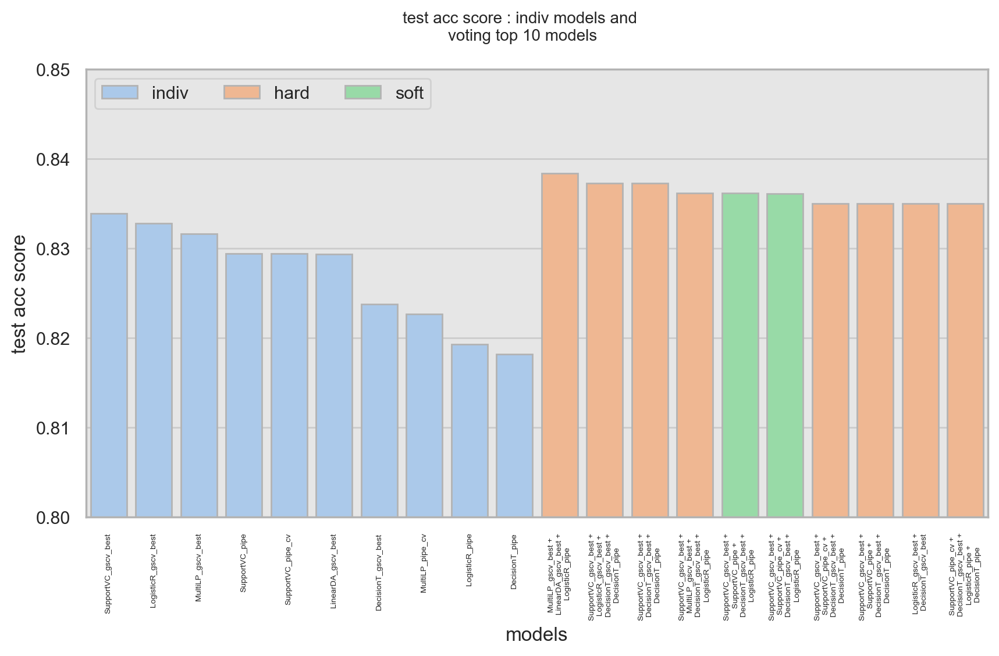

In [35]:
fig, axes = plt.subplots(figsize=(10, 5))

g1 = sns.barplot(
    data=temp_compare_df,
    x="model",
    y="test_score",
    hue="train_type",
    palette="pastel",
    edgecolor=".7",
    ax=axes
)

axes.set(ylim=(0.800, 0.850), xlabel="models", ylabel="test acc score")
axes.set_xticklabels(labels=temp_compare_df["model"], rotation=90, fontsize=5, ha="center")
axes.legend(loc="upper left", ncols=3)
fig.suptitle("test acc score : indiv models and \nvoting top 10 models", fontsize=10);

### 개별 모델과 Voting 모델의 분산 비교
- test score와 std가 가장 좋은 것은 Hard Voting 모델이다.
   - 'MultiLP_gscv_best +\n LinearDA_gscv_best +\n LogisticR_pipe' 모델

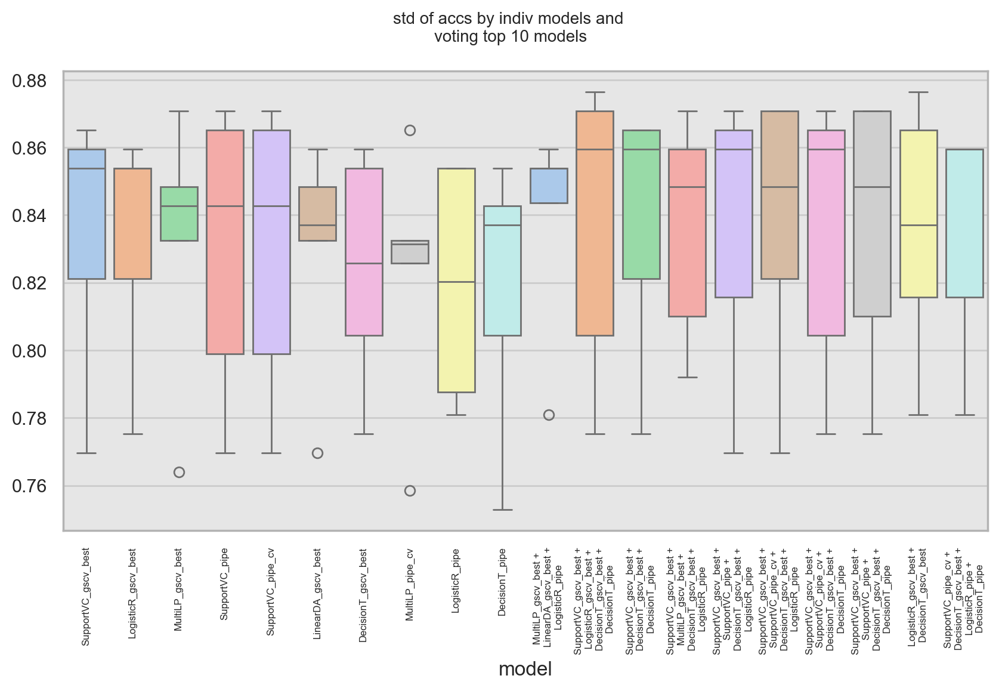

In [36]:
model_accs = temp_compare_df[["model", 0, 1, 2, 3, 4]].set_index("model").T

fig, axes = plt.subplots(figsize=(10, 5))

sns.boxplot(
    data=model_accs,
    palette="pastel",
    ax=axes
)

axes.set_xticklabels(labels=model_accs.columns, rotation=90, fontsize=6, ha="center")
fig.suptitle("std of accs by indiv models and \nvoting top 10 models", fontsize=10);

In [37]:
get_test_std_df(temp_compare_df[["model", "test_score"]].set_index("model"), model_accs)

,test_score,std
model,,
MultiLP_gscv_best + LinearDA_gscv_best + LogisticR_pipe,0.838378,0.032646
SupportVC_gscv_best + LogisticR_gscv_best + DecisionT_gscv_best + DecisionT_pipe,0.837298,0.044916
SupportVC_gscv_best + DecisionT_gscv_best + DecisionT_pipe,0.837280,0.039221
SupportVC_gscv_best + MultiLP_gscv_best + DecisionT_gscv_best + LogisticR_pipe,0.836168,0.033591
SupportVC_gscv_best + SupportVC_pipe + DecisionT_gscv_best + LogisticR_pipe,0.836162,0.043100
SupportVC_gscv_best + SupportVC_pipe_cv + DecisionT_gscv_best + LogisticR_pipe,0.836156,0.042398
SupportVC_gscv_best + SupportVC_pipe_cv + DecisionT_gscv_best + DecisionT_pipe,0.835051,0.042697
SupportVC_gscv_best + SupportVC_pipe + DecisionT_gscv_best + DecisionT_pipe,0.835045,0.041615
LogisticR_gscv_best + DecisionT_gscv_best,0.835039,0.038505


### Ensemble (2) : BaggingClassifier
- 모형 결합 (ensemble)의 취합(aggregation) 중 동일한 확률모형을 사용하여 무작위로 만든 데이터로 fitting한 여러 모델을 만드는 방식
   - 개별 모형 하나를 사용하여 부트스트래핑 방법으로 데이터를 무작위로 구분한 뒤 이 데이터로 훈련한 여러가지 모델을 만든다.
- 개별 모형의 성능과 비슷하거나 오히려 더 성능이 줄어든다.

### 개별 훈련 모델 top 10개 적용
- BaggingClassifier에 개별 모형을 추가할 때 pipe에서 ColumnTransformer에서 column을 지정하는 내부 알고리즘에서 에러가 발생한다. ColumnTransformer 파이프라인 대신 input 데이터 자체를 전처리하여 사용한다.

In [254]:
clf_feature_tech = Pipeline(
    steps=[
        ("feature_interaction", PolynomialFeatures(degree=2, interaction_only=True, include_bias=False)),
        ("feature_select", VarianceThreshold())
    ]
)

clf_feature_engineering = Pipeline(
    steps=[
        #("preprocessor", clf_feature_preprocessor),
        ("feature_tech", clf_feature_tech)
    ]
)

bagg_pipe = Pipeline(
    steps=[
        ("engineering", clf_feature_engineering),
        ("model", load_top_10_models["estimator"][0]["model"])
    ]
)

bagg_pipe

Pipeline(steps=[('engineering',
                 Pipeline(steps=[('feature_tech',
                                  Pipeline(steps=[('feature_interaction',
                                                   PolynomialFeatures(include_bias=False,
                                                                      interaction_only=True)),
                                                  ('feature_select',
                                                   VarianceThreshold())]))])),
                ('model',
                 SVC(C=0.23357214690901226, coef0=0.01, degree=1, gamma=0.1,
                     kernel='poly'))])

### num_features 스케일링

In [121]:
ss = StandardScaler()
X_onehot[num_features] = ss.fit_transform(X_onehot[num_features])
X_onehot[num_features].describe()

,Age,Fare,SibSp,Parch
count,8.910000e+02,8.910000e+02,8.910000e+02,8.910000e+02
mean,1.156327e-16,3.787966e-17,4.386066e-17,5.382900e-17
std,1.000562e+00,1.000562e+00,1.000562e+00,1.000562e+00
min,-2.287169e+00,-6.398612e-01,-4.745452e-01,-4.736736e-01
25%,-5.954183e-01,-4.989476e-01,-4.745452e-01,-4.736736e-01
50%,1.976385e-02,-3.580340e-01,-4.745452e-01,-4.736736e-01
75%,4.042527e-01,-1.581522e-02,4.327934e-01,-4.736736e-01
max,3.864652e+00,9.666962e+00,6.784163e+00,6.974147e+00


### Bagging 실험 : 개별 top 10 모델 실험

In [390]:
bagging_metrics = []
bagging_accs = []

for idx in tqdm(range(10), desc="bagging test by top 10 models", mininterval=0.01) : 
    
    model_name = load_top_10_models["model"][idx]
    model_obj = load_top_10_models["estimator"][idx]["model"]
    
    # baag_pipe에 개별 모델 적용
    bagging_pipe = bagg_pipe.set_params(model=model_obj)
    bagging_model = BaggingClassifier(estimator=bagging_pipe, n_estimators=70, bootstrap=True)

    metrics, accs = get_cv_result(X_onehot, y_enc, [bagging_model], [model_name])

    bagging_metrics.append(metrics)
    bagging_accs.append(pd.DataFrame(accs[0][1], columns=[model_obj]))

bagging test by top 10 models: 100%|██████████| 10/10 [30:01<00:00, 180.17s/it]


In [391]:
pd.concat([result_df.sort_values("test_score").rename(columns={"test_score": "indiv_test_score"})[::-1][:10]["indiv_test_score"], 
           pd.concat(bagging_metrics).rename(columns={"test_score": "bagging_test_score"})["bagging_test_score"]], axis=1)

,indiv_test_score,bagging_test_score
SupportVC_gscv_best,0.833909,0.833915
LogisticR_gscv_best,0.832785,0.831655
MultiLP_gscv_best,0.831649,0.827180
SupportVC_pipe_cv,0.829439,0.826056
SupportVC_pipe,0.829439,0.826062
LinearDA_gscv_best,0.829402,0.829396
DecisionT_gscv_best,0.823815,0.827180
MultiLP_pipe_cv,0.822660,0.791281
LogisticR_pipe,0.819340,0.819340
DecisionT_pipe,0.818197,0.829427


### Bagging 실험 : DecisionTree 모델 사용
- 개별 모형 실험(indiv)보다 성능이 작거나 조금 높다. 
- DecisionT_pipe는 bagging 모델이 indiv 모델보다 성능이 높으나 분산이 더 크다.

In [384]:
# bagging 실험 : 개별 top 10 모델 중 DecisionTree 개별 모델만 실험

bagging_dt_metrics = []
bagging_dt_accs = []

for idx in tqdm([6, 9], desc="bagging test by top 10 models", mininterval=0.01) : 
    
    model_name = load_top_10_models["model"][idx]
    model_obj = load_top_10_models["estimator"][idx]["model"]
    
    # baag_pipe에 개별 모델 적용
    bagging_pipe = bagg_pipe.set_params(model=model_obj)
    bagging_model = BaggingClassifier(estimator=bagging_pipe, n_estimators=500, bootstrap=True)

    metrics, accs = get_cv_result(X_onehot, y_enc, [bagging_model], [model_name])

    bagging_dt_metrics.append(metrics)
    bagging_dt_accs.append(pd.DataFrame(accs[0][1], columns=[model_name]))

bagging test by top 10 models: 100%|██████████| 2/2 [02:03<00:00, 61.95s/it]


In [395]:
result_indiv_dt = result_df.loc[["DecisionT_gscv_best", "DecisionT_pipe"]]
result_indiv_dt["std"] = test_scores.set_index("model").loc[["DecisionT_gscv_best", "DecisionT_pipe"]].iloc[:, :-1].std(axis=1)
result_indiv_dt["train_type"] = "indiv"

result_bagging_dt = pd.concat(bagging_dt_metrics).assign(std=pd.concat(bagging_dt_accs, axis=1).std(axis=0))
result_bagging_dt["train_type"] = "bagging"

compare_dt_indiv_bagg = pd.concat([result_indiv_dt, result_bagging_dt], axis=0)
compare_dt_indiv_bagg.sort_index()

,train_score,test_score,pre_score,recall_score,f1_score,std,train_type
DecisionT_gscv_best,0.849046,0.823815,0.840542,0.654863,0.734590,0.035065,indiv
DecisionT_gscv_best,0.861392,0.827167,0.851370,0.676262,0.752418,0.032076,bagging
DecisionT_pipe,0.832492,0.818197,0.784863,0.725230,0.753210,0.040920,indiv
DecisionT_pipe,0.852413,0.835039,0.853069,0.694763,0.763830,0.048645,bagging


### Bagging 실험 :  LogisticR 모델
- 개별 모형 실험(indiv)의 성능과 같거나 조금 높다. 
- LogisticR_gscv_best는 bagging 모델이 indiv 모델보다 성능이 조금 높고 분산도 작다.

In [398]:
# bagging 실험 : 개별 top 10 모델 중 LogisticR 개별 모델만 실험

bagging_lr_metrics = []
bagging_lr_accs = []

for idx in tqdm([1, 8], desc="bagging test by top 10 models", mininterval=0.01) : 
    
    model_name = load_top_10_models["model"][idx]
    model_obj = load_top_10_models["estimator"][idx]["model"]
    
    # baag_pipe에 개별 모델 적용
    bagging_pipe = bagg_pipe.set_params(model=model_obj)
    bagging_model = BaggingClassifier(estimator=bagging_pipe, n_estimators=300, bootstrap=True)

    metrics, accs = get_cv_result(X_onehot, y_enc, [bagging_model], [model_name])

    bagging_lr_metrics.append(metrics)
    bagging_lr_accs.append(pd.DataFrame(accs[0][1], columns=[model_name]))

bagging test by top 10 models: 100%|██████████| 2/2 [01:41<00:00, 50.94s/it]


In [399]:
result_indiv_lr = result_df.loc[["LogisticR_gscv_best", "LogisticR_pipe"]]
result_indiv_lr["std"] = test_scores.set_index("model").loc[["LogisticR_gscv_best", "LogisticR_pipe"]].iloc[:, :-1].std(axis=1)
result_indiv_lr["train_type"] = "indiv"

result_bagging_lr = pd.concat(bagging_lr_metrics).assign(std=pd.concat(bagging_lr_accs, axis=1).std(axis=0))
result_bagging_lr["train_type"] = "bagging"

compare_lr_indiv_bagg = pd.concat([result_indiv_lr, result_bagging_lr], axis=0)
compare_lr_indiv_bagg.sort_index()

,train_score,test_score,pre_score,recall_score,f1_score,std,train_type
LogisticR_gscv_best,0.840630,0.832785,0.815822,0.731699,0.770646,0.035536,indiv
LogisticR_gscv_best,0.839227,0.833902,0.810630,0.731699,0.768355,0.035167,bagging
LogisticR_pipe,0.857463,0.819340,0.822739,0.683746,0.743826,0.034901,indiv
LogisticR_pipe,0.856342,0.819340,0.825247,0.686687,0.746521,0.032073,bagging


### Bagging 실험 : SVC 모델
- 개별 모형 실험(indiv)의 성능과 같거나 작다. 

In [400]:
# bagging 실험 : 개별 top 10 모델 중 SVC 개별 모델만 실험

bagging_svc_metrics = []

bagging_svc_accs = []

for idx in tqdm([0, 4], desc="bagging test by top 10 models", mininterval=0.01) : 
    
    model_name = load_top_10_models["model"][idx]
    model_obj = load_top_10_models["estimator"][idx]["model"]
    
    # baag_pipe에 개별 모델 적용
    bagging_pipe = bagg_pipe.set_params(model=model_obj)
    bagging_model = BaggingClassifier(estimator=bagging_pipe, n_estimators=300, bootstrap=True)

    metrics, accs = get_cv_result(X_onehot, y_enc, [bagging_model], [model_name])

    bagging_svc_metrics.append(metrics)
    bagging_svc_accs.append(pd.DataFrame(accs[0][1], columns=[model_name]))

bagging test by top 10 models: 100%|██████████| 2/2 [05:02<00:00, 151.29s/it]


In [402]:
result_indiv_svc = result_df.loc[["SupportVC_gscv_best", "SupportVC_pipe_cv"]]
result_indiv_svc["std"] = test_scores.set_index("model").loc[["SupportVC_gscv_best", "SupportVC_pipe_cv"]].iloc[:, :-1].std(axis=1)
result_indiv_svc["train_type"] = "indiv"

result_bagging_svc = pd.concat(bagging_svc_metrics).assign(std=pd.concat(bagging_svc_accs, axis=1).std(axis=0))
result_bagging_svc["train_type"] = "bagging"

compare_svc_indiv_bagg = pd.concat([result_indiv_svc, result_bagging_svc], axis=0)
compare_svc_indiv_bagg.sort_index()

,train_score,test_score,pre_score,recall_score,f1_score,std,train_type
SupportVC_gscv_best,0.837823,0.833909,0.820225,0.728466,0.771021,0.039762,indiv
SupportVC_gscv_best,0.837823,0.833909,0.819097,0.734643,0.773991,0.040157,bagging
SupportVC_pipe_cv,0.849608,0.829439,0.818343,0.718170,0.764546,0.043786,indiv
SupportVC_pipe_cv,0.853816,0.822679,0.822180,0.693450,0.751889,0.038177,bagging


### Ensemble (3) : RandomForest
- 무작위 의사결정나무를 개별 모델로 사용하는 모형 결합으로 feature 일부를 모두 비교하여 최선의 feature를 선택하는 것이 아니라 랜덤하게 feature를 감소시킨 후 이중에서 선택한다.
- RandomForest의 각각의 tree는 training data set에서 추출된 샘플로 구성된다. 
   - 개별 tree는 과적합이 되는 경향이 높고 분산이 큰 편이다.
   - 이러한 문제를 해결하기 위해 tree 별 훈련 데이터를 만드는 과정에서 무작위성을 강화하면 예측 오류가 줄어든다.
   - bootstrap=True 를 설정
- 예측값은 개별 분류기들의 평균 예측값으로 구해진다.   
- 또한 다수결을 사용해서 결과를 예측하기 때문에 많은 수의 트리가 필요하므로 훈련 시간이 오래 걸리 수 있다.
- min_samples_split, max_leaf_nodes, max_depth, min_samples_leaf 매개변수로 숲의 크기를 조정 할 수 있다. 
- 분류 문제에서는 max_features="sqrt"가 일반적이고, 회귀 문제에서는 max_features=1.0 (or None) 이 일반적이다.

In [38]:
from sklearn.ensemble import RandomForestClassifier

### RF 기본 모델을 사용하여 rf_pipe 테스트

In [39]:
clf_feature_preprocessor = ColumnTransformer(
    transformers=[
        ("cat_transformer", cat_transformer["onehot"], cat_features),
        ("num_transformer", num_transformer, num_features)
    ], remainder="passthrough"
)

clf_feature_tech = Pipeline(
    steps=[
        ("feature_interaction", PolynomialFeatures(degree=2, interaction_only=True, include_bias=False)),
        ("feature_select", VarianceThreshold())
    ]
)

clf_feature_engineering = Pipeline(
    steps=[
        ("preprocessor", clf_feature_preprocessor),
        ("feature_tech", clf_feature_tech)
    ]
)

rf_pipe = Pipeline(
    steps=[
        ("engineering", clf_feature_engineering),
        ("model", RandomForestClassifier(max_depth=None, min_samples_split=2))
    ]
)

rf_pipe

Pipeline(steps=[('engineering',
                 Pipeline(steps=[('preprocessor',
                                  ColumnTransformer(remainder='passthrough',
                                                    transformers=[('cat_transformer',
                                                                   OneHotEncoder(),
                                                                   ['Sex',
                                                                    'title_name',
                                                                    'Embarked',
                                                                    'Pclass',
                                                                    'generation']),
                                                                  ('num_transformer',
                                                                   Pipeline(steps=[('scaler',
                                                                                    StandardScaler())]),
                                                                   ['Age',
                                                                    'Fare',
                                                                    'SibSp',
                                                                    'Parch'])])),
                                 ('feature_tech',
                                  Pipeline(steps=[('feature_interaction',
                                                   PolynomialFeatures(include_bias=False,
                                                                      interaction_only=True)),
                                                  ('feature_select',
                                                   VarianceThreshold())]))])),
                ('model', RandomForestClassifier())])

In [40]:
rf_metrics, rf_accs = get_cv_result(X, y_enc, [rf_pipe], ["rf pipe test"])

In [44]:
rf_metrics["std"] = rf_accs[0][1].std()
rf_metrics

,train_score,test_score,pre_score,recall_score,f1_score,std
model,,,,,,
rf pipe test,0.968294,0.794614,0.753213,0.723014,0.734327,0.022622


### GridSearchCV를 사용한 rf_pipe 하이퍼 파라미터 튜닝 - (1)
- RF의 개별 tree를 생성하는 n_estimators와 tree의 깊이를 설정하는 max_depth 튜닝

In [45]:
%%time

rf_params = {
    "model__n_estimators": [i for i in range(100, 501, 100)],
    "model__max_depth": [i for i in range(2, 10)],
    #"model__min_samples_split": [i for i in range(2, 10)],
    #"model__min_samples_leaf": [i for i in range(2, 5)],
    #"model__criterion": ["gini", "entropy"]
    
}

cv = KFold(n_splits=5, shuffle=True, random_state=50)
rf_gscv_1 = GridSearchCV(estimator=rf_pipe, param_grid=rf_params, cv=cv, scoring="accuracy", return_train_score=True)
rf_gscv_1.fit(X, y_enc)

CPU times: total: 1min 51s
Wall time: 1min 59s


GridSearchCV(cv=KFold(n_splits=5, random_state=50, shuffle=True),
             estimator=Pipeline(steps=[('engineering',
                                        Pipeline(steps=[('preprocessor',
                                                         ColumnTransformer(remainder='passthrough',
                                                                           transformers=[('cat_transformer',
                                                                                          OneHotEncoder(),
                                                                                          ['Sex',
                                                                                           'title_name',
                                                                                           'Embarked',
                                                                                           'Pclass',
                                                                                           'generation']),
                                                                                         ('num_transformer',
                                                                                          Pipeline(steps=[('scaler',
                                                                                                           StandardScaler())]),
                                                                                          ['A...
                                                                                           'SibSp',
                                                                                           'Parch'])])),
                                                        ('feature_tech',
                                                         Pipeline(steps=[('feature_interaction',
                                                                          PolynomialFeatures(include_bias=False,
                                                                                             interaction_only=True)),
                                                                         ('feature_select',
                                                                          VarianceThreshold())]))])),
                                       ('model', RandomForestClassifier())]),
             param_grid={'model__max_depth': [2, 3, 4, 5, 6, 7, 8, 9],
                         'model__n_estimators': [100, 200, 300, 400, 500]},
             return_train_score=True, scoring='accuracy')

In [46]:
result_rf_gscv_1 = pd.DataFrame(rf_gscv_1.cv_results_).sort_values("rank_test_score")
cols = list(result_rf_gscv_1.filter(regex="^param_model").columns) + ["mean_fit_time", "mean_test_score", "mean_train_score", "std_test_score", "rank_test_score"]
result_rf_gscv_1[cols][:10].style.applymap(draw_color_cell, color="#ffd700", subset=(result_rf_gscv_1.index[0]))

,param_model__max_depth,param_model__n_estimators,mean_fit_time,mean_test_score,mean_train_score,std_test_score,rank_test_score
29,7,500,0.934999,0.835045,0.898431,0.037052,1
19,5,500,0.795610,0.833921,0.859990,0.038232,2
17,5,300,0.482806,0.832798,0.861392,0.037706,3
31,8,200,0.414405,0.832798,0.915546,0.037370,4
27,7,300,0.573208,0.831680,0.898712,0.041442,5
23,6,400,0.699004,0.831662,0.878508,0.036695,6
32,8,300,0.629408,0.830550,0.915265,0.036701,7
18,5,400,0.646800,0.830550,0.858306,0.038382,7
24,6,500,0.885519,0.830538,0.880192,0.033159,9
22,6,300,0.527611,0.829414,0.878788,0.035233,10


### GridSearchCV를 사용한 rf_pipe 하이퍼 파라미터 튜닝 - (2)
- tree를 분리할 때 사용할 훈련 데이터 세트의 갯수를 설정하는 min_samples_split과 분류규칙의 기준이 criterion 튜닝

In [47]:
%%time

rf_params = {
    "model__n_estimators": [i for i in range(100, 501, 100)],
    "model__max_depth": [i for i in range(2, 8)],
    "model__min_samples_split": [i for i in range(2, 8)],
    #"model__min_samples_leaf": [i for i in range(2, 5)],
    "model__criterion": ["gini", "entropy"]
    
}

cv = KFold(n_splits=5, shuffle=True, random_state=50)
rf_gscv_2 = GridSearchCV(estimator=rf_pipe, param_grid=rf_params, cv=cv, scoring="accuracy", return_train_score=True, n_jobs=2)
rf_gscv_2.fit(X, y_enc)

CPU times: total: 3.25 s
Wall time: 14min 45s


GridSearchCV(cv=KFold(n_splits=5, random_state=50, shuffle=True),
             estimator=Pipeline(steps=[('engineering',
                                        Pipeline(steps=[('preprocessor',
                                                         ColumnTransformer(remainder='passthrough',
                                                                           transformers=[('cat_transformer',
                                                                                          OneHotEncoder(),
                                                                                          ['Sex',
                                                                                           'title_name',
                                                                                           'Embarked',
                                                                                           'Pclass',
                                                                                           'generation']),
                                                                                         ('num_transformer',
                                                                                          Pipeline(steps=[('scaler',
                                                                                                           StandardScaler())]),
                                                                                          ['A...
                                                                          PolynomialFeatures(include_bias=False,
                                                                                             interaction_only=True)),
                                                                         ('feature_select',
                                                                          VarianceThreshold())]))])),
                                       ('model', RandomForestClassifier())]),
             n_jobs=2,
             param_grid={'model__criterion': ['gini', 'entropy'],
                         'model__max_depth': [2, 3, 4, 5, 6, 7],
                         'model__min_samples_split': [2, 3, 4, 5, 6, 7],
                         'model__n_estimators': [100, 200, 300, 400, 500]},
             return_train_score=True, scoring='accuracy')

In [48]:
result_rf_gscv_2 = pd.DataFrame(rf_gscv_2.cv_results_).sort_values("rank_test_score")
cols = list(result_rf_gscv_2.filter(regex="^param_model").columns) + ["mean_fit_time", "mean_test_score", "mean_train_score", "std_test_score", "rank_test_score"]
result_rf_gscv_2[cols][:10].style.applymap(draw_color_cell, color="#ffd700", subset=(result_rf_gscv_2.index[0]))

,param_model__criterion,param_model__max_depth,param_model__min_samples_split,param_model__n_estimators,mean_fit_time,mean_test_score,mean_train_score,std_test_score,rank_test_score
351,entropy,7,6,200,0.408616,0.839514,0.886927,0.034518,1
171,gini,7,6,200,1.262564,0.837292,0.888328,0.041140,2
115,gini,5,7,100,0.612735,0.837267,0.852135,0.036033,3
172,gini,7,6,300,1.868419,0.836162,0.889171,0.035658,4
327,entropy,6,7,300,0.582233,0.836162,0.869249,0.038550,4
359,entropy,7,7,500,0.990431,0.836156,0.883560,0.034616,6
164,gini,7,4,500,3.084858,0.835051,0.894783,0.040748,7
338,entropy,7,3,400,0.816833,0.835045,0.890574,0.039204,8
348,entropy,7,5,400,0.819233,0.835039,0.888889,0.037594,9
346,entropy,7,5,200,0.404208,0.835039,0.885242,0.034985,9


In [50]:
pd.concat([
    temp_compare_df.sort_values("test_score", ascending=False)[:2][["model", "test_score", "train_type"]],
    pd.DataFrame({"model": "RandomF", "test_score": result_rf_gscv_2["mean_test_score"].iloc[0], "train_type": "rf"}, index=[0])
], axis=0)

,model,test_score,train_type
0,MultiLP_gscv_best +\n LinearDA_gscv_best +\n L...,0.838378,hard
1,SupportVC_gscv_best +\n LogisticR_gscv_best +\...,0.837298,hard
0,RandomF,0.839514,rf


### GridSearchCV를 사용한 rf_pipe 하이퍼 파라미터 튜닝 - (3)
- 개별 tree의 최소 노드의 갯수를 설정하는 min_samples_leaf 튜닝

In [51]:
%%time

rf_params = {
    "model__n_estimators": [i for i in range(100, 501, 100)],
    "model__max_depth": [i for i in range(2, 8)],
    "model__min_samples_split": [i for i in range(2, 8)],
    "model__min_samples_leaf": [i for i in range(2, 6)],
    "model__criterion": ["gini", "entropy"]    
}

cv = KFold(n_splits=5, shuffle=True, random_state=50)
rf_gscv_3 = GridSearchCV(estimator=rf_pipe, param_grid=rf_params, cv=cv, scoring="accuracy", return_train_score=True, n_jobs=2)
rf_gscv_3.fit(X, y_enc)

CPU times: total: 2.34 s
Wall time: 35min 15s


GridSearchCV(cv=KFold(n_splits=5, random_state=50, shuffle=True),
             estimator=Pipeline(steps=[('engineering',
                                        Pipeline(steps=[('preprocessor',
                                                         ColumnTransformer(remainder='passthrough',
                                                                           transformers=[('cat_transformer',
                                                                                          OneHotEncoder(),
                                                                                          ['Sex',
                                                                                           'title_name',
                                                                                           'Embarked',
                                                                                           'Pclass',
                                                                                           'generation']),
                                                                                         ('num_transformer',
                                                                                          Pipeline(steps=[('scaler',
                                                                                                           StandardScaler())]),
                                                                                          ['A...
                                                                                             interaction_only=True)),
                                                                         ('feature_select',
                                                                          VarianceThreshold())]))])),
                                       ('model', RandomForestClassifier())]),
             n_jobs=2,
             param_grid={'model__criterion': ['gini', 'entropy'],
                         'model__max_depth': [2, 3, 4, 5, 6, 7],
                         'model__min_samples_leaf': [2, 3, 4, 5],
                         'model__min_samples_split': [2, 3, 4, 5, 6, 7],
                         'model__n_estimators': [100, 200, 300, 400, 500]},
             return_train_score=True, scoring='accuracy')

In [52]:
result_rf_gscv_3 = pd.DataFrame(rf_gscv_3.cv_results_).sort_values("rank_test_score")
cols = list(result_rf_gscv_3.filter(regex="^param_model").columns) + ["mean_fit_time", "mean_test_score", "mean_train_score", "std_test_score", "rank_test_score"]
result_rf_gscv_3[cols][:10].style.applymap(draw_color_cell, color="#ffd700", subset=(result_rf_gscv_3.index[0]))

,param_model__criterion,param_model__max_depth,param_model__min_samples_leaf,param_model__min_samples_split,param_model__n_estimators,mean_fit_time,mean_test_score,mean_train_score,std_test_score,rank_test_score
666,gini,7,4,3,200,0.392998,0.840650,0.870090,0.037765,1
1261,entropy,6,4,2,200,0.376400,0.839527,0.861394,0.034081,2
555,gini,6,4,5,100,0.197199,0.838416,0.861393,0.036483,3
625,gini,7,2,7,100,0.210202,0.838403,0.882155,0.033301,4
1292,entropy,6,5,2,300,0.550399,0.838403,0.856906,0.038734,4
1361,entropy,7,3,4,200,0.401391,0.838397,0.876543,0.037608,6
1357,entropy,7,3,3,300,0.603199,0.838397,0.874299,0.034819,6
628,gini,7,2,7,400,0.775600,0.837292,0.882997,0.038114,8
1429,entropy,7,5,5,500,0.942799,0.837292,0.865603,0.038114,8
664,gini,7,4,2,500,0.947600,0.837286,0.870652,0.037143,10


### GridSearchCV로 실험한 RandomForest 모델 중 best 모델을 사용하여 cv 테스트
- 다른 모든 개별 모형의 GridSearchCV 실험과 비교했을때 test score가 가장 높았다.
   - RF의 best 모델을 cv로 실험하면 성능은 Voting 모델보다 다소 떨어지지만 전체 모델의 성능 기록중에서 높은 편에 속했다.

In [64]:
rf_gscv_1_best = pd.DataFrame(rf_gscv_1.best_params_, index=[0]).assign(model="rf_gscv_1", test_score=rf_gscv_1.best_score_)
rf_gscv_2_best = pd.DataFrame(rf_gscv_2.best_params_, index=[0]).assign(model="rf_gscv_2", test_score=rf_gscv_2.best_score_)
rf_gscv_3_best = pd.DataFrame(rf_gscv_3.best_params_, index=[0]).assign(model="rf_gscv_3", test_score=rf_gscv_3.best_score_)
rf_gscv_best_compare = pd.concat([rf_gscv_1_best, rf_gscv_2_best, rf_gscv_3_best], axis=0).reset_index(drop=True)
rf_gscv_best_compare\
    .fillna(0)\
    .sort_values("test_score", ascending=False)\
    .reset_index(drop=True)\
    .style.applymap(draw_color_cell, color="#ffd700", subset=(rf_gscv_best_compare.index[0]))

,model__max_depth,model__n_estimators,model,test_score,model__criterion,model__min_samples_split,model__min_samples_leaf
0,7,200,rf_gscv_3,0.840650,gini,3.000000,4.000000
1,7,200,rf_gscv_2,0.839514,entropy,6.000000,0.000000
2,7,500,rf_gscv_1,0.835045,0,0.000000,0.000000


In [66]:
%%time

rf_gscv_best_model = rf_gscv_3.best_estimator_
rf_gscv_best_metrics, rf_gscv_best_accs = get_cv_result(X, y_enc, [rf_gscv_best_model], ["RandomF_gscv_best"])

CPU times: total: 3.77 s
Wall time: 4.09 s


In [103]:
rf_gscv_best_df = pd.concat([rf_gscv_best_metrics, pd.DataFrame(rf_gscv_best_accs[0][1], columns=["RandomF_gscv_best"]).T], axis=1)
rf_gscv_best_df["std"] = rf_gscv_best_df[[0, 1, 2, 3, 4]].std(axis=1)
rf_gscv_best_df = rf_gscv_best_df.reset_index().rename(columns={"index": "model"}).assign(train_type="RF")
rf_gscv_best_df

,model,train_score,test_score,pre_score,recall_score,f1_score,0,1,2,3,4,std,train_type
0,RandomF_gscv_best,0.869249,0.835045,0.830254,0.709724,0.764545,0.810056,0.859551,0.870787,0.775281,0.859551,0.040849,RF


### 전체 모델링 리스트에 추가 및 모델 저장
- total_compare_df : 개별 모델 top 10 + Voting 모델 top 10 + RandomForest 모델 best 1

In [105]:
total_compare_df = pd.concat([temp_compare_df, rf_gscv_best_df], axis=0).sort_values("test_score", ascending=False)
total_compare_df = total_compare_df.reset_index(drop=True)
total_compare_df

,model,train_score,test_score,pre_score,recall_score,f1_score,0,1,2,3,4,std,train_type,comb
0,MultiLP_gscv_best +\n LinearDA_gscv_best +\n L...,0.845959,0.838378,0.815293,0.723894,0.764736,0.843575,0.859551,0.853933,0.780899,0.853933,0.032646,hard,"(2, 5, 8)"
1,SupportVC_gscv_best +\n LogisticR_gscv_best +\...,0.841191,0.837298,0.833453,0.714597,0.768936,0.804469,0.859551,0.876404,0.775281,0.870787,0.044916,hard,"(0, 1, 6, 9)"
2,SupportVC_gscv_best +\n DecisionT_gscv_best +\...,0.838104,0.837280,0.817959,0.731745,0.771934,0.821229,0.865169,0.859551,0.775281,0.865169,0.039221,hard,"(0, 6, 9)"
3,SupportVC_gscv_best +\n MultiLP_gscv_best +\n ...,0.850730,0.836168,0.827785,0.698618,0.757384,0.810056,0.859551,0.870787,0.792135,0.848315,0.033591,hard,"(0, 2, 6, 8)"
4,SupportVC_gscv_best +\n SupportVC_pipe +\n Dec...,0.852413,0.836162,0.835943,0.718505,0.771723,0.815642,0.859551,0.870787,0.769663,0.865169,0.043100,soft,"(0, 3, 6, 8)"
5,SupportVC_gscv_best +\n SupportVC_pipe_cv +\n ...,0.855219,0.836156,0.824567,0.718167,0.766525,0.821229,0.870787,0.870787,0.769663,0.848315,0.042398,soft,"(0, 4, 6, 8)"
6,SupportVC_gscv_best +\n SupportVC_pipe_cv +\n ...,0.842875,0.835051,0.830033,0.722961,0.772474,0.804469,0.859551,0.865169,0.775281,0.870787,0.042697,hard,"(0, 4, 6, 9)"
7,RandomF_gscv_best,0.869249,0.835045,0.830254,0.709724,0.764545,0.810056,0.859551,0.870787,0.775281,0.859551,0.040849,RF,NaN
8,SupportVC_gscv_best +\n SupportVC_pipe +\n Dec...,0.843155,0.835045,0.830483,0.711656,0.766016,0.810056,0.848315,0.870787,0.775281,0.870787,0.041615,hard,"(0, 3, 6, 9)"
9,LogisticR_gscv_best +\n DecisionT_gscv_best,0.845681,0.835039,0.867695,0.662228,0.749969,0.815642,0.865169,0.876404,0.780899,0.837079,0.038505,hard,"(1, 6)"


In [106]:
dir_path = "./build_model"

save_model(dir_path, rf_gscv_best_model, "rf_gscv_best")

rf_gscv_best save success.


### Ensemble (4) : ExtraTreesClassifier
- RandomForest와 같은 방식이지만 훈련 데이터 분할의 무작위성이 더 극단적이다.
- 즉 node 분리시 데이터를 분할할 때 전체데이터 중에서 선택한다.
   - bootstrap=False
- 개별 tree별 훈련 데이터의 무작위성이 커지므로 모델의 분산이 줄어드는 효과가 있다.   

In [107]:
from sklearn.ensemble import ExtraTreesClassifier

### ExtraT 기본 모델을 사용하여 rf_pipe 테스트

In [109]:
clf_feature_preprocessor = ColumnTransformer(
    transformers=[
        ("cat_transformer", cat_transformer["onehot"], cat_features),
        ("num_transformer", num_transformer, num_features)
    ], remainder="passthrough"
)

clf_feature_tech = Pipeline(
    steps=[
        ("feature_interaction", PolynomialFeatures(degree=2, interaction_only=True, include_bias=False)),
        ("feature_select", VarianceThreshold())
    ]
)

clf_feature_engineering = Pipeline(
    steps=[
        ("preprocessor", clf_feature_preprocessor),
        ("feature_tech", clf_feature_tech)
    ]
)

ext_pipe = Pipeline(
    steps=[
        ("engineering", clf_feature_engineering),
        ("model", ExtraTreesClassifier(max_depth=None, min_samples_split=2))
    ]
)

ext_pipe

Pipeline(steps=[('engineering',
                 Pipeline(steps=[('preprocessor',
                                  ColumnTransformer(remainder='passthrough',
                                                    transformers=[('cat_transformer',
                                                                   OneHotEncoder(),
                                                                   ['Sex',
                                                                    'title_name',
                                                                    'Embarked',
                                                                    'Pclass',
                                                                    'generation']),
                                                                  ('num_transformer',
                                                                   Pipeline(steps=[('scaler',
                                                                                    StandardScaler())]),
                                                                   ['Age',
                                                                    'Fare',
                                                                    'SibSp',
                                                                    'Parch'])])),
                                 ('feature_tech',
                                  Pipeline(steps=[('feature_interaction',
                                                   PolynomialFeatures(include_bias=False,
                                                                      interaction_only=True)),
                                                  ('feature_select',
                                                   VarianceThreshold())]))])),
                ('model', ExtraTreesClassifier())])

In [110]:
%%time

ext_metrics, ext_accs = get_cv_result(X, y_enc, [ext_pipe], ["ExtraT_pipe_cv"])

CPU times: total: 3.14 s
Wall time: 3.22 s


In [111]:
ext_metrics

,train_score,test_score,pre_score,recall_score,f1_score
model,,,,,
ExtraT_pipe_cv,0.968294,0.784508,0.735211,0.696659,0.711154


### GridSearchCV를 사용한 ext_pipe의 하이퍼 파라미터 튜닝 - (1)

In [113]:
%%time

ext_params = {
    "model__n_estimators": [i for i in range(100, 801, 100)],
    "model__max_depth": [i for i in range(2, 10)],
    #"model__min_samples_split": [i for i in range(2, 10)],
    #"model__min_samples_leaf": [i for i in range(2, 5)],
    #"model__criterion": ["gini", "entropy"]
    
}

cv = KFold(n_splits=5, shuffle=True, random_state=50)
ext_gscv_1 = GridSearchCV(estimator=ext_pipe, param_grid=ext_params, cv=cv, scoring="accuracy", return_train_score=True)
ext_gscv_1.fit(X, y_enc)

CPU times: total: 3min 11s
Wall time: 3min 18s


GridSearchCV(cv=KFold(n_splits=5, random_state=50, shuffle=True),
             estimator=Pipeline(steps=[('engineering',
                                        Pipeline(steps=[('preprocessor',
                                                         ColumnTransformer(remainder='passthrough',
                                                                           transformers=[('cat_transformer',
                                                                                          OneHotEncoder(),
                                                                                          ['Sex',
                                                                                           'title_name',
                                                                                           'Embarked',
                                                                                           'Pclass',
                                                                                           'generation']),
                                                                                         ('num_transformer',
                                                                                          Pipeline(steps=[('scaler',
                                                                                                           StandardScaler())]),
                                                                                          ['A...
                                                                                           'Parch'])])),
                                                        ('feature_tech',
                                                         Pipeline(steps=[('feature_interaction',
                                                                          PolynomialFeatures(include_bias=False,
                                                                                             interaction_only=True)),
                                                                         ('feature_select',
                                                                          VarianceThreshold())]))])),
                                       ('model', ExtraTreesClassifier())]),
             param_grid={'model__max_depth': [2, 3, 4, 5, 6, 7, 8, 9],
                         'model__n_estimators': [100, 200, 300, 400, 500, 600,
                                                 700, 800]},
             return_train_score=True, scoring='accuracy')

In [114]:
result_ext_gscv_1 = pd.DataFrame(ext_gscv_1.cv_results_).sort_values("rank_test_score")
cols = list(result_ext_gscv_1.filter(regex="^param_model").columns) + ["mean_fit_time", "mean_test_score", "mean_train_score", "std_test_score", "rank_test_score"]
result_ext_gscv_1[cols][:10].style.applymap(draw_color_cell, color="#ffd700", subset=(result_ext_gscv_1.index[0]))

,param_model__max_depth,param_model__n_estimators,mean_fit_time,mean_test_score,mean_train_score,std_test_score,rank_test_score
28,5,500,0.522806,0.829439,0.850450,0.038513,1
36,6,500,0.568005,0.829433,0.861111,0.032315,2
38,6,700,0.779808,0.828316,0.863075,0.035448,3
25,5,200,0.214595,0.828316,0.851853,0.040282,3
42,7,300,0.373796,0.828310,0.870931,0.030098,5
45,7,600,0.733212,0.828303,0.870652,0.032944,6
44,7,500,0.619006,0.828303,0.871773,0.030969,6
43,7,400,0.491392,0.828303,0.870651,0.030969,6
26,5,300,0.316792,0.827199,0.853536,0.041151,9
30,5,700,0.758203,0.827192,0.852133,0.039144,10


### GridSearchCV를 사용한 ext_pipe의 하이퍼 파라미터 튜닝 - (2)

In [115]:
%%time

ext_params = {
    "model__n_estimators": [i for i in range(100, 501, 100)],
    "model__max_depth": [i for i in range(2, 10)],
    "model__min_samples_split": [i for i in range(2, 10)],
    #"model__min_samples_leaf": [i for i in range(2, 5)],
    "model__criterion": ["gini", "entropy"]
    
}

cv = KFold(n_splits=5, shuffle=True, random_state=50)
ext_gscv_2 = GridSearchCV(estimator=ext_pipe, param_grid=ext_params, cv=cv, scoring="accuracy", return_train_score=True, n_jobs=2)
ext_gscv_2.fit(X, y_enc)

CPU times: total: 6.23 s
Wall time: 12min 14s


GridSearchCV(cv=KFold(n_splits=5, random_state=50, shuffle=True),
             estimator=Pipeline(steps=[('engineering',
                                        Pipeline(steps=[('preprocessor',
                                                         ColumnTransformer(remainder='passthrough',
                                                                           transformers=[('cat_transformer',
                                                                                          OneHotEncoder(),
                                                                                          ['Sex',
                                                                                           'title_name',
                                                                                           'Embarked',
                                                                                           'Pclass',
                                                                                           'generation']),
                                                                                         ('num_transformer',
                                                                                          Pipeline(steps=[('scaler',
                                                                                                           StandardScaler())]),
                                                                                          ['A...
                                                                          PolynomialFeatures(include_bias=False,
                                                                                             interaction_only=True)),
                                                                         ('feature_select',
                                                                          VarianceThreshold())]))])),
                                       ('model', ExtraTreesClassifier())]),
             n_jobs=2,
             param_grid={'model__criterion': ['gini', 'entropy'],
                         'model__max_depth': [2, 3, 4, 5, 6, 7, 8, 9],
                         'model__min_samples_split': [2, 3, 4, 5, 6, 7, 8, 9],
                         'model__n_estimators': [100, 200, 300, 400, 500]},
             return_train_score=True, scoring='accuracy')

In [116]:
result_ext_gscv_2 = pd.DataFrame(ext_gscv_2.cv_results_).sort_values("rank_test_score")
cols = list(result_ext_gscv_2.filter(regex="^param_model").columns) + ["mean_fit_time", "mean_test_score", "mean_train_score", "std_test_score", "rank_test_score"]
result_ext_gscv_2[cols][:10].style.applymap(draw_color_cell, color="#ffd700", subset=(result_ext_gscv_2.index[0]))

,param_model__criterion,param_model__max_depth,param_model__min_samples_split,param_model__n_estimators,mean_fit_time,mean_test_score,mean_train_score,std_test_score,rank_test_score
143,gini,5,6,400,0.468422,0.831687,0.853256,0.039854,1
467,entropy,5,7,300,0.351621,0.831687,0.851011,0.040012,1
513,entropy,6,8,400,0.494036,0.831687,0.856060,0.035319,1
127,gini,5,3,300,0.351613,0.831687,0.852975,0.043051,1
540,entropy,7,6,100,0.142415,0.831687,0.863354,0.033295,1
441,entropy,5,2,200,0.236815,0.831687,0.852414,0.043051,1
507,entropy,6,7,300,0.379200,0.831680,0.856622,0.033527,7
447,entropy,5,3,300,0.353014,0.831674,0.852694,0.039606,8
185,gini,6,7,100,0.130404,0.831674,0.855501,0.036626,8
471,entropy,5,8,200,0.236013,0.830569,0.848204,0.040824,10


### GridSearchCV를 사용한 ext_pipe의 하이퍼 파라미터 튜닝 - (3)

In [117]:
%%time

ext_params = {
    "model__n_estimators": [i for i in range(100, 601, 100)],
    "model__max_depth": [i for i in range(2, 8)],
    "model__min_samples_split": [i for i in range(2, 10)],
    "model__min_samples_leaf": [i for i in range(2, 5)],
    "model__criterion": ["gini", "entropy"]
    
}

cv = KFold(n_splits=5, shuffle=True, random_state=50)
ext_gscv_3 = GridSearchCV(estimator=ext_pipe, param_grid=ext_params, cv=cv, scoring="accuracy", return_train_score=True, n_jobs=2)
ext_gscv_3.fit(X, y_enc)

CPU times: total: 3.34 s
Wall time: 35min 9s


GridSearchCV(cv=KFold(n_splits=5, random_state=50, shuffle=True),
             estimator=Pipeline(steps=[('engineering',
                                        Pipeline(steps=[('preprocessor',
                                                         ColumnTransformer(remainder='passthrough',
                                                                           transformers=[('cat_transformer',
                                                                                          OneHotEncoder(),
                                                                                          ['Sex',
                                                                                           'title_name',
                                                                                           'Embarked',
                                                                                           'Pclass',
                                                                                           'generation']),
                                                                                         ('num_transformer',
                                                                                          Pipeline(steps=[('scaler',
                                                                                                           StandardScaler())]),
                                                                                          ['A...
                                                                                             interaction_only=True)),
                                                                         ('feature_select',
                                                                          VarianceThreshold())]))])),
                                       ('model', ExtraTreesClassifier())]),
             n_jobs=2,
             param_grid={'model__criterion': ['gini', 'entropy'],
                         'model__max_depth': [2, 3, 4, 5, 6, 7],
                         'model__min_samples_leaf': [2, 3, 4],
                         'model__min_samples_split': [2, 3, 4, 5, 6, 7, 8, 9],
                         'model__n_estimators': [100, 200, 300, 400, 500, 600]},
             return_train_score=True, scoring='accuracy')

In [118]:
result_ext_gscv_3 = pd.DataFrame(ext_gscv_3.cv_results_).sort_values("rank_test_score")
cols = list(result_ext_gscv_3.filter(regex="^param_model").columns) + ["mean_fit_time", "mean_test_score", "mean_train_score", "std_test_score", "rank_test_score"]
result_ext_gscv_3[cols][:10].style.applymap(draw_color_cell, color="#ffd700", subset=(result_ext_gscv_3.index[0]))

,param_model__criterion,param_model__max_depth,param_model__min_samples_leaf,param_model__min_samples_split,param_model__n_estimators,mean_fit_time,mean_test_score,mean_train_score,std_test_score,rank_test_score
642,gini,6,3,5,100,0.133600,0.836175,0.848766,0.039291,1
614,gini,6,2,8,300,0.372599,0.833928,0.853534,0.034915,2
451,gini,5,2,5,200,0.239393,0.833928,0.848767,0.040443,2
1459,entropy,6,2,5,200,0.259399,0.833928,0.852412,0.034915,2
843,gini,7,4,6,400,0.509800,0.833928,0.848485,0.034915,2
807,gini,7,3,8,400,0.514599,0.833928,0.850730,0.034915,2
1527,entropy,6,3,8,400,0.479801,0.833928,0.849045,0.034915,2
1595,entropy,7,2,3,600,0.778800,0.833921,0.858025,0.033289,8
590,gini,6,2,4,300,0.374200,0.833921,0.852694,0.033289,8
757,gini,7,2,8,200,0.258600,0.833921,0.856902,0.033289,8


In [120]:
ext_gscv_1_best = pd.DataFrame(ext_gscv_1.best_params_, index=[0]).assign(model="ext_gscv_1", test_score=ext_gscv_1.best_score_)
ext_gscv_2_best = pd.DataFrame(ext_gscv_2.best_params_, index=[0]).assign(model="ext_gscv_2", test_score=ext_gscv_2.best_score_)
ext_gscv_3_best = pd.DataFrame(ext_gscv_3.best_params_, index=[0]).assign(model="ext_gscv_3", test_score=ext_gscv_3.best_score_)
ext_gscv_best_compare = pd.concat([ext_gscv_1_best, ext_gscv_2_best, ext_gscv_3_best], axis=0).reset_index(drop=True)
ext_gscv_best_compare\
    .fillna(0)\
    .sort_values("test_score", ascending=False)\
    .reset_index(drop=True)\
    .style.applymap(draw_color_cell, color="#ffd700", subset=(ext_gscv_best_compare.index[0]))

,model__max_depth,model__n_estimators,model,test_score,model__criterion,model__min_samples_split,model__min_samples_leaf
0,6,100,ext_gscv_3,0.836175,gini,5.000000,3.000000
1,5,300,ext_gscv_2,0.831687,gini,3.000000,0.000000
2,5,500,ext_gscv_1,0.829439,0,0.000000,0.000000


### GridSearchCV로 실험한 ExtraT 모델 중 best 모델을 사용하여 cv 테스트
- cross validate 실험에서 성능이 감소한다.

In [123]:
%%time

ext_gscv_best_model = ext_gscv_3.best_estimator_
ext_gscv_best_metrics, ext_gscv_best_accs = get_cv_result(X, y_enc, [ext_gscv_best_model], ["ExtraT_gscv_best"])

CPU times: total: 1.39 s
Wall time: 1.49 s


In [124]:
ext_gscv_best_df = pd.concat([ext_gscv_best_metrics, pd.DataFrame(ext_gscv_best_accs[0][1], columns=["ExtraT_gscv_best"]).T], axis=1)
ext_gscv_best_df["std"] = ext_gscv_best_df[[0, 1, 2, 3, 4]].std(axis=1)
ext_gscv_best_df = ext_gscv_best_df.reset_index().rename(columns={"index": "model"}).assign(train_type="EXT")
ext_gscv_best_df

,model,train_score,test_score,pre_score,recall_score,f1_score,0,1,2,3,4,std,train_type
0,ExtraT_gscv_best,0.846241,0.83168,0.854061,0.683951,0.757687,0.804469,0.870787,0.853933,0.775281,0.853933,0.040128,EXT


### 전체 모델링 리스트에 추가 및 모델 저장
- total_compare_df : 개별 모델 top 10 + Voting 모델 top 10 + RandomForest 모델 best 1 + ExtraTrees 모델 best 1

In [127]:
total_compare_df = pd.concat([temp_compare_df, ext_gscv_best_df], axis=0).sort_values("test_score", ascending=False)
total_compare_df = total_compare_df.reset_index(drop=True)
total_compare_df

,model,train_score,test_score,pre_score,recall_score,f1_score,0,1,2,3,4,std,train_type,comb
0,MultiLP_gscv_best +\n LinearDA_gscv_best +\n L...,0.845959,0.838378,0.815293,0.723894,0.764736,0.843575,0.859551,0.853933,0.780899,0.853933,0.032646,hard,"(2, 5, 8)"
1,SupportVC_gscv_best +\n LogisticR_gscv_best +\...,0.841191,0.837298,0.833453,0.714597,0.768936,0.804469,0.859551,0.876404,0.775281,0.870787,0.044916,hard,"(0, 1, 6, 9)"
2,SupportVC_gscv_best +\n DecisionT_gscv_best +\...,0.838104,0.837280,0.817959,0.731745,0.771934,0.821229,0.865169,0.859551,0.775281,0.865169,0.039221,hard,"(0, 6, 9)"
3,SupportVC_gscv_best +\n MultiLP_gscv_best +\n ...,0.850730,0.836168,0.827785,0.698618,0.757384,0.810056,0.859551,0.870787,0.792135,0.848315,0.033591,hard,"(0, 2, 6, 8)"
4,SupportVC_gscv_best +\n SupportVC_pipe +\n Dec...,0.852413,0.836162,0.835943,0.718505,0.771723,0.815642,0.859551,0.870787,0.769663,0.865169,0.043100,soft,"(0, 3, 6, 8)"
5,SupportVC_gscv_best +\n SupportVC_pipe_cv +\n ...,0.855219,0.836156,0.824567,0.718167,0.766525,0.821229,0.870787,0.870787,0.769663,0.848315,0.042398,soft,"(0, 4, 6, 8)"
6,SupportVC_gscv_best +\n SupportVC_pipe_cv +\n ...,0.842875,0.835051,0.830033,0.722961,0.772474,0.804469,0.859551,0.865169,0.775281,0.870787,0.042697,hard,"(0, 4, 6, 9)"
7,SupportVC_gscv_best +\n SupportVC_pipe +\n Dec...,0.843155,0.835045,0.830483,0.711656,0.766016,0.810056,0.848315,0.870787,0.775281,0.870787,0.041615,hard,"(0, 3, 6, 9)"
8,SupportVC_pipe_cv +\n DecisionT_gscv_best +\n ...,0.851291,0.835039,0.860317,0.674670,0.753427,0.815642,0.859551,0.859551,0.780899,0.859551,0.035742,hard,"(4, 6, 8, 9)"
9,LogisticR_gscv_best +\n DecisionT_gscv_best,0.845681,0.835039,0.867695,0.662228,0.749969,0.815642,0.865169,0.876404,0.780899,0.837079,0.038505,hard,"(1, 6)"


In [129]:
ext_gscv_best_model

Pipeline(steps=[('engineering',
                 Pipeline(steps=[('preprocessor',
                                  ColumnTransformer(remainder='passthrough',
                                                    transformers=[('cat_transformer',
                                                                   OneHotEncoder(),
                                                                   ['Sex',
                                                                    'title_name',
                                                                    'Embarked',
                                                                    'Pclass',
                                                                    'generation']),
                                                                  ('num_transformer',
                                                                   Pipeline(steps=[('scaler',
                                                                                    StandardScaler())]),
                                                                   ['Age',
                                                                    'Fare',
                                                                    'SibSp',
                                                                    'Parch'])])),
                                 ('feature_tech',
                                  Pipeline(steps=[('feature_interaction',
                                                   PolynomialFeatures(include_bias=False,
                                                                      interaction_only=True)),
                                                  ('feature_select',
                                                   VarianceThreshold())]))])),
                ('model',
                 ExtraTreesClassifier(max_depth=6, min_samples_leaf=3,
                                      min_samples_split=5))])

### EXT best model과 total_compare_df 저장

In [131]:
dir_path = "./build_model"
save_model(dir_path, ext_gscv_best_model, "ExtraT_gscv_best")

ExtraT_gscv_best save success.


In [132]:
pd.to_pickle(total_compare_df, "./build_model/total_compare_df.pkl")

### Ensemble (5) : AdaBoosting
- 위원회(Commitie)라는 개념을 사용하여 이 위원회에 넣을 개별 모형(약분류기, weak estimator)을 선별하여 추가하는 방식으로, 손실함수 Lm을 사용하고, 이 손실함수를 최소화하는 모형을 선택한다.
- 훈련 데이터 샘플과 개별 모델에 각각 가중치를 부여하고, 틀린 데이터의 가중치의 합을 손실함수로하는 모델로 훈련을 거치면서 틀린 데이터의 가중치를 확대하여 다음 모델의 훈련에 반영한다.
- 이 과정에서 맞춘 데이터의 가중치는 작게, 틀린 데이터의 가중치가 커지면서 다음 학습에서 선택 될 확률이 높아지고, 모델은 틀린 데이터 샘플의 학습에 더 집중하게 된다.
- 약분류기(weak estimator)의 오류를 더욱 학습하게 만들어 강한 분류기로 만드는 방식의 부스팅 방법

### 현재까지 진행한 실험 결과인 total_compare_df 성능 비교
- Hard Voting 모델 조합의 성능이 가장 높다.
- **전체 모델 성능이 test score 0.83 대를 넘지 못하고 있다.**

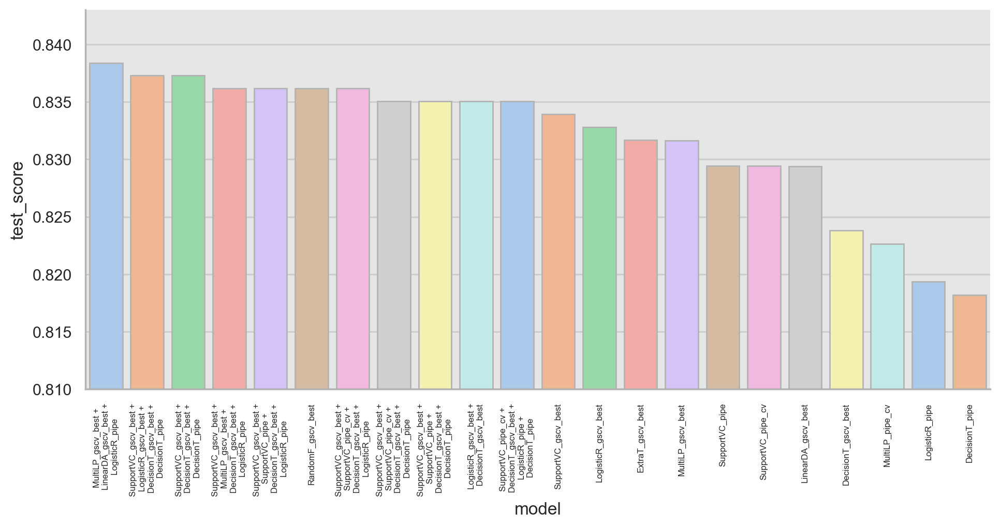

In [83]:
total_compare_df = pickle.load(open("./build_model/total_compare_df.pkl", "rb"))

g = sns.catplot(
    data=total_compare_df,
    x="model",
    y="test_score",
    height=5,
    aspect=2,
    palette="pastel",
    edgecolor=".7",
    kind="bar"
)
g.set(ylim=(0.810, 0.843))
g.set_xticklabels(labels=total_compare_df["model"], rotation=90, fontsize=6, ha="center") ;

In [86]:
from sklearn.ensemble import AdaBoostClassifier

### AdaBoost 기본 모델 pipe line 실험

In [88]:
clf_feature_preprocessor = ColumnTransformer(
    transformers=[
        ("cat_transformer", cat_transformer["onehot"], cat_features),
        ("num_transformer", num_transformer, num_features)
    ], remainder="passthrough"
)

clf_feature_tech = Pipeline(
    steps=[
        ("feature_interaction", PolynomialFeatures(degree=2, interaction_only=True, include_bias=False)),
        ("feature_select", VarianceThreshold())
    ]
)

clf_feature_engineering = Pipeline(
    steps=[
        ("preprocessor", clf_feature_preprocessor),
        ("feature_tech", clf_feature_tech)
    ]
)

ada_pipe = Pipeline(
    steps=[
        ("engineering", clf_feature_engineering),
        ("model", AdaBoostClassifier(n_estimators=300))
    ]
)

ada_pipe

Pipeline(steps=[('engineering',
                 Pipeline(steps=[('preprocessor',
                                  ColumnTransformer(remainder='passthrough',
                                                    transformers=[('cat_transformer',
                                                                   OneHotEncoder(),
                                                                   ['generation',
                                                                    'Pclass',
                                                                    'title_name',
                                                                    'Sex',
                                                                    'Embarked']),
                                                                  ('num_transformer',
                                                                   Pipeline(steps=[('scaler',
                                                                                    StandardScaler())]),
                                                                   ['Age',
                                                                    'Fare',
                                                                    'SibSp',
                                                                    'Parch'])])),
                                 ('feature_tech',
                                  Pipeline(steps=[('feature_interaction',
                                                   PolynomialFeatures(include_bias=False,
                                                                      interaction_only=True)),
                                                  ('feature_select',
                                                   VarianceThreshold())]))])),
                ('model', AdaBoostClassifier(n_estimators=300))])

In [89]:
%%time

ada_pipe_metircs, ada_pipe_accs = get_cv_result(X, y_enc, [ada_pipe], ["AdaB_pipe"])

CPU times: total: 11.1 s
Wall time: 11.3 s


In [90]:
ada_pipe_metircs

,train_score,test_score,pre_score,recall_score,f1_score
model,,,,,
AdaB_pipe,0.946127,0.789009,0.74697,0.68911,0.715295


### GridSearchCV를 사용한 ada_pipe 하이퍼 파라미터 튜닝 - (1)
- weak estimator로 개별 모델 중 DecisionT_gscv_best 모델을 사용
   - ada_pipe에 preprocessor, feature inter action, feature select가 있으므로 개별 모델은 pipe가 아닌 모델 객체를 사용

In [102]:
%%time

# DecisionTree 개별 모형 사용
weak_estimator = pickle.load(open("./build_model/DecisionT_gscv_best.pkl", "rb"))
ada_params = {
    "model__estimator": [weak_estimator["model"]],
    "model__n_estimators": [i for i in range(1, 300)],
    "model__algorithm": ["SAMME"]
}

cv = KFold(n_splits=5, shuffle=True, random_state=50)
ada_gscv_1 = GridSearchCV(estimator=ada_pipe, param_grid=ada_params, cv=cv, scoring="accuracy", return_train_score=True, n_jobs=2)
ada_gscv_1.fit(X, y_enc)

CPU times: total: 1 s
Wall time: 11min 52s


GridSearchCV(cv=KFold(n_splits=5, random_state=50, shuffle=True),
             estimator=Pipeline(steps=[('engineering',
                                        Pipeline(steps=[('preprocessor',
                                                         ColumnTransformer(remainder='passthrough',
                                                                           transformers=[('cat_transformer',
                                                                                          OneHotEncoder(),
                                                                                          ['generation',
                                                                                           'Pclass',
                                                                                           'title_name',
                                                                                           'Sex',
                                                                                           'Embarked']),
                                                                                         ('num_transformer',
                                                                                          Pipeline(steps=[('scaler',
                                                                                                           StandardScaler())]),
                                                                                          ['A...
                                        AdaBoostClassifier(n_estimators=300))]),
             n_jobs=2,
             param_grid={'model__algorithm': ['SAMME'],
                         'model__estimator': [DecisionTreeClassifier(criterion='log_loss',
                                                                     max_depth=6,
                                                                     min_samples_leaf=2,
                                                                     min_samples_split=30,
                                                                     splitter='random')],
                         'model__n_estimators': [1, 2, 3, 4, 5, 6, 7, 8, 9, 10,
                                                 11, 12, 13, 14, 15, 16, 17, 18,
                                                 19, 20, 21, 22, 23, 24, 25, 26,
                                                 27, 28, 29, 30, ...]},
             return_train_score=True, scoring='accuracy')

In [103]:
result_ada_gscv_1 = pd.DataFrame(ada_gscv_1.cv_results_).sort_values("rank_test_score")
cols = list(result_ada_gscv_1.filter(regex="^param_model").columns) + ["mean_fit_time", "mean_test_score", "mean_train_score", "std_test_score", "rank_test_score"]
result_ada_gscv_1[cols][:10].style.applymap(draw_color_cell, color="#ffd700", subset=(result_ada_gscv_1.index[0]))

,param_model__algorithm,param_model__estimator,param_model__n_estimators,mean_fit_time,mean_test_score,mean_train_score,std_test_score,rank_test_score
6,SAMME,"DecisionTreeClassifier(criterion='log_loss', max_depth=6, min_samples_leaf=2, min_samples_split=30, splitter='random')",7,0.050005,0.833902,0.862793,0.035419,1
12,SAMME,"DecisionTreeClassifier(criterion='log_loss', max_depth=6, min_samples_leaf=2, min_samples_split=30, splitter='random')",13,0.086233,0.831687,0.868691,0.036549,2
33,SAMME,"DecisionTreeClassifier(criterion='log_loss', max_depth=6, min_samples_leaf=2, min_samples_split=30, splitter='random')",34,0.200605,0.831674,0.890574,0.031831,3
5,SAMME,"DecisionTreeClassifier(criterion='log_loss', max_depth=6, min_samples_leaf=2, min_samples_split=30, splitter='random')",6,0.044410,0.828297,0.857465,0.028240,4
27,SAMME,"DecisionTreeClassifier(criterion='log_loss', max_depth=6, min_samples_leaf=2, min_samples_split=30, splitter='random')",28,0.173005,0.828284,0.886081,0.045160,5
96,SAMME,"DecisionTreeClassifier(criterion='log_loss', max_depth=6, min_samples_leaf=2, min_samples_split=30, splitter='random')",97,0.569406,0.827161,0.923398,0.036126,6
70,SAMME,"DecisionTreeClassifier(criterion='log_loss', max_depth=6, min_samples_leaf=2, min_samples_split=30, splitter='random')",71,0.408206,0.827161,0.914987,0.033591,7
15,SAMME,"DecisionTreeClassifier(criterion='log_loss', max_depth=6, min_samples_leaf=2, min_samples_split=30, splitter='random')",16,0.100179,0.826050,0.878226,0.034200,8
7,SAMME,"DecisionTreeClassifier(criterion='log_loss', max_depth=6, min_samples_leaf=2, min_samples_split=30, splitter='random')",8,0.054814,0.826050,0.857182,0.036173,8
85,SAMME,"DecisionTreeClassifier(criterion='log_loss', max_depth=6, min_samples_leaf=2, min_samples_split=30, splitter='random')",86,0.533216,0.826044,0.919193,0.031548,10


### n_estimator의 증가에 따른 test score의 분포
- n_estimator가 커질 수록 test score는 점차 낮아지는 것을 알 수 있다. 

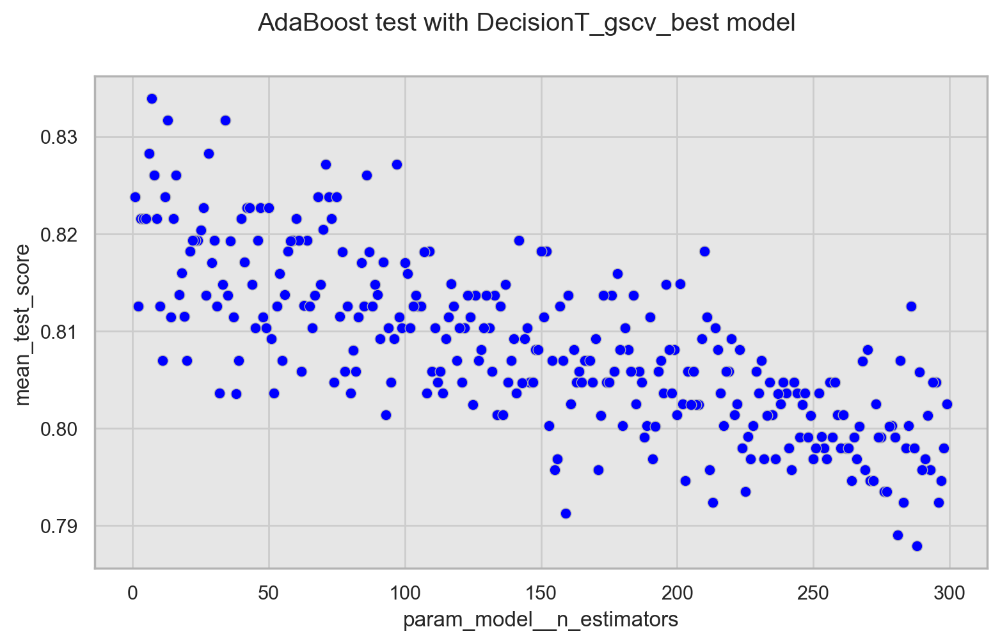

In [111]:
fig, axes = plt.subplots(figsize=(9, 5))
sns.scatterplot(
    data=result_ada_gscv_1,
    x="param_model__n_estimators",
    y="mean_test_score",
    color="blue",
    edgecolor=".7",
    ax=axes
)
fig.suptitle("AdaBoost test with DecisionT_gscv_best model") ;

### GridSearchCV를 사용한 ada_pipe 하이퍼 파라미터 튜닝 - (2)
- weak estimator로 개별 모델 중 RandomForest 모델인 rf_gscv_best 사용

In [114]:
%%time

# RandomForest 개별 모형 사용
weak_estimator = pickle.load(open("./build_model/rf_gscv_best.pkl", "rb"))
ada_params = {
    "model__estimator": [weak_estimator["model"]],
    "model__n_estimators": [i for i in range(1, 300)],
    "model__algorithm": ["SAMME"]
}

cv = KFold(n_splits=5, shuffle=True, random_state=50)
ada_gscv_2 = GridSearchCV(estimator=ada_pipe, param_grid=ada_params, cv=cv, scoring="accuracy", return_train_score=True, n_jobs=2)
ada_gscv_2.fit(X, y_enc)

CPU times: total: 54.5 s
Wall time: 2h 24min 45s


GridSearchCV(cv=KFold(n_splits=5, random_state=50, shuffle=True),
             estimator=Pipeline(steps=[('engineering',
                                        Pipeline(steps=[('preprocessor',
                                                         ColumnTransformer(remainder='passthrough',
                                                                           transformers=[('cat_transformer',
                                                                                          OneHotEncoder(),
                                                                                          ['generation',
                                                                                           'Pclass',
                                                                                           'title_name',
                                                                                           'Sex',
                                                                                           'Embarked']),
                                                                                         ('num_transformer',
                                                                                          Pipeline(steps=[('scaler',
                                                                                                           StandardScaler())]),
                                                                                          ['A...
                                        AdaBoostClassifier(n_estimators=300))]),
             n_jobs=2,
             param_grid={'model__algorithm': ['SAMME'],
                         'model__estimator': [RandomForestClassifier(max_depth=7,
                                                                     min_samples_leaf=4,
                                                                     min_samples_split=3,
                                                                     n_estimators=200)],
                         'model__n_estimators': [1, 2, 3, 4, 5, 6, 7, 8, 9, 10,
                                                 11, 12, 13, 14, 15, 16, 17, 18,
                                                 19, 20, 21, 22, 23, 24, 25, 26,
                                                 27, 28, 29, 30, ...]},
             return_train_score=True, scoring='accuracy')

In [115]:
result_ada_gscv_2 = pd.DataFrame(ada_gscv_2.cv_results_).sort_values("rank_test_score")
cols = list(result_ada_gscv_2.filter(regex="^param_model").columns) + ["mean_fit_time", "mean_test_score", "mean_train_score", "std_test_score", "rank_test_score"]
result_ada_gscv_2[cols][:10].style.applymap(draw_color_cell, color="#ffd700", subset=(result_ada_gscv_2.index[0]))

,param_model__algorithm,param_model__estimator,param_model__n_estimators,mean_fit_time,mean_test_score,mean_train_score,std_test_score,rank_test_score
1,SAMME,"RandomForestClassifier(max_depth=7, min_samples_leaf=4, min_samples_split=3, n_estimators=200)",2,0.786029,0.832804,0.869810,0.036304,1
0,SAMME,"RandomForestClassifier(max_depth=7, min_samples_leaf=4, min_samples_split=3, n_estimators=200)",1,0.423201,0.828303,0.866724,0.031172,2
3,SAMME,"RandomForestClassifier(max_depth=7, min_samples_leaf=4, min_samples_split=3, n_estimators=200)",4,1.607836,0.821574,0.909653,0.036334,3
2,SAMME,"RandomForestClassifier(max_depth=7, min_samples_leaf=4, min_samples_split=3, n_estimators=200)",3,1.183831,0.815950,0.919753,0.034991,4
5,SAMME,"RandomForestClassifier(max_depth=7, min_samples_leaf=4, min_samples_split=3, n_estimators=200)",6,2.422423,0.812592,0.935745,0.034057,5
8,SAMME,"RandomForestClassifier(max_depth=7, min_samples_leaf=4, min_samples_split=3, n_estimators=200)",9,3.674436,0.805850,0.962681,0.036946,6
57,SAMME,"RandomForestClassifier(max_depth=7, min_samples_leaf=4, min_samples_split=3, n_estimators=200)",58,10.823620,0.803609,0.968294,0.030019,7
213,SAMME,"RandomForestClassifier(max_depth=7, min_samples_leaf=4, min_samples_split=3, n_estimators=200)",214,10.544815,0.803603,0.968294,0.035282,8
62,SAMME,"RandomForestClassifier(max_depth=7, min_samples_leaf=4, min_samples_split=3, n_estimators=200)",63,10.119223,0.802479,0.968294,0.030574,9
202,SAMME,"RandomForestClassifier(max_depth=7, min_samples_leaf=4, min_samples_split=3, n_estimators=200)",203,11.194747,0.801362,0.968294,0.025638,10


### n_estimator의 증가에 따른 test score의 분포
- n_estimator의 크기와 test score는 상관관계가 없는 것으로 보인다. n_estimator=50 이하에서 높은 test score 나왔다.

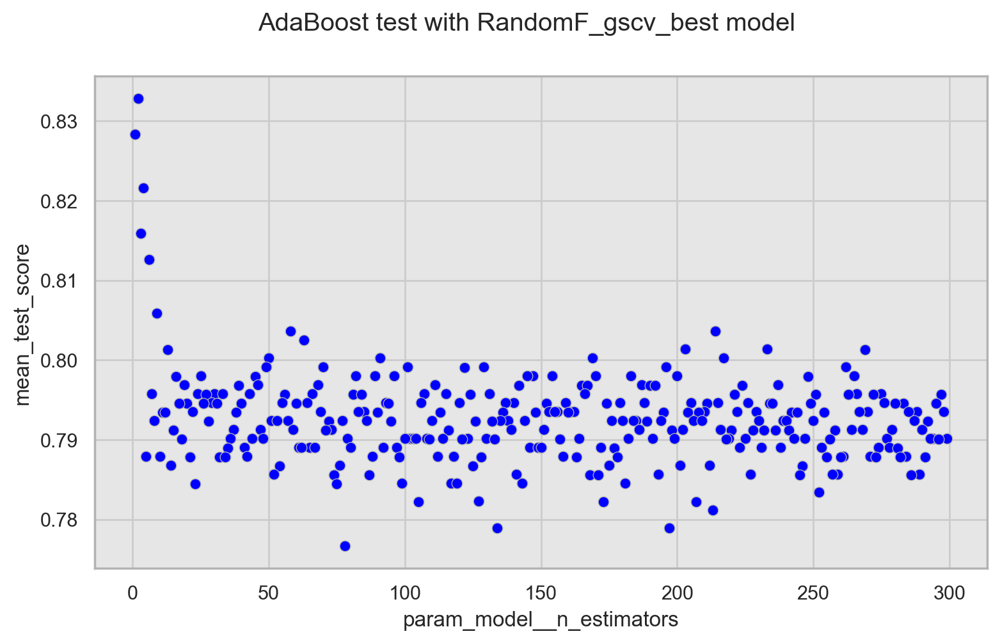

In [117]:
fig, axes = plt.subplots(figsize=(9, 5))
sns.scatterplot(
    data=result_ada_gscv_2,
    x="param_model__n_estimators",
    y="mean_test_score",
    color="blue",
    edgecolor=".7",
    ax=axes
)
fig.suptitle("AdaBoost test with RandomF_gscv_best model") ;

### GridSearchCV를 사용한 ada_pipe 하이퍼 파라미터 튜닝 - (3)
- weak estimator로 VotingClassifier로 모형 결합한 모델 중 선택
   - MLPClassifier()가 사용된 Voting 모델은 AdaBoost 모델에 사용할 수 없으므로 가장 성능이 좋은 첫번쨰 모델 제외
   - Voting 모델 중 MLP 모델이 사용되지 않은 두 번째 모델 사용
- 앞의 AdaBoost DT, RF 실험에서 n_estimator가 크다고 성능이 좋은 것은 아니라는 것을 알 수 있었다.
- 현재 실험에서 하이퍼 파라미터인 n_estimator가 크다고 성능이 좋아지는 것이 아니므로 범위를 1~100으로 설정

In [128]:
from sklearn.ensemble import VotingClassifier

In [142]:
%%time

weak_estimator = VotingClassifier([
    (load_top_10_models["model"][0], load_top_10_models["estimator"][0]["model"]),
    (load_top_10_models["model"][1], load_top_10_models["estimator"][1]["model"]),
    (load_top_10_models["model"][6], load_top_10_models["estimator"][6]["model"]),
    (load_top_10_models["model"][9], load_top_10_models["estimator"][9]["model"]),
], voting="hard")

ada_params = {
    "model__estimator": [weak_estimator],
    "model__n_estimators": [i for i in range(1, 100)],
    "model__algorithm": ["SAMME"]
}

cv = KFold(n_splits=5, shuffle=True, random_state=50)
ada_gscv_3 = GridSearchCV(estimator=ada_pipe, param_grid=ada_params, cv=cv, scoring="accuracy", return_train_score=True, n_jobs=2)
ada_gscv_3.fit(X, y_enc)

CPU times: total: 31 s
Wall time: 59min 18s


GridSearchCV(cv=KFold(n_splits=5, random_state=50, shuffle=True),
             estimator=Pipeline(steps=[('engineering',
                                        Pipeline(steps=[('preprocessor',
                                                         ColumnTransformer(remainder='passthrough',
                                                                           transformers=[('cat_transformer',
                                                                                          OneHotEncoder(),
                                                                                          ['generation',
                                                                                           'Pclass',
                                                                                           'title_name',
                                                                                           'Sex',
                                                                                           'Embarked']),
                                                                                         ('num_transformer',
                                                                                          Pipeline(steps=[('scaler',
                                                                                                           StandardScaler())]),
                                                                                          ['A...
                                                                           ('DecisionT_gscv_best',
                                                                            DecisionTreeClassifier(criterion='log_loss',
                                                                                                   max_depth=6,
                                                                                                   min_samples_leaf=2,
                                                                                                   min_samples_split=30,
                                                                                                   splitter='random')),
                                                                           ('DecisionT_pipe',
                                                                            DecisionTreeClassifier(max_depth=3))])],
                         'model__n_estimators': [1, 2, 3, 4, 5, 6, 7, 8, 9, 10,
                                                 11, 12, 13, 14, 15, 16, 17, 18,
                                                 19, 20, 21, 22, 23, 24, 25, 26,
                                                 27, 28, 29, 30, ...]},
             return_train_score=True, scoring='accuracy')

In [143]:
result_ada_gscv_3 = pd.DataFrame(ada_gscv_3.cv_results_).sort_values("rank_test_score")
cols = list(result_ada_gscv_3.filter(regex="^param_model").columns) + ["mean_fit_time", "mean_test_score", "mean_train_score", "std_test_score", "rank_test_score"]
result_ada_gscv_3[cols][:10].style.applymap(draw_color_cell, color="#ffd700", subset=(result_ada_gscv_3.index[0]))

,param_model__algorithm,param_model__estimator,param_model__n_estimators,mean_fit_time,mean_test_score,mean_train_score,std_test_score,rank_test_score
67,SAMME,"VotingClassifier(estimators=[('SupportVC_gscv_best', SVC(C=0.23357214690901226, coef0=0.01, degree=1, gamma=0.1, kernel='poly')), ('LogisticR_gscv_best', LogisticRegression(C=0.029763514416313176, max_iter=8000)), ('DecisionT_gscv_best', DecisionTreeClassifier(criterion='log_loss', max_depth=6, min_samples_leaf=2, min_samples_split=30, splitter='random')), ('DecisionT_pipe', DecisionTreeClassifier(max_depth=3))])",68,13.752801,0.833921,0.881032,0.039049,1
38,SAMME,"VotingClassifier(estimators=[('SupportVC_gscv_best', SVC(C=0.23357214690901226, coef0=0.01, degree=1, gamma=0.1, kernel='poly')), ('LogisticR_gscv_best', LogisticRegression(C=0.029763514416313176, max_iter=8000)), ('DecisionT_gscv_best', DecisionTreeClassifier(criterion='log_loss', max_depth=6, min_samples_leaf=2, min_samples_split=30, splitter='random')), ('DecisionT_pipe', DecisionTreeClassifier(max_depth=3))])",39,8.042600,0.831649,0.867005,0.038435,2
97,SAMME,"VotingClassifier(estimators=[('SupportVC_gscv_best', SVC(C=0.23357214690901226, coef0=0.01, degree=1, gamma=0.1, kernel='poly')), ('LogisticR_gscv_best', LogisticRegression(C=0.029763514416313176, max_iter=8000)), ('DecisionT_gscv_best', DecisionTreeClassifier(criterion='log_loss', max_depth=6, min_samples_leaf=2, min_samples_split=30, splitter='random')), ('DecisionT_pipe', DecisionTreeClassifier(max_depth=3))])",98,15.028599,0.831636,0.879068,0.029369,3
44,SAMME,"VotingClassifier(estimators=[('SupportVC_gscv_best', SVC(C=0.23357214690901226, coef0=0.01, degree=1, gamma=0.1, kernel='poly')), ('LogisticR_gscv_best', LogisticRegression(C=0.029763514416313176, max_iter=8000)), ('DecisionT_gscv_best', DecisionTreeClassifier(criterion='log_loss', max_depth=6, min_samples_leaf=2, min_samples_split=30, splitter='random')), ('DecisionT_pipe', DecisionTreeClassifier(max_depth=3))])",45,8.676000,0.830550,0.872336,0.031519,4
84,SAMME,"VotingClassifier(estimators=[('SupportVC_gscv_best', SVC(C=0.23357214690901226, coef0=0.01, degree=1, gamma=0.1, kernel='poly')), ('LogisticR_gscv_best', LogisticRegression(C=0.029763514416313176, max_iter=8000)), ('DecisionT_gscv_best', DecisionTreeClassifier(criterion='log_loss', max_depth=6, min_samples_leaf=2, min_samples_split=30, splitter='random')), ('DecisionT_pipe', DecisionTreeClassifier(max_depth=3))])",85,15.407405,0.829433,0.884683,0.032703,5
70,SAMME,"VotingClassifier(estimators=[('SupportVC_gscv_best', SVC(C=0.23357214690901226, coef0=0.01, degree=1, gamma=0.1, kernel='poly')), ('LogisticR_gscv_best', LogisticRegression(C=0.029763514416313176, max_iter=8000)), ('DecisionT_gscv_best', DecisionTreeClassifier(criterion='log_loss', max_depth=6, min_samples_leaf=2, min_samples_split=30, splitter='random')), ('DecisionT_pipe', DecisionTreeClassifier(max_depth=3))])",71,14.414797,0.829427,0.881032,0.026809,6
89,SAMME,"VotingClassifier(estimators=[('SupportVC_gscv_best', SVC(C=0.23357214690901226, coef0=0.01, degree=1, gamma=0.1, kernel='poly')), ('LogisticR_gscv_best', LogisticRegression(C=0.029763514416313176, max_iter=8000)), ('DecisionT_gscv_best', DecisionTreeClassifier(criterion='log_loss', max_depth=6, min_samples_leaf=2, min_samples_split=30, splitter='random')), ('DecisionT_pipe', DecisionTreeClassifier(max_depth=3))])",90,16.700199,0.829414,0.891696,0.023656,7
93,SAMME,"VotingClassifier(estimators=[('SupportVC_gscv_best', SVC(C=0.23357214690901226, coef0=0.01, degree=1, gamma=0.1, kernel='poly')), ('LogisticR_gscv_best', LogisticRegression(C=0.029763514416313176, max_iter=8000)), ('DecisionT_gscv_best', DecisionTreeClassifier(criterion='log_loss', max_depth=6, min_samples_leaf=2, min_samples_split=30, splitter='random')), ('DecisionT_pipe', DecisionTreeClassifier(max_depth=3))])",94,18.019999,0.829408,0.894503,0.034542,8
72,SAMME,"VotingClassifier(estimators=[('SupportVC_gscv_best', SVC(C=0.23357214690901226, c

### n_estimator의 증가에 따른 test score의 분포
- n_estimator가 커질 수록 test score가 다소 커지는 모습을 볼 수 있다. 

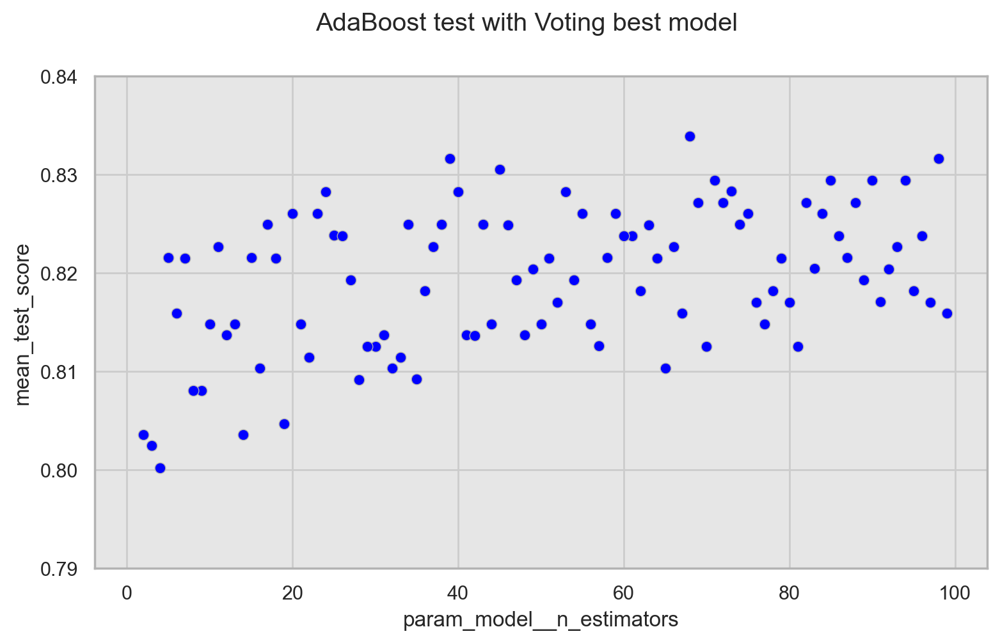

In [197]:
fig, axes = plt.subplots(figsize=(9, 5))
sns.scatterplot(
    data=result_ada_gscv_3,
    x="param_model__n_estimators",
    y="mean_test_score",
    color="blue",
    edgecolor=".7",
    ax=axes
)
axes.set(ylim=(0.790, 0.840))
fig.suptitle("AdaBoost test with Voting best model") ;

In [181]:
ada_gscv_1_best = pd.DataFrame(ada_gscv_1.best_params_, index=[0]).assign(model="ada_gscv_1", test_score=ada_gscv_1.best_score_)
ada_gscv_2_best = pd.DataFrame(ada_gscv_2.best_params_).iloc[[0]].assign(model="ada_gscv_2", test_score=ada_gscv_2.best_score_)
ada_gscv_3_best = pd.DataFrame(ada_gscv_3.best_params_, index=[0]).assign(model="ada_gscv_3", test_score=ada_gscv_3.best_score_)
ada_gscv_best_compare = pd.concat([ada_gscv_1_best, ada_gscv_2_best, ada_gscv_3_best], axis=0).reset_index(drop=True)
ada_gscv_best_compare\
    .fillna(0)\
    .sort_values("test_score", ascending=False)\
    .reset_index(drop=True)\
    .style.applymap(draw_color_cell, color="#ffd700", subset=(ada_gscv_best_compare.index[0]))

,model__algorithm,model__estimator,model__n_estimators,model,test_score
0,SAMME,"VotingClassifier(estimators=[('SupportVC_gscv_best', SVC(C=0.23357214690901226, coef0=0.01, degree=1, gamma=0.1, kernel='poly')), ('LogisticR_gscv_best', LogisticRegression(C=0.029763514416313176, max_iter=8000)), ('DecisionT_gscv_best', DecisionTreeClassifier(criterion='log_loss', max_depth=6, min_samples_leaf=2, min_samples_split=30, splitter='random')), ('DecisionT_pipe', DecisionTreeClassifier(max_depth=3))])",68,ada_gscv_3,0.833921
1,SAMME,"DecisionTreeClassifier(criterion='log_loss', max_depth=6, min_samples_leaf=2, min_samples_split=30, splitter='random')",7,ada_gscv_1,0.833902
2,SAMME,"DecisionTreeClassifier(max_depth=7, max_features='sqrt', min_samples_leaf=4, min_samples_split=3, random_state=636949351)",2,ada_gscv_2,0.832804


### GridSearchCV로 실험한 AdaBoost 모델 중 best 모델을 사용하여 cv 테스트
- AdaBoost 실험의 모델은 전체 모델링 성능에 비해 낮은 편이다.

In [182]:
%%time

ada_gscv_best_model = ada_gscv_3.best_estimator_
ada_gscv_best_metrics, ada_gscv_best_accs = get_cv_result(X, y_enc, [ada_gscv_best_model], ["AdaB_gscv_best"])

CPU times: total: 6min 29s
Wall time: 1min 35s


In [184]:
ada_gscv_best_df = pd.concat([ada_gscv_best_metrics, pd.DataFrame(ada_gscv_best_accs[0][1], columns=["AdaB_gscv_best"]).T], axis=1)
ada_gscv_best_df["std"] = ada_gscv_best_df[[0, 1, 2, 3, 4]].std(axis=1)
ada_gscv_best_df = ada_gscv_best_df.reset_index().rename(columns={"index": "model"}).assign(train_type="AdaB")
ada_gscv_best_df

,model,train_score,test_score,pre_score,recall_score,f1_score,0,1,2,3,4,std,train_type
0,AdaB_gscv_best,0.878231,0.819289,0.791804,0.702875,0.743605,0.832402,0.831461,0.842697,0.792135,0.797753,0.022744,AdaB


### 전체 모델링 리스트에 추가 및 모델 저장
- total_compare_df : 개별 모델 top 10 + Voting 모델 top 10 + RandomForest 모델 best 1 + ExtraTrees 모델 best 1 + AdaBoost 모델 best 1

In [189]:
total_compare_df = pd.concat([total_compare_df, ada_gscv_best_df], axis=0).sort_values("test_score", ascending=False)
total_compare_df = total_compare_df.reset_index(drop=True)
total_compare_df

,model,train_score,test_score,pre_score,recall_score,f1_score,0,1,2,3,4,std,train_type,comb
0,MultiLP_gscv_best +\n LinearDA_gscv_best +\n L...,0.845959,0.838378,0.815293,0.723894,0.764736,0.843575,0.859551,0.853933,0.780899,0.853933,0.032646,hard,"(2, 5, 8)"
1,SupportVC_gscv_best +\n LogisticR_gscv_best +\...,0.841191,0.837298,0.833453,0.714597,0.768936,0.804469,0.859551,0.876404,0.775281,0.870787,0.044916,hard,"(0, 1, 6, 9)"
2,SupportVC_gscv_best +\n DecisionT_gscv_best +\...,0.838104,0.837280,0.817959,0.731745,0.771934,0.821229,0.865169,0.859551,0.775281,0.865169,0.039221,hard,"(0, 6, 9)"
3,SupportVC_gscv_best +\n MultiLP_gscv_best +\n ...,0.850730,0.836168,0.827785,0.698618,0.757384,0.810056,0.859551,0.870787,0.792135,0.848315,0.033591,hard,"(0, 2, 6, 8)"
4,SupportVC_gscv_best +\n SupportVC_pipe +\n Dec...,0.852413,0.836162,0.835943,0.718505,0.771723,0.815642,0.859551,0.870787,0.769663,0.865169,0.043100,soft,"(0, 3, 6, 8)"
5,RandomF_gscv_best,0.870933,0.836162,0.836357,0.706492,0.764413,0.815642,0.859551,0.859551,0.780899,0.865169,0.036778,RF,NaN
6,SupportVC_gscv_best +\n SupportVC_pipe_cv +\n ...,0.855219,0.836156,0.824567,0.718167,0.766525,0.821229,0.870787,0.870787,0.769663,0.848315,0.042398,soft,"(0, 4, 6, 8)"
7,SupportVC_gscv_best +\n SupportVC_pipe_cv +\n ...,0.842875,0.835051,0.830033,0.722961,0.772474,0.804469,0.859551,0.865169,0.775281,0.870787,0.042697,hard,"(0, 4, 6, 9)"
8,SupportVC_gscv_best +\n SupportVC_pipe +\n Dec...,0.843155,0.835045,0.830483,0.711656,0.766016,0.810056,0.848315,0.870787,0.775281,0.870787,0.041615,hard,"(0, 3, 6, 9)"
9,LogisticR_gscv_best +\n DecisionT_gscv_best,0.845681,0.835039,0.867695,0.662228,0.749969,0.815642,0.865169,0.876404,0.780899,0.837079,0.038505,hard,"(1, 6)"


In [191]:
dir_path = "./build_model"
save_model(dir_path, ada_gscv_best_model, "AdaB_gscv_best")

AdaB_gscv_best save success.


In [194]:
pickle.dump(total_compare_df, open("./build_model/total_compare_df", "wb"))

### Ensemble (5) : XGBoosting
- XGBoost : Extreme Gradient Boosting 의 약자
   - "Greedy Function Approximation: A Gradient Boosting Machine", by Friedman. 논문에서 유래됨
   - Gradient Boost Tree에 기반한다.
   - 지도학습의 수학적 원리에 기반한다. : y_i의 예측값은 j번째 가중치와 xij 곱의 합
- objective function(목적함수) = training loss(훈련손실) + regularization(정규화)
   - "The task of training the model amounts to finding the best parameters 𝜃 that best fit the training data 𝑥 𝑖 and labels 𝑦 𝑖 ." : 모델을 훈련하는 작업은 훈련데이터 x_i와 라벨데이터 y_i에 가장 적합한 최상의 매개변수를 찾는 것과 같다.
   - 훈련손실은 일반적으로 평균잔차제곱이나 로지스틱 손실값을 사용한다.
   - 정규화는 모델의 복잡성을 제어하고 과적합을 방지하는데 도움을 준다.
   - 편향-분산 tradeoff에 의해 훈련손실과 정규화 값의 tradeoff가 가능하다.
   - 여러 그레디언트 부스트 tree의 결합으로 이루어진다.
- 훈련 한번에 하나의 나무 모형을 추가한다. (additive tree learning)
   - 대부분의 경우 잘 작동한다
   - 단점은 새롭게 추가되는 나무가 특정한 차원의 feature만 학습하므로 퇴화한 모형이 될 수 있다. 
   - 목적함수의 훈련손실에 t번째 예측값 식을 대입한 후 MSE 값으로 계산하여 정리한다. 테일러 확장을 적용하여 식을 정리하면 최적화 대상인 목적함수가 된다.
   - 이렇게 성립한 목적함수는 테일러 확장으로 추가한 g_i와 h_i 값에 의존하게 된다.

#### XGBoost의 여러가지 기능들
- xgboost의 모델 클래스
    - 모델의 형태는 크게 regressor, classifier, ranker 3가지로 구분 된다.
       - 기본형, Dask용, PySpark용이 따로 있다. 
    - classifier
       - xgboost.XGBClassifier()
       - xgboost.XGBRFClassifier()
- callback
    - callback 함수를 사용하여 조기 중지, 체크 포인트 등의 기능을 사용할 수 있다.
       - xgb.callback.EvaluationMoinitor()
       - xgb.callback.EarlyStopping()
       - xgb.callback.LearningRateScheduler()
       - xgb.callback.TrainingCheckPoint()
    - xgb.train()의 파라미터로 callbacks=[]에서 설정할 수 있다.
       - early_stop = xgb.callback.EarlyStopping()
       - xgb.train(callbacks=[early_stop])
- DASK
    - python 기반으로 구축된 병렬 컴퓨팅 라이브러리
    - DASK 를 사용하면 분산된 작업자를 쉽게 관리할 수 있으며 대규모 분산 데이터 과학 워크플로를 처리하는데 탁월하다.
    - 기존 class들과 같은 Dask 용 class 들이 따로 있음
       - DaskDMatrix()
       - DaskXGBClassifier()
       - DaskXGBRFClassifier()
       - 등등

In [25]:
total_compare_df = pickle.load(open("./build_model/total_compare_df.pkl", "rb"))
total_compare_df.head(2)

,model,train_score,test_score,pre_score,recall_score,f1_score,0,1,2,3,4,std,train_type,comb
0,MultiLP_gscv_best +\n LinearDA_gscv_best +\n L...,0.845959,0.838378,0.815293,0.723894,0.764736,0.843575,0.859551,0.853933,0.780899,0.853933,0.032646,hard,"(2, 5, 8)"
1,SupportVC_gscv_best +\n LogisticR_gscv_best +\...,0.841191,0.837298,0.833453,0.714597,0.768936,0.804469,0.859551,0.876404,0.775281,0.870787,0.044916,hard,"(0, 1, 6, 9)"


In [28]:
load_top_10_models = pickle.load(open("./build_model/load_top_10_models.pkl", "rb"))
load_top_10_models.head(2)

,model,estimator
0,SupportVC_gscv_best,"((ColumnTransformer(remainder='passthrough',\n..."
1,LogisticR_gscv_best,"((ColumnTransformer(remainder='passthrough',\n..."


In [29]:
import xgboost as xgb

### XGBoost의 sklearn API 모델이 XGBClassifier 기본 실험

In [62]:
bst = xgb.XGBClassifier(
    n_estimators=100, 
    max_bin=50, 
    max_depth=3, 
    tree_method="hist", 
    grow_policy="lossguide",
    verbosity=2,
    enable_categorical=True,
    random_state=50,
)
bst.fit(X, y_enc)

XGBClassifier(base_score=None, booster=None, callbacks=None,
              colsample_bylevel=None, colsample_bynode=None,
              colsample_bytree=None, device=None, early_stopping_rounds=None,
              enable_categorical=True, eval_metric=None, feature_types=None,
              gamma=None, grow_policy='lossguide', importance_type=None,
              interaction_constraints=None, learning_rate=None, max_bin=50,
              max_cat_threshold=None, max_cat_to_onehot=None,
              max_delta_step=None, max_depth=3, max_leaves=None,
              min_child_weight=None, missing=nan, monotone_constraints=None,
              multi_strategy=None, n_estimators=100, n_jobs=None,
              num_parallel_tree=None, random_state=50, ...)

In [63]:
pred = bst.predict(X)
print(f"xgboost acc : {accuracy_score(y, pred)}")

xgboost acc : 0.9012345679012346


In [64]:
bst_metrics, bst_accs = get_cv_result(X, y_enc, [bst], ["XGBoost_cv"])

In [65]:
bst_metrics

,train_score,test_score,pre_score,recall_score,f1_score
model,,,,,
XGBoost_cv,0.910496,0.824933,0.801718,0.727032,0.76153


### cross_validate + model_pipe=XGBoost
- pipe의 feature tech에서 feature의 변형을 xgboost 모델의 input으로 사용할 수 있는지에 대한 실험

In [75]:
clf_feature_preprocessor = ColumnTransformer(
    transformers=[
        ("cat_transformer", cat_transformer["onehot"], cat_features),
        ("num_transformer", num_transformer, num_features)
    ], remainder="passthrough"
)

clf_feature_tech = Pipeline(
    steps=[
        ("feature_interaction", PolynomialFeatures(degree=2, interaction_only=True, include_bias=False)),
        ("feature_select", VarianceThreshold())
    ]
)

clf_feature_engineering = Pipeline(
    steps=[
        ("preprocessor", clf_feature_preprocessor),
        ("feature_tech", clf_feature_tech)
    ]
)

xgb_pipe = Pipeline(
    steps=[
        ("engineering", clf_feature_engineering),
        ("model", xgb.XGBClassifier())
    ]
)

xgb_pipe

Pipeline(steps=[('engineering',
                 Pipeline(steps=[('preprocessor',
                                  ColumnTransformer(remainder='passthrough',
                                                    transformers=[('cat_transformer',
                                                                   OneHotEncoder(),
                                                                   ['title_name',
                                                                    'generation',
                                                                    'Sex',
                                                                    'Pclass',
                                                                    'Embarked']),
                                                                  ('num_transformer',
                                                                   Pipeline(steps=[('scaler',
                                                                                    StandardScaler())]),
                                                                   ['Age',
                                                                    'Fare',
                                                                    'SibSp',
                                                                    'Parch'])])),
                                 ('feature_tech',
                                  Pipeline(steps=[('feature...
                               feature_types=None, gamma=None, grow_policy=None,
                               importance_type=None,
                               interaction_constraints=None, learning_rate=None,
                               max_bin=None, max_cat_threshold=None,
                               max_cat_to_onehot=None, max_delta_step=None,
                               max_depth=None, max_leaves=None,
                               min_child_weight=None, missing=nan,
                               monotone_constraints=None, multi_strategy=None,
                               n_estimators=None, n_jobs=None,
                               num_parallel_tree=None, random_state=None, ...))])

### XGBoost 모델의 parameter 설정

In [81]:
xgb_params = {
    "n_estimators": 100, 
    "max_bin": 50, 
    "max_depth": 3, 
    "tree_method": "hist", 
    #"grow_policy": "lossguide",
    #"verbosity": 2,
    "enable_categorical": True,
    "random_state": 50
}

xgb_pipe["model"].set_params(**xgb_params)

XGBClassifier(base_score=None, booster=None, callbacks=None,
              colsample_bylevel=None, colsample_bynode=None,
              colsample_bytree=None, device=None, early_stopping_rounds=None,
              enable_categorical=True, eval_metric=None, feature_types=None,
              gamma=None, grow_policy='lossguide', importance_type=None,
              interaction_constraints=None, learning_rate=None, max_bin=50,
              max_cat_threshold=None, max_cat_to_onehot=None,
              max_delta_step=None, max_depth=3, max_leaves=None,
              min_child_weight=None, missing=nan, monotone_constraints=None,
              multi_strategy=None, n_estimators=100, n_jobs=None,
              num_parallel_tree=None, random_state=50, ...)

In [83]:
%%time

xgb_pipe_metrics, xgb_pipe_accs = get_cv_result(
    X, y_enc, [xgb_pipe], ["XGBoost_pipe"])

CPU times: total: 15.7 s
Wall time: 1.4 s


In [84]:
xgb_pipe_metrics["std"] = xgb_pipe_accs[0][1].std()
xgb_pipe_metrics

,train_score,test_score,pre_score,recall_score,f1_score,std
model,,,,,,
XGBoost_pipe,0.935186,0.818185,0.785281,0.726666,0.753658,0.035443


### GridSearchCV를 사용한 xgb_pipe의 하이퍼 파라미터 튜닝 - (1)
- n_estimators의 증가에 따른 test score 변화 확인
- tree_method는 XGBoost의 tree를 구성하는 규칙
   - "hist"는 히스토그램 방식을 사용한 탐욕 알고리즘으로 fitting 속도가 빠르다.

In [96]:
%%time
xgb_pipe.set_params(model=xgb.XGBClassifier())
xgb_params = {
    "model__n_estimators": [i for i in range(1, 300)],
    "model__max_depth": [3],
    "model__tree_method": ["hist"]
}

cv = KFold(n_splits=5, shuffle=True, random_state=50)
xgb_gscv_1 = GridSearchCV(estimator=xgb_pipe, param_grid=xgb_params, cv=cv,
                         scoring="accuracy", return_train_score=True)
xgb_gscv_1.fit(X, y_enc)

CPU times: total: 1h 7min 35s
Wall time: 5min 57s


GridSearchCV(cv=KFold(n_splits=5, random_state=50, shuffle=True),
             estimator=Pipeline(steps=[('engineering',
                                        Pipeline(steps=[('preprocessor',
                                                         ColumnTransformer(remainder='passthrough',
                                                                           transformers=[('cat_transformer',
                                                                                          OneHotEncoder(),
                                                                                          ['title_name',
                                                                                           'generation',
                                                                                           'Sex',
                                                                                           'Pclass',
                                                                                           'Embarked']),
                                                                                         ('num_transformer',
                                                                                          Pipeline(steps=[('scaler',
                                                                                                           StandardScaler())]),
                                                                                          ['A...
                                                      missing=nan,
                                                      monotone_constraints=None,
                                                      multi_strategy=None,
                                                      n_estimators=None,
                                                      n_jobs=None,
                                                      num_parallel_tree=None,
                                                      random_state=None, ...))]),
             param_grid={'model__max_depth': [3],
                         'model__n_estimators': [1, 2, 3, 4, 5, 6, 7, 8, 9, 10,
                                                 11, 12, 13, 14, 15, 16, 17, 18,
                                                 19, 20, 21, 22, 23, 24, 25, 26,
                                                 27, 28, 29, 30, ...],
                         'model__tree_method': ['hist']},
             return_train_score=True, scoring='accuracy')

In [97]:
result_xgb_gscv_1 = pd.DataFrame(xgb_gscv_1.cv_results_).sort_values("rank_test_score")
cols = list(result_xgb_gscv_1.filter(regex="^param_model").columns) + ["mean_fit_time", "mean_test_score", "mean_train_score", "std_test_score", "rank_test_score"]
result_xgb_gscv_1[cols][:10].style.applymap(draw_color_cell, color="#ffd700", subset=(result_xgb_gscv_1.index[0]))

,param_model__max_depth,param_model__n_estimators,param_model__tree_method,mean_fit_time,mean_test_score,mean_train_score,std_test_score,rank_test_score
2,3,3,hist,0.044601,0.832798,0.840070,0.032491,1
21,3,22,hist,0.062000,0.830544,0.887206,0.034976,2
22,3,23,hist,0.063201,0.830544,0.888608,0.033689,2
15,3,16,hist,0.056002,0.829414,0.876544,0.032628,4
14,3,15,hist,0.055801,0.829414,0.876544,0.032628,4
20,3,21,hist,0.061401,0.828297,0.886364,0.036954,6
41,3,42,hist,0.083401,0.828291,0.911336,0.033210,7
24,3,25,hist,0.065602,0.827180,0.889730,0.033104,8
40,3,41,hist,0.082200,0.827173,0.910214,0.032952,9
31,3,32,hist,0.072200,0.827173,0.898711,0.036410,9


### n_estimator의 증가에 따른 test score 비교
- n_estimator가 커질 수록 test score가 점차 작아지는 것을 알 수 있다.

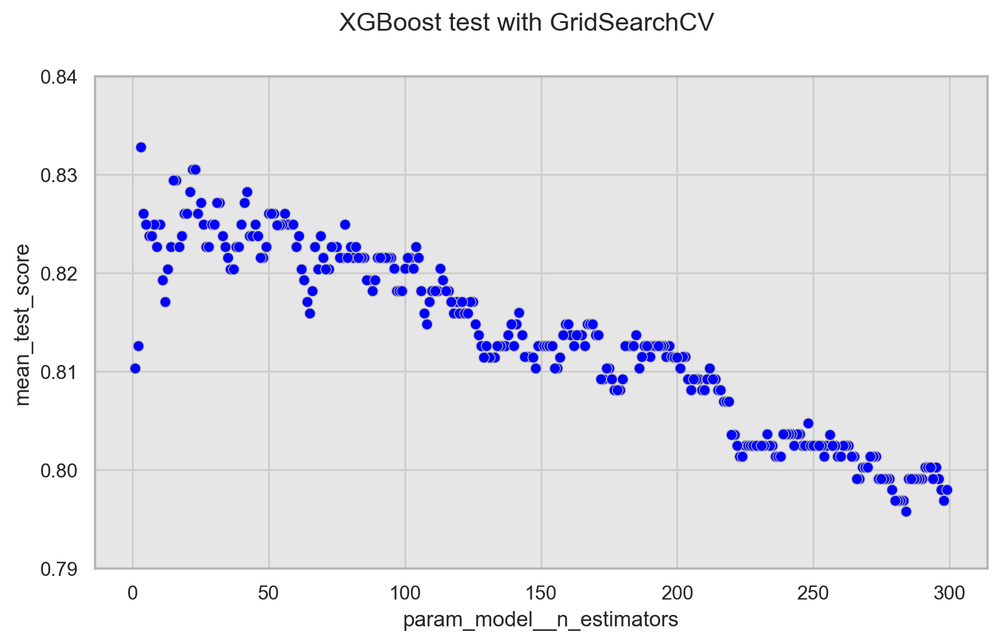

In [98]:
fig, axes = plt.subplots(figsize=(9, 5))
sns.scatterplot(
    data=result_xgb_gscv_1,
    x="param_model__n_estimators",
    y="mean_test_score",
    color="blue",
    edgecolor=".7",
    ax=axes
)
axes.set(ylim=(0.790, 0.840))
fig.suptitle("XGBoost test with GridSearchCV") ;

### GridSearchCV를 사용한 xgb_pipe의 하이퍼 파라미터 튜닝 - (2)
- max_depth 하이퍼 파라미터를 추가하여 tree의 깊이를 다르게 함

In [99]:
%%time
xgb_pipe.set_params(model=xgb.XGBClassifier())
xgb_params = {
    "model__n_estimators": [i for i in range(1, 300)],
    "model__max_depth": [i for i in range(2, 8)],
    "model__tree_method": ["hist"]
}

cv = KFold(n_splits=5, shuffle=True, random_state=50)
xgb_gscv_2 = GridSearchCV(estimator=xgb_pipe, param_grid=xgb_params, cv=cv,
                         scoring="accuracy", return_train_score=True)
xgb_gscv_2.fit(X, y_enc)

CPU times: total: 8h 23min 29s
Wall time: 44min 33s


GridSearchCV(cv=KFold(n_splits=5, random_state=50, shuffle=True),
             estimator=Pipeline(steps=[('engineering',
                                        Pipeline(steps=[('preprocessor',
                                                         ColumnTransformer(remainder='passthrough',
                                                                           transformers=[('cat_transformer',
                                                                                          OneHotEncoder(),
                                                                                          ['title_name',
                                                                                           'generation',
                                                                                           'Sex',
                                                                                           'Pclass',
                                                                                           'Embarked']),
                                                                                         ('num_transformer',
                                                                                          Pipeline(steps=[('scaler',
                                                                                                           StandardScaler())]),
                                                                                          ['A...
                                                      monotone_constraints=None,
                                                      multi_strategy=None,
                                                      n_estimators=None,
                                                      n_jobs=None,
                                                      num_parallel_tree=None,
                                                      random_state=None, ...))]),
             param_grid={'model__max_depth': [2, 3, 4, 5, 6, 7],
                         'model__n_estimators': [1, 2, 3, 4, 5, 6, 7, 8, 9, 10,
                                                 11, 12, 13, 14, 15, 16, 17, 18,
                                                 19, 20, 21, 22, 23, 24, 25, 26,
                                                 27, 28, 29, 30, ...],
                         'model__tree_method': ['hist']},
             return_train_score=True, scoring='accuracy')

### n_estimators와 max_depth의 변화에 따른 test score 비교
- 현재 데이터에서의 실험은 max_depth=2의 성능이 대체로 높은 것을 볼 수 있다. 

In [100]:
result_xgb_gscv_2 = pd.DataFrame(xgb_gscv_2.cv_results_).sort_values("rank_test_score")
cols = list(result_xgb_gscv_2.filter(regex="^param_model").columns) + ["mean_fit_time", "mean_test_score", "mean_train_score", "std_test_score", "rank_test_score"]
result_xgb_gscv_2[cols][:10].style.applymap(draw_color_cell, color="#ffd700", subset=(result_xgb_gscv_2.index[0]))

,param_model__max_depth,param_model__n_estimators,param_model__tree_method,mean_fit_time,mean_test_score,mean_train_score,std_test_score,rank_test_score
1199,6,4,hist,0.061001,0.835026,0.901796,0.024957,1
223,2,224,hist,0.218400,0.833909,0.942202,0.032985,2
1200,6,5,hist,0.063200,0.833902,0.904323,0.027607,3
301,3,3,hist,0.055200,0.832798,0.840070,0.032491,4
60,2,61,hist,0.089201,0.832791,0.894219,0.030321,5
225,2,226,hist,0.220000,0.832785,0.942482,0.034998,6
224,2,225,hist,0.217399,0.832785,0.942202,0.034998,6
219,2,220,hist,0.211000,0.831668,0.941079,0.033038,8
220,2,221,hist,0.211800,0.831668,0.941079,0.033038,8
221,2,222,hist,0.211601,0.831668,0.940798,0.033038,8


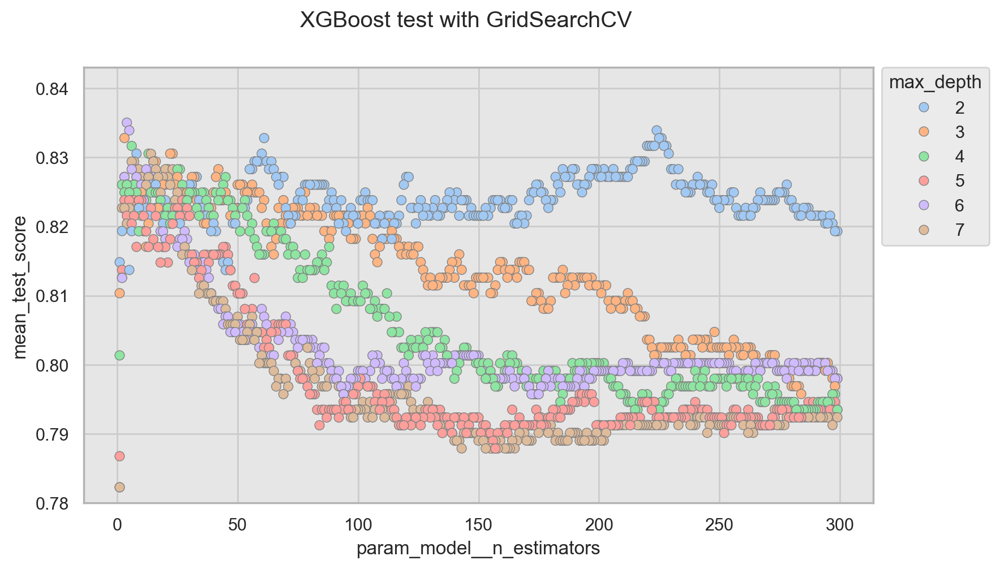

In [147]:
fig, axes = plt.subplots(figsize=(9, 5))
sns.scatterplot(
    data=result_xgb_gscv_2,
    x="param_model__n_estimators",
    y="mean_test_score",
    hue="param_model__max_depth",
    palette="pastel",
    edgecolor=".5",
    ax=axes
)
axes.set(ylim=(0.780, 0.843))
axes.legend(title="max_depth")
# legend를 axes 밖으로 이동
sns.move_legend(axes, "upper left", bbox_to_anchor=(1, 1.02))
fig.suptitle("XGBoost test with GridSearchCV") ;

### GridSearchCV를 사용한 xgb_pipe의 하이퍼 파라미터 튜닝 - (3)
- n_estimators와 max_depth의 범위를 낮춤
- eta는 과적합 방지를 위한 step size의 기능을 한다.
- gamma는 노드 분할시에 사용되는 최소 손실 감소값, gamma가 클 수록 tree 분할 알고리즘은 더 보수적이게 된다. 

In [149]:
%%time
xgb_pipe.set_params(model=xgb.XGBClassifier())
xgb_params = {
    "model__n_estimators": [i for i in range(1, 100)],
    "model__max_depth": [i for i in range(2, 5)],
    "model__eta": [i / 10 for i in range(1, 5)],
    "model__gamma": [i / 10 for i in range(1, 5)],
    "model__tree_method": ["exact", "approx", "hist"]
}

cv = KFold(n_splits=5, shuffle=True, random_state=50)
xgb_gscv_3 = GridSearchCV(estimator=xgb_pipe, param_grid=xgb_params, cv=cv, scoring="accuracy", return_train_score=True, n_jobs=2)
xgb_gscv_3.fit(X, y_enc)

CPU times: total: 7min 17s
Wall time: 2h 10min 8s


GridSearchCV(cv=KFold(n_splits=5, random_state=50, shuffle=True),
             estimator=Pipeline(steps=[('engineering',
                                        Pipeline(steps=[('preprocessor',
                                                         ColumnTransformer(remainder='passthrough',
                                                                           transformers=[('cat_transformer',
                                                                                          OneHotEncoder(),
                                                                                          ['title_name',
                                                                                           'generation',
                                                                                           'Sex',
                                                                                           'Pclass',
                                                                                           'Embarked']),
                                                                                         ('num_transformer',
                                                                                          Pipeline(steps=[('scaler',
                                                                                                           StandardScaler())]),
                                                                                          ['A...
                                                      num_parallel_tree=None,
                                                      random_state=None, ...))]),
             n_jobs=2,
             param_grid={'model__eta': [0.1, 0.2, 0.3, 0.4],
                         'model__gamma': [0.1, 0.2, 0.3, 0.4],
                         'model__max_depth': [2, 3, 4],
                         'model__n_estimators': [1, 2, 3, 4, 5, 6, 7, 8, 9, 10,
                                                 11, 12, 13, 14, 15, 16, 17, 18,
                                                 19, 20, 21, 22, 23, 24, 25, 26,
                                                 27, 28, 29, 30, ...],
                         'model__tree_method': ['exact', 'approx', 'hist']},
             return_train_score=True, scoring='accuracy')

In [150]:
result_xgb_gscv_3 = pd.DataFrame(xgb_gscv_3.cv_results_).sort_values("rank_test_score")
cols = list(result_xgb_gscv_3.filter(regex="^param_model").columns) + ["mean_fit_time", "mean_test_score", "mean_train_score", "std_test_score", "rank_test_score"]
result_xgb_gscv_3[cols][:10].style.applymap(draw_color_cell, color="#ffd700", subset=(result_xgb_gscv_3.index[0]))

,param_model__eta,param_model__gamma,param_model__max_depth,param_model__n_estimators,param_model__tree_method,mean_fit_time,mean_test_score,mean_train_score,std_test_score,rank_test_score
4071,0.200000,0.100000,3,71,exact,0.191401,0.841768,0.916668,0.026333,1
4074,0.200000,0.100000,3,72,exact,0.197600,0.840644,0.916387,0.025907,2
4080,0.200000,0.100000,3,74,exact,0.208201,0.840644,0.917229,0.025907,2
4077,0.200000,0.100000,3,73,exact,0.201399,0.839527,0.917229,0.026590,4
4068,0.200000,0.100000,3,70,exact,0.177002,0.839520,0.915826,0.030190,5
4065,0.200000,0.100000,3,69,exact,0.170600,0.838409,0.915545,0.029651,6
4056,0.200000,0.100000,3,66,exact,0.155602,0.838403,0.912458,0.029480,7
4053,0.200000,0.100000,3,65,exact,0.156202,0.837286,0.911897,0.030207,8
4059,0.200000,0.100000,3,67,exact,0.157401,0.837286,0.912739,0.029143,8
4062,0.200000,0.100000,3,68,exact,0.165200,0.837286,0.913581,0.029143,8


In [166]:
pickle.dump(result_xgb_gscv_3, open("./build_model/result_xgb_gscv_3.pkl", "wb"))

### n_estimators와 tree_method의 변화에 따른 test score 비교

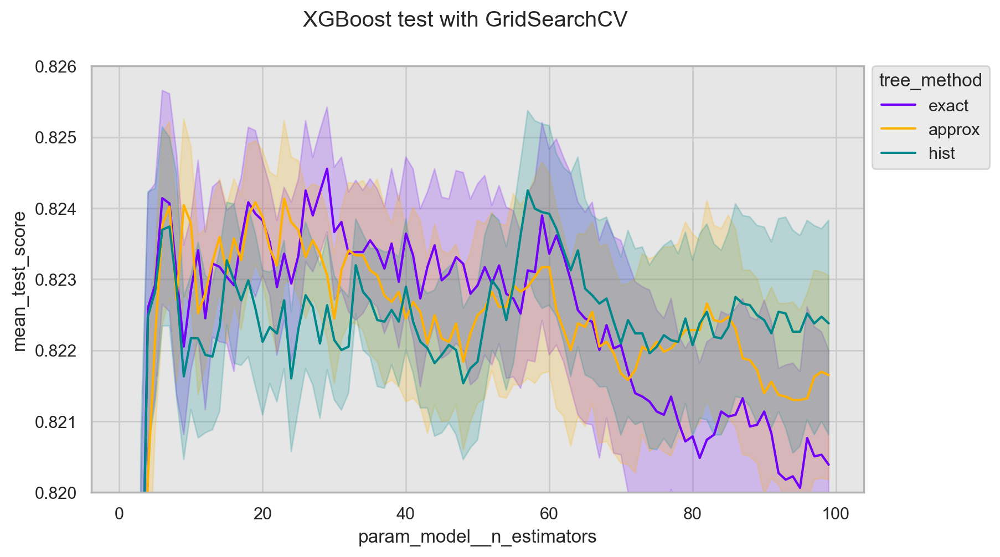

In [48]:
fig, axes = plt.subplots(figsize=(9, 5))
sns.lineplot(
    data=result_xgb_gscv_3,
    x="param_model__n_estimators",
    y="mean_test_score",
    hue="param_model__tree_method",
    palette="prism_r",
    #edgecolor=".6",
    ax=axes
)
axes.set(ylim=(0.820, 0.826))
# legend : title 변경, axes 밖으로 이동
axes.legend(title="tree_method")
sns.move_legend(axes, "upper left", bbox_to_anchor=(1, 1.02))
fig.suptitle("XGBoost test with GridSearchCV") ;

In [32]:
result_xgb_gscv_3 = pickle.load(open("./build_model/result_xgb_gscv_3.pkl", "rb"))
result_xgb_gscv_3.head(2)

,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_model__eta,param_model__gamma,param_model__max_depth,param_model__n_estimators,param_model__tree_method,params,...,mean_test_score,std_test_score,rank_test_score,split0_train_score,split1_train_score,split2_train_score,split3_train_score,split4_train_score,mean_train_score,std_train_score
4071,0.191401,0.009047,0.018799,0.001471,0.2,0.1,3,71,exact,"{'model__eta': 0.2, 'model__gamma': 0.1, 'mode...",...,0.841768,0.026333,1,0.922753,0.911641,0.913043,0.921459,0.914446,0.916668,0.004546
4074,0.197600,0.003878,0.016800,0.001940,0.2,0.1,3,72,exact,"{'model__eta': 0.2, 'model__gamma': 0.1, 'mode...",...,0.840644,0.025907,2,0.921348,0.910238,0.913043,0.921459,0.915849,0.916387,0.004463


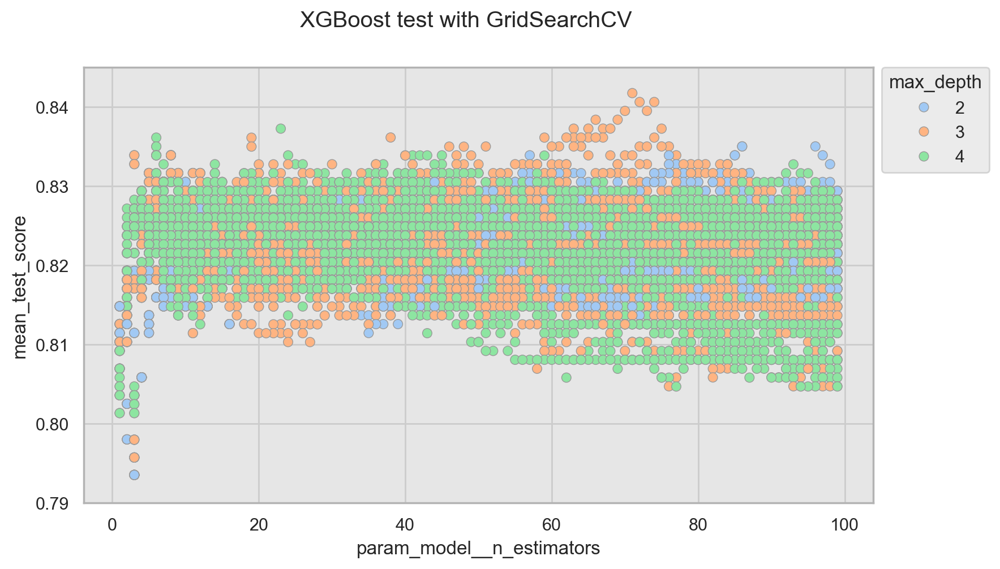

In [38]:
fig, axes = plt.subplots(figsize=(9, 5))
sns.scatterplot(
    data=result_xgb_gscv_3,
    x="param_model__n_estimators",
    y="mean_test_score",
    hue="param_model__max_depth",
    palette="pastel",
    edgecolor=".6",
    ax=axes
)
axes.set(ylim=(0.790, 0.845))
# legend : title 변경, axes 밖으로 이동
axes.legend(title="max_depth")
sns.move_legend(axes, "upper left", bbox_to_anchor=(1, 1.02))
fig.suptitle("XGBoost test with GridSearchCV") ;

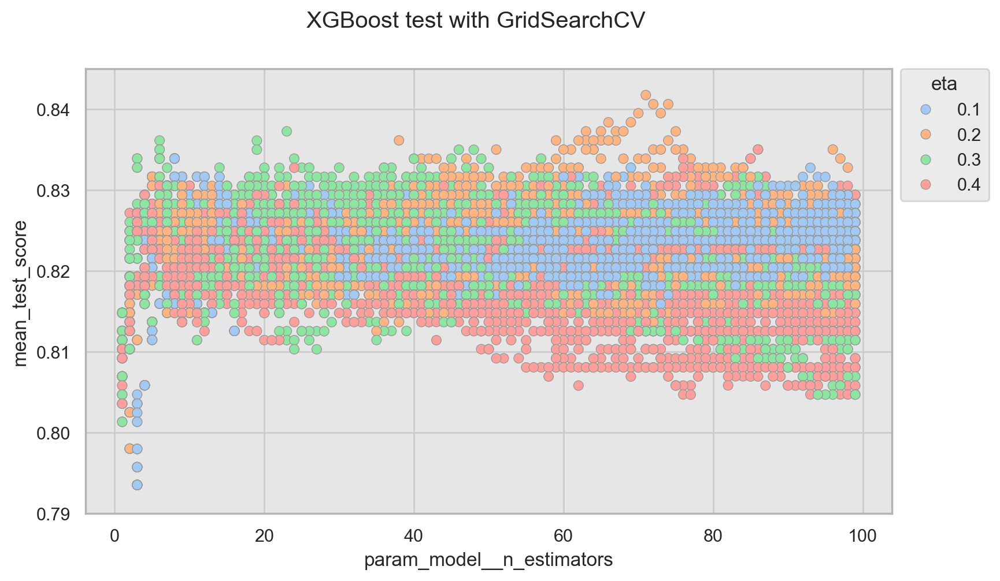

In [42]:
fig, axes = plt.subplots(figsize=(9, 5))
sns.scatterplot(
    data=result_xgb_gscv_3,
    x="param_model__n_estimators",
    y="mean_test_score",
    hue="param_model__eta",
    palette="pastel",
    edgecolor=".6",
    ax=axes
)
axes.set(ylim=(0.790, 0.845))
# legend : title 변경, axes 밖으로 이동
axes.legend(title="eta")
sns.move_legend(axes, "upper left", bbox_to_anchor=(1, 1.02))
fig.suptitle("XGBoost test with GridSearchCV") ;

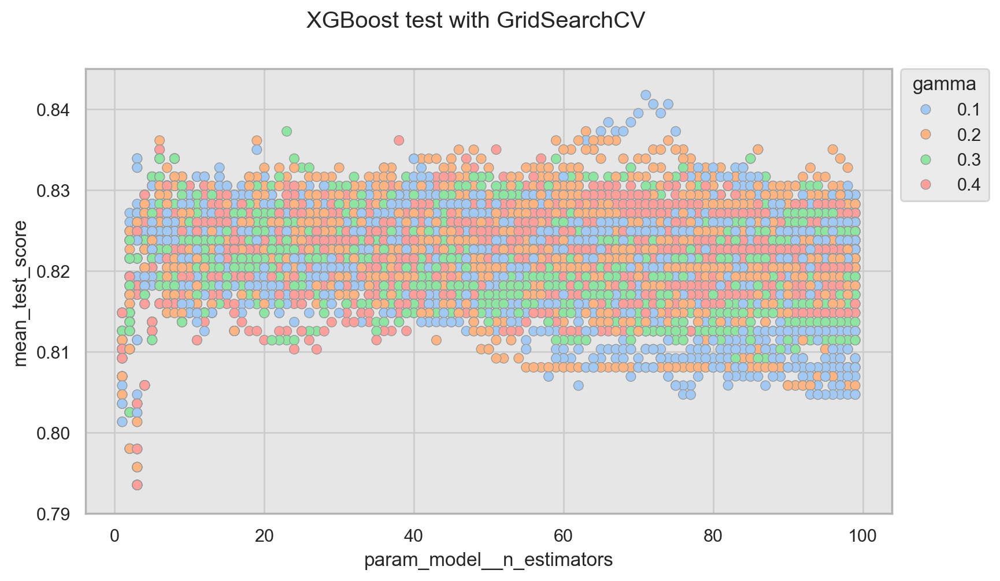

In [43]:
fig, axes = plt.subplots(figsize=(9, 5))
sns.scatterplot(
    data=result_xgb_gscv_3,
    x="param_model__n_estimators",
    y="mean_test_score",
    hue="param_model__gamma",
    palette="pastel",
    edgecolor=".6",
    ax=axes
)
axes.set(ylim=(0.790, 0.845))
# legend : title 변경, axes 밖으로 이동
axes.legend(title="gamma")
sns.move_legend(axes, "upper left", bbox_to_anchor=(1, 1.02))
fig.suptitle("XGBoost test with GridSearchCV") ;

In [157]:
xgb_gscv_1_best = pd.DataFrame(xgb_gscv_1.best_params_, index=[0]).assign(model="xgb_gscv_1", test_score=xgb_gscv_1.best_score_)
xgb_gscv_2_best = pd.DataFrame(xgb_gscv_2.best_params_, index=[0]).assign(model="xgb_gscv_2", test_score=xgb_gscv_2.best_score_)
xgb_gscv_3_best = pd.DataFrame(xgb_gscv_3.best_params_, index=[0]).assign(model="xgb_gscv_3", test_score=xgb_gscv_3.best_score_)
xgb_gscv_best_compare = pd.concat([xgb_gscv_1_best, xgb_gscv_2_best, xgb_gscv_3_best], axis=0).reset_index(drop=True)
xgb_gscv_best_compare\
    .fillna(0)\
    .sort_values("test_score", ascending=False)\
    .reset_index(drop=True)\
    .style.applymap(draw_color_cell, color="#ffd700", subset=(xgb_gscv_best_compare.index[0]))

,model__max_depth,model__n_estimators,model__tree_method,model,test_score,model__eta,model__gamma
0,3,71,exact,xgb_gscv_3,0.841768,0.200000,0.100000
1,6,4,hist,xgb_gscv_2,0.835026,0.000000,0.000000
2,3,3,hist,xgb_gscv_1,0.832798,0.000000,0.000000


### GridSearchCV로 실험한 XGBoost 모델 중 best 모델을 사용하여 cv 테스트
- **XGBoost의 best 모델이 test score 0.83의 벽을 넘어 0.84에 도달함**

In [158]:
%%time

xgb_gscv_best_model = xgb_gscv_3.best_estimator_
xgb_gscv_best_metrics, xgb_gscv_best_accs = get_cv_result(X, y_enc, [xgb_gscv_best_model], ["XGB_gscv_best"])

CPU times: total: 15.1 s
Wall time: 1.49 s


In [159]:
xgb_gscv_best_df = pd.concat([xgb_gscv_best_metrics, pd.DataFrame(xgb_gscv_best_accs[0][1], columns=["XGB_gscv_best"]).T], axis=1)
xgb_gscv_best_df["std"] = xgb_gscv_best_df[[0, 1, 2, 3, 4]].std(axis=1)
xgb_gscv_best_df = xgb_gscv_best_df.reset_index().rename(columns={"index": "model"}).assign(train_type="XGB")
xgb_gscv_best_df

,model,train_score,test_score,pre_score,recall_score,f1_score,0,1,2,3,4,std,train_type
0,XGB_gscv_best,0.916668,0.841768,0.829932,0.747425,0.784176,0.826816,0.853933,0.859551,0.797753,0.870787,0.029441,XGB


### 전체 모델링 리스트에 추가 및 모델 저장
- total_compare_df : 개별 모델 top 10 + Voting 모델 top 10 + RandomForest 모델 best 1 + ExtraTrees 모델 best 1 + AdaBoost 모델 best 1 + XGBoost 모델 best 1

In [162]:
total_compare_df = pd.concat([total_compare_df, xgb_gscv_best_df], axis=0).sort_values("test_score", ascending=False)
total_compare_df = total_compare_df.reset_index(drop=True)
total_compare_df

,model,train_score,test_score,pre_score,recall_score,f1_score,0,1,2,3,4,std,train_type,comb
0,XGB_gscv_best,0.916668,0.841768,0.829932,0.747425,0.784176,0.826816,0.853933,0.859551,0.797753,0.870787,0.029441,XGB,NaN
1,MultiLP_gscv_best +\n LinearDA_gscv_best +\n L...,0.845959,0.838378,0.815293,0.723894,0.764736,0.843575,0.859551,0.853933,0.780899,0.853933,0.032646,hard,"(2, 5, 8)"
2,SupportVC_gscv_best +\n LogisticR_gscv_best +\...,0.841191,0.837298,0.833453,0.714597,0.768936,0.804469,0.859551,0.876404,0.775281,0.870787,0.044916,hard,"(0, 1, 6, 9)"
3,SupportVC_gscv_best +\n DecisionT_gscv_best +\...,0.838104,0.837280,0.817959,0.731745,0.771934,0.821229,0.865169,0.859551,0.775281,0.865169,0.039221,hard,"(0, 6, 9)"
4,SupportVC_gscv_best +\n MultiLP_gscv_best +\n ...,0.850730,0.836168,0.827785,0.698618,0.757384,0.810056,0.859551,0.870787,0.792135,0.848315,0.033591,hard,"(0, 2, 6, 8)"
5,SupportVC_gscv_best +\n SupportVC_pipe +\n Dec...,0.852413,0.836162,0.835943,0.718505,0.771723,0.815642,0.859551,0.870787,0.769663,0.865169,0.043100,soft,"(0, 3, 6, 8)"
6,RandomF_gscv_best,0.870933,0.836162,0.836357,0.706492,0.764413,0.815642,0.859551,0.859551,0.780899,0.865169,0.036778,RF,NaN
7,SupportVC_gscv_best +\n SupportVC_pipe_cv +\n ...,0.855219,0.836156,0.824567,0.718167,0.766525,0.821229,0.870787,0.870787,0.769663,0.848315,0.042398,soft,"(0, 4, 6, 8)"
8,SupportVC_gscv_best +\n SupportVC_pipe_cv +\n ...,0.842875,0.835051,0.830033,0.722961,0.772474,0.804469,0.859551,0.865169,0.775281,0.870787,0.042697,hard,"(0, 4, 6, 9)"
9,SupportVC_gscv_best +\n SupportVC_pipe +\n Dec...,0.843155,0.835045,0.830483,0.711656,0.766016,0.810056,0.848315,0.870787,0.775281,0.870787,0.041615,hard,"(0, 3, 6, 9)"


In [163]:
dir_path = "./build_model"

save_model(dir_path, xgb_gscv_best_model, "XGB_gscv_best")

XGB_gscv_best save success.


In [164]:
pickle.dump(total_compare_df, open("./build_model/total_comapre_df", "wb"))